<img src='images/netflix-q.jpg'>

<h1>1. Business Problem </h1>

<h2> 1.1 Problem Description </h2>

<p>
Netflix is all about connecting people to the movies they love. To help customers find those movies, they developed world-class movie recommendation system: CinematchSM. Its job is to predict whether someone will enjoy a movie based on how much they liked or disliked other movies. Netflix use those predictions to make personal movie recommendations based on each customer’s unique tastes. And while <b>Cinematch</b> is doing pretty well, it can always be made better.
</p>
<p>Now there are a lot of interesting alternative approaches to how Cinematch works that netflix haven’t tried. Some are described in the literature, some aren’t. We’re curious whether any of these can beat Cinematch by making better predictions. Because, frankly, if there is a much better approach it could make a big difference to our customers and our business.</p>
<p> Credits: https://www.netflixprize.com/rules.html </p>

<h2> 1.2 Problem Statement </h2>

<p>
Netflix provided a lot of anonymous rating data, and a prediction accuracy bar that is 10% better than what Cinematch can do on the same training data set. (Accuracy is a measurement of how closely predicted ratings of movies match subsequent actual ratings.) 
</p>

<h2> 1.3 Sources </h2>

<ul>
<li> https://www.netflixprize.com/rules.html</li>
<li> https://www.kaggle.com/netflix-inc/netflix-prize-data</li>
<li> Netflix blog: https://medium.com/netflix-techblog/netflix-recommendations-beyond-the-5-stars-part-1-55838468f429 (very nice blog)</li>
<li>surprise library: http://surpriselib.com/ (we use many models from this library)</li>
<li>surprise library doc: http://surprise.readthedocs.io/en/stable/getting_started.html (we use many models from this library)</li>
<li>installing surprise: https://github.com/NicolasHug/Surprise#installation </li>
<li> Research paper: http://courses.ischool.berkeley.edu/i290-dm/s11/SECURE/a1-koren.pdf (most of our work was inspired by this paper)</li>
<li> SVD Decomposition : https://www.youtube.com/watch?v=P5mlg91as1c </li>
</ul>

<h2>1.4 Real world/Business Objectives and constraints  </h2>

Objectives:
1. Predict the rating that a user would give to a movie that he has not yet rated.
2. Minimize the difference between predicted and actual rating (RMSE and MAPE)
<br>

Constraints:
1. Some form of interpretability.

<h1> 2. Machine Learning Problem </h1>

<h2>2.1 Data </h2>

<h3> 2.1.1 Data Overview </h3>

<p> Get the data from : https://www.kaggle.com/netflix-inc/netflix-prize-data/data </p>
<p> Data files : 
<ul> 
<li> combined_data_1.txt </li>
<li> combined_data_2.txt </li>
<li> combined_data_3.txt </li>
<li> combined_data_4.txt </li>
<li> movie_titles.csv </li>
</ul>
<pre>  
The first line of each file [combined_data_1.txt, combined_data_2.txt, combined_data_3.txt, combined_data_4.txt] contains the movie id followed by a colon. Each subsequent line in the file corresponds to a rating from a customer and its date in the following format:

CustomerID,Rating,Date

MovieIDs range from 1 to 17770 sequentially.
CustomerIDs range from 1 to 2649429, with gaps. There are 480189 users.
Ratings are on a five star (integral) scale from 1 to 5.
Dates have the format YYYY-MM-DD.
</pre>

<h3> 2.1.2 Example Data point </h3>

<pre>
1:
1488844,3,2005-09-06
822109,5,2005-05-13
885013,4,2005-10-19
30878,4,2005-12-26
823519,3,2004-05-03
893988,3,2005-11-17
124105,4,2004-08-05
1248029,3,2004-04-22
1842128,4,2004-05-09
2238063,3,2005-05-11
1503895,4,2005-05-19
2207774,5,2005-06-06
2590061,3,2004-08-12
2442,3,2004-04-14
543865,4,2004-05-28
1209119,4,2004-03-23
804919,4,2004-06-10
1086807,3,2004-12-28
1711859,4,2005-05-08
372233,5,2005-11-23
1080361,3,2005-03-28
1245640,3,2005-12-19
558634,4,2004-12-14
2165002,4,2004-04-06
1181550,3,2004-02-01
1227322,4,2004-02-06
427928,4,2004-02-26
814701,5,2005-09-29
808731,4,2005-10-31
662870,5,2005-08-24
337541,5,2005-03-23
786312,3,2004-11-16
1133214,4,2004-03-07
1537427,4,2004-03-29
1209954,5,2005-05-09
2381599,3,2005-09-12
525356,2,2004-07-11
1910569,4,2004-04-12
2263586,4,2004-08-20
2421815,2,2004-02-26
1009622,1,2005-01-19
1481961,2,2005-05-24
401047,4,2005-06-03
2179073,3,2004-08-29
1434636,3,2004-05-01
93986,5,2005-10-06
1308744,5,2005-10-29
2647871,4,2005-12-30
1905581,5,2005-08-16
2508819,3,2004-05-18
1578279,1,2005-05-19
1159695,4,2005-02-15
2588432,3,2005-03-31
2423091,3,2005-09-12
470232,4,2004-04-08
2148699,2,2004-06-05
1342007,3,2004-07-16
466135,4,2004-07-13
2472440,3,2005-08-13
1283744,3,2004-04-17
1927580,4,2004-11-08
716874,5,2005-05-06
4326,4,2005-10-29
</pre>

<h2>2.2 Mapping the real world problem to a Machine Learning Problem </h2>

<h3> 2.2.1 Type of Machine Learning Problem </h3>

<pre>
For a given movie and user we need to predict the rating would be given by him/her to the movie. 
The given problem is a Recommendation problem 
It can also seen as a Regression problem 
</pre>

<h3> 2.2.2 Performance metric </h3>

<ul>
<li> Mean Absolute Percentage Error: https://en.wikipedia.org/wiki/Mean_absolute_percentage_error </li>
<li> Root Mean Square Error: https://en.wikipedia.org/wiki/Root-mean-square_deviation </li>
</ul>


<h3> 2.2.3 Machine Learning Objective and Constraints </h3>

1. Minimize RMSE.
2. Try to provide some interpretability.

In [1]:
# this is just to know how much time will it take to run this entire ipython notebook 
from datetime import datetime
# globalstart = datetime.now()
import pandas as pd
import numpy as np
import matplotlib
matplotlib.use('nbagg')

import matplotlib.pyplot as plt
plt.rcParams.update({'figure.max_open_warning': 0})

import seaborn as sns
sns.set_style('whitegrid')
import os
from scipy import sparse
from scipy.sparse import csr_matrix

from sklearn.decomposition import TruncatedSVD
from sklearn.metrics.pairwise import cosine_similarity
import random

<h1> 3. Exploratory Data Analysis </h1>

<h2> 3.1 Preprocessing</h2> 

<h3>3.1.1 Converting / Merging whole data to required format: u_i, m_j, r_ij</h3>

In [9]:
start = datetime.now()
if not os.path.isfile('data.csv'):
    # Create a file 'data.csv' before reading it
    # Read all the files in netflix and store them in one big file('data.csv')
    # We re reading from each of the four files and appendig each rating to a global file 'train.csv'
    data = open('data.csv', mode='w')
    
    row = list()
    files=['data_folder/combined_data_1.txt','data_folder/combined_data_2.txt', 
           'data_folder/combined_data_3.txt', 'data_folder/combined_data_4.txt']
    for file in files:
        print("Reading ratings from {}...".format(file))
        with open(file) as f:
            for line in f: 
                del row[:] # you don't have to do this.
                line = line.strip()
                if line.endswith(':'):
                    # All below are ratings for this movie, until another movie appears.
                    movie_id = line.replace(':', '')
                else:
                    row = [x for x in line.split(',')]
                    row.insert(0, movie_id)
                    data.write(','.join(row))
                    data.write('\n')
        print("Done.\n")
    data.close()
print('Time taken :', datetime.now() - start)

Reading ratings from data_folder/combined_data_1.txt...
Done.

Reading ratings from data_folder/combined_data_2.txt...
Done.

Reading ratings from data_folder/combined_data_3.txt...
Done.

Reading ratings from data_folder/combined_data_4.txt...
Done.

Time taken : 0:05:25.016457


In [10]:
print("creating the dataframe from data.csv file..")
df = pd.read_csv('data.csv', sep=',', 
                       names=['movie', 'user','rating','date'])
df.date = pd.to_datetime(df.date)
print('Done.\n')

# we are arranging the ratings according to time.
print('Sorting the dataframe by date..')
df.sort_values(by='date', inplace=True)
print('Done..')

creating the dataframe from data.csv file..
Done.

Sorting the dataframe by date..
Done..


In [11]:
df.head()

,movie,user,rating,date
56431994,10341,510180,4,1999-11-11
9056171,1798,510180,5,1999-11-11
58698779,10774,510180,3,1999-11-11
48101611,8651,510180,2,1999-11-11
81893208,14660,510180,2,1999-11-11


In [12]:
df.describe()['rating']

count    1.004805e+08
mean     3.604290e+00
std      1.085219e+00
min      1.000000e+00
25%      3.000000e+00
50%      4.000000e+00
75%      4.000000e+00
max      5.000000e+00
Name: rating, dtype: float64

<h3>3.1.2 Checking for NaN values </h3>

In [13]:
# just to make sure that all Nan containing rows are deleted..
print("No of Nan values in our dataframe : ", sum(df.isnull().any()))

No of Nan values in our dataframe :  0


<h3>3.1.3 Removing Duplicates </h3>

In [14]:
dup_bool = df.duplicated(['movie','user','rating'])
dups = sum(dup_bool) # by considering all columns..( including timestamp)
print("There are {} duplicate rating entries in the data..".format(dups))

There are 0 duplicate rating entries in the data..


 <h3>3.1.4 Basic Statistics (#Ratings, #Users, and #Movies)</h3>

In [15]:
print("Total data ")
print("-"*50)
print("\nTotal no of ratings :",df.shape[0])
print("Total No of Users   :", len(np.unique(df.user)))
print("Total No of movies  :", len(np.unique(df.movie)))

Total data 
--------------------------------------------------

Total no of ratings : 100480507
Total No of Users   : 480189
Total No of movies  : 17770


<h2>3.2 Spliting data into Train and Test(80:20) </h2>

In [0]:
if not os.path.isfile('train.csv'):
    # create the dataframe and store it in the disk for offline purposes..
    df.iloc[:int(df.shape[0]*0.80)].to_csv("train.csv", index=False)

if not os.path.isfile('test.csv'):
    # create the dataframe and store it in the disk for offline purposes..
    df.iloc[int(df.shape[0]*0.80):].to_csv("test.csv", index=False)

train_df = pd.read_csv("train.csv", parse_dates=['date'])
test_df = pd.read_csv("test.csv")

<h3>3.2.1 Basic Statistics in Train data (#Ratings, #Users, and #Movies)</h3>

In [0]:
# movies = train_df.movie.value_counts()
# users = train_df.user.value_counts()
print("Training data ")
print("-"*50)
print("\nTotal no of ratings :",train_df.shape[0])
print("Total No of Users   :", len(np.unique(train_df.user)))
print("Total No of movies  :", len(np.unique(train_df.movie)))

Training data 
--------------------------------------------------

Total no of ratings : 80384405
Total No of Users   : 405041
Total No of movies  : 17424


<h3>3.2.2 Basic Statistics in Test data (#Ratings, #Users, and #Movies)</h3>

In [0]:
print("Test data ")
print("-"*50)
print("\nTotal no of ratings :",test_df.shape[0])
print("Total No of Users   :", len(np.unique(test_df.user)))
print("Total No of movies  :", len(np.unique(test_df.movie)))

Test data 
--------------------------------------------------

Total no of ratings : 20096102
Total No of Users   : 349312
Total No of movies  : 17757


 <h2> 3.3 Exploratory Data Analysis on Train data </h2>

In [0]:
# method to make y-axis more readable
def human(num, units = 'M'):
    units = units.lower()
    num = float(num)
    if units == 'k':
        return str(num/10**3) + " K"
    elif units == 'm':
        return str(num/10**6) + " M"
    elif units == 'b':
        return str(num/10**9) +  " B"

<h3> 3.3.1 Distribution of ratings </h3>

<IPython.core.display.Javascript object>


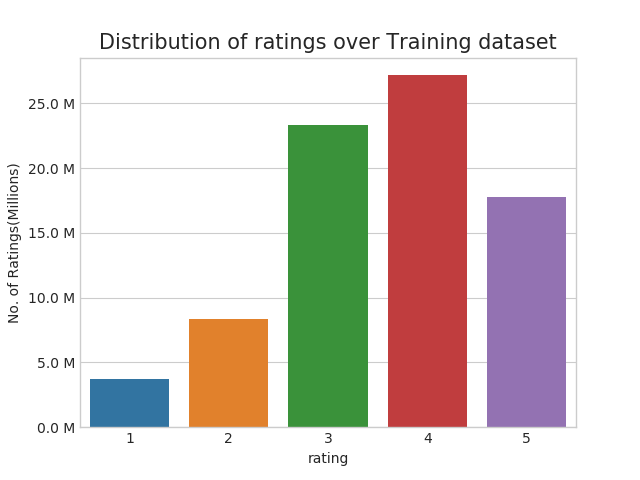

In [0]:
fig, ax = plt.subplots()
plt.title('Distribution of ratings over Training dataset', fontsize=15)
sns.countplot(train_df.rating)
ax.set_yticklabels([human(item, 'M') for item in ax.get_yticks()])
ax.set_ylabel('No. of Ratings(Millions)')

plt.show()

<p style="font-size:13px"> <b>Add new column (week day) to the data set  for analysis.</b></p>

In [0]:
# It is used to skip the warning ''SettingWithCopyWarning''.. 
pd.options.mode.chained_assignment = None  # default='warn'

train_df['day_of_week'] = train_df.date.dt.weekday_name

train_df.tail()

,movie,user,rating,date,day_of_week
80384400,12074,2033618,4,2005-08-08,Monday
80384401,862,1797061,3,2005-08-08,Monday
80384402,10986,1498715,5,2005-08-08,Monday
80384403,14861,500016,4,2005-08-08,Monday
80384404,5926,1044015,5,2005-08-08,Monday


<h3> 3.3.2 Number of Ratings per a month </h3>

<IPython.core.display.Javascript object>


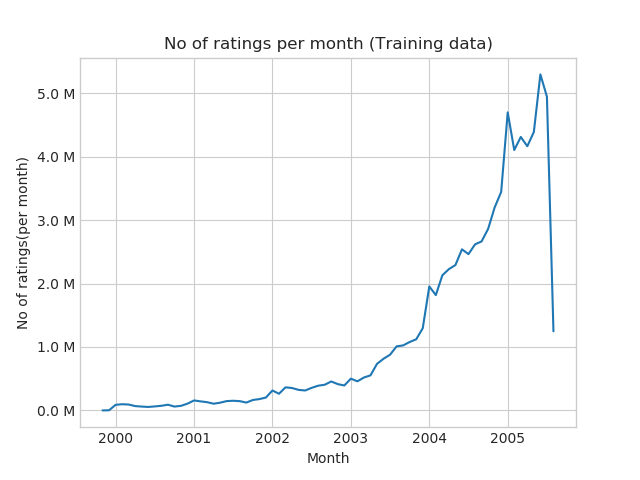

In [0]:
ax = train_df.resample('m', on='date')['rating'].count().plot()
ax.set_title('No of ratings per month (Training data)')
plt.xlabel('Month')
plt.ylabel('No of ratings(per month)')
ax.set_yticklabels([human(item, 'M') for item in ax.get_yticks()])
plt.show()

<h3> 3.3.3 Analysis on the Ratings given by user </h3>

In [0]:
no_of_rated_movies_per_user = train_df.groupby(by='user')['rating'].count().sort_values(ascending=False)

no_of_rated_movies_per_user.head()

user
305344     17112
2439493    15896
387418     15402
1639792     9767
1461435     9447
Name: rating, dtype: int64

<IPython.core.display.Javascript object>


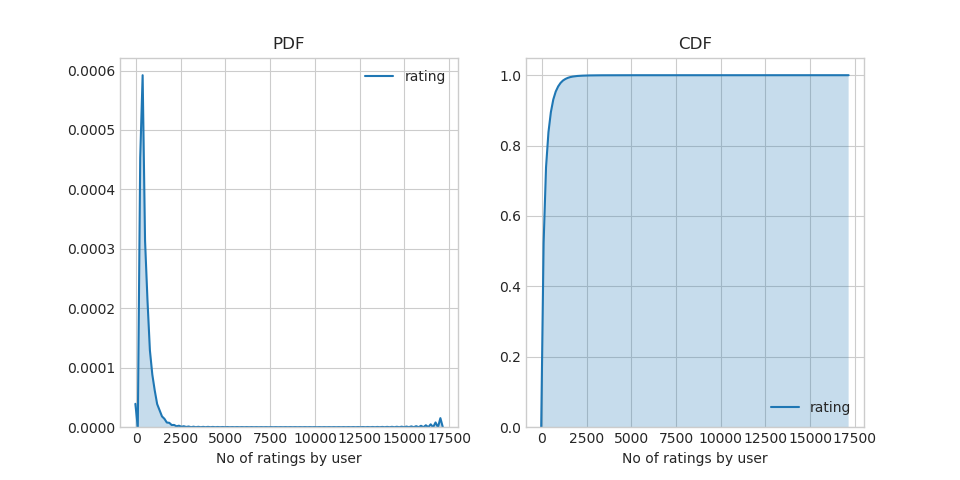

In [0]:
fig = plt.figure(figsize=plt.figaspect(.5))

ax1 = plt.subplot(121)
sns.kdeplot(no_of_rated_movies_per_user, shade=True, ax=ax1)
plt.xlabel('No of ratings by user')
plt.title("PDF")

ax2 = plt.subplot(122)
sns.kdeplot(no_of_rated_movies_per_user, shade=True, cumulative=True,ax=ax2)
plt.xlabel('No of ratings by user')
plt.title('CDF')

plt.show()

In [0]:
no_of_rated_movies_per_user.describe()

count    405041.000000
mean        198.459921
std         290.793238
min           1.000000
25%          34.000000
50%          89.000000
75%         245.000000
max       17112.000000
Name: rating, dtype: float64

> _There,  is something interesting going on with the quantiles.._

In [0]:
quantiles = no_of_rated_movies_per_user.quantile(np.arange(0,1.01,0.01), interpolation='higher')

<IPython.core.display.Javascript object>


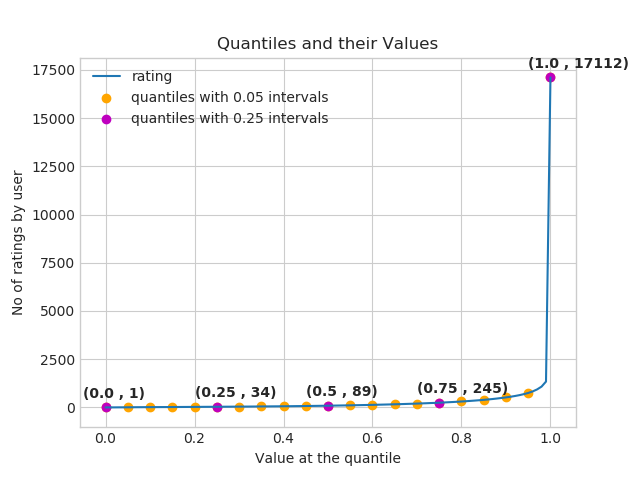

In [0]:
plt.title("Quantiles and their Values")
quantiles.plot()
# quantiles with 0.05 difference
plt.scatter(x=quantiles.index[::5], y=quantiles.values[::5], c='orange', label="quantiles with 0.05 intervals")
# quantiles with 0.25 difference
plt.scatter(x=quantiles.index[::25], y=quantiles.values[::25], c='m', label = "quantiles with 0.25 intervals")
plt.ylabel('No of ratings by user')
plt.xlabel('Value at the quantile')
plt.legend(loc='best')

# annotate the 25th, 50th, 75th and 100th percentile values....
for x,y in zip(quantiles.index[::25], quantiles[::25]):
    plt.annotate(s="({} , {})".format(x,y), xy=(x,y), xytext=(x-0.05, y+500)
                ,fontweight='bold')


plt.show()

In [0]:
quantiles[::5]

0.00        1
0.05        7
0.10       15
0.15       21
0.20       27
0.25       34
0.30       41
0.35       50
0.40       60
0.45       73
0.50       89
0.55      109
0.60      133
0.65      163
0.70      199
0.75      245
0.80      307
0.85      392
0.90      520
0.95      749
1.00    17112
Name: rating, dtype: int64

__how many ratings at the last 5% of all ratings__??

In [0]:
print('\n No of ratings at last 5 percentile : {}\n'.format(sum(no_of_rated_movies_per_user>= 749)) )


 No of ratings at last 5 percentile : 20305



<h3> 3.3.4 Analysis of ratings of a movie given by a user </h3>

<IPython.core.display.Javascript object>


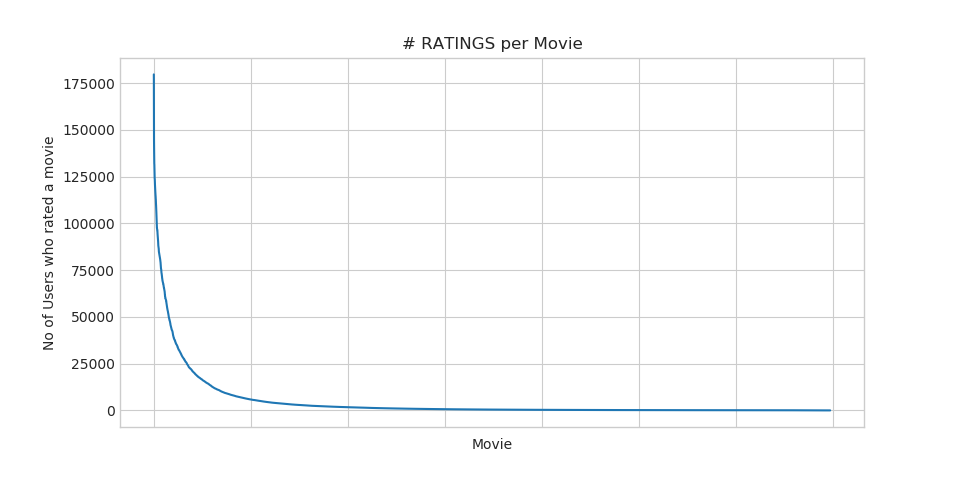

In [0]:
no_of_ratings_per_movie = train_df.groupby(by='movie')['rating'].count().sort_values(ascending=False)

fig = plt.figure(figsize=plt.figaspect(.5))
ax = plt.gca()
plt.plot(no_of_ratings_per_movie.values)
plt.title('# RATINGS per Movie')
plt.xlabel('Movie')
plt.ylabel('No of Users who rated a movie')
ax.set_xticklabels([])

plt.show()

- __It is very skewed.. just like nunmber of ratings given per user.__
    
    
    - There are some movies (which are very popular) which are rated by huge number of users.
    
    - But most of the movies(like 90%) got some hundereds of ratings.

<h3> 3.3.5 Number of ratings on each day of the week</h3>

<IPython.core.display.Javascript object>


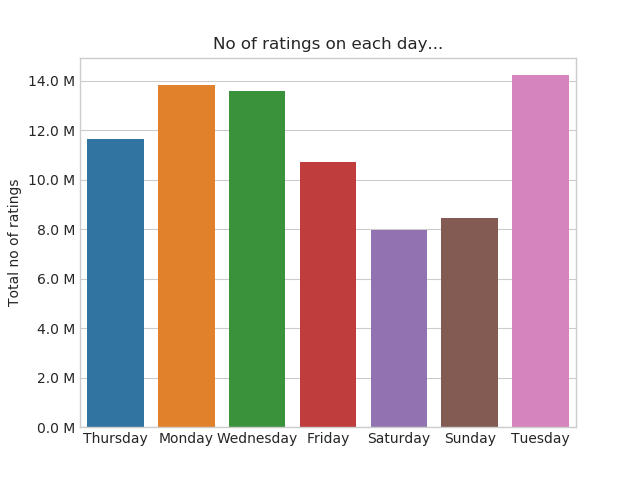

In [0]:
fig, ax = plt.subplots()
sns.countplot(x='day_of_week', data=train_df, ax=ax)
plt.title('No of ratings on each day...')
plt.ylabel('Total no of ratings')
plt.xlabel('')
ax.set_yticklabels([human(item, 'M') for item in ax.get_yticks()])
plt.show()

<IPython.core.display.Javascript object>


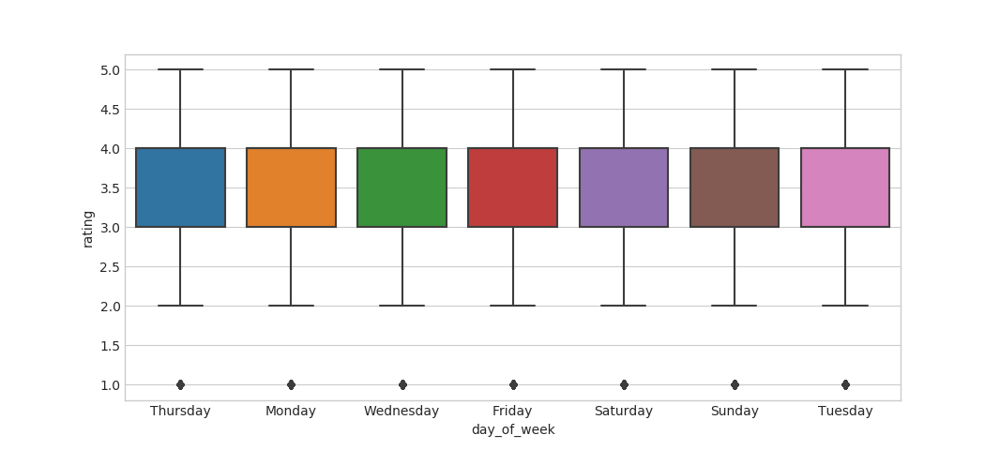

0:01:10.003761


In [0]:
start = datetime.now()
fig = plt.figure(figsize=plt.figaspect(.45))
sns.boxplot(y='rating', x='day_of_week', data=train_df)
plt.show()
print(datetime.now() - start)

In [0]:
avg_week_df = train_df.groupby(by=['day_of_week'])['rating'].mean()
print(" AVerage ratings")
print("-"*30)
print(avg_week_df)
print("\n")

 AVerage ratings
------------------------------
day_of_week
Friday       3.585274
Monday       3.577250
Saturday     3.591791
Sunday       3.594144
Thursday     3.582463
Tuesday      3.574438
Wednesday    3.583751
Name: rating, dtype: float64




<h3> 3.3.6 Creating sparse matrix from data frame </h3>

<table>
<tr>
<td>
<img src='images/data_c.jpg' width='250px' align=left/>
</td>
<td>
<img src='images/arrow.jpg' width='60px' align=left/>
</td>
<td>
<img src='images/data_sparse_c.jpg' width='400px' align=left/>
</td>
</tr>
</table>

<h4> 3.3.6.1 Creating sparse matrix from train data frame </h4>

In [2]:
start = datetime.now()
if os.path.isfile('train_sparse_matrix.npz'):
    print("It is present in your pwd, getting it from disk....")
    # just get it from the disk instead of computing it
    train_sparse_matrix = sparse.load_npz('train_sparse_matrix.npz')
    print("DONE..")
else: 
    print("We are creating sparse_matrix from the dataframe..")
    # create sparse_matrix and store it for after usage.
    # csr_matrix(data_values, (row_index, col_index), shape_of_matrix)
    # It should be in such a way that, MATRIX[row, col] = data
    train_sparse_matrix = sparse.csr_matrix((train_df.rating.values, (train_df.user.values,
                                               train_df.movie.values)),)
    
    print('Done. It\'s shape is : (user, movie) : ',train_sparse_matrix.shape)
    print('Saving it into disk for furthur usage..')
    # save it into disk
    sparse.save_npz("train_sparse_matrix.npz", train_sparse_matrix)
    print('Done..\n')

print(datetime.now() - start)

It is present in your pwd, getting it from disk....
DONE..
0:00:03.482947


<p><b>The Sparsity of Train Sparse Matrix</b></p>

In [3]:
us,mv = train_sparse_matrix.shape
elem = train_sparse_matrix.count_nonzero()

print("Sparsity Of Train matrix : {} % ".format(  (1-(elem/(us*mv))) * 100) )

Sparsity Of Train matrix : 99.8292709259195 % 


<h4> 3.3.6.2 Creating sparse matrix from test data frame </h4>

In [4]:
start = datetime.now()
if os.path.isfile('test_sparse_matrix.npz'):
    print("It is present in your pwd, getting it from disk....")
    # just get it from the disk instead of computing it
    test_sparse_matrix = sparse.load_npz('test_sparse_matrix.npz')
    print("DONE..")
else: 
    print("We are creating sparse_matrix from the dataframe..")
    # create sparse_matrix and store it for after usage.
    # csr_matrix(data_values, (row_index, col_index), shape_of_matrix)
    # It should be in such a way that, MATRIX[row, col] = data
    test_sparse_matrix = sparse.csr_matrix((test_df.rating.values, (test_df.user.values,
                                               test_df.movie.values)))
    
    print('Done. It\'s shape is : (user, movie) : ',test_sparse_matrix.shape)
    print('Saving it into disk for furthur usage..')
    # save it into disk
    sparse.save_npz("test_sparse_matrix.npz", test_sparse_matrix)
    print('Done..\n')
    
print(datetime.now() - start)

It is present in your pwd, getting it from disk....
DONE..
0:00:01.054501


<p><b>The Sparsity of Test data Matrix</b></p>

In [5]:
us,mv = test_sparse_matrix.shape
elem = test_sparse_matrix.count_nonzero()

print("Sparsity Of Test matrix : {} % ".format(  (1-(elem/(us*mv))) * 100) )

Sparsity Of Test matrix : 99.95731772988694 % 


<h3>3.3.7 Finding Global average of all movie ratings, Average rating per user, and Average rating per movie</h3>

In [6]:
# get the user averages in dictionary (key: user_id/movie_id, value: avg rating)

def get_average_ratings(sparse_matrix, of_users):
    
    # average ratings of user/axes
    ax = 1 if of_users else 0 # 1 - User axes,0 - Movie axes

    # ".A1" is for converting Column_Matrix to 1-D numpy array 
    sum_of_ratings = sparse_matrix.sum(axis=ax).A1
    # Boolean matrix of ratings ( whether a user rated that movie or not)
    is_rated = sparse_matrix!=0
    # no of ratings that each user OR movie..
    no_of_ratings = is_rated.sum(axis=ax).A1
    
    # max_user  and max_movie ids in sparse matrix 
    u,m = sparse_matrix.shape
    # creae a dictonary of users and their average ratigns..
    average_ratings = { i : sum_of_ratings[i]/no_of_ratings[i]
                                 for i in range(u if of_users else m) 
                                    if no_of_ratings[i] !=0}

    # return that dictionary of average ratings
    return average_ratings

<h4> 3.3.7.1 finding global average of all movie ratings </h4>

In [7]:
train_averages = dict()
# get the global average of ratings in our train set.
train_global_average = train_sparse_matrix.sum()/train_sparse_matrix.count_nonzero()
train_averages['global'] = train_global_average
train_averages

{'global': 3.582890686321557}

<h4> 3.3.7.2 finding average rating per user</h4>

In [8]:
train_averages['user'] = get_average_ratings(train_sparse_matrix, of_users=True)
print('\nAverage rating of user 10 :',train_averages['user'][10])


Average rating of user 10 : 3.3781094527363185


<h4> 3.3.7.3 finding average rating per movie</h4>

In [9]:
train_averages['movie'] =  get_average_ratings(train_sparse_matrix, of_users=False)
print('\n AVerage rating of movie 15 :',train_averages['movie'][15])


 AVerage rating of movie 15 : 3.3038461538461537


<h4> 3.3.7.4 PDF's & CDF's of Avg.Ratings of Users & Movies (In Train Data)</h4>

<IPython.core.display.Javascript object>


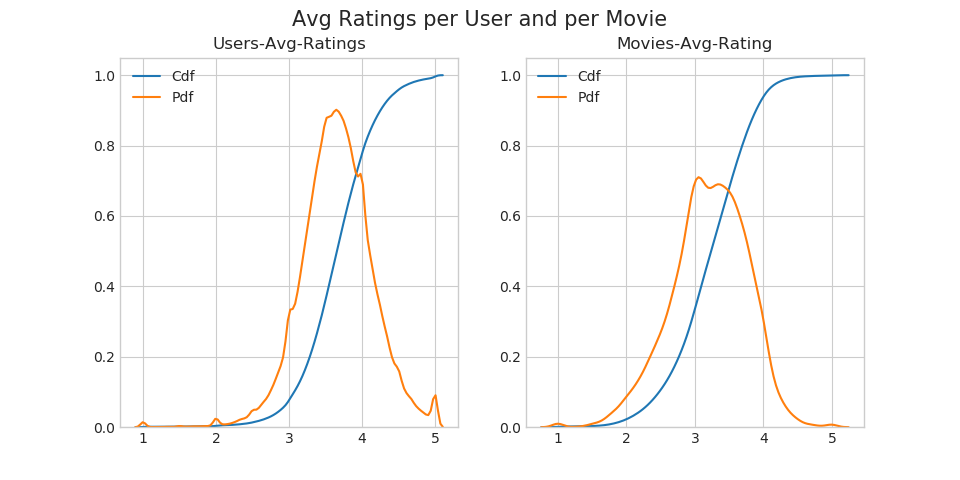

0:00:35.003443


In [0]:
start = datetime.now()
# draw pdfs for average rating per user and average
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=plt.figaspect(.5))
fig.suptitle('Avg Ratings per User and per Movie', fontsize=15)

ax1.set_title('Users-Avg-Ratings')
# get the list of average user ratings from the averages dictionary..
user_averages = [rat for rat in train_averages['user'].values()]
sns.distplot(user_averages, ax=ax1, hist=False, 
             kde_kws=dict(cumulative=True), label='Cdf')
sns.distplot(user_averages, ax=ax1, hist=False,label='Pdf')

ax2.set_title('Movies-Avg-Rating')
# get the list of movie_average_ratings from the dictionary..
movie_averages = [rat for rat in train_averages['movie'].values()]
sns.distplot(movie_averages, ax=ax2, hist=False, 
             kde_kws=dict(cumulative=True), label='Cdf')
sns.distplot(movie_averages, ax=ax2, hist=False, label='Pdf')

plt.show()
print(datetime.now() - start)

<h3> 3.3.8 Cold Start problem </h3>

<h4> 3.3.8.1 Cold Start problem with Users</h4>

In [0]:
total_users = len(np.unique(df.user))
users_train = len(train_averages['user'])
new_users = total_users - users_train

print('\nTotal number of Users  :', total_users)
print('\nNumber of Users in Train data :', users_train)
print("\nNo of Users that didn't appear in train data: {}({} %) \n ".format(new_users,
                                                                        np.round((new_users/total_users)*100, 2)))


Total number of Users  : 480189

Number of Users in Train data : 405041

No of Users that didn't appear in train data: 75148(15.65 %) 
 


> We might have to handle __new users__ ( ___75148___ ) who didn't appear in train data.

<h4> 3.3.8.2 Cold Start problem with Movies</h4>

In [0]:
total_movies = len(np.unique(df.movie))
movies_train = len(train_averages['movie'])
new_movies = total_movies - movies_train

print('\nTotal number of Movies  :', total_movies)
print('\nNumber of Users in Train data :', movies_train)
print("\nNo of Movies that didn't appear in train data: {}({} %) \n ".format(new_movies,
                                                                        np.round((new_movies/total_movies)*100, 2)))


Total number of Movies  : 17770

Number of Users in Train data : 17424

No of Movies that didn't appear in train data: 346(1.95 %) 
 


> We might have to handle __346 movies__ (small comparatively) in test data

<h2> 3.4 Computing Similarity matrices </h2>

<h3> 3.4.1 Computing User-User Similarity matrix </h3>

1. Calculating User User Similarity_Matrix is __not very easy__(_unless you have huge Computing Power and lots of time_) because of number of. usersbeing lare.

    * You can try if you want to. Your system could crash or the program stops with **Memory Error**


<h4> 3.4.1.1 Trying with all dimensions (17k dimensions per user) </h4>

In [0]:
from sklearn.metrics.pairwise import cosine_similarity


def compute_user_similarity(sparse_matrix, compute_for_few=False, top = 100, verbose=False, verb_for_n_rows = 20,
                            draw_time_taken=True):
    no_of_users, _ = sparse_matrix.shape
    # get the indices of  non zero rows(users) from our sparse matrix
    row_ind, col_ind = sparse_matrix.nonzero()
    row_ind = sorted(set(row_ind)) # we don't have to
    time_taken = list() #  time taken for finding similar users for an user..
    
    # we create rows, cols, and data lists.., which can be used to create sparse matrices
    rows, cols, data = list(), list(), list()
    if verbose: print("Computing top",top,"similarities for each user..")
    
    start = datetime.now()
    temp = 0
    
    for row in row_ind[:top] if compute_for_few else row_ind:
        temp = temp+1
        prev = datetime.now()
        
        # get the similarity row for this user with all other users
        sim = cosine_similarity(sparse_matrix.getrow(row), sparse_matrix).ravel()
        # We will get only the top ''top'' most similar users and ignore rest of them..
        top_sim_ind = sim.argsort()[-top:]
        top_sim_val = sim[top_sim_ind]
        
        # add them to our rows, cols and data
        rows.extend([row]*top)
        cols.extend(top_sim_ind)
        data.extend(top_sim_val)
        time_taken.append(datetime.now().timestamp() - prev.timestamp())
        if verbose:
            if temp%verb_for_n_rows == 0:
                print("computing done for {} users [  time elapsed : {}  ]"
                      .format(temp, datetime.now()-start))
            
        
    # lets create sparse matrix out of these and return it
    if verbose: print('Creating Sparse matrix from the computed similarities')
    #return rows, cols, data
    
    if draw_time_taken:
        plt.plot(time_taken, label = 'time taken for each user')
        plt.plot(np.cumsum(time_taken), label='Total time')
        plt.legend(loc='best')
        plt.xlabel('User')
        plt.ylabel('Time (seconds)')
        plt.show()
        
    return sparse.csr_matrix((data, (rows, cols)), shape=(no_of_users, no_of_users)), time_taken      

Computing top 100 similarities for each user..
computing done for 20 users [  time elapsed : 0:03:20.300488  ]
computing done for 40 users [  time elapsed : 0:06:38.518391  ]
computing done for 60 users [  time elapsed : 0:09:53.143126  ]
computing done for 80 users [  time elapsed : 0:13:10.080447  ]
computing done for 100 users [  time elapsed : 0:16:24.711032  ]
Creating Sparse matrix from the computed similarities


<IPython.core.display.Javascript object>


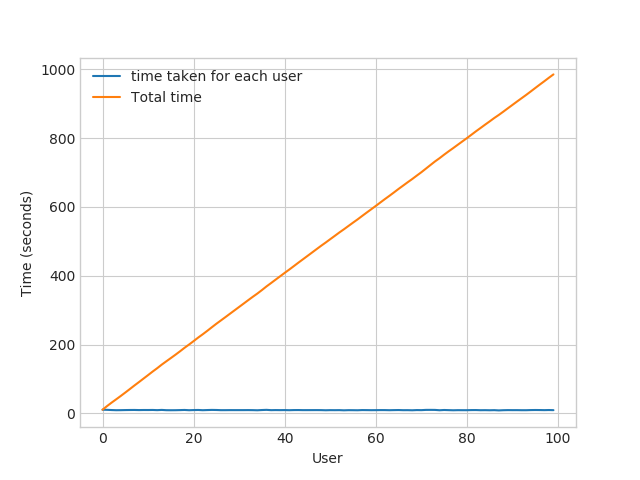

----------------------------------------------------------------------------------------------------
Time taken : 0:16:33.618931


In [0]:
start = datetime.now()
u_u_sim_sparse, _ = compute_user_similarity(train_sparse_matrix, compute_for_few=True, top = 100,
                                                     verbose=True)
print("-"*100)
print("Time taken :",datetime.now()-start)

<h4> 3.4.1.2 Trying with reduced dimensions (Using TruncatedSVD for dimensionality reduction of user vector)</h4>

* We have  **405,041 users** in out training set and computing similarities between them..( **17K dimensional vector..**) is time consuming..


- From above plot, It took roughly __8.88 sec__ for computing simlilar users for __one user__
    
    
- We have __405,041 users__ with us in training set.


- ${ 405041 \times 8.88 = 3596764.08  \sec } =  59946.068 \min = 999.101133333 \text{ hours}
= 41.629213889 \text{ days}...$

    - Even if we run on 4 cores parallelly (a typical system now a days), It will still take almost __10 and 1/2__ days.
    
 IDEA:  Instead, we will try to reduce the dimentsions using SVD, so that __it might__ speed up the process...

In [0]:
from datetime import datetime
from sklearn.decomposition import TruncatedSVD

start = datetime.now()

# initilaize the algorithm with some parameters..
# All of them are default except n_components. n_itr is for Randomized SVD solver.
netflix_svd = TruncatedSVD(n_components=500, algorithm='randomized', random_state=15)
trunc_svd = netflix_svd.fit_transform(train_sparse_matrix)

print(datetime.now()-start)

0:29:07.069783


Here,


- $\sum \longleftarrow$ (netflix\_svd.**singular\_values\_** )


- $\bigvee^T \longleftarrow$ (netflix\_svd.**components_**)


- $\bigcup$ is not returned. instead **Projection_of_X** onto the new vectorspace is returned. 


- It uses **randomized svd** internally, which returns **All 3 of them saperately**. Use that instead.. 

In [0]:
expl_var = np.cumsum(netflix_svd.explained_variance_ratio_)

<IPython.core.display.Javascript object>


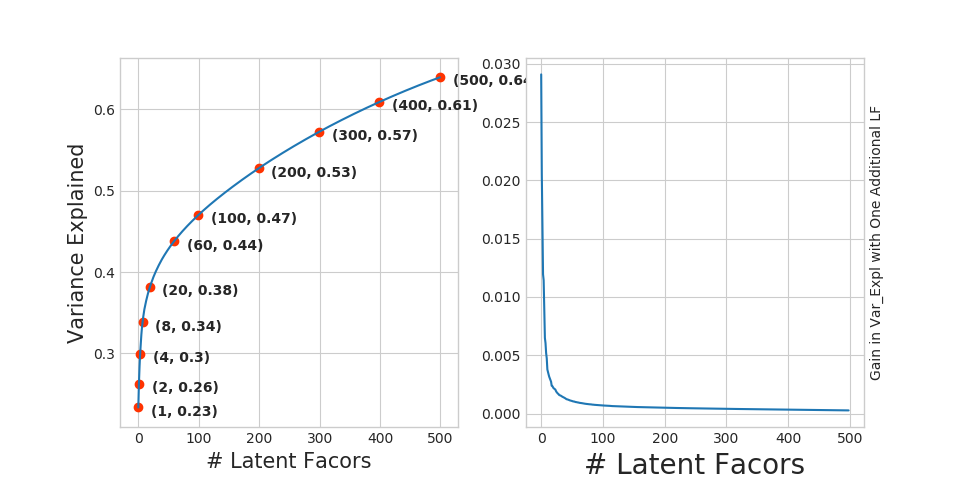

In [0]:
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=plt.figaspect(.5))

ax1.set_ylabel("Variance Explained", fontsize=15)
ax1.set_xlabel("# Latent Facors", fontsize=15)
ax1.plot(expl_var)
# annote some (latentfactors, expl_var) to make it clear
ind = [1, 2,4,8,20, 60, 100, 200, 300, 400, 500]
ax1.scatter(x = [i-1 for i in ind], y = expl_var[[i-1 for i in ind]], c='#ff3300')
for i in ind:
    ax1.annotate(s ="({}, {})".format(i,  np.round(expl_var[i-1], 2)), xy=(i-1, expl_var[i-1]),
                xytext = ( i+20, expl_var[i-1] - 0.01), fontweight='bold')

change_in_expl_var = [expl_var[i+1] - expl_var[i] for i in range(len(expl_var)-1)]
ax2.plot(change_in_expl_var)



ax2.set_ylabel("Gain in Var_Expl with One Additional LF", fontsize=10)
ax2.yaxis.set_label_position("right")
ax2.set_xlabel("# Latent Facors", fontsize=20)

plt.show()

In [0]:
for i in ind:
    print("({}, {})".format(i, np.round(expl_var[i-1], 2)))

(1, 0.23)
(2, 0.26)
(4, 0.3)
(8, 0.34)
(20, 0.38)
(60, 0.44)
(100, 0.47)
(200, 0.53)
(300, 0.57)
(400, 0.61)
(500, 0.64)


 
> I think 500 dimensions is good enough 

---------

-  By just taking __(20 to 30)__ latent factors, explained variance that we could get is __20 %__. 

- To take it to __60%__, we have to take  __almost 400 latent factors__. It is not fare.



- It basically is the __gain of variance explained__, if we ___add one additional latent factor to it.___


- By adding one by one latent factore too it, the ___gain in expained variance__ with that addition is decreasing. (Obviously, because they are sorted that way).
- ___LHS Graph___:
    - __x__ --- ( No of latent factos ),
    - __y__ --- ( The variance explained by taking x latent factors)



- __More decrease in the line (RHS graph) __:
    - We  are getting more expained variance than before.
- __Less decrease in that line (RHS graph)__  :
    - We are not getting benifitted from adding latent factor furthur. This is what is shown in the plots.


- ___RHS Graph___:
    - __x__ --- ( No of latent factors ),
    - __y__ --- ( Gain n Expl_Var by taking one additional latent factor) 

In [0]:
# Let's project our Original U_M matrix into into 500 Dimensional space...
start = datetime.now()
trunc_matrix = train_sparse_matrix.dot(netflix_svd.components_.T)
print(datetime.now()- start)

0:00:45.670265


In [0]:
type(trunc_matrix), trunc_matrix.shape

(numpy.ndarray, (2649430, 500))

* Let's convert this to actual sparse matrix and store it for future purposes

In [9]:
if not os.path.isfile('trunc_sparse_matrix.npz'):
    # create that sparse sparse matrix
    trunc_sparse_matrix = sparse.csr_matrix(trunc_matrix)
    # Save this truncated sparse matrix for later usage..
    sparse.save_npz('trunc_sparse_matrix', trunc_sparse_matrix)
else:
    trunc_sparse_matrix = sparse.load_npz('trunc_sparse_matrix.npz')

In [10]:
trunc_sparse_matrix.shape

(2649430, 500)

Computing top 50 similarities for each user..
computing done for 10 users [  time elapsed : 0:02:09.746324  ]
computing done for 20 users [  time elapsed : 0:04:16.017768  ]
computing done for 30 users [  time elapsed : 0:06:20.861163  ]
computing done for 40 users [  time elapsed : 0:08:24.933316  ]
computing done for 50 users [  time elapsed : 0:10:28.861485  ]
Creating Sparse matrix from the computed similarities


<IPython.core.display.Javascript object>


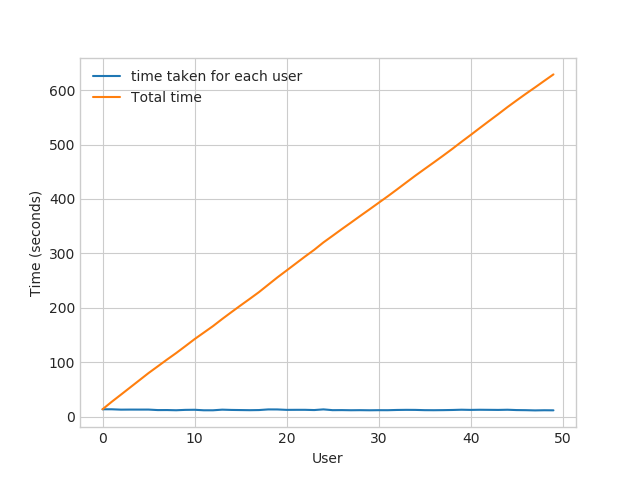

--------------------------------------------------
time: 0:10:52.658092


In [0]:
start = datetime.now()
trunc_u_u_sim_matrix, _ = compute_user_similarity(trunc_sparse_matrix, compute_for_few=True, top=50, verbose=True, 
                                                 verb_for_n_rows=10)
print("-"*50)
print("time:",datetime.now()-start)

**: This is taking more time for each user than Original one.**

- from above plot, It took almost __12.18__ for computing simlilar users for __one user__
    
    
- We have __405041 users__ with us in training set.


- ${ 405041 \times 12.18 ==== 4933399.38 \sec } ====  82223.323 \min ==== 1370.388716667 \text{ hours}
==== 57.099529861 \text{ days}...$

    - Even we run on 4 cores parallelly (a typical system now a days), It will still take almost __(14 - 15) __ days.


- __Why did this happen...??__


    - Just think about it. It's not that difficult.

---------------------------------_( sparse & dense..................get it ?? )_-----------------------------------

__Is there any other way to compute user user similarity..??__

-An alternative is to compute similar users for a particular user,  whenenver required (**ie., Run time**)
    - We maintain a binary Vector for users, which tells us whether we already computed or not..
    - ***If not*** : 
        - Compute top (let's just say, 1000) most similar users for this given user, and add this to our datastructure, so that we can just access it(similar users) without recomputing it again.
        - 
    - ***If It is already Computed***:
        - Just get it directly from our datastructure, which has that information.
        - In production time, We might have to recompute similarities, if it is computed a long time ago. Because user preferences changes over time. If we could maintain some kind of Timer, which when expires, we have to update it ( recompute it ). 
        - 
    - ***Which datastructure to use:***
        - It is purely implementation dependant. 
        - One simple method is to maintain a **Dictionary Of Dictionaries**.
            - 
            - **key    :** _userid_ 
            - __value__: _Again a dictionary_
                - __key__  : _Similar User_
                - __value__: _Similarity Value_

<h3> 3.4.2 Computing Movie-Movie Similarity matrix </h3>

In [13]:
start = datetime.now()
if not os.path.isfile('m_m_sim_sparse.npz'):
    print("It seems you don't have that file. Computing movie_movie similarity...")
    start = datetime.now()
    m_m_sim_sparse = cosine_similarity(X=train_sparse_matrix.T, dense_output=False)
    print("Done..")
    # store this sparse matrix in disk before using it. For future purposes.
    print("Saving it to disk without the need of re-computing it again.. ")
    sparse.save_npz("m_m_sim_sparse.npz", m_m_sim_sparse)
    print("Done..")
else:
    print("It is there, We will get it.")
    m_m_sim_sparse = sparse.load_npz("m_m_sim_sparse.npz")
    print("Done ...")

("It's a ",m_m_sim_sparse.shape," dimensional matrix")

print(datetime.now() - start)

It is there, We will get it.
Done ...
0:00:00


In [ ]:
m_m_sim_sparse.shape

- Even though we have similarity measure of each movie, with all other movies, We generally don't care much about least similar movies.


- Most of the times, only top_xxx similar items matters. It may be 10 or 100.


- We take only those top similar movie ratings and store them  in a saperate dictionary.

In [0]:
movie_ids = np.unique(m_m_sim_sparse.nonzero()[1])

In [0]:
start = datetime.now()
similar_movies = dict()
for movie in movie_ids:
    # get the top similar movies and store them in the dictionary
    sim_movies = m_m_sim_sparse[movie].toarray().ravel().argsort()[::-1][1:]
    similar_movies[movie] = sim_movies[:100]
print(datetime.now() - start)

# just testing similar movies for movie_15
similar_movies[15]

0:00:33.411700


array([ 8279,  8013, 16528,  5927, 13105, 12049,  4424, 10193, 17590,
        4549,  3755,   590, 14059, 15144, 15054,  9584,  9071,  6349,
       16402,  3973,  1720,  5370, 16309,  9376,  6116,  4706,  2818,
         778, 15331,  1416, 12979, 17139, 17710,  5452,  2534,   164,
       15188,  8323,  2450, 16331,  9566, 15301, 13213, 14308, 15984,
       10597,  6426,  5500,  7068,  7328,  5720,  9802,   376, 13013,
        8003, 10199,  3338, 15390,  9688, 16455, 11730,  4513,   598,
       12762,  2187,   509,  5865,  9166, 17115, 16334,  1942,  7282,
       17584,  4376,  8988,  8873,  5921,  2716, 14679, 11947, 11981,
        4649,   565, 12954, 10788, 10220, 10963,  9427,  1690,  5107,
        7859,  5969,  1510,  2429,   847,  7845,  6410, 13931,  9840,
        3706])

<h3> 3.4.3 Finding most similar movies using similarity matrix </h3>

__ Does Similarity really works as the way we expected...? __ <br>
_Let's pick some random movie and check for its similar movies...._

In [0]:
# First Let's load the movie details into soe dataframe..
# movie details are in 'netflix/movie_titles.csv'

movie_titles = pd.read_csv("data_folder/movie_titles.csv", sep=',', header = None,
                           names=['movie_id', 'year_of_release', 'title'], verbose=True,
                      index_col = 'movie_id', encoding = "ISO-8859-1")

movie_titles.head()

Tokenization took: 4.50 ms
Type conversion took: 165.72 ms
Parser memory cleanup took: 0.01 ms


,year_of_release,title
movie_id,,
1,2003.0,Dinosaur Planet
2,2004.0,Isle of Man TT 2004 Review
3,1997.0,Character
4,1994.0,Paula Abdul's Get Up & Dance
5,2004.0,The Rise and Fall of ECW


<p style='font-size:15px'><b>Similar Movies for 'Vampire Journals'</b></p>

In [0]:
mv_id = 67

print("\nMovie ----->",movie_titles.loc[mv_id].values[1])

print("\nIt has {} Ratings from users.".format(train_sparse_matrix[:,mv_id].getnnz()))

print("\nWe have {} movies which are similarto this  and we will get only top most..".format(m_m_sim_sparse[:,mv_id].getnnz()))


Movie -----> Vampire Journals

It has 270 Ratings from users.

We have 17284 movies which are similarto this  and we will get only top most..


In [0]:
similarities = m_m_sim_sparse[mv_id].toarray().ravel()

similar_indices = similarities.argsort()[::-1][1:]

similarities[similar_indices]

sim_indices = similarities.argsort()[::-1][1:] # It will sort and reverse the array and ignore its similarity (ie.,1)
                                               # and return its indices(movie_ids)

<IPython.core.display.Javascript object>


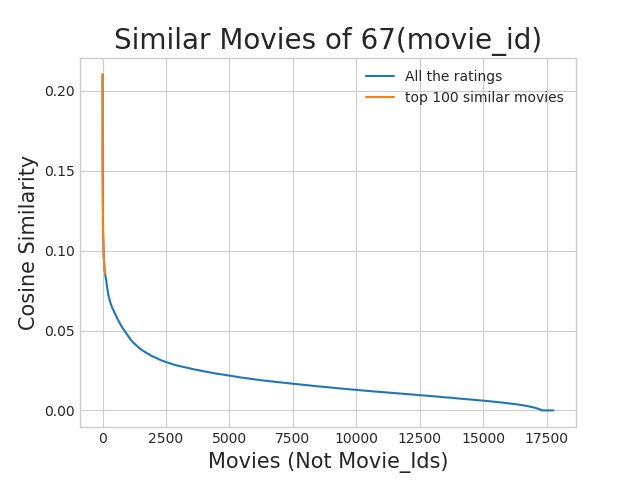

In [0]:
plt.plot(similarities[sim_indices], label='All the ratings')
plt.plot(similarities[sim_indices[:100]], label='top 100 similar movies')
plt.title("Similar Movies of {}(movie_id)".format(mv_id), fontsize=20)
plt.xlabel("Movies (Not Movie_Ids)", fontsize=15)
plt.ylabel("Cosine Similarity",fontsize=15)
plt.legend()
plt.show()

__Top 10 similar movies__

In [0]:
movie_titles.loc[sim_indices[:10]]

,year_of_release,title
movie_id,,
323,1999.0,Modern Vampires
4044,1998.0,Subspecies 4: Bloodstorm
1688,1993.0,To Sleep With a Vampire
13962,2001.0,Dracula: The Dark Prince
12053,1993.0,Dracula Rising
16279,2002.0,Vampires: Los Muertos
4667,1996.0,Vampirella
1900,1997.0,Club Vampire
13873,2001.0,The Breed


 > Similarly, we can ___find similar users___ and compare how similar they are. 

 <h1> 4.  Machine Learning Models </h1>

<img src='images/models.jpg' width=500px>

In [10]:
def get_sample_sparse_matrix(sparse_matrix, no_users, no_movies, path, verbose = True):
    """
        It will get it from the ''path'' if it is present  or It will create 
        and store the sampled sparse matrix in the path specified.
    """

    # get (row, col) and (rating) tuple from sparse_matrix...
    row_ind, col_ind, ratings = sparse.find(sparse_matrix)
    users = np.unique(row_ind)
    movies = np.unique(col_ind)

    print("Original Matrix : (users, movies) -- ({} {})".format(len(users), len(movies)))
    print("Original Matrix : Ratings -- {}\n".format(len(ratings)))

    # It just to make sure to get same sample everytime we run this program..
    # and pick without replacement....
    np.random.seed(15)
    sample_users = np.random.choice(users, no_users, replace=False)
    sample_movies = np.random.choice(movies, no_movies, replace=False)
    # get the boolean mask or these sampled_items in originl row/col_inds..
    mask = np.logical_and( np.isin(row_ind, sample_users),
                      np.isin(col_ind, sample_movies) )
    
    sample_sparse_matrix = sparse.csr_matrix((ratings[mask], (row_ind[mask], col_ind[mask])),
                                             shape=(max(sample_users)+1, max(sample_movies)+1))

    if verbose:
        print("Sampled Matrix : (users, movies) -- ({} {})".format(len(sample_users), len(sample_movies)))
        print("Sampled Matrix : Ratings --", format(ratings[mask].shape[0]))

    print('Saving it into disk for furthur usage..')
    # save it into disk
    sparse.save_npz(path, sample_sparse_matrix)
    if verbose:
            print('Done..\n')
    
    return sample_sparse_matrix

<h2> 4.1 Sampling Data </h2>

<h3>4.1.1 Build sample train data from the train data</h3>

In [11]:
start = datetime.now()
path = "sample/small/sample_train_sparse_matrix.npz"
if os.path.isfile(path):
    print("It is present in your pwd, getting it from disk....")
    # just get it from the disk instead of computing it
    sample_train_sparse_matrix = sparse.load_npz(path)
    print("DONE..")
else: 
    # get 10k users and 1k movies from available data 
    sample_train_sparse_matrix = get_sample_sparse_matrix(train_sparse_matrix, no_users=10000, no_movies=1000,
                                             path = path)

print(datetime.now() - start)

It is present in your pwd, getting it from disk....
DONE..
0:00:00.174137


<h3>4.1.2 Build sample test data from the test data</h3>

In [12]:
start = datetime.now()

path = "sample/small/sample_test_sparse_matrix.npz"
if os.path.isfile(path):
    print("It is present in your pwd, getting it from disk....")
    # just get it from the disk instead of computing it
    sample_test_sparse_matrix = sparse.load_npz(path)
    print("DONE..")
else:
    # get 5k users and 500 movies from available data 
    sample_test_sparse_matrix = get_sample_sparse_matrix(test_sparse_matrix, no_users=5000, no_movies=500,
                                                 path = "sample/small/sample_test_sparse_matrix.npz")
print(datetime.now() - start)

It is present in your pwd, getting it from disk....
DONE..
0:00:00.049040


<h2>4.2 Finding Global Average of all movie ratings, Average rating per User, and Average rating per Movie (from sampled train)</h2>

In [13]:
sample_train_averages = dict()

<h3>4.2.1 Finding Global Average of all movie ratings</h3>

In [14]:
# get the global average of ratings in our train set.
global_average = sample_train_sparse_matrix.sum()/sample_train_sparse_matrix.count_nonzero()
sample_train_averages['global'] = global_average
sample_train_averages

{'global': 3.5875813607223455}

<h3>4.2.2 Finding Average rating per User</h3>

In [15]:
sample_train_averages['user'] = get_average_ratings(sample_train_sparse_matrix, of_users=True)
print('\nAverage rating of user 1515220 :',sample_train_averages['user'][1515220])


Average rating of user 1515220 : 3.923076923076923


<h3>4.2.3 Finding Average rating per Movie</h3>

In [16]:
sample_train_averages['movie'] =  get_average_ratings(sample_train_sparse_matrix, of_users=False)
print('\n AVerage rating of movie 15153 :',sample_train_averages['movie'][15153])


 AVerage rating of movie 15153 : 2.752


<h2> 4.3 Featurizing data </h2>

In [17]:
print('\n No of ratings in Our Sampled train matrix is : {}\n'.format(sample_train_sparse_matrix.count_nonzero()))
print('\n No of ratings in Our Sampled test  matrix is : {}\n'.format(sample_test_sparse_matrix.count_nonzero()))


 No of ratings in Our Sampled train matrix is : 856986


 No of ratings in Our Sampled test  matrix is : 7333



<h3> 4.3.1 Featurizing data for regression problem </h3>

<h4> 4.3.1.1 Featurizing train data </h4>

In [18]:
# get users, movies and ratings from our samples train sparse matrix
sample_train_users, sample_train_movies, sample_train_ratings = sparse.find(sample_train_sparse_matrix)

In [19]:
############################################################
# It took me almost 10 hours to prepare this train dataset.#
############################################################
start = datetime.now()
if os.path.isfile('sample/small/reg_train.csv'):
    print("File already exists you don't have to prepare again..." )
else:
    print('preparing {} tuples for the dataset..\n'.format(len(sample_train_ratings)))
    with open('sample/small/reg_train.csv', mode='w') as reg_data_file:
        count = 0
        for (user, movie, rating)  in zip(sample_train_users, sample_train_movies, sample_train_ratings):
            st = datetime.now()
        #     print(user, movie)    
            #--------------------- Ratings of "movie" by similar users of "user" ---------------------
            # compute the similar Users of the "user"        
            user_sim = cosine_similarity(sample_train_sparse_matrix[user], sample_train_sparse_matrix).ravel()
            top_sim_users = user_sim.argsort()[::-1][1:] # we are ignoring 'The User' from its similar users.
            # get the ratings of most similar users for this movie
            top_ratings = sample_train_sparse_matrix[top_sim_users, movie].toarray().ravel()
            # we will make it's length "5" by adding movie averages to .
            top_sim_users_ratings = list(top_ratings[top_ratings != 0][:5])
            top_sim_users_ratings.extend([sample_train_averages['movie'][movie]]*(5 - len(top_sim_users_ratings)))
        #     print(top_sim_users_ratings, end=" ")    


            #--------------------- Ratings by "user"  to similar movies of "movie" ---------------------
            # compute the similar movies of the "movie"        
            movie_sim = cosine_similarity(sample_train_sparse_matrix[:,movie].T, sample_train_sparse_matrix.T).ravel()
            top_sim_movies = movie_sim.argsort()[::-1][1:] # we are ignoring 'The User' from its similar users.
            # get the ratings of most similar movie rated by this user..
            top_ratings = sample_train_sparse_matrix[user, top_sim_movies].toarray().ravel()
            # we will make it's length "5" by adding user averages to.
            top_sim_movies_ratings = list(top_ratings[top_ratings != 0][:5])
            top_sim_movies_ratings.extend([sample_train_averages['user'][user]]*(5-len(top_sim_movies_ratings))) 
        #     print(top_sim_movies_ratings, end=" : -- ")

            #-----------------prepare the row to be stores in a file-----------------#
            row = list()
            row.append(user)
            row.append(movie)
            # Now add the other features to this data...
            row.append(sample_train_averages['global']) # first feature
            # next 5 features are similar_users "movie" ratings
            row.extend(top_sim_users_ratings)
            # next 5 features are "user" ratings for similar_movies
            row.extend(top_sim_movies_ratings)
            # Avg_user rating
            row.append(sample_train_averages['user'][user])
            # Avg_movie rating
            row.append(sample_train_averages['movie'][movie])

            # finalley, The actual Rating of this user-movie pair...
            row.append(rating)
            count = count + 1

            # add rows to the file opened..
            reg_data_file.write(','.join(map(str, row)))
            reg_data_file.write('\n')        
            if (count)%10000 == 0:
                # print(','.join(map(str, row)))
                print("Done for {} rows----- {}".format(count, datetime.now() - start))


print(datetime.now() - start)

File already exists you don't have to prepare again...
0:00:00.001001


__Reading from the file to make a Train_dataframe__

In [20]:
reg_train = pd.read_csv('sample/small/reg_train.csv', names = ['user', 'movie', 'GAvg', 'sur1', 'sur2', 'sur3', 'sur4', 'sur5','smr1', 'smr2', 'smr3', 'smr4', 'smr5', 'UAvg', 'MAvg', 'rating'], header=None)
reg_train.head()

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,smr3,smr4,smr5,UAvg,MAvg,rating
0,53406,33,3.581679,4.0,5.0,5.0,4.0,1.0,5.0,2.0,5.0,3.0,1.0,3.370370,4.092437,4
1,99540,33,3.581679,5.0,5.0,5.0,4.0,5.0,3.0,4.0,4.0,3.0,5.0,3.555556,4.092437,3
2,99865,33,3.581679,5.0,5.0,4.0,5.0,3.0,5.0,4.0,4.0,5.0,4.0,3.714286,4.092437,5
3,101620,33,3.581679,2.0,3.0,5.0,5.0,4.0,4.0,3.0,3.0,4.0,5.0,3.584416,4.092437,5
4,112974,33,3.581679,5.0,5.0,5.0,5.0,5.0,3.0,5.0,5.0,5.0,3.0,3.750000,4.092437,5


-----------------------

- __GAvg__ : Average rating of all the ratings 


- __Similar users rating of this movie__:
    - sur1, sur2, sur3, sur4, sur5 ( top 5 similar users who rated that movie.. )
    


- __Similar movies rated by this user__:
    - smr1, smr2, smr3, smr4, smr5 ( top 5 similar movies rated by this movie.. )


- __UAvg__ : User's Average rating


- __MAvg__ : Average rating of this movie


- __rating__ : Rating of this movie by this user.

-----------------------

<h4> 4.3.1.2 Featurizing test data </h4>

In [21]:
# get users, movies and ratings from the Sampled Test 
sample_test_users, sample_test_movies, sample_test_ratings = sparse.find(sample_test_sparse_matrix)

In [22]:
sample_train_averages['global']

3.5875813607223455

In [23]:
start = datetime.now()

if os.path.isfile('sample/small/reg_test.csv'):
    print("It is already created...")
else:

    print('preparing {} tuples for the dataset..\n'.format(len(sample_test_ratings)))
    with open('sample/small/reg_test.csv', mode='w') as reg_data_file:
        count = 0 
        for (user, movie, rating)  in zip(sample_test_users, sample_test_movies, sample_test_ratings):
            st = datetime.now()

        #--------------------- Ratings of "movie" by similar users of "user" ---------------------
            #print(user, movie)
            try:
                # compute the similar Users of the "user"        
                user_sim = cosine_similarity(sample_train_sparse_matrix[user], sample_train_sparse_matrix).ravel()
                top_sim_users = user_sim.argsort()[::-1][1:] # we are ignoring 'The User' from its similar users.
                # get the ratings of most similar users for this movie
                top_ratings = sample_train_sparse_matrix[top_sim_users, movie].toarray().ravel()
                # we will make it's length "5" by adding movie averages to .
                top_sim_users_ratings = list(top_ratings[top_ratings != 0][:5])
                top_sim_users_ratings.extend([sample_train_averages['movie'][movie]]*(5 - len(top_sim_users_ratings)))
                # print(top_sim_users_ratings, end="--")

            except (IndexError, KeyError):
                # It is a new User or new Movie or there are no ratings for given user for top similar movies...
                ########## Cold STart Problem ##########
                top_sim_users_ratings.extend([sample_train_averages['global']]*(5 - len(top_sim_users_ratings)))
                #print(top_sim_users_ratings)
            except:
                print(user, movie)
                # we just want KeyErrors to be resolved. Not every Exception...
                raise



            #--------------------- Ratings by "user"  to similar movies of "movie" ---------------------
            try:
                # compute the similar movies of the "movie"        
                movie_sim = cosine_similarity(sample_train_sparse_matrix[:,movie].T, sample_train_sparse_matrix.T).ravel()
                top_sim_movies = movie_sim.argsort()[::-1][1:] # we are ignoring 'The User' from its similar users.
                # get the ratings of most similar movie rated by this user..
                top_ratings = sample_train_sparse_matrix[user, top_sim_movies].toarray().ravel()
                # we will make it's length "5" by adding user averages to.
                top_sim_movies_ratings = list(top_ratings[top_ratings != 0][:5])
                top_sim_movies_ratings.extend([sample_train_averages['user'][user]]*(5-len(top_sim_movies_ratings))) 
                #print(top_sim_movies_ratings)
            except (IndexError, KeyError):
                #print(top_sim_movies_ratings, end=" : -- ")
                top_sim_movies_ratings.extend([sample_train_averages['global']]*(5-len(top_sim_movies_ratings)))
                #print(top_sim_movies_ratings)
            except :
                raise

            #-----------------prepare the row to be stores in a file-----------------#
            row = list()
            # add usser and movie name first
            row.append(user)
            row.append(movie)
            row.append(sample_train_averages['global']) # first feature
            #print(row)
            # next 5 features are similar_users "movie" ratings
            row.extend(top_sim_users_ratings)
            #print(row)
            # next 5 features are "user" ratings for similar_movies
            row.extend(top_sim_movies_ratings)
            #print(row)
            # Avg_user rating
            try:
                row.append(sample_train_averages['user'][user])
            except KeyError:
                row.append(sample_train_averages['global'])
            except:
                raise
            #print(row)
            # Avg_movie rating
            try:
                row.append(sample_train_averages['movie'][movie])
            except KeyError:
                row.append(sample_train_averages['global'])
            except:
                raise
            #print(row)
            # finalley, The actual Rating of this user-movie pair...
            row.append(rating)
            #print(row)
            count = count + 1

            # add rows to the file opened..
            reg_data_file.write(','.join(map(str, row)))
            #print(','.join(map(str, row)))
            reg_data_file.write('\n')        
            if (count)%1000 == 0:
                #print(','.join(map(str, row)))
                print("Done for {} rows----- {}".format(count, datetime.now() - start))
    print("",datetime.now() - start)  

It is already created...


__Reading from the file to make a test dataframe __

In [24]:
reg_test_df = pd.read_csv('sample/small/reg_test.csv', names = ['user', 'movie', 'GAvg', 'sur1', 'sur2', 'sur3', 'sur4', 'sur5',
                                                          'smr1', 'smr2', 'smr3', 'smr4', 'smr5',
                                                          'UAvg', 'MAvg', 'rating'], header=None)
reg_test_df.head(4)

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,smr3,smr4,smr5,UAvg,MAvg,rating
0,808635,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,5
1,941866,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,4
2,1737912,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3
3,1849204,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,4


-----------------------

- __GAvg__ : Average rating of all the ratings 


- __Similar users rating of this movie__:
    - sur1, sur2, sur3, sur4, sur5 ( top 5 simiular users who rated that movie.. )
    


- __Similar movies rated by this user__:
    - smr1, smr2, smr3, smr4, smr5 ( top 5 simiular movies rated by this movie.. )


- __UAvg__ : User AVerage rating


- __MAvg__ : Average rating of this movie


- __rating__ : Rating of this movie by this user.

-----------------------

<h3> 4.3.2 Transforming data for Surprise models</h3>

In [25]:
from surprise import Reader, Dataset

<h4> 4.3.2.1 Transforming train data </h4>

- We can't give raw data (movie, user, rating) to train the model in Surprise library.


- They have a saperate format for TRAIN and TEST data, which will be useful for training the models like SVD, KNNBaseLineOnly....etc..,in Surprise.


- We can form the trainset from a file, or from a Pandas  DataFrame. 
http://surprise.readthedocs.io/en/stable/getting_started.html#load-dom-dataframe-py 

In [26]:
# It is to specify how to read the dataframe.
# for our dataframe, we don't have to specify anything extra..
reader = Reader(rating_scale=(1,5))

# create the traindata from the dataframe...
train_data = Dataset.load_from_df(reg_train[['user', 'movie', 'rating']], reader)

# build the trainset from traindata.., It is of dataset format from surprise library..
trainset = train_data.build_full_trainset() 

<h4> 4.3.2.2 Transforming test data </h4>

- Testset is just a list of (user, movie, rating) tuples. (Order in the tuple is impotant) 

In [27]:
testset = list(zip(reg_test_df.user.values, reg_test_df.movie.values, reg_test_df.rating.values))
testset[:3]

[(808635, 71, 5), (941866, 71, 4), (1737912, 71, 3)]

<h2> 4.4 Applying Machine Learning models </h2>

-  Global dictionary that stores rmse and mape for all the models....

    - It stores the metrics in a dictionary of dictionaries

    > __keys__ : model names(string)

    > __value__: dict(__key__ : metric, __value__ : value ) 

In [28]:
models_evaluation_train = dict()
models_evaluation_test = dict()

models_evaluation_train, models_evaluation_test

({}, {})

 > __Utility functions for running regression models__

In [29]:
# to get rmse and mape given actual and predicted ratings..
def get_error_metrics(y_true, y_pred):
    rmse = np.sqrt(np.mean([ (y_true[i] - y_pred[i])**2 for i in range(len(y_pred)) ]))
    mape = np.mean(np.abs( (y_true - y_pred)/y_true )) * 100
    return rmse, mape

###################################################################
###################################################################
def run_xgboost(algo,  x_train, y_train, x_test, y_test, verbose=True):
    """
    It will return train_results and test_results
    """
    
    # dictionaries for storing train and test results
    train_results = dict()
    test_results = dict()
    
    
    # fit the model
    print('Training the model..')
    start =datetime.now()
    algo.fit(x_train, y_train, eval_metric = 'rmse')
    print('Done. Time taken : {}\n'.format(datetime.now()-start))
    print('Done \n')

    # from the trained model, get the predictions....
    print('Evaluating the model with TRAIN data...')
    start =datetime.now()
    y_train_pred = algo.predict(x_train)
    # get the rmse and mape of train data...
    rmse_train, mape_train = get_error_metrics(y_train.values, y_train_pred)
    
    # store the results in train_results dictionary..
    train_results = {'rmse': rmse_train,
                    'mape' : mape_train,
                    'predictions' : y_train_pred}
    
    #######################################
    # get the test data predictions and compute rmse and mape
    print('Evaluating Test data')
    y_test_pred = algo.predict(x_test) 
    rmse_test, mape_test = get_error_metrics(y_true=y_test.values, y_pred=y_test_pred)
    # store them in our test results dictionary.
    test_results = {'rmse': rmse_test,
                    'mape' : mape_test,
                    'predictions':y_test_pred}
    if verbose:
        print('\nTEST DATA')
        print('-'*30)
        print('RMSE : ', rmse_test)
        print('MAPE : ', mape_test)
        
    # return these train and test results...
    return train_results, test_results
    

> __Utility functions for Surprise modes__

In [30]:
# it is just to makesure that all of our algorithms should produce same results
# everytime they run...

my_seed = 15
random.seed(my_seed)
np.random.seed(my_seed)

##########################################################
# get  (actual_list , predicted_list) ratings given list 
# of predictions (prediction is a class in Surprise).    
##########################################################
def get_ratings(predictions):
    actual = np.array([pred.r_ui for pred in predictions])
    pred = np.array([pred.est for pred in predictions])
    
    return actual, pred

################################################################
# get ''rmse'' and ''mape'' , given list of prediction objecs 
################################################################
def get_errors(predictions, print_them=False):

    actual, pred = get_ratings(predictions)
    rmse = np.sqrt(np.mean((pred - actual)**2))
    mape = np.mean(np.abs(pred - actual)/actual)

    return rmse, mape*100

##################################################################################
# It will return predicted ratings, rmse and mape of both train and test data   #
##################################################################################
def run_surprise(algo, trainset, testset, verbose=True): 
    '''
        return train_dict, test_dict
    
        It returns two dictionaries, one for train and the other is for test
        Each of them have 3 key-value pairs, which specify ''rmse'', ''mape'', and ''predicted ratings''.
    '''
    start = datetime.now()
    # dictionaries that stores metrics for train and test..
    train = dict()
    test = dict()
    
    # train the algorithm with the trainset
    st = datetime.now()
    print('Training the model...')
    algo.fit(trainset)
    print('Done. time taken : {} \n'.format(datetime.now()-st))
    
    # ---------------- Evaluating train data--------------------#
    st = datetime.now()
    print('Evaluating the model with train data..')
    # get the train predictions (list of prediction class inside Surprise)
    train_preds = algo.test(trainset.build_testset())
    # get predicted ratings from the train predictions..
    train_actual_ratings, train_pred_ratings = get_ratings(train_preds)
    # get ''rmse'' and ''mape'' from the train predictions.
    train_rmse, train_mape = get_errors(train_preds)
    print('time taken : {}'.format(datetime.now()-st))
    
    if verbose:
        print('-'*15)
        print('Train Data')
        print('-'*15)
        print("RMSE : {}\n\nMAPE : {}\n".format(train_rmse, train_mape))
    
    #store them in the train dictionary
    if verbose:
        print('adding train results in the dictionary..')
    train['rmse'] = train_rmse
    train['mape'] = train_mape
    train['predictions'] = train_pred_ratings
    
    #------------ Evaluating Test data---------------#
    st = datetime.now()
    print('\nEvaluating for test data...')
    # get the predictions( list of prediction classes) of test data
    test_preds = algo.test(testset)
    # get the predicted ratings from the list of predictions
    test_actual_ratings, test_pred_ratings = get_ratings(test_preds)
    # get error metrics from the predicted and actual ratings
    test_rmse, test_mape = get_errors(test_preds)
    print('time taken : {}'.format(datetime.now()-st))
    
    if verbose:
        print('-'*15)
        print('Test Data')
        print('-'*15)
        print("RMSE : {}\n\nMAPE : {}\n".format(test_rmse, test_mape))
    # store them in test dictionary
    if verbose:
        print('storing the test results in test dictionary...')
    test['rmse'] = test_rmse
    test['mape'] = test_mape
    test['predictions'] = test_pred_ratings
    
    print('\n'+'-'*45)
    print('Total time taken to run this algorithm :', datetime.now() - start)
    
    # return two dictionaries train and test
    return train, test

<h3> 4.4.1 XGBoost with initial 13 features </h3>

In [31]:
import xgboost as xgb

Training the model..
[12:17:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes,

[12:17:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_

<IPython.core.display.Javascript object>


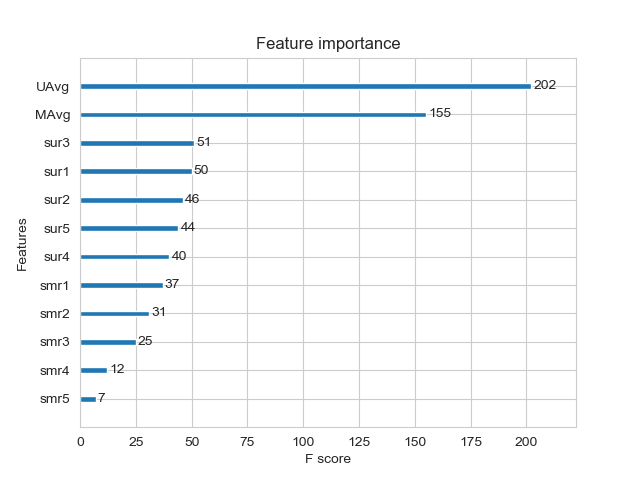

In [32]:
# prepare Train data
x_train = reg_train.drop(['user','movie','rating'], axis=1)
y_train = reg_train['rating']

# Prepare Test data
x_test = reg_test_df.drop(['user','movie','rating'], axis=1)
y_test = reg_test_df['rating']

# initialize Our first XGBoost model...
first_xgb = xgb.XGBRegressor(silent=False, n_jobs=13, random_state=15, n_estimators=100)
train_results, test_results = run_xgboost(first_xgb, x_train, y_train, x_test, y_test)

# store the results in models_evaluations dictionaries
models_evaluation_train['first_algo'] = train_results
models_evaluation_test['first_algo'] = test_results

xgb.plot_importance(first_xgb)
plt.show()

<h3> 4.4.2 Suprise BaselineModel </h3>
    


In [33]:
from surprise import BaselineOnly 

__Predicted_rating : ( baseline prediction ) __

    -  http://surprise.readthedocs.io/en/stable/basic_algorithms.html#surprise.prediction_algorithms.baseline_only.BaselineOnly 
 >$   \large {\hat{r}_{ui} = b_{ui} =\mu + b_u + b_i} $


- $\pmb \mu $ : Average of all trainings in training data.
- $\pmb b_u$ : User bias
- $\pmb b_i$ : Item bias (movie biases) 

__Optimization function ( Least Squares Problem ) __

    - http://surprise.readthedocs.io/en/stable/prediction_algorithms.html#baselines-estimates-configuration 

> $ \large \sum_{r_{ui} \in R_{train}} \left(r_{ui} - (\mu + b_u + b_i)\right)^2 +
\lambda \left(b_u^2 + b_i^2 \right).\text {        [mimimize } {b_u, b_i]}$ 

In [34]:

# options are to specify.., how to compute those user and item biases
bsl_options = {'method': 'sgd',
               'learning_rate': .001
               }
bsl_algo = BaselineOnly(bsl_options=bsl_options)
# run this algorithm.., It will return the train and test results..
bsl_train_results, bsl_test_results = run_surprise(bsl_algo, trainset, testset, verbose=True)


# Just store these error metrics in our models_evaluation datastructure
models_evaluation_train['bsl_algo'] = bsl_train_results 
models_evaluation_test['bsl_algo'] = bsl_test_results

Training the model...
Estimating biases using sgd...
Done. time taken : 0:00:00.675493 

Evaluating the model with train data..
time taken : 0:00:00.854133
---------------
Train Data
---------------
RMSE : 0.9347153928678286

MAPE : 29.389572652358183

adding train results in the dictionary..

Evaluating for test data...
time taken : 0:00:00.062045
---------------
Test Data
---------------
RMSE : 1.0730330260516174

MAPE : 35.04995544572911

storing the test results in test dictionary...

---------------------------------------------
Total time taken to run this algorithm : 0:00:01.594672


<h3> 4.4.3 XGBoost with initial 13 features + Surprise Baseline predictor </h3>

__Updating Train Data__

In [35]:
# add our baseline_predicted value as our feature..
reg_train['bslpr'] = models_evaluation_train['bsl_algo']['predictions']
reg_train.head(2) 

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,smr3,smr4,smr5,UAvg,MAvg,rating,bslpr
0,53406,33,3.581679,4.0,5.0,5.0,4.0,1.0,5.0,2.0,5.0,3.0,1.0,3.370370,4.092437,4,3.898982
1,99540,33,3.581679,5.0,5.0,5.0,4.0,5.0,3.0,4.0,4.0,3.0,5.0,3.555556,4.092437,3,3.371403


__Updating Test Data__

In [36]:
# add that baseline predicted ratings with Surprise to the test data as well
reg_test_df['bslpr']  = models_evaluation_test['bsl_algo']['predictions']

reg_test_df.head(2)

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,smr3,smr4,smr5,UAvg,MAvg,rating,bslpr
0,808635,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,5,3.581679
1,941866,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,4,3.581679


Training the model..
[12:17:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes,

[12:17:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[12:17:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_

<IPython.core.display.Javascript object>


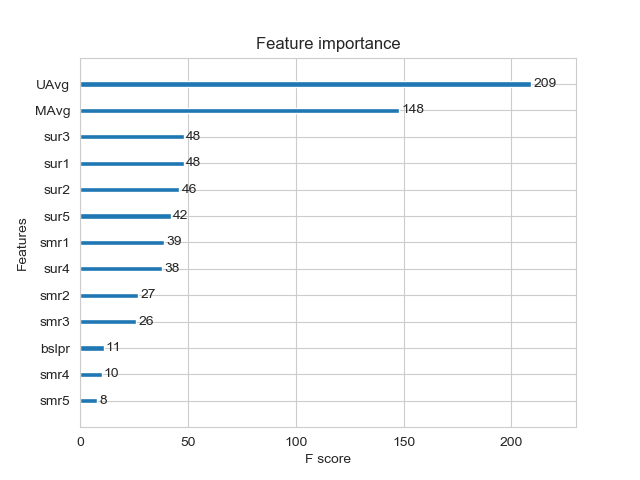

In [37]:
# prepare train data
x_train = reg_train.drop(['user', 'movie','rating'], axis=1)
y_train = reg_train['rating']

# Prepare Test data
x_test = reg_test_df.drop(['user','movie','rating'], axis=1)
y_test = reg_test_df['rating']

# initialize Our first XGBoost model...
xgb_bsl = xgb.XGBRegressor(silent=False, n_jobs=13, random_state=15, n_estimators=100)
train_results, test_results = run_xgboost(xgb_bsl, x_train, y_train, x_test, y_test)

# store the results in models_evaluations dictionaries
models_evaluation_train['xgb_bsl'] = train_results
models_evaluation_test['xgb_bsl'] = test_results

xgb.plot_importance(xgb_bsl)
plt.show()


<h3> 4.4.4 Surprise KNNBaseline predictor </h3>

In [38]:
from surprise import KNNBaseline

- KNN BASELINE
    - http://surprise.readthedocs.io/en/stable/knn_inspired.html#surprise.prediction_algorithms.knns.KNNBaseline 

- PEARSON_BASELINE SIMILARITY
    - http://surprise.readthedocs.io/en/stable/similarities.html#surprise.similarities.pearson_baseline 

- SHRINKAGE
    - _2.2 Neighborhood Models_ in http://courses.ischool.berkeley.edu/i290-dm/s11/SECURE/a1-koren.pdf 

- __predicted Rating__ : ( ___ based on User-User similarity ___ )

\begin{align} \hat{r}_{ui} = b_{ui} + \frac{ \sum\limits_{v \in N^k_i(u)}
\text{sim}(u, v) \cdot (r_{vi} - b_{vi})} {\sum\limits_{v \in
N^k_i(u)} \text{sim}(u, v)} \end{align}

- $\pmb{b_{ui}}$ -  _Baseline prediction_ of (user,movie) rating

- $ \pmb {N_i^k (u)}$ - Set of __K similar__ users (neighbours) of __user (u)__ who rated __movie(i)__  

- _sim (u, v)_ - __Similarity__ between users __u and v__  
    - Generally, it will be cosine similarity or Pearson correlation coefficient. 
    - But we use __shrunk Pearson-baseline correlation coefficient__, which is based on the pearsonBaseline similarity ( we take base line predictions instead of mean rating of user/item)
       

- __ Predicted rating __ ( based on Item Item similarity ):
 \begin{align} \hat{r}_{ui} = b_{ui} + \frac{ \sum\limits_{j \in N^k_u(i)}\text{sim}(i, j) \cdot (r_{uj} - b_{uj})} {\sum\limits_{j \in N^k_u(j)} \text{sim}(i, j)} \end{align}

    -  ___Notations follows same as above (user user based predicted rating ) ___

  <h4> 4.4.4.1 Surprise KNNBaseline with user user similarities</h4>

In [39]:
# we specify , how to compute similarities and what to consider with sim_options to our algorithm
sim_options = {'user_based' : True,
               'name': 'pearson_baseline',
               'shrinkage': 100,
               'min_support': 2
              } 
# we keep other parameters like regularization parameter and learning_rate as default values.
bsl_options = {'method': 'sgd'} 

knn_bsl_u = KNNBaseline(k=40, sim_options = sim_options, bsl_options = bsl_options)
knn_bsl_u_train_results, knn_bsl_u_test_results = run_surprise(knn_bsl_u, trainset, testset, verbose=True)

# Just store these error metrics in our models_evaluation datastructure
models_evaluation_train['knn_bsl_u'] = knn_bsl_u_train_results 
models_evaluation_test['knn_bsl_u'] = knn_bsl_u_test_results


Training the model...
Estimating biases using sgd...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Done. time taken : 0:00:41.952718 

Evaluating the model with train data..
time taken : 0:01:41.323358
---------------
Train Data
---------------
RMSE : 0.33642097416508826

MAPE : 9.145093375416348

adding train results in the dictionary..

Evaluating for test data...
time taken : 0:00:00.121089
---------------
Test Data
---------------
RMSE : 1.0726493739667242

MAPE : 35.02094499698424

storing the test results in test dictionary...

---------------------------------------------
Total time taken to run this algorithm : 0:02:23.400167


<h4> 4.4.4.2 Surprise KNNBaseline with movie movie similarities</h4>

In [40]:
# we specify , how to compute similarities and what to consider with sim_options to our algorithm

# 'user_based' : Fals => this considers the similarities of movies instead of users

sim_options = {'user_based' : False,
               'name': 'pearson_baseline',
               'shrinkage': 100,
               'min_support': 2
              } 
# we keep other parameters like regularization parameter and learning_rate as default values.
bsl_options = {'method': 'sgd'}


knn_bsl_m = KNNBaseline(k=40, sim_options = sim_options, bsl_options = bsl_options)

knn_bsl_m_train_results, knn_bsl_m_test_results = run_surprise(knn_bsl_m, trainset, testset, verbose=True)

# Just store these error metrics in our models_evaluation datastructure
models_evaluation_train['knn_bsl_m'] = knn_bsl_m_train_results 
models_evaluation_test['knn_bsl_m'] = knn_bsl_m_test_results


Training the model...
Estimating biases using sgd...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Done. time taken : 0:00:01.356991 

Evaluating the model with train data..
time taken : 0:00:09.104311
---------------
Train Data
---------------
RMSE : 0.32584796251610554

MAPE : 8.447062581998374

adding train results in the dictionary..

Evaluating for test data...
time taken : 0:00:00.077056
---------------
Test Data
---------------
RMSE : 1.072758832653683

MAPE : 35.02269653015042

storing the test results in test dictionary...

---------------------------------------------
Total time taken to run this algorithm : 0:00:10.541360


<h3> 4.4.5 XGBoost with initial 13 features + Surprise Baseline predictor + KNNBaseline predictor </h3>

- - - First we will run XGBoost with predictions from both KNN's ( that uses User\_User and Item\_Item similarities along with our previous features.

 
- - - Then we will run XGBoost with just predictions form both knn models and preditions from our baseline model. 

__Preparing Train data __

In [41]:
# add the predicted values from both knns to this dataframe
reg_train['knn_bsl_u'] = models_evaluation_train['knn_bsl_u']['predictions']
reg_train['knn_bsl_m'] = models_evaluation_train['knn_bsl_m']['predictions']

reg_train.head(2)

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,smr3,smr4,smr5,UAvg,MAvg,rating,bslpr,knn_bsl_u,knn_bsl_m
0,53406,33,3.581679,4.0,5.0,5.0,4.0,1.0,5.0,2.0,5.0,3.0,1.0,3.370370,4.092437,4,3.898982,3.93002,3.867958
1,99540,33,3.581679,5.0,5.0,5.0,4.0,5.0,3.0,4.0,4.0,3.0,5.0,3.555556,4.092437,3,3.371403,3.17733,3.076302


__Preparing Test data  __

In [42]:
reg_test_df['knn_bsl_u'] = models_evaluation_test['knn_bsl_u']['predictions']
reg_test_df['knn_bsl_m'] = models_evaluation_test['knn_bsl_m']['predictions']

reg_test_df.head(2)

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,smr3,smr4,smr5,UAvg,MAvg,rating,bslpr,knn_bsl_u,knn_bsl_m
0,808635,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,5,3.581679,3.581679,3.581679
1,941866,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,4,3.581679,3.581679,3.581679


Training the model..
Done. Time taken : 0:00:01.900396

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0767793575625662
MAPE :  34.44745951378593


<IPython.core.display.Javascript object>


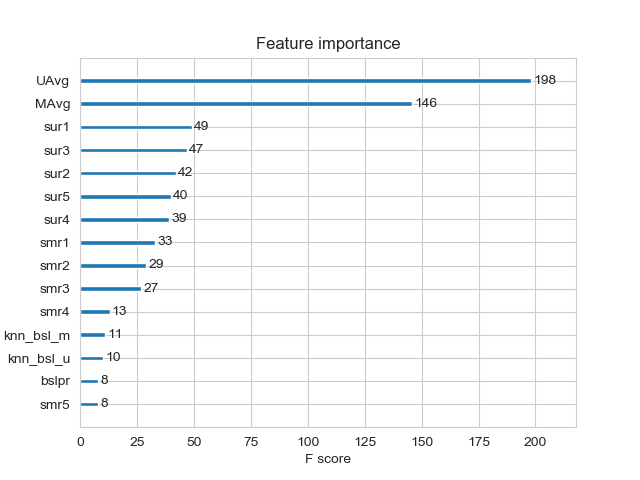

In [43]:
# prepare the train data....
x_train = reg_train.drop(['user', 'movie', 'rating'], axis=1)
y_train = reg_train['rating']

# prepare the train data....
x_test = reg_test_df.drop(['user','movie','rating'], axis=1)
y_test = reg_test_df['rating']

# declare the model
xgb_knn_bsl = xgb.XGBRegressor(n_jobs=10, random_state=15)
train_results, test_results = run_xgboost(xgb_knn_bsl, x_train, y_train, x_test, y_test)

# store the results in models_evaluations dictionaries
models_evaluation_train['xgb_knn_bsl'] = train_results
models_evaluation_test['xgb_knn_bsl'] = test_results


xgb.plot_importance(xgb_knn_bsl)
plt.show()

<h3> 4.4.6 Matrix Factorization Techniques </h3>

<h4> 4.4.6.1 SVD Matrix Factorization User Movie intractions </h4>

In [44]:
from surprise import SVD

http://surprise.readthedocs.io/en/stable/matrix_factorization.html#surprise.prediction_algorithms.matrix_factorization.SVD 

- __ Predicted Rating : __
    - 
    - $ \large  \hat r_{ui} = \mu + b_u + b_i + q_i^Tp_u $
    
        - $\pmb q_i$ - Representation of item(movie) in latent factor space
        
        - $\pmb p_u$ - Representation of user in new latent factor space
        


- A BASIC MATRIX FACTORIZATION MODEL in  https://datajobs.com/data-science-repo/Recommender-Systems-[Netflix].pdf

- __Optimization problem with user item interactions and regularization (to avoid overfitting)__
    - 
    - $\large \sum_{r_{ui} \in R_{train}} \left(r_{ui} - \hat{r}_{ui} \right)^2 +
\lambda\left(b_i^2 + b_u^2 + ||q_i||^2 + ||p_u||^2\right) $

In [45]:
# initiallize the model
svd = SVD(n_factors=100, biased=True, random_state=15, verbose=True)
svd_train_results, svd_test_results = run_surprise(svd, trainset, testset, verbose=True)

# Just store these error metrics in our models_evaluation datastructure
models_evaluation_train['svd'] = svd_train_results 
models_evaluation_test['svd'] = svd_test_results

Training the model...
Processing epoch 0
Processing epoch 1
Processing epoch 2
Processing epoch 3
Processing epoch 4
Processing epoch 5
Processing epoch 6
Processing epoch 7
Processing epoch 8
Processing epoch 9
Processing epoch 10
Processing epoch 11
Processing epoch 12
Processing epoch 13
Processing epoch 14
Processing epoch 15
Processing epoch 16
Processing epoch 17
Processing epoch 18
Processing epoch 19
Done. time taken : 0:00:07.835160 

Evaluating the model with train data..
time taken : 0:00:01.087795
---------------
Train Data
---------------
RMSE : 0.6574721240954099

MAPE : 19.704901088660478

adding train results in the dictionary..

Evaluating for test data...
time taken : 0:00:00.081060
---------------
Test Data
---------------
RMSE : 1.0726046873826458

MAPE : 35.01953535988152

storing the test results in test dictionary...

---------------------------------------------
Total time taken to run this algorithm : 0:00:09.007017


  <h4> 4.4.6.2 SVD Matrix Factorization with implicit feedback from user ( user rated movies ) </h4>

In [46]:
from surprise import SVDpp

- ----->  2.5 Implicit Feedback in http://courses.ischool.berkeley.edu/i290-dm/s11/SECURE/a1-koren.pdf

- __ Predicted Rating : __
    - 
    - $ \large \hat{r}_{ui} = \mu + b_u + b_i + q_i^T\left(p_u +
    |I_u|^{-\frac{1}{2}} \sum_{j \in I_u}y_j\right) $ 

 - $ \pmb{I_u}$ --- the set of all items rated by user u

- $\pmb{y_j}$ --- Our new set of item factors that capture implicit ratings.  

- __Optimization problem with user item interactions and regularization (to avoid overfitting)__
    - 
    - $ \large \sum_{r_{ui} \in R_{train}} \left(r_{ui} - \hat{r}_{ui} \right)^2 +
\lambda\left(b_i^2 + b_u^2 + ||q_i||^2 + ||p_u||^2 + ||y_j||^2\right) $ 

In [47]:
# initiallize the model
svdpp = SVDpp(n_factors=50, random_state=15, verbose=True)
svdpp_train_results, svdpp_test_results = run_surprise(svdpp, trainset, testset, verbose=True)

# Just store these error metrics in our models_evaluation datastructure
models_evaluation_train['svdpp'] = svdpp_train_results 
models_evaluation_test['svdpp'] = svdpp_test_results


Training the model...
 processing epoch 0
 processing epoch 1
 processing epoch 2
 processing epoch 3
 processing epoch 4
 processing epoch 5
 processing epoch 6
 processing epoch 7
 processing epoch 8
 processing epoch 9
 processing epoch 10
 processing epoch 11
 processing epoch 12
 processing epoch 13
 processing epoch 14
 processing epoch 15
 processing epoch 16
 processing epoch 17
 processing epoch 18
 processing epoch 19
Done. time taken : 0:02:02.522069 

Evaluating the model with train data..
time taken : 0:00:05.613101
---------------
Train Data
---------------
RMSE : 0.6032438403305899

MAPE : 17.49285063490268

adding train results in the dictionary..

Evaluating for test data...
time taken : 0:00:00.079057
---------------
Test Data
---------------
RMSE : 1.0728491944183447

MAPE : 35.03817913919887

storing the test results in test dictionary...

---------------------------------------------
Total time taken to run this algorithm : 0:02:08.217230


<h3> 4.4.7 XgBoost with 13 features + Surprise Baseline + Surprise KNNbaseline + MF Techniques </h3>

__Preparing Train data__

In [48]:
# add the predicted values from both knns to this dataframe
reg_train['svd'] = models_evaluation_train['svd']['predictions']
reg_train['svdpp'] = models_evaluation_train['svdpp']['predictions']

reg_train.head(2) 

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,...,smr4,smr5,UAvg,MAvg,rating,bslpr,knn_bsl_u,knn_bsl_m,svd,svdpp
0,53406,33,3.581679,4.0,5.0,5.0,4.0,1.0,5.0,2.0,...,3.0,1.0,3.370370,4.092437,4,3.898982,3.93002,3.867958,4.303764,3.621664
1,99540,33,3.581679,5.0,5.0,5.0,4.0,5.0,3.0,4.0,...,3.0,5.0,3.555556,4.092437,3,3.371403,3.17733,3.076302,3.278967,3.538247


__Preparing Test data  __

In [49]:
reg_test_df['svd'] = models_evaluation_test['svd']['predictions']
reg_test_df['svdpp'] = models_evaluation_test['svdpp']['predictions']

reg_test_df.head(2) 

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,...,smr4,smr5,UAvg,MAvg,rating,bslpr,knn_bsl_u,knn_bsl_m,svd,svdpp
0,808635,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,...,3.581679,3.581679,3.581679,3.581679,5,3.581679,3.581679,3.581679,3.581679,3.581679
1,941866,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,...,3.581679,3.581679,3.581679,3.581679,4,3.581679,3.581679,3.581679,3.581679,3.581679


Training the model..
Done. Time taken : 0:00:02.096532

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0769599573828592
MAPE :  34.431788329400995


<IPython.core.display.Javascript object>


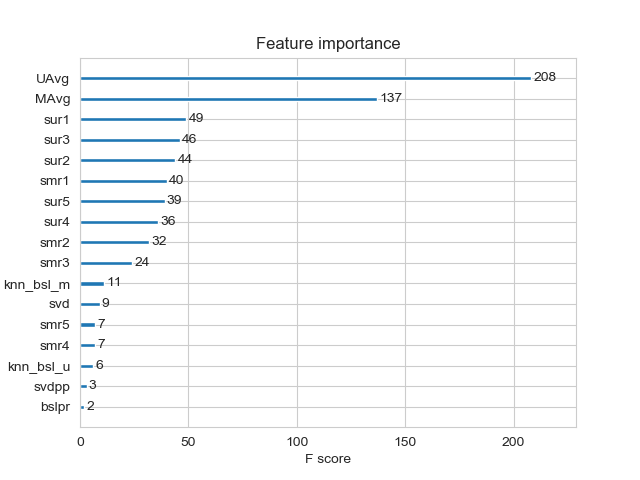

In [50]:
# prepare x_train and y_train
x_train = reg_train.drop(['user', 'movie', 'rating',], axis=1)
y_train = reg_train['rating']

# prepare test data
x_test = reg_test_df.drop(['user', 'movie', 'rating'], axis=1)
y_test = reg_test_df['rating']



xgb_final = xgb.XGBRegressor(n_jobs=10, random_state=15)
train_results, test_results = run_xgboost(xgb_final, x_train, y_train, x_test, y_test)

# store the results in models_evaluations dictionaries
models_evaluation_train['xgb_final'] = train_results
models_evaluation_test['xgb_final'] = test_results


xgb.plot_importance(xgb_final)
plt.show()

<h3> 4.4.8 XgBoost with Surprise Baseline + Surprise KNNbaseline + MF Techniques </h3>

Training the model..
Done. Time taken : 0:00:01.333974

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0753047860953797
MAPE :  35.07058962951319


<IPython.core.display.Javascript object>


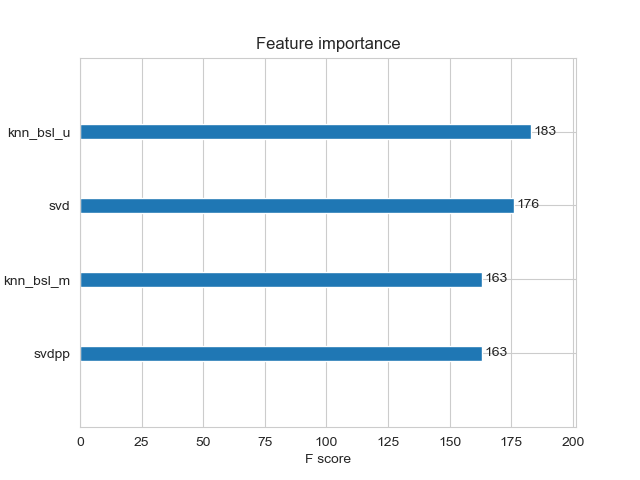

In [51]:
# prepare train data
x_train = reg_train[['knn_bsl_u', 'knn_bsl_m', 'svd', 'svdpp']]
y_train = reg_train['rating']

# test data
x_test = reg_test_df[['knn_bsl_u', 'knn_bsl_m', 'svd', 'svdpp']]
y_test = reg_test_df['rating']


xgb_all_models = xgb.XGBRegressor(n_jobs=10, random_state=15)
train_results, test_results = run_xgboost(xgb_all_models, x_train, y_train, x_test, y_test)

# store the results in models_evaluations dictionaries
models_evaluation_train['xgb_all_models'] = train_results
models_evaluation_test['xgb_all_models'] = test_results

xgb.plot_importance(xgb_all_models)
plt.show()

<h2> 4.5 Comparision between all models </h2>

In [52]:
# Saving our TEST_RESULTS into a dataframe so that you don't have to run it again
pd.DataFrame(models_evaluation_test).to_csv('sample/small/small_sample_results.csv')
models = pd.read_csv('sample/small/small_sample_results.csv', index_col=0)
models.loc['rmse'].sort_values()

svd               1.0726046873826458
knn_bsl_u         1.0726493739667242
knn_bsl_m          1.072758832653683
svdpp             1.0728491944183447
bsl_algo          1.0730330260516174
xgb_all_models    1.0753047860953797
first_algo         1.076373581778953
xgb_bsl           1.0765603714651855
xgb_knn_bsl       1.0767793575625662
xgb_final         1.0769599573828592
Name: rmse, dtype: object

<h1> 5. Assignment </h1>

**Train data for 25k user**
- It took me near about two days to get the data file

<img src='reg_train.jpg'>

In [53]:
############################################################
# It took me almost 2 days to prepare this train dataset.#
############################################################
start = datetime.now()
if os.path.isfile('sample/small/reg_train_25.csv'):
    print("File already exists you don't have to prepare again..." )
else:
    print("Please download the file provided...")

File already exists you don't have to prepare again...


In [54]:
if os.path.isfile('sample/small/reg_test_25.csv'):
    print("It is already created...")
else:
    print("Please download the file provided...")

It is already created...


In [55]:
tuned_models_evaluation_train = dict()
tuned_models_evaluation_test = dict()

tuned_models_evaluation_train, tuned_models_evaluation_test

({}, {})

**Loading train and test**

In [56]:
reg_train = pd.read_csv('sample/small/reg_train_25.csv', names = ['user', 'movie', 'GAvg', 'sur1', 'sur2', 'sur3', 'sur4', 'sur5','smr1', 'smr2', 'smr3', 'smr4', 'smr5', 'UAvg', 'MAvg', 'rating'], header=None)
reg_train.head()

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,smr3,smr4,smr5,UAvg,MAvg,rating
0,174683,10,3.587581,5.0,5.0,3.0,4.0,4.0,3.0,5.0,4.0,3.0,2.0,3.882353,3.611111,5
1,233949,10,3.587581,4.0,4.0,5.0,1.0,3.0,2.0,3.0,2.0,3.0,3.0,2.692308,3.611111,3
2,555770,10,3.587581,4.0,5.0,4.0,4.0,5.0,4.0,2.0,5.0,4.0,4.0,3.795455,3.611111,4
3,767518,10,3.587581,2.0,5.0,4.0,4.0,3.0,5.0,5.0,4.0,4.0,3.0,3.884615,3.611111,5
4,894393,10,3.587581,3.0,5.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.000000,3.611111,4


In [57]:
reg_test_df = pd.read_csv('sample/small/reg_test_25.csv', names = ['user', 'movie', 'GAvg', 'sur1', 'sur2', 'sur3', 'sur4', 'sur5',
                                                          'smr1', 'smr2', 'smr3', 'smr4', 'smr5',
                                                          'UAvg', 'MAvg', 'rating'], header=None)
reg_test_df.head(4)

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,smr3,smr4,smr5,UAvg,MAvg,rating
0,808635,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,5
1,941866,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,4
2,1737912,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3
3,1849204,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,4


**Considering only below hyperparameter for training for every model**

**Tuning less parameter due to less computational power**
-  learning_rate = [0.01,0.05,0.1,0.2]
-  max_depth = [5,10,15,20],
-  min_child_weight = [2,4,6]


In [58]:
param_grid = dict(
    learning_rate = [0.01,0.05,0.1],
    max_depth = [10,15,20],
    min_child_weight = [2,4,6]
)

In [59]:
from sklearn.model_selection import GridSearchCV
from xgboost.sklearn import XGBRegressor

### 5.1 Tuning XGBoost with initial 13 features

In [60]:
# prepare Train data
x_train = reg_train.drop(['user','movie','rating'], axis=1)
y_train = reg_train['rating']

# Prepare Test data
x_test = reg_test_df.drop(['user','movie','rating'], axis=1)
y_test = reg_test_df['rating']


In [61]:
# making model ready for tuning
xgb = XGBRegressor(silent=False, n_jobs=-1)
xgb_knn_bsl = GridSearchCV(xgb,param_grid,cv = 5)

In [62]:
train_results, test_results = run_xgboost(xgb_knn_bsl, x_train, y_train, x_test, y_test)

# store the results in models_evaluations dictionaries
tuned_models_evaluation_train['first_algo'] = train_results
tuned_models_evaluation_test['first_algo'] = test_results

Training the model..
[12:23:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1366 extra nodes, 0 pruned nodes, max_depth=10
[12:23:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1388 extra nodes, 0 pruned nodes, max_depth=10
[12:23:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1390 extra nodes, 0 pruned nodes, max_depth=10
[12:23:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1396 extra nodes, 0 pruned nodes, max_depth=10
[12:23:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1400 extra nodes, 0 pruned nodes, max_depth=10
[12:23:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1400 extra nodes, 0 pruned nodes, max_depth=10
[12:23:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1392 extra nodes, 0 pruned nodes, max_depth=10
[12:23:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1416 extra nodes, 0 pruned nodes, max_depth=10
[12:23:29] src/tree/updater_prune.cc:74: tree pruning end, 

[12:23:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1756 extra nodes, 0 pruned nodes, max_depth=10
[12:23:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1806 extra nodes, 0 pruned nodes, max_depth=10
[12:23:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1622 extra nodes, 0 pruned nodes, max_depth=10
[12:23:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1660 extra nodes, 0 pruned nodes, max_depth=10
[12:23:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1666 extra nodes, 0 pruned nodes, max_depth=10
[12:23:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1764 extra nodes, 0 pruned nodes, max_depth=10
[12:23:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1616 extra nodes, 0 pruned nodes, max_depth=10
[12:23:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1786 extra nodes, 0 pruned nodes, max_depth=10
[12:23:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1696 extra n

[12:23:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1634 extra nodes, 0 pruned nodes, max_depth=10
[12:23:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1670 extra nodes, 0 pruned nodes, max_depth=10
[12:23:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1572 extra nodes, 0 pruned nodes, max_depth=10
[12:23:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1600 extra nodes, 0 pruned nodes, max_depth=10
[12:23:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1586 extra nodes, 0 pruned nodes, max_depth=10
[12:23:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1642 extra nodes, 0 pruned nodes, max_depth=10
[12:23:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1614 extra nodes, 0 pruned nodes, max_depth=10
[12:23:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1658 extra nodes, 0 pruned nodes, max_depth=10
[12:23:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1598 extra n

[12:23:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1460 extra nodes, 0 pruned nodes, max_depth=10
[12:23:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1574 extra nodes, 0 pruned nodes, max_depth=10
[12:23:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1594 extra nodes, 0 pruned nodes, max_depth=10
[12:23:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1486 extra nodes, 0 pruned nodes, max_depth=10
[12:23:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1554 extra nodes, 0 pruned nodes, max_depth=10
[12:23:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1504 extra nodes, 0 pruned nodes, max_depth=10
[12:23:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1584 extra nodes, 0 pruned nodes, max_depth=10
[12:23:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1530 extra nodes, 0 pruned nodes, max_depth=10
[12:23:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1604 extra n

[12:23:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1786 extra nodes, 0 pruned nodes, max_depth=10
[12:23:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1782 extra nodes, 0 pruned nodes, max_depth=10
[12:23:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1740 extra nodes, 0 pruned nodes, max_depth=10
[12:23:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1798 extra nodes, 0 pruned nodes, max_depth=10
[12:23:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1766 extra nodes, 0 pruned nodes, max_depth=10
[12:23:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1774 extra nodes, 0 pruned nodes, max_depth=10
[12:23:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1796 extra nodes, 0 pruned nodes, max_depth=10
[12:23:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1828 extra nodes, 0 pruned nodes, max_depth=10
[12:23:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1790 extra n

[12:24:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1652 extra nodes, 0 pruned nodes, max_depth=10
[12:24:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1760 extra nodes, 0 pruned nodes, max_depth=10
[12:24:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1754 extra nodes, 0 pruned nodes, max_depth=10
[12:24:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1654 extra nodes, 0 pruned nodes, max_depth=10
[12:24:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1730 extra nodes, 0 pruned nodes, max_depth=10
[12:24:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1722 extra nodes, 0 pruned nodes, max_depth=10
[12:24:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1810 extra nodes, 0 pruned nodes, max_depth=10
[12:24:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1670 extra nodes, 0 pruned nodes, max_depth=10
[12:24:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1728 extra n

[12:24:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1562 extra nodes, 0 pruned nodes, max_depth=10
[12:24:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1584 extra nodes, 0 pruned nodes, max_depth=10
[12:24:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1612 extra nodes, 0 pruned nodes, max_depth=10
[12:24:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1500 extra nodes, 0 pruned nodes, max_depth=10
[12:24:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1638 extra nodes, 0 pruned nodes, max_depth=10
[12:24:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1504 extra nodes, 0 pruned nodes, max_depth=10
[12:24:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1548 extra nodes, 0 pruned nodes, max_depth=10
[12:24:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1680 extra nodes, 0 pruned nodes, max_depth=10
[12:24:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1612 extra n

[12:24:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1356 extra nodes, 0 pruned nodes, max_depth=10
[12:24:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1358 extra nodes, 0 pruned nodes, max_depth=10
[12:24:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1376 extra nodes, 0 pruned nodes, max_depth=10
[12:24:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1404 extra nodes, 0 pruned nodes, max_depth=10
[12:24:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1368 extra nodes, 0 pruned nodes, max_depth=10
[12:24:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1400 extra nodes, 0 pruned nodes, max_depth=10
[12:24:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1378 extra nodes, 0 pruned nodes, max_depth=10
[12:24:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1438 extra nodes, 0 pruned nodes, max_depth=10
[12:24:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1428 extra n

[12:24:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1658 extra nodes, 0 pruned nodes, max_depth=10
[12:24:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1540 extra nodes, 0 pruned nodes, max_depth=10
[12:24:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1666 extra nodes, 0 pruned nodes, max_depth=10
[12:24:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1536 extra nodes, 0 pruned nodes, max_depth=10
[12:24:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1646 extra nodes, 0 pruned nodes, max_depth=10
[12:24:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1708 extra nodes, 0 pruned nodes, max_depth=10
[12:24:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1570 extra nodes, 0 pruned nodes, max_depth=10
[12:24:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1572 extra nodes, 0 pruned nodes, max_depth=10
[12:24:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1764 extra n

[12:24:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1568 extra nodes, 0 pruned nodes, max_depth=10
[12:24:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1560 extra nodes, 0 pruned nodes, max_depth=10
[12:24:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1528 extra nodes, 0 pruned nodes, max_depth=10
[12:24:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1558 extra nodes, 0 pruned nodes, max_depth=10
[12:24:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1586 extra nodes, 0 pruned nodes, max_depth=10
[12:24:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1612 extra nodes, 0 pruned nodes, max_depth=10
[12:24:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1560 extra nodes, 0 pruned nodes, max_depth=10
[12:24:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1572 extra nodes, 0 pruned nodes, max_depth=10
[12:24:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1622 extra n

[12:24:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1464 extra nodes, 0 pruned nodes, max_depth=10
[12:24:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1558 extra nodes, 0 pruned nodes, max_depth=10
[12:24:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1482 extra nodes, 0 pruned nodes, max_depth=10
[12:24:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1572 extra nodes, 0 pruned nodes, max_depth=10
[12:24:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1466 extra nodes, 0 pruned nodes, max_depth=10
[12:24:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1578 extra nodes, 0 pruned nodes, max_depth=10
[12:24:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1528 extra nodes, 0 pruned nodes, max_depth=10
[12:24:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1598 extra nodes, 0 pruned nodes, max_depth=10
[12:24:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1518 extra n

[12:24:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1320 extra nodes, 0 pruned nodes, max_depth=10
[12:24:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1362 extra nodes, 0 pruned nodes, max_depth=10
[12:24:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1344 extra nodes, 0 pruned nodes, max_depth=10
[12:24:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1380 extra nodes, 0 pruned nodes, max_depth=10
[12:24:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1376 extra nodes, 0 pruned nodes, max_depth=10
[12:24:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1382 extra nodes, 0 pruned nodes, max_depth=10
[12:24:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1388 extra nodes, 0 pruned nodes, max_depth=10
[12:24:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1350 extra nodes, 0 pruned nodes, max_depth=10
[12:24:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1382 extra n

[12:24:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1576 extra nodes, 0 pruned nodes, max_depth=10
[12:24:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1674 extra nodes, 0 pruned nodes, max_depth=10
[12:24:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1600 extra nodes, 0 pruned nodes, max_depth=10
[12:24:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1590 extra nodes, 0 pruned nodes, max_depth=10
[12:24:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1612 extra nodes, 0 pruned nodes, max_depth=10
[12:24:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1682 extra nodes, 0 pruned nodes, max_depth=10
[12:24:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1652 extra nodes, 0 pruned nodes, max_depth=10
[12:24:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1732 extra nodes, 0 pruned nodes, max_depth=10
[12:24:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1608 extra n

[12:24:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1586 extra nodes, 0 pruned nodes, max_depth=10
[12:24:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1540 extra nodes, 0 pruned nodes, max_depth=10
[12:24:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1482 extra nodes, 0 pruned nodes, max_depth=10
[12:24:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1598 extra nodes, 0 pruned nodes, max_depth=10
[12:24:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1590 extra nodes, 0 pruned nodes, max_depth=10
[12:24:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1544 extra nodes, 0 pruned nodes, max_depth=10
[12:24:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1634 extra nodes, 0 pruned nodes, max_depth=10
[12:24:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1498 extra nodes, 0 pruned nodes, max_depth=10
[12:24:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1610 extra n

[12:24:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1402 extra nodes, 0 pruned nodes, max_depth=10
[12:24:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1328 extra nodes, 0 pruned nodes, max_depth=10
[12:24:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1418 extra nodes, 0 pruned nodes, max_depth=10
[12:24:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1352 extra nodes, 0 pruned nodes, max_depth=10
[12:24:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1422 extra nodes, 0 pruned nodes, max_depth=10
[12:24:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1306 extra nodes, 0 pruned nodes, max_depth=10
[12:24:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1408 extra nodes, 0 pruned nodes, max_depth=10
[12:24:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1300 extra nodes, 0 pruned nodes, max_depth=10
[12:24:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1452 extra n

[12:25:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1630 extra nodes, 0 pruned nodes, max_depth=10
[12:25:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1684 extra nodes, 0 pruned nodes, max_depth=10
[12:25:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1500 extra nodes, 0 pruned nodes, max_depth=10
[12:25:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1648 extra nodes, 0 pruned nodes, max_depth=10
[12:25:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1674 extra nodes, 0 pruned nodes, max_depth=10
[12:25:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1546 extra nodes, 0 pruned nodes, max_depth=10
[12:25:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1500 extra nodes, 0 pruned nodes, max_depth=10
[12:25:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1626 extra nodes, 0 pruned nodes, max_depth=10
[12:25:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1674 extra n

[12:25:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1534 extra nodes, 0 pruned nodes, max_depth=10
[12:25:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1574 extra nodes, 0 pruned nodes, max_depth=10
[12:25:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1568 extra nodes, 0 pruned nodes, max_depth=10
[12:25:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1562 extra nodes, 0 pruned nodes, max_depth=10
[12:25:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1534 extra nodes, 0 pruned nodes, max_depth=10
[12:25:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1572 extra nodes, 0 pruned nodes, max_depth=10
[12:25:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1542 extra nodes, 0 pruned nodes, max_depth=10
[12:25:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1570 extra nodes, 0 pruned nodes, max_depth=10
[12:25:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1498 extra n

[12:25:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1544 extra nodes, 0 pruned nodes, max_depth=10
[12:25:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1472 extra nodes, 0 pruned nodes, max_depth=10
[12:25:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1544 extra nodes, 0 pruned nodes, max_depth=10
[12:25:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1544 extra nodes, 0 pruned nodes, max_depth=10
[12:25:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1462 extra nodes, 0 pruned nodes, max_depth=10
[12:25:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1564 extra nodes, 0 pruned nodes, max_depth=10
[12:25:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1564 extra nodes, 0 pruned nodes, max_depth=10
[12:25:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1486 extra nodes, 0 pruned nodes, max_depth=10
[12:25:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1586 extra n

[12:25:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1354 extra nodes, 0 pruned nodes, max_depth=10
[12:25:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1362 extra nodes, 0 pruned nodes, max_depth=10
[12:25:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1360 extra nodes, 0 pruned nodes, max_depth=10
[12:25:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1352 extra nodes, 0 pruned nodes, max_depth=10
[12:25:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1372 extra nodes, 0 pruned nodes, max_depth=10
[12:25:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1376 extra nodes, 0 pruned nodes, max_depth=10
[12:25:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1368 extra nodes, 0 pruned nodes, max_depth=10
[12:25:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1328 extra nodes, 0 pruned nodes, max_depth=10
[12:25:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1378 extra n

[12:25:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1656 extra nodes, 0 pruned nodes, max_depth=10
[12:25:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1546 extra nodes, 0 pruned nodes, max_depth=10
[12:25:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1582 extra nodes, 0 pruned nodes, max_depth=10
[12:25:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1610 extra nodes, 0 pruned nodes, max_depth=10
[12:25:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1594 extra nodes, 0 pruned nodes, max_depth=10
[12:25:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1608 extra nodes, 0 pruned nodes, max_depth=10
[12:25:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1624 extra nodes, 0 pruned nodes, max_depth=10
[12:25:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1592 extra nodes, 0 pruned nodes, max_depth=10
[12:25:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1622 extra n

[12:25:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1536 extra nodes, 0 pruned nodes, max_depth=10
[12:25:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1520 extra nodes, 0 pruned nodes, max_depth=10
[12:25:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1614 extra nodes, 0 pruned nodes, max_depth=10
[12:25:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1538 extra nodes, 0 pruned nodes, max_depth=10
[12:25:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1568 extra nodes, 0 pruned nodes, max_depth=10
[12:25:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1592 extra nodes, 0 pruned nodes, max_depth=10
[12:25:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1532 extra nodes, 0 pruned nodes, max_depth=10
[12:25:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1536 extra nodes, 0 pruned nodes, max_depth=10
[12:25:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1606 extra n

[12:25:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8496 extra nodes, 0 pruned nodes, max_depth=15
[12:25:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8670 extra nodes, 0 pruned nodes, max_depth=15
[12:25:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9152 extra nodes, 0 pruned nodes, max_depth=15
[12:25:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8910 extra nodes, 0 pruned nodes, max_depth=15
[12:25:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9096 extra nodes, 0 pruned nodes, max_depth=15
[12:25:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8928 extra nodes, 0 pruned nodes, max_depth=15
[12:25:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9286 extra nodes, 0 pruned nodes, max_depth=15
[12:25:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8900 extra nodes, 0 pruned nodes, max_depth=15
[12:25:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8934 extra n

[12:25:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16278 extra nodes, 0 pruned nodes, max_depth=15
[12:25:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15670 extra nodes, 0 pruned nodes, max_depth=15
[12:25:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16142 extra nodes, 0 pruned nodes, max_depth=15
[12:25:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16346 extra nodes, 0 pruned nodes, max_depth=15
[12:26:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5588 extra nodes, 0 pruned nodes, max_depth=15
[12:26:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5768 extra nodes, 0 pruned nodes, max_depth=15
[12:26:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5898 extra nodes, 0 pruned nodes, max_depth=15
[12:26:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6098 extra nodes, 0 pruned nodes, max_depth=15
[12:26:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6146 ext

[12:26:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14244 extra nodes, 0 pruned nodes, max_depth=15
[12:26:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13882 extra nodes, 0 pruned nodes, max_depth=15
[12:26:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14240 extra nodes, 0 pruned nodes, max_depth=15
[12:26:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14290 extra nodes, 0 pruned nodes, max_depth=15
[12:26:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14676 extra nodes, 0 pruned nodes, max_depth=15
[12:26:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14370 extra nodes, 0 pruned nodes, max_depth=15
[12:26:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14306 extra nodes, 0 pruned nodes, max_depth=15
[12:26:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14198 extra nodes, 0 pruned nodes, max_depth=15
[12:26:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1446

[12:26:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9938 extra nodes, 0 pruned nodes, max_depth=15
[12:26:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10286 extra nodes, 0 pruned nodes, max_depth=15
[12:26:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10152 extra nodes, 0 pruned nodes, max_depth=15
[12:26:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10828 extra nodes, 0 pruned nodes, max_depth=15
[12:26:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10398 extra nodes, 0 pruned nodes, max_depth=15
[12:26:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10844 extra nodes, 0 pruned nodes, max_depth=15
[12:26:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10892 extra nodes, 0 pruned nodes, max_depth=15
[12:26:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11044 extra nodes, 0 pruned nodes, max_depth=15
[12:26:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10956

[12:26:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6994 extra nodes, 0 pruned nodes, max_depth=15
[12:26:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6976 extra nodes, 0 pruned nodes, max_depth=15
[12:26:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6830 extra nodes, 0 pruned nodes, max_depth=15
[12:26:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7040 extra nodes, 0 pruned nodes, max_depth=15
[12:26:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7468 extra nodes, 0 pruned nodes, max_depth=15
[12:26:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7306 extra nodes, 0 pruned nodes, max_depth=15
[12:26:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7390 extra nodes, 0 pruned nodes, max_depth=15
[12:26:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7396 extra nodes, 0 pruned nodes, max_depth=15
[12:26:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8028 extra n

[12:26:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14768 extra nodes, 0 pruned nodes, max_depth=15
[12:26:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14820 extra nodes, 0 pruned nodes, max_depth=15
[12:26:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14586 extra nodes, 0 pruned nodes, max_depth=15
[12:26:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14668 extra nodes, 0 pruned nodes, max_depth=15
[12:26:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14842 extra nodes, 0 pruned nodes, max_depth=15
[12:26:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15324 extra nodes, 0 pruned nodes, max_depth=15
[12:26:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15694 extra nodes, 0 pruned nodes, max_depth=15
[12:26:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15776 extra nodes, 0 pruned nodes, max_depth=15
[12:26:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1614

[12:26:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11782 extra nodes, 0 pruned nodes, max_depth=15
[12:26:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12016 extra nodes, 0 pruned nodes, max_depth=15
[12:26:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11970 extra nodes, 0 pruned nodes, max_depth=15
[12:26:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12218 extra nodes, 0 pruned nodes, max_depth=15
[12:26:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12472 extra nodes, 0 pruned nodes, max_depth=15
[12:26:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12398 extra nodes, 0 pruned nodes, max_depth=15
[12:26:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12630 extra nodes, 0 pruned nodes, max_depth=15
[12:26:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12774 extra nodes, 0 pruned nodes, max_depth=15
[12:26:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1259

[12:27:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6920 extra nodes, 0 pruned nodes, max_depth=15
[12:27:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7100 extra nodes, 0 pruned nodes, max_depth=15
[12:27:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7220 extra nodes, 0 pruned nodes, max_depth=15
[12:27:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7110 extra nodes, 0 pruned nodes, max_depth=15
[12:27:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7242 extra nodes, 0 pruned nodes, max_depth=15
[12:27:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7458 extra nodes, 0 pruned nodes, max_depth=15
[12:27:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7084 extra nodes, 0 pruned nodes, max_depth=15
[12:27:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7510 extra nodes, 0 pruned nodes, max_depth=15
[12:27:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7192 extra n

[12:27:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12874 extra nodes, 0 pruned nodes, max_depth=15
[12:27:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12884 extra nodes, 0 pruned nodes, max_depth=15
[12:27:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4404 extra nodes, 0 pruned nodes, max_depth=15
[12:27:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4548 extra nodes, 0 pruned nodes, max_depth=15
[12:27:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4700 extra nodes, 0 pruned nodes, max_depth=15
[12:27:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4824 extra nodes, 0 pruned nodes, max_depth=15
[12:27:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4808 extra nodes, 0 pruned nodes, max_depth=15
[12:27:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4992 extra nodes, 0 pruned nodes, max_depth=15
[12:27:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4906 extra

[12:27:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11472 extra nodes, 0 pruned nodes, max_depth=15
[12:27:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11278 extra nodes, 0 pruned nodes, max_depth=15
[12:27:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11652 extra nodes, 0 pruned nodes, max_depth=15
[12:27:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11680 extra nodes, 0 pruned nodes, max_depth=15
[12:27:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11530 extra nodes, 0 pruned nodes, max_depth=15
[12:27:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11938 extra nodes, 0 pruned nodes, max_depth=15
[12:27:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11462 extra nodes, 0 pruned nodes, max_depth=15
[12:27:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12194 extra nodes, 0 pruned nodes, max_depth=15
[12:27:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1219

[12:27:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8088 extra nodes, 0 pruned nodes, max_depth=15
[12:27:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8572 extra nodes, 0 pruned nodes, max_depth=15
[12:27:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8656 extra nodes, 0 pruned nodes, max_depth=15
[12:27:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8938 extra nodes, 0 pruned nodes, max_depth=15
[12:27:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8508 extra nodes, 0 pruned nodes, max_depth=15
[12:27:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8906 extra nodes, 0 pruned nodes, max_depth=15
[12:27:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9136 extra nodes, 0 pruned nodes, max_depth=15
[12:27:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9192 extra nodes, 0 pruned nodes, max_depth=15
[12:27:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8832 extra n

[12:27:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5578 extra nodes, 0 pruned nodes, max_depth=15
[12:27:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5762 extra nodes, 0 pruned nodes, max_depth=15
[12:27:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5752 extra nodes, 0 pruned nodes, max_depth=15
[12:27:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5840 extra nodes, 0 pruned nodes, max_depth=15
[12:27:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6104 extra nodes, 0 pruned nodes, max_depth=15
[12:27:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5946 extra nodes, 0 pruned nodes, max_depth=15
[12:27:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6428 extra nodes, 0 pruned nodes, max_depth=15
[12:27:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6134 extra nodes, 0 pruned nodes, max_depth=15
[12:27:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6280 extra n

[12:28:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12494 extra nodes, 0 pruned nodes, max_depth=15
[12:28:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11800 extra nodes, 0 pruned nodes, max_depth=15
[12:28:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12598 extra nodes, 0 pruned nodes, max_depth=15
[12:28:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12804 extra nodes, 0 pruned nodes, max_depth=15
[12:28:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12020 extra nodes, 0 pruned nodes, max_depth=15
[12:28:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12246 extra nodes, 0 pruned nodes, max_depth=15
[12:28:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13116 extra nodes, 0 pruned nodes, max_depth=15
[12:28:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12754 extra nodes, 0 pruned nodes, max_depth=15
[12:28:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1239

[12:28:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10232 extra nodes, 0 pruned nodes, max_depth=15
[12:28:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9902 extra nodes, 0 pruned nodes, max_depth=15
[12:28:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10544 extra nodes, 0 pruned nodes, max_depth=15
[12:28:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10366 extra nodes, 0 pruned nodes, max_depth=15
[12:28:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10464 extra nodes, 0 pruned nodes, max_depth=15
[12:28:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10638 extra nodes, 0 pruned nodes, max_depth=15
[12:28:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10350 extra nodes, 0 pruned nodes, max_depth=15
[12:28:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10420 extra nodes, 0 pruned nodes, max_depth=15
[12:28:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10608

[12:28:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6340 extra nodes, 0 pruned nodes, max_depth=15
[12:28:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6056 extra nodes, 0 pruned nodes, max_depth=15
[12:28:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6236 extra nodes, 0 pruned nodes, max_depth=15
[12:28:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6590 extra nodes, 0 pruned nodes, max_depth=15
[12:28:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6376 extra nodes, 0 pruned nodes, max_depth=15
[12:28:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6682 extra nodes, 0 pruned nodes, max_depth=15
[12:28:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6586 extra nodes, 0 pruned nodes, max_depth=15
[12:28:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6810 extra nodes, 0 pruned nodes, max_depth=15
[12:28:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6836 extra n

[12:28:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3984 extra nodes, 0 pruned nodes, max_depth=15
[12:28:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4184 extra nodes, 0 pruned nodes, max_depth=15
[12:28:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4078 extra nodes, 0 pruned nodes, max_depth=15
[12:28:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4194 extra nodes, 0 pruned nodes, max_depth=15
[12:28:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4304 extra nodes, 0 pruned nodes, max_depth=15
[12:28:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4420 extra nodes, 0 pruned nodes, max_depth=15
[12:28:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4430 extra nodes, 0 pruned nodes, max_depth=15
[12:28:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4588 extra nodes, 0 pruned nodes, max_depth=15
[12:28:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4566 extra n

[12:28:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10214 extra nodes, 0 pruned nodes, max_depth=15
[12:28:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10144 extra nodes, 0 pruned nodes, max_depth=15
[12:28:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10394 extra nodes, 0 pruned nodes, max_depth=15
[12:28:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10626 extra nodes, 0 pruned nodes, max_depth=15
[12:28:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10478 extra nodes, 0 pruned nodes, max_depth=15
[12:28:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10496 extra nodes, 0 pruned nodes, max_depth=15
[12:28:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10794 extra nodes, 0 pruned nodes, max_depth=15
[12:28:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10362 extra nodes, 0 pruned nodes, max_depth=15
[12:28:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1048

[12:28:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7702 extra nodes, 0 pruned nodes, max_depth=15
[12:28:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7960 extra nodes, 0 pruned nodes, max_depth=15
[12:28:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7826 extra nodes, 0 pruned nodes, max_depth=15
[12:28:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8074 extra nodes, 0 pruned nodes, max_depth=15
[12:28:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7872 extra nodes, 0 pruned nodes, max_depth=15
[12:28:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8210 extra nodes, 0 pruned nodes, max_depth=15
[12:28:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7980 extra nodes, 0 pruned nodes, max_depth=15
[12:28:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8340 extra nodes, 0 pruned nodes, max_depth=15
[12:28:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8284 extra n

[12:29:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5326 extra nodes, 0 pruned nodes, max_depth=15
[12:29:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5284 extra nodes, 0 pruned nodes, max_depth=15
[12:29:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5440 extra nodes, 0 pruned nodes, max_depth=15
[12:29:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5432 extra nodes, 0 pruned nodes, max_depth=15
[12:29:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5492 extra nodes, 0 pruned nodes, max_depth=15
[12:29:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5694 extra nodes, 0 pruned nodes, max_depth=15
[12:29:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5644 extra nodes, 0 pruned nodes, max_depth=15
[12:29:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5988 extra nodes, 0 pruned nodes, max_depth=15
[12:29:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5836 extra n

[12:29:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10652 extra nodes, 0 pruned nodes, max_depth=15
[12:29:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11078 extra nodes, 0 pruned nodes, max_depth=15
[12:29:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10738 extra nodes, 0 pruned nodes, max_depth=15
[12:29:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11038 extra nodes, 0 pruned nodes, max_depth=15
[12:29:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10720 extra nodes, 0 pruned nodes, max_depth=15
[12:29:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11132 extra nodes, 0 pruned nodes, max_depth=15
[12:29:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10584 extra nodes, 0 pruned nodes, max_depth=15
[12:29:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11130 extra nodes, 0 pruned nodes, max_depth=15
[12:29:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3532

[12:29:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9092 extra nodes, 0 pruned nodes, max_depth=15
[12:29:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8910 extra nodes, 0 pruned nodes, max_depth=15
[12:29:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9218 extra nodes, 0 pruned nodes, max_depth=15
[12:29:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8886 extra nodes, 0 pruned nodes, max_depth=15
[12:29:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9436 extra nodes, 0 pruned nodes, max_depth=15
[12:29:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8934 extra nodes, 0 pruned nodes, max_depth=15
[12:29:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9066 extra nodes, 0 pruned nodes, max_depth=15
[12:29:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9812 extra nodes, 0 pruned nodes, max_depth=15
[12:29:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9636 extra n

[12:29:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14844 extra nodes, 0 pruned nodes, max_depth=20
[12:29:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15070 extra nodes, 0 pruned nodes, max_depth=20
[12:29:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15818 extra nodes, 0 pruned nodes, max_depth=20
[12:29:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16204 extra nodes, 0 pruned nodes, max_depth=20
[12:29:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16652 extra nodes, 0 pruned nodes, max_depth=20
[12:29:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16602 extra nodes, 0 pruned nodes, max_depth=20
[12:29:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16732 extra nodes, 0 pruned nodes, max_depth=20
[12:29:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17108 extra nodes, 0 pruned nodes, max_depth=20
[12:29:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1756

[12:29:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8156 extra nodes, 0 pruned nodes, max_depth=20
[12:29:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8402 extra nodes, 0 pruned nodes, max_depth=20
[12:29:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8788 extra nodes, 0 pruned nodes, max_depth=20
[12:29:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8886 extra nodes, 0 pruned nodes, max_depth=20
[12:29:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9124 extra nodes, 0 pruned nodes, max_depth=20
[12:29:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9226 extra nodes, 0 pruned nodes, max_depth=20
[12:29:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9954 extra nodes, 0 pruned nodes, max_depth=20
[12:29:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9232 extra nodes, 0 pruned nodes, max_depth=20
[12:29:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10186 extra 

[12:30:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30974 extra nodes, 0 pruned nodes, max_depth=20
[12:30:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 31004 extra nodes, 0 pruned nodes, max_depth=20
[12:30:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 31852 extra nodes, 0 pruned nodes, max_depth=20
[12:30:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33074 extra nodes, 0 pruned nodes, max_depth=20
[12:30:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33306 extra nodes, 0 pruned nodes, max_depth=20
[12:30:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32148 extra nodes, 0 pruned nodes, max_depth=20
[12:30:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33140 extra nodes, 0 pruned nodes, max_depth=20
[12:30:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33196 extra nodes, 0 pruned nodes, max_depth=20
[12:30:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3346

[12:30:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19866 extra nodes, 0 pruned nodes, max_depth=20
[12:30:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19856 extra nodes, 0 pruned nodes, max_depth=20
[12:30:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19980 extra nodes, 0 pruned nodes, max_depth=20
[12:30:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20170 extra nodes, 0 pruned nodes, max_depth=20
[12:30:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21144 extra nodes, 0 pruned nodes, max_depth=20
[12:30:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20582 extra nodes, 0 pruned nodes, max_depth=20
[12:30:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21138 extra nodes, 0 pruned nodes, max_depth=20
[12:30:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21512 extra nodes, 0 pruned nodes, max_depth=20
[12:30:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2192

[12:30:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10962 extra nodes, 0 pruned nodes, max_depth=20
[12:30:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11202 extra nodes, 0 pruned nodes, max_depth=20
[12:30:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11370 extra nodes, 0 pruned nodes, max_depth=20
[12:30:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11942 extra nodes, 0 pruned nodes, max_depth=20
[12:30:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12150 extra nodes, 0 pruned nodes, max_depth=20
[12:30:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12476 extra nodes, 0 pruned nodes, max_depth=20
[12:30:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12612 extra nodes, 0 pruned nodes, max_depth=20
[12:30:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12938 extra nodes, 0 pruned nodes, max_depth=20
[12:30:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1341

[12:30:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36724 extra nodes, 0 pruned nodes, max_depth=20
[12:30:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36824 extra nodes, 0 pruned nodes, max_depth=20
[12:30:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35980 extra nodes, 0 pruned nodes, max_depth=20
[12:30:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 37642 extra nodes, 0 pruned nodes, max_depth=20
[12:30:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 37836 extra nodes, 0 pruned nodes, max_depth=20
[12:30:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 37994 extra nodes, 0 pruned nodes, max_depth=20
[12:30:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 38300 extra nodes, 0 pruned nodes, max_depth=20
[12:30:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6464 extra nodes, 0 pruned nodes, max_depth=20
[12:30:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6818 

[12:31:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23426 extra nodes, 0 pruned nodes, max_depth=20
[12:31:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23910 extra nodes, 0 pruned nodes, max_depth=20
[12:31:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24856 extra nodes, 0 pruned nodes, max_depth=20
[12:31:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25102 extra nodes, 0 pruned nodes, max_depth=20
[12:31:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26210 extra nodes, 0 pruned nodes, max_depth=20
[12:31:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25728 extra nodes, 0 pruned nodes, max_depth=20
[12:31:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26730 extra nodes, 0 pruned nodes, max_depth=20
[12:31:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26884 extra nodes, 0 pruned nodes, max_depth=20
[12:31:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2818

[12:31:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10540 extra nodes, 0 pruned nodes, max_depth=20
[12:31:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10498 extra nodes, 0 pruned nodes, max_depth=20
[12:31:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10842 extra nodes, 0 pruned nodes, max_depth=20
[12:31:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11048 extra nodes, 0 pruned nodes, max_depth=20
[12:31:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11310 extra nodes, 0 pruned nodes, max_depth=20
[12:31:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11310 extra nodes, 0 pruned nodes, max_depth=20
[12:31:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11966 extra nodes, 0 pruned nodes, max_depth=20
[12:31:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11850 extra nodes, 0 pruned nodes, max_depth=20
[12:31:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1214

[12:31:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5490 extra nodes, 0 pruned nodes, max_depth=20
[12:31:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5790 extra nodes, 0 pruned nodes, max_depth=20
[12:31:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5972 extra nodes, 0 pruned nodes, max_depth=20
[12:31:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6092 extra nodes, 0 pruned nodes, max_depth=20
[12:31:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6192 extra nodes, 0 pruned nodes, max_depth=20
[12:31:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6544 extra nodes, 0 pruned nodes, max_depth=20
[12:31:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6644 extra nodes, 0 pruned nodes, max_depth=20
[12:31:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6666 extra nodes, 0 pruned nodes, max_depth=20
[12:31:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6924 extra n

[12:31:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21238 extra nodes, 0 pruned nodes, max_depth=20
[12:31:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21832 extra nodes, 0 pruned nodes, max_depth=20
[12:31:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22806 extra nodes, 0 pruned nodes, max_depth=20
[12:31:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23238 extra nodes, 0 pruned nodes, max_depth=20
[12:31:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22996 extra nodes, 0 pruned nodes, max_depth=20
[12:31:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23690 extra nodes, 0 pruned nodes, max_depth=20
[12:31:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24148 extra nodes, 0 pruned nodes, max_depth=20
[12:31:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23348 extra nodes, 0 pruned nodes, max_depth=20
[12:31:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2416

[12:32:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13336 extra nodes, 0 pruned nodes, max_depth=20
[12:32:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13678 extra nodes, 0 pruned nodes, max_depth=20
[12:32:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13670 extra nodes, 0 pruned nodes, max_depth=20
[12:32:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14136 extra nodes, 0 pruned nodes, max_depth=20
[12:32:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14456 extra nodes, 0 pruned nodes, max_depth=20
[12:32:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14232 extra nodes, 0 pruned nodes, max_depth=20
[12:32:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15286 extra nodes, 0 pruned nodes, max_depth=20
[12:32:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15328 extra nodes, 0 pruned nodes, max_depth=20
[12:32:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1559

[12:32:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7778 extra nodes, 0 pruned nodes, max_depth=20
[12:32:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7728 extra nodes, 0 pruned nodes, max_depth=20
[12:32:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7812 extra nodes, 0 pruned nodes, max_depth=20
[12:32:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8048 extra nodes, 0 pruned nodes, max_depth=20
[12:32:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7916 extra nodes, 0 pruned nodes, max_depth=20
[12:32:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8432 extra nodes, 0 pruned nodes, max_depth=20
[12:32:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8544 extra nodes, 0 pruned nodes, max_depth=20
[12:32:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8812 extra nodes, 0 pruned nodes, max_depth=20
[12:32:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8946 extra n

[12:32:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25024 extra nodes, 0 pruned nodes, max_depth=20
[12:32:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25490 extra nodes, 0 pruned nodes, max_depth=20
[12:32:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25540 extra nodes, 0 pruned nodes, max_depth=20
[12:32:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25746 extra nodes, 0 pruned nodes, max_depth=20
[12:32:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26120 extra nodes, 0 pruned nodes, max_depth=20
[12:32:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26008 extra nodes, 0 pruned nodes, max_depth=20
[12:32:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26380 extra nodes, 0 pruned nodes, max_depth=20
[12:32:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27176 extra nodes, 0 pruned nodes, max_depth=20
[12:32:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2746

[12:32:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17268 extra nodes, 0 pruned nodes, max_depth=20
[12:32:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17900 extra nodes, 0 pruned nodes, max_depth=20
[12:32:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17152 extra nodes, 0 pruned nodes, max_depth=20
[12:32:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17642 extra nodes, 0 pruned nodes, max_depth=20
[12:32:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17888 extra nodes, 0 pruned nodes, max_depth=20
[12:32:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18238 extra nodes, 0 pruned nodes, max_depth=20
[12:32:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18768 extra nodes, 0 pruned nodes, max_depth=20
[12:32:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18614 extra nodes, 0 pruned nodes, max_depth=20
[12:32:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1923

[12:33:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8354 extra nodes, 0 pruned nodes, max_depth=20
[12:33:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8292 extra nodes, 0 pruned nodes, max_depth=20
[12:33:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8746 extra nodes, 0 pruned nodes, max_depth=20
[12:33:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8764 extra nodes, 0 pruned nodes, max_depth=20
[12:33:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8810 extra nodes, 0 pruned nodes, max_depth=20
[12:33:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9352 extra nodes, 0 pruned nodes, max_depth=20
[12:33:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9418 extra nodes, 0 pruned nodes, max_depth=20
[12:33:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9234 extra nodes, 0 pruned nodes, max_depth=20
[12:33:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9852 extra n

[12:33:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4422 extra nodes, 0 pruned nodes, max_depth=19
[12:33:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4580 extra nodes, 0 pruned nodes, max_depth=19
[12:33:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4884 extra nodes, 0 pruned nodes, max_depth=20
[12:33:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4968 extra nodes, 0 pruned nodes, max_depth=20
[12:33:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5028 extra nodes, 0 pruned nodes, max_depth=20
[12:33:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5192 extra nodes, 0 pruned nodes, max_depth=20
[12:33:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5210 extra nodes, 0 pruned nodes, max_depth=20
[12:33:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5358 extra nodes, 0 pruned nodes, max_depth=20
[12:33:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5416 extra n

[12:33:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17750 extra nodes, 0 pruned nodes, max_depth=20
[12:33:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18364 extra nodes, 0 pruned nodes, max_depth=20
[12:33:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18022 extra nodes, 0 pruned nodes, max_depth=20
[12:33:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18166 extra nodes, 0 pruned nodes, max_depth=20
[12:33:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18182 extra nodes, 0 pruned nodes, max_depth=20
[12:33:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18604 extra nodes, 0 pruned nodes, max_depth=20
[12:33:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18810 extra nodes, 0 pruned nodes, max_depth=20
[12:33:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18980 extra nodes, 0 pruned nodes, max_depth=20
[12:33:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1939

[12:33:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10990 extra nodes, 0 pruned nodes, max_depth=20
[12:33:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11442 extra nodes, 0 pruned nodes, max_depth=20
[12:33:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11566 extra nodes, 0 pruned nodes, max_depth=20
[12:33:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11766 extra nodes, 0 pruned nodes, max_depth=20
[12:33:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11478 extra nodes, 0 pruned nodes, max_depth=20
[12:33:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12264 extra nodes, 0 pruned nodes, max_depth=20
[12:33:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12042 extra nodes, 0 pruned nodes, max_depth=20
[12:33:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13022 extra nodes, 0 pruned nodes, max_depth=20
[12:33:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1261

[12:34:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6356 extra nodes, 0 pruned nodes, max_depth=20
[12:34:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6486 extra nodes, 0 pruned nodes, max_depth=20
[12:34:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6462 extra nodes, 0 pruned nodes, max_depth=20
[12:34:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6798 extra nodes, 0 pruned nodes, max_depth=20
[12:34:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6920 extra nodes, 0 pruned nodes, max_depth=20
[12:34:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7216 extra nodes, 0 pruned nodes, max_depth=20
[12:34:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7208 extra nodes, 0 pruned nodes, max_depth=20
[12:34:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7300 extra nodes, 0 pruned nodes, max_depth=20
[12:34:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7662 extra n

[12:34:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19952 extra nodes, 0 pruned nodes, max_depth=20
[12:34:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19722 extra nodes, 0 pruned nodes, max_depth=20
[12:34:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20632 extra nodes, 0 pruned nodes, max_depth=20
[12:34:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21056 extra nodes, 0 pruned nodes, max_depth=20
[12:34:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21410 extra nodes, 0 pruned nodes, max_depth=20
[12:34:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21674 extra nodes, 0 pruned nodes, max_depth=20
[12:34:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21714 extra nodes, 0 pruned nodes, max_depth=20
[12:34:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21678 extra nodes, 0 pruned nodes, max_depth=20
[12:34:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3778

[12:34:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14214 extra nodes, 0 pruned nodes, max_depth=20
[12:34:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14420 extra nodes, 0 pruned nodes, max_depth=20
[12:34:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14732 extra nodes, 0 pruned nodes, max_depth=20
[12:34:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14552 extra nodes, 0 pruned nodes, max_depth=20
[12:34:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14588 extra nodes, 0 pruned nodes, max_depth=20
[12:34:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15314 extra nodes, 0 pruned nodes, max_depth=20
[12:34:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15658 extra nodes, 0 pruned nodes, max_depth=20
[12:34:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15714 extra nodes, 0 pruned nodes, max_depth=20
[12:34:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1634

[12:34:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1742 extra nodes, 0 pruned nodes, max_depth=10
[12:34:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1812 extra nodes, 0 pruned nodes, max_depth=10
[12:34:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1826 extra nodes, 0 pruned nodes, max_depth=10
[12:34:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1752 extra nodes, 0 pruned nodes, max_depth=10
[12:34:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1662 extra nodes, 0 pruned nodes, max_depth=10
[12:34:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1672 extra nodes, 0 pruned nodes, max_depth=10
[12:34:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1568 extra nodes, 0 pruned nodes, max_depth=10
[12:34:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1646 extra nodes, 0 pruned nodes, max_depth=10
[12:34:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1528 extra n

[12:34:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1632 extra nodes, 0 pruned nodes, max_depth=10
[12:34:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1624 extra nodes, 0 pruned nodes, max_depth=10
[12:34:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1690 extra nodes, 0 pruned nodes, max_depth=10
[12:34:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1624 extra nodes, 0 pruned nodes, max_depth=10
[12:34:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1674 extra nodes, 0 pruned nodes, max_depth=10
[12:34:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1650 extra nodes, 0 pruned nodes, max_depth=10
[12:34:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1718 extra nodes, 0 pruned nodes, max_depth=10
[12:34:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1692 extra nodes, 0 pruned nodes, max_depth=10
[12:34:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1718 extra n

[12:34:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1190 extra nodes, 0 pruned nodes, max_depth=10
[12:34:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1298 extra nodes, 0 pruned nodes, max_depth=10
[12:34:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1242 extra nodes, 0 pruned nodes, max_depth=10
[12:34:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1416 extra nodes, 0 pruned nodes, max_depth=10
[12:34:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1150 extra nodes, 0 pruned nodes, max_depth=10
[12:34:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1410 extra nodes, 0 pruned nodes, max_depth=10
[12:34:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1116 extra nodes, 0 pruned nodes, max_depth=10
[12:34:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1246 extra nodes, 0 pruned nodes, max_depth=10
[12:34:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1184 extra n

[12:34:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1450 extra nodes, 0 pruned nodes, max_depth=10
[12:34:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1600 extra nodes, 0 pruned nodes, max_depth=10
[12:34:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1504 extra nodes, 0 pruned nodes, max_depth=10
[12:34:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1524 extra nodes, 0 pruned nodes, max_depth=10
[12:34:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1476 extra nodes, 0 pruned nodes, max_depth=10
[12:34:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1618 extra nodes, 0 pruned nodes, max_depth=10
[12:34:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1442 extra nodes, 0 pruned nodes, max_depth=10
[12:34:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1470 extra nodes, 0 pruned nodes, max_depth=10
[12:34:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1512 extra n

[12:35:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1816 extra nodes, 0 pruned nodes, max_depth=10
[12:35:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1796 extra nodes, 0 pruned nodes, max_depth=10
[12:35:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1818 extra nodes, 0 pruned nodes, max_depth=10
[12:35:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1754 extra nodes, 0 pruned nodes, max_depth=10
[12:35:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1778 extra nodes, 0 pruned nodes, max_depth=10
[12:35:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1840 extra nodes, 0 pruned nodes, max_depth=10
[12:35:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1766 extra nodes, 0 pruned nodes, max_depth=10
[12:35:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1768 extra nodes, 0 pruned nodes, max_depth=10
[12:35:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1820 extra n

[12:35:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1456 extra nodes, 0 pruned nodes, max_depth=10
[12:35:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1312 extra nodes, 0 pruned nodes, max_depth=10
[12:35:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1364 extra nodes, 0 pruned nodes, max_depth=10
[12:35:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1446 extra nodes, 0 pruned nodes, max_depth=10
[12:35:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1444 extra nodes, 0 pruned nodes, max_depth=10
[12:35:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1534 extra nodes, 0 pruned nodes, max_depth=10
[12:35:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1482 extra nodes, 0 pruned nodes, max_depth=10
[12:35:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1480 extra nodes, 0 pruned nodes, max_depth=10
[12:35:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1588 extra n

[12:35:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1220 extra nodes, 0 pruned nodes, max_depth=10
[12:35:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1378 extra nodes, 0 pruned nodes, max_depth=10
[12:35:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1370 extra nodes, 0 pruned nodes, max_depth=10
[12:35:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1360 extra nodes, 0 pruned nodes, max_depth=10
[12:35:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1228 extra nodes, 0 pruned nodes, max_depth=10
[12:35:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1360 extra nodes, 0 pruned nodes, max_depth=10
[12:35:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1340 extra nodes, 0 pruned nodes, max_depth=10
[12:35:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1216 extra nodes, 0 pruned nodes, max_depth=10
[12:35:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1276 extra n

[12:35:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1430 extra nodes, 0 pruned nodes, max_depth=10
[12:35:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1378 extra nodes, 0 pruned nodes, max_depth=10
[12:35:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1456 extra nodes, 0 pruned nodes, max_depth=10
[12:35:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1402 extra nodes, 0 pruned nodes, max_depth=10
[12:35:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1398 extra nodes, 0 pruned nodes, max_depth=10
[12:35:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1454 extra nodes, 0 pruned nodes, max_depth=10
[12:35:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1502 extra nodes, 0 pruned nodes, max_depth=10
[12:35:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1416 extra nodes, 0 pruned nodes, max_depth=10
[12:35:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1442 extra n

[12:35:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1680 extra nodes, 0 pruned nodes, max_depth=10
[12:35:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1626 extra nodes, 0 pruned nodes, max_depth=10
[12:35:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1720 extra nodes, 0 pruned nodes, max_depth=10
[12:35:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1736 extra nodes, 0 pruned nodes, max_depth=10
[12:35:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1720 extra nodes, 0 pruned nodes, max_depth=10
[12:35:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1760 extra nodes, 0 pruned nodes, max_depth=10
[12:35:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1748 extra nodes, 0 pruned nodes, max_depth=10
[12:35:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1724 extra nodes, 0 pruned nodes, max_depth=10
[12:35:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1722 extra n

[12:35:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1224 extra nodes, 0 pruned nodes, max_depth=10
[12:35:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 940 extra nodes, 0 pruned nodes, max_depth=10
[12:35:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 894 extra nodes, 0 pruned nodes, max_depth=10
[12:35:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 886 extra nodes, 0 pruned nodes, max_depth=10
[12:35:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 846 extra nodes, 0 pruned nodes, max_depth=10
[12:35:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 934 extra nodes, 0 pruned nodes, max_depth=10
[12:35:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 992 extra nodes, 0 pruned nodes, max_depth=10
[12:35:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1036 extra nodes, 0 pruned nodes, max_depth=10
[12:35:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1268 extra nodes, 

[12:35:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1232 extra nodes, 0 pruned nodes, max_depth=10
[12:35:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1376 extra nodes, 0 pruned nodes, max_depth=10
[12:35:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1222 extra nodes, 0 pruned nodes, max_depth=10
[12:35:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1234 extra nodes, 0 pruned nodes, max_depth=10
[12:35:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1256 extra nodes, 0 pruned nodes, max_depth=10
[12:35:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1172 extra nodes, 0 pruned nodes, max_depth=10
[12:35:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1308 extra nodes, 0 pruned nodes, max_depth=10
[12:35:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1348 extra nodes, 0 pruned nodes, max_depth=10
[12:35:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1254 extra n

[12:35:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1644 extra nodes, 0 pruned nodes, max_depth=10
[12:35:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1642 extra nodes, 0 pruned nodes, max_depth=10
[12:35:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1528 extra nodes, 0 pruned nodes, max_depth=10
[12:35:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1684 extra nodes, 0 pruned nodes, max_depth=10
[12:35:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1382 extra nodes, 0 pruned nodes, max_depth=10
[12:35:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1560 extra nodes, 0 pruned nodes, max_depth=10
[12:35:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1370 extra nodes, 0 pruned nodes, max_depth=10
[12:35:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1594 extra nodes, 0 pruned nodes, max_depth=10
[12:35:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1406 extra n

[12:35:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1574 extra nodes, 0 pruned nodes, max_depth=10
[12:35:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1590 extra nodes, 0 pruned nodes, max_depth=10
[12:35:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1646 extra nodes, 0 pruned nodes, max_depth=10
[12:35:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1556 extra nodes, 0 pruned nodes, max_depth=10
[12:35:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1636 extra nodes, 0 pruned nodes, max_depth=10
[12:35:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1706 extra nodes, 0 pruned nodes, max_depth=10
[12:35:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1636 extra nodes, 0 pruned nodes, max_depth=10
[12:35:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1646 extra nodes, 0 pruned nodes, max_depth=10
[12:35:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1694 extra n

[12:35:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1204 extra nodes, 0 pruned nodes, max_depth=10
[12:35:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1122 extra nodes, 0 pruned nodes, max_depth=10
[12:35:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1180 extra nodes, 0 pruned nodes, max_depth=10
[12:35:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 984 extra nodes, 0 pruned nodes, max_depth=10
[12:35:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1174 extra nodes, 0 pruned nodes, max_depth=10
[12:35:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 908 extra nodes, 0 pruned nodes, max_depth=10
[12:35:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1114 extra nodes, 0 pruned nodes, max_depth=10
[12:35:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1172 extra nodes, 0 pruned nodes, max_depth=10
[12:35:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1026 extra nod

[12:36:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1314 extra nodes, 0 pruned nodes, max_depth=10
[12:36:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1306 extra nodes, 0 pruned nodes, max_depth=10
[12:36:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1364 extra nodes, 0 pruned nodes, max_depth=10
[12:36:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1204 extra nodes, 0 pruned nodes, max_depth=10
[12:36:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1256 extra nodes, 0 pruned nodes, max_depth=10
[12:36:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1270 extra nodes, 0 pruned nodes, max_depth=10
[12:36:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1204 extra nodes, 0 pruned nodes, max_depth=10
[12:36:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1194 extra nodes, 0 pruned nodes, max_depth=10
[12:36:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1108 extra n

[12:36:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1700 extra nodes, 0 pruned nodes, max_depth=10
[12:36:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1692 extra nodes, 0 pruned nodes, max_depth=10
[12:36:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1698 extra nodes, 0 pruned nodes, max_depth=10
[12:36:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1610 extra nodes, 0 pruned nodes, max_depth=10
[12:36:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1680 extra nodes, 0 pruned nodes, max_depth=10
[12:36:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1704 extra nodes, 0 pruned nodes, max_depth=10
[12:36:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1582 extra nodes, 0 pruned nodes, max_depth=10
[12:36:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1620 extra nodes, 0 pruned nodes, max_depth=10
[12:36:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1652 extra n

[12:36:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 724 extra nodes, 0 pruned nodes, max_depth=10
[12:36:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1268 extra nodes, 0 pruned nodes, max_depth=10
[12:36:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1292 extra nodes, 0 pruned nodes, max_depth=10
[12:36:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1370 extra nodes, 0 pruned nodes, max_depth=10
[12:36:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1322 extra nodes, 0 pruned nodes, max_depth=10
[12:36:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1460 extra nodes, 0 pruned nodes, max_depth=10
[12:36:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1404 extra nodes, 0 pruned nodes, max_depth=10
[12:36:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1528 extra nodes, 0 pruned nodes, max_depth=10
[12:36:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1544 extra no

[12:36:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1278 extra nodes, 0 pruned nodes, max_depth=10
[12:36:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1156 extra nodes, 0 pruned nodes, max_depth=10
[12:36:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1064 extra nodes, 0 pruned nodes, max_depth=10
[12:36:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1124 extra nodes, 0 pruned nodes, max_depth=10
[12:36:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1186 extra nodes, 0 pruned nodes, max_depth=10
[12:36:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 896 extra nodes, 0 pruned nodes, max_depth=10
[12:36:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1018 extra nodes, 0 pruned nodes, max_depth=10
[12:36:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1026 extra nodes, 0 pruned nodes, max_depth=10
[12:36:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1028 extra no

[12:36:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1556 extra nodes, 0 pruned nodes, max_depth=10
[12:36:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1564 extra nodes, 0 pruned nodes, max_depth=10
[12:36:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1322 extra nodes, 0 pruned nodes, max_depth=10
[12:36:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1450 extra nodes, 0 pruned nodes, max_depth=10
[12:36:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1348 extra nodes, 0 pruned nodes, max_depth=10
[12:36:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1408 extra nodes, 0 pruned nodes, max_depth=10
[12:36:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1272 extra nodes, 0 pruned nodes, max_depth=10
[12:36:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1274 extra nodes, 0 pruned nodes, max_depth=10
[12:36:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1194 extra n

[12:36:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1576 extra nodes, 0 pruned nodes, max_depth=10
[12:36:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1648 extra nodes, 0 pruned nodes, max_depth=10
[12:36:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1618 extra nodes, 0 pruned nodes, max_depth=10
[12:36:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1644 extra nodes, 0 pruned nodes, max_depth=10
[12:36:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1722 extra nodes, 0 pruned nodes, max_depth=10
[12:36:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1666 extra nodes, 0 pruned nodes, max_depth=10
[12:36:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1680 extra nodes, 0 pruned nodes, max_depth=10
[12:36:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1706 extra nodes, 0 pruned nodes, max_depth=10
[12:36:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1648 extra n

[12:36:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 892 extra nodes, 0 pruned nodes, max_depth=10
[12:36:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 992 extra nodes, 0 pruned nodes, max_depth=10
[12:36:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1184 extra nodes, 0 pruned nodes, max_depth=10
[12:36:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 888 extra nodes, 0 pruned nodes, max_depth=10
[12:36:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 778 extra nodes, 0 pruned nodes, max_depth=10
[12:36:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 888 extra nodes, 0 pruned nodes, max_depth=10
[12:36:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 944 extra nodes, 0 pruned nodes, max_depth=10
[12:36:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1106 extra nodes, 0 pruned nodes, max_depth=10
[12:36:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1038 extra nodes, 

[12:36:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12706 extra nodes, 0 pruned nodes, max_depth=15
[12:36:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12610 extra nodes, 0 pruned nodes, max_depth=15
[12:36:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12952 extra nodes, 0 pruned nodes, max_depth=15
[12:36:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11214 extra nodes, 0 pruned nodes, max_depth=15
[12:36:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11380 extra nodes, 0 pruned nodes, max_depth=15
[12:36:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12288 extra nodes, 0 pruned nodes, max_depth=15
[12:36:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11274 extra nodes, 0 pruned nodes, max_depth=15
[12:36:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11302 extra nodes, 0 pruned nodes, max_depth=15
[12:36:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9274

[12:37:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16774 extra nodes, 0 pruned nodes, max_depth=15
[12:37:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17702 extra nodes, 0 pruned nodes, max_depth=15
[12:37:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17252 extra nodes, 0 pruned nodes, max_depth=15
[12:37:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16260 extra nodes, 0 pruned nodes, max_depth=15
[12:37:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16396 extra nodes, 0 pruned nodes, max_depth=15
[12:37:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17574 extra nodes, 0 pruned nodes, max_depth=15
[12:37:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16368 extra nodes, 0 pruned nodes, max_depth=15
[12:37:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15318 extra nodes, 0 pruned nodes, max_depth=15
[12:37:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1757

[12:37:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8850 extra nodes, 0 pruned nodes, max_depth=15
[12:37:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10088 extra nodes, 0 pruned nodes, max_depth=15
[12:37:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10474 extra nodes, 0 pruned nodes, max_depth=15
[12:37:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11462 extra nodes, 0 pruned nodes, max_depth=15
[12:37:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11602 extra nodes, 0 pruned nodes, max_depth=15
[12:37:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11744 extra nodes, 0 pruned nodes, max_depth=15
[12:37:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12534 extra nodes, 0 pruned nodes, max_depth=15
[12:37:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13336 extra nodes, 0 pruned nodes, max_depth=15
[12:37:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13708

[12:37:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10546 extra nodes, 0 pruned nodes, max_depth=15
[12:37:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11690 extra nodes, 0 pruned nodes, max_depth=15
[12:37:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10806 extra nodes, 0 pruned nodes, max_depth=15
[12:37:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9658 extra nodes, 0 pruned nodes, max_depth=15
[12:37:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9490 extra nodes, 0 pruned nodes, max_depth=15
[12:37:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9956 extra nodes, 0 pruned nodes, max_depth=15
[12:37:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8916 extra nodes, 0 pruned nodes, max_depth=15
[12:37:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8352 extra nodes, 0 pruned nodes, max_depth=15
[12:37:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8960 extr

[12:37:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14734 extra nodes, 0 pruned nodes, max_depth=15
[12:37:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14156 extra nodes, 0 pruned nodes, max_depth=15
[12:37:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14404 extra nodes, 0 pruned nodes, max_depth=15
[12:37:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15396 extra nodes, 0 pruned nodes, max_depth=15
[12:37:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13338 extra nodes, 0 pruned nodes, max_depth=15
[12:37:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13172 extra nodes, 0 pruned nodes, max_depth=15
[12:37:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14016 extra nodes, 0 pruned nodes, max_depth=15
[12:37:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13470 extra nodes, 0 pruned nodes, max_depth=15
[12:37:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1266

[12:37:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16356 extra nodes, 0 pruned nodes, max_depth=15
[12:37:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17114 extra nodes, 0 pruned nodes, max_depth=15
[12:37:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17650 extra nodes, 0 pruned nodes, max_depth=15
[12:37:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16820 extra nodes, 0 pruned nodes, max_depth=15
[12:37:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17384 extra nodes, 0 pruned nodes, max_depth=15
[12:37:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17910 extra nodes, 0 pruned nodes, max_depth=15
[12:37:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18498 extra nodes, 0 pruned nodes, max_depth=15
[12:37:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18170 extra nodes, 0 pruned nodes, max_depth=15
[12:37:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1729

[12:37:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8636 extra nodes, 0 pruned nodes, max_depth=15
[12:37:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9682 extra nodes, 0 pruned nodes, max_depth=15
[12:37:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8792 extra nodes, 0 pruned nodes, max_depth=15
[12:37:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10120 extra nodes, 0 pruned nodes, max_depth=15
[12:37:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6566 extra nodes, 0 pruned nodes, max_depth=15
[12:37:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8570 extra nodes, 0 pruned nodes, max_depth=15
[12:37:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4482 extra nodes, 0 pruned nodes, max_depth=15
[12:37:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4908 extra nodes, 0 pruned nodes, max_depth=15
[12:37:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5376 extra 

[12:38:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8862 extra nodes, 0 pruned nodes, max_depth=15
[12:38:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8376 extra nodes, 0 pruned nodes, max_depth=15
[12:38:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7270 extra nodes, 0 pruned nodes, max_depth=15
[12:38:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7520 extra nodes, 0 pruned nodes, max_depth=15
[12:38:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6158 extra nodes, 0 pruned nodes, max_depth=15
[12:38:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7306 extra nodes, 0 pruned nodes, max_depth=15
[12:38:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6696 extra nodes, 0 pruned nodes, max_depth=15
[12:38:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7826 extra nodes, 0 pruned nodes, max_depth=15
[12:38:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7914 extra n

[12:38:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13912 extra nodes, 0 pruned nodes, max_depth=15
[12:38:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14664 extra nodes, 0 pruned nodes, max_depth=15
[12:38:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12966 extra nodes, 0 pruned nodes, max_depth=15
[12:38:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12430 extra nodes, 0 pruned nodes, max_depth=15
[12:38:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11456 extra nodes, 0 pruned nodes, max_depth=15
[12:38:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12244 extra nodes, 0 pruned nodes, max_depth=15
[12:38:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11622 extra nodes, 0 pruned nodes, max_depth=15
[12:38:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12252 extra nodes, 0 pruned nodes, max_depth=15
[12:38:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1200

[12:38:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8806 extra nodes, 0 pruned nodes, max_depth=15
[12:38:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9766 extra nodes, 0 pruned nodes, max_depth=15
[12:38:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10508 extra nodes, 0 pruned nodes, max_depth=15
[12:38:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10692 extra nodes, 0 pruned nodes, max_depth=15
[12:38:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11322 extra nodes, 0 pruned nodes, max_depth=15
[12:38:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11380 extra nodes, 0 pruned nodes, max_depth=15
[12:38:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11916 extra nodes, 0 pruned nodes, max_depth=15
[12:38:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12342 extra nodes, 0 pruned nodes, max_depth=15
[12:38:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12312 

[12:38:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5902 extra nodes, 0 pruned nodes, max_depth=15
[12:38:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6712 extra nodes, 0 pruned nodes, max_depth=15
[12:38:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7060 extra nodes, 0 pruned nodes, max_depth=15
[12:38:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6280 extra nodes, 0 pruned nodes, max_depth=15
[12:38:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6462 extra nodes, 0 pruned nodes, max_depth=15
[12:38:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5760 extra nodes, 0 pruned nodes, max_depth=15
[12:38:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7044 extra nodes, 0 pruned nodes, max_depth=15
[12:38:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6426 extra nodes, 0 pruned nodes, max_depth=15
[12:38:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5992 extra n

[12:38:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10358 extra nodes, 0 pruned nodes, max_depth=15
[12:38:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10312 extra nodes, 0 pruned nodes, max_depth=15
[12:38:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10326 extra nodes, 0 pruned nodes, max_depth=15
[12:38:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10426 extra nodes, 0 pruned nodes, max_depth=15
[12:38:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9924 extra nodes, 0 pruned nodes, max_depth=15
[12:38:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9314 extra nodes, 0 pruned nodes, max_depth=15
[12:38:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9832 extra nodes, 0 pruned nodes, max_depth=15
[12:38:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9394 extra nodes, 0 pruned nodes, max_depth=15
[12:38:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9552 ext

[12:39:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13550 extra nodes, 0 pruned nodes, max_depth=15
[12:39:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13856 extra nodes, 0 pruned nodes, max_depth=15
[12:39:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13034 extra nodes, 0 pruned nodes, max_depth=15
[12:39:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14146 extra nodes, 0 pruned nodes, max_depth=15
[12:39:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13606 extra nodes, 0 pruned nodes, max_depth=15
[12:39:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14500 extra nodes, 0 pruned nodes, max_depth=15
[12:39:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15094 extra nodes, 0 pruned nodes, max_depth=15
[12:39:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14276 extra nodes, 0 pruned nodes, max_depth=15
[12:39:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1377

[12:39:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6222 extra nodes, 0 pruned nodes, max_depth=15
[12:39:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6066 extra nodes, 0 pruned nodes, max_depth=15
[12:39:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3804 extra nodes, 0 pruned nodes, max_depth=15
[12:39:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4200 extra nodes, 0 pruned nodes, max_depth=15
[12:39:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4626 extra nodes, 0 pruned nodes, max_depth=15
[12:39:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4884 extra nodes, 0 pruned nodes, max_depth=15
[12:39:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5288 extra nodes, 0 pruned nodes, max_depth=15
[12:39:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5694 extra nodes, 0 pruned nodes, max_depth=15
[12:39:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6150 extra n

[12:39:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7098 extra nodes, 0 pruned nodes, max_depth=15
[12:39:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6640 extra nodes, 0 pruned nodes, max_depth=15
[12:39:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5024 extra nodes, 0 pruned nodes, max_depth=15
[12:39:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6736 extra nodes, 0 pruned nodes, max_depth=15
[12:39:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6416 extra nodes, 0 pruned nodes, max_depth=15
[12:39:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5540 extra nodes, 0 pruned nodes, max_depth=15
[12:39:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6800 extra nodes, 0 pruned nodes, max_depth=15
[12:39:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6208 extra nodes, 0 pruned nodes, max_depth=15
[12:39:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5040 extra n

[12:39:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10600 extra nodes, 0 pruned nodes, max_depth=15
[12:39:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9894 extra nodes, 0 pruned nodes, max_depth=15
[12:39:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10232 extra nodes, 0 pruned nodes, max_depth=15
[12:39:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10396 extra nodes, 0 pruned nodes, max_depth=15
[12:39:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10066 extra nodes, 0 pruned nodes, max_depth=15
[12:39:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10176 extra nodes, 0 pruned nodes, max_depth=15
[12:39:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9944 extra nodes, 0 pruned nodes, max_depth=15
[12:39:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9594 extra nodes, 0 pruned nodes, max_depth=15
[12:39:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10234 e

[12:39:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9736 extra nodes, 0 pruned nodes, max_depth=15
[12:39:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9722 extra nodes, 0 pruned nodes, max_depth=15
[12:39:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10152 extra nodes, 0 pruned nodes, max_depth=15
[12:39:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10068 extra nodes, 0 pruned nodes, max_depth=15
[12:39:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10910 extra nodes, 0 pruned nodes, max_depth=15
[12:39:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11074 extra nodes, 0 pruned nodes, max_depth=15
[12:39:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11184 extra nodes, 0 pruned nodes, max_depth=15
[12:39:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11110 extra nodes, 0 pruned nodes, max_depth=15
[12:39:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11540 

[12:39:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6806 extra nodes, 0 pruned nodes, max_depth=15
[12:39:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5758 extra nodes, 0 pruned nodes, max_depth=15
[12:39:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5132 extra nodes, 0 pruned nodes, max_depth=15
[12:39:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5316 extra nodes, 0 pruned nodes, max_depth=15
[12:39:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4830 extra nodes, 0 pruned nodes, max_depth=15
[12:39:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4658 extra nodes, 0 pruned nodes, max_depth=15
[12:39:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4262 extra nodes, 0 pruned nodes, max_depth=15
[12:39:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3974 extra nodes, 0 pruned nodes, max_depth=15
[12:39:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5548 extra n

[12:40:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7540 extra nodes, 0 pruned nodes, max_depth=15
[12:40:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8042 extra nodes, 0 pruned nodes, max_depth=15
[12:40:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7896 extra nodes, 0 pruned nodes, max_depth=15
[12:40:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7576 extra nodes, 0 pruned nodes, max_depth=15
[12:40:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7928 extra nodes, 0 pruned nodes, max_depth=15
[12:40:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7336 extra nodes, 0 pruned nodes, max_depth=15
[12:40:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7600 extra nodes, 0 pruned nodes, max_depth=15
[12:40:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6204 extra nodes, 0 pruned nodes, max_depth=15
[12:40:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7148 extra n

[12:40:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11866 extra nodes, 0 pruned nodes, max_depth=15
[12:40:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11748 extra nodes, 0 pruned nodes, max_depth=15
[12:40:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11668 extra nodes, 0 pruned nodes, max_depth=15
[12:40:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11666 extra nodes, 0 pruned nodes, max_depth=15
[12:40:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11464 extra nodes, 0 pruned nodes, max_depth=15
[12:40:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11462 extra nodes, 0 pruned nodes, max_depth=15
[12:40:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11686 extra nodes, 0 pruned nodes, max_depth=15
[12:40:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11400 extra nodes, 0 pruned nodes, max_depth=15
[12:40:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1172

[12:40:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8794 extra nodes, 0 pruned nodes, max_depth=20
[12:40:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9894 extra nodes, 0 pruned nodes, max_depth=20
[12:40:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10732 extra nodes, 0 pruned nodes, max_depth=20
[12:40:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12568 extra nodes, 0 pruned nodes, max_depth=20
[12:40:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14004 extra nodes, 0 pruned nodes, max_depth=20
[12:40:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14924 extra nodes, 0 pruned nodes, max_depth=20
[12:40:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16760 extra nodes, 0 pruned nodes, max_depth=20
[12:40:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18136 extra nodes, 0 pruned nodes, max_depth=20
[12:40:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20086 

[12:40:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 37836 extra nodes, 0 pruned nodes, max_depth=20
[12:40:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 40142 extra nodes, 0 pruned nodes, max_depth=20
[12:40:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36616 extra nodes, 0 pruned nodes, max_depth=20
[12:40:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 40636 extra nodes, 0 pruned nodes, max_depth=20
[12:40:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33574 extra nodes, 0 pruned nodes, max_depth=20
[12:40:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34756 extra nodes, 0 pruned nodes, max_depth=20
[12:40:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36608 extra nodes, 0 pruned nodes, max_depth=20
[12:40:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30024 extra nodes, 0 pruned nodes, max_depth=20
[12:40:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3355

[12:41:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52758 extra nodes, 0 pruned nodes, max_depth=20
[12:41:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 53542 extra nodes, 0 pruned nodes, max_depth=20
[12:41:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 53696 extra nodes, 0 pruned nodes, max_depth=20
[12:41:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 53700 extra nodes, 0 pruned nodes, max_depth=20
[12:41:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50092 extra nodes, 0 pruned nodes, max_depth=20
[12:41:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 49042 extra nodes, 0 pruned nodes, max_depth=20
[12:41:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50478 extra nodes, 0 pruned nodes, max_depth=20
[12:41:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 51808 extra nodes, 0 pruned nodes, max_depth=20
[12:41:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5131

[12:41:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29500 extra nodes, 0 pruned nodes, max_depth=20
[12:41:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32430 extra nodes, 0 pruned nodes, max_depth=20
[12:41:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33014 extra nodes, 0 pruned nodes, max_depth=20
[12:41:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36674 extra nodes, 0 pruned nodes, max_depth=20
[12:41:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 38768 extra nodes, 0 pruned nodes, max_depth=20
[12:41:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 39996 extra nodes, 0 pruned nodes, max_depth=20
[12:41:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 41330 extra nodes, 0 pruned nodes, max_depth=20
[12:41:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 43052 extra nodes, 0 pruned nodes, max_depth=20
[12:41:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4426

[12:41:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30120 extra nodes, 0 pruned nodes, max_depth=20
[12:41:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33548 extra nodes, 0 pruned nodes, max_depth=20
[12:41:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29490 extra nodes, 0 pruned nodes, max_depth=20
[12:41:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28932 extra nodes, 0 pruned nodes, max_depth=20
[12:41:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28884 extra nodes, 0 pruned nodes, max_depth=20
[12:41:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 31200 extra nodes, 0 pruned nodes, max_depth=20
[12:41:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30412 extra nodes, 0 pruned nodes, max_depth=20
[12:41:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30040 extra nodes, 0 pruned nodes, max_depth=20
[12:41:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2969

[12:41:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 47444 extra nodes, 0 pruned nodes, max_depth=20
[12:41:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44328 extra nodes, 0 pruned nodes, max_depth=20
[12:41:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 47076 extra nodes, 0 pruned nodes, max_depth=20
[12:41:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 45566 extra nodes, 0 pruned nodes, max_depth=20
[12:41:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44232 extra nodes, 0 pruned nodes, max_depth=20
[12:41:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 41922 extra nodes, 0 pruned nodes, max_depth=20
[12:41:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 45440 extra nodes, 0 pruned nodes, max_depth=20
[12:41:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44842 extra nodes, 0 pruned nodes, max_depth=20
[12:41:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4564

[12:42:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 48220 extra nodes, 0 pruned nodes, max_depth=20
[12:42:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50094 extra nodes, 0 pruned nodes, max_depth=20
[12:42:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 51396 extra nodes, 0 pruned nodes, max_depth=20
[12:42:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 54028 extra nodes, 0 pruned nodes, max_depth=20
[12:42:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 54868 extra nodes, 0 pruned nodes, max_depth=20
[12:42:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 55746 extra nodes, 0 pruned nodes, max_depth=20
[12:42:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 55302 extra nodes, 0 pruned nodes, max_depth=20
[12:42:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 53014 extra nodes, 0 pruned nodes, max_depth=20
[12:42:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5724

[12:42:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30586 extra nodes, 0 pruned nodes, max_depth=20
[12:42:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5040 extra nodes, 0 pruned nodes, max_depth=20
[12:42:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5634 extra nodes, 0 pruned nodes, max_depth=20
[12:42:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6182 extra nodes, 0 pruned nodes, max_depth=20
[12:42:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7104 extra nodes, 0 pruned nodes, max_depth=20
[12:42:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7904 extra nodes, 0 pruned nodes, max_depth=20
[12:42:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8814 extra nodes, 0 pruned nodes, max_depth=20
[12:42:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9930 extra nodes, 0 pruned nodes, max_depth=20
[12:42:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10706 extra

[12:42:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24348 extra nodes, 0 pruned nodes, max_depth=20
[12:42:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21072 extra nodes, 0 pruned nodes, max_depth=20
[12:42:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21406 extra nodes, 0 pruned nodes, max_depth=20
[12:42:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18912 extra nodes, 0 pruned nodes, max_depth=20
[12:42:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20476 extra nodes, 0 pruned nodes, max_depth=20
[12:42:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19480 extra nodes, 0 pruned nodes, max_depth=20
[12:42:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20724 extra nodes, 0 pruned nodes, max_depth=20
[12:42:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19214 extra nodes, 0 pruned nodes, max_depth=20
[12:42:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2266

[12:43:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36918 extra nodes, 0 pruned nodes, max_depth=20
[12:43:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36566 extra nodes, 0 pruned nodes, max_depth=20
[12:43:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35886 extra nodes, 0 pruned nodes, max_depth=20
[12:43:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33030 extra nodes, 0 pruned nodes, max_depth=20
[12:43:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35682 extra nodes, 0 pruned nodes, max_depth=20
[12:43:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33206 extra nodes, 0 pruned nodes, max_depth=20
[12:43:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35076 extra nodes, 0 pruned nodes, max_depth=20
[12:43:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35324 extra nodes, 0 pruned nodes, max_depth=20
[12:43:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3292

[12:43:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15926 extra nodes, 0 pruned nodes, max_depth=20
[12:43:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16756 extra nodes, 0 pruned nodes, max_depth=20
[12:43:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18550 extra nodes, 0 pruned nodes, max_depth=20
[12:43:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20082 extra nodes, 0 pruned nodes, max_depth=20
[12:43:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21720 extra nodes, 0 pruned nodes, max_depth=20
[12:43:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22646 extra nodes, 0 pruned nodes, max_depth=20
[12:43:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24024 extra nodes, 0 pruned nodes, max_depth=20
[12:43:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25676 extra nodes, 0 pruned nodes, max_depth=20
[12:43:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2619

[12:43:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16742 extra nodes, 0 pruned nodes, max_depth=20
[12:43:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17320 extra nodes, 0 pruned nodes, max_depth=20
[12:43:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16922 extra nodes, 0 pruned nodes, max_depth=20
[12:43:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19586 extra nodes, 0 pruned nodes, max_depth=20
[12:43:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15698 extra nodes, 0 pruned nodes, max_depth=20
[12:43:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18996 extra nodes, 0 pruned nodes, max_depth=20
[12:43:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15816 extra nodes, 0 pruned nodes, max_depth=20
[12:43:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14850 extra nodes, 0 pruned nodes, max_depth=20
[12:43:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2197

[12:43:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 31154 extra nodes, 0 pruned nodes, max_depth=20
[12:43:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 31698 extra nodes, 0 pruned nodes, max_depth=20
[12:43:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30490 extra nodes, 0 pruned nodes, max_depth=20
[12:44:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29614 extra nodes, 0 pruned nodes, max_depth=20
[12:44:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29676 extra nodes, 0 pruned nodes, max_depth=20
[12:44:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27940 extra nodes, 0 pruned nodes, max_depth=20
[12:44:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27602 extra nodes, 0 pruned nodes, max_depth=20
[12:44:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26718 extra nodes, 0 pruned nodes, max_depth=20
[12:44:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2996

[12:44:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 31120 extra nodes, 0 pruned nodes, max_depth=20
[12:44:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32106 extra nodes, 0 pruned nodes, max_depth=20
[12:44:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32450 extra nodes, 0 pruned nodes, max_depth=20
[12:44:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35298 extra nodes, 0 pruned nodes, max_depth=20
[12:44:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 37298 extra nodes, 0 pruned nodes, max_depth=20
[12:44:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34756 extra nodes, 0 pruned nodes, max_depth=20
[12:44:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35694 extra nodes, 0 pruned nodes, max_depth=20
[12:44:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35630 extra nodes, 0 pruned nodes, max_depth=20
[12:44:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3655

[12:44:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14816 extra nodes, 0 pruned nodes, max_depth=20
[12:44:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16550 extra nodes, 0 pruned nodes, max_depth=20
[12:44:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16022 extra nodes, 0 pruned nodes, max_depth=20
[12:44:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13898 extra nodes, 0 pruned nodes, max_depth=20
[12:44:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14862 extra nodes, 0 pruned nodes, max_depth=20
[12:44:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15750 extra nodes, 0 pruned nodes, max_depth=20
[12:44:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4106 extra nodes, 0 pruned nodes, max_depth=20
[12:44:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4540 extra nodes, 0 pruned nodes, max_depth=20
[12:44:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4912 e

[12:44:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17060 extra nodes, 0 pruned nodes, max_depth=20
[12:44:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16886 extra nodes, 0 pruned nodes, max_depth=20
[12:44:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16330 extra nodes, 0 pruned nodes, max_depth=20
[12:44:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17582 extra nodes, 0 pruned nodes, max_depth=20
[12:44:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17048 extra nodes, 0 pruned nodes, max_depth=20
[12:44:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15564 extra nodes, 0 pruned nodes, max_depth=20
[12:44:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16932 extra nodes, 0 pruned nodes, max_depth=20
[12:44:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18140 extra nodes, 0 pruned nodes, max_depth=20
[12:44:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1509

[12:45:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29274 extra nodes, 0 pruned nodes, max_depth=20
[12:45:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28560 extra nodes, 0 pruned nodes, max_depth=20
[12:45:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28382 extra nodes, 0 pruned nodes, max_depth=20
[12:45:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27950 extra nodes, 0 pruned nodes, max_depth=20
[12:45:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29166 extra nodes, 0 pruned nodes, max_depth=20
[12:45:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26854 extra nodes, 0 pruned nodes, max_depth=20
[12:45:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26210 extra nodes, 0 pruned nodes, max_depth=20
[12:45:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28160 extra nodes, 0 pruned nodes, max_depth=20
[12:45:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2746

[12:45:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7590 extra nodes, 0 pruned nodes, max_depth=20
[12:45:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8544 extra nodes, 0 pruned nodes, max_depth=20
[12:45:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9064 extra nodes, 0 pruned nodes, max_depth=20
[12:45:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10272 extra nodes, 0 pruned nodes, max_depth=20
[12:45:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11144 extra nodes, 0 pruned nodes, max_depth=20
[12:45:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12722 extra nodes, 0 pruned nodes, max_depth=20
[12:45:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13272 extra nodes, 0 pruned nodes, max_depth=20
[12:45:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14644 extra nodes, 0 pruned nodes, max_depth=20
[12:45:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15696 e

[12:45:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16290 extra nodes, 0 pruned nodes, max_depth=20
[12:45:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13656 extra nodes, 0 pruned nodes, max_depth=20
[12:45:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14624 extra nodes, 0 pruned nodes, max_depth=20
[12:45:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14610 extra nodes, 0 pruned nodes, max_depth=20
[12:45:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14054 extra nodes, 0 pruned nodes, max_depth=20
[12:45:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13508 extra nodes, 0 pruned nodes, max_depth=20
[12:45:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13242 extra nodes, 0 pruned nodes, max_depth=20
[12:45:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10536 extra nodes, 0 pruned nodes, max_depth=20
[12:45:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1224

[12:45:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25508 extra nodes, 0 pruned nodes, max_depth=20
[12:45:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25824 extra nodes, 0 pruned nodes, max_depth=20
[12:45:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24976 extra nodes, 0 pruned nodes, max_depth=20
[12:45:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25088 extra nodes, 0 pruned nodes, max_depth=20
[12:45:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25058 extra nodes, 0 pruned nodes, max_depth=20
[12:45:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25078 extra nodes, 0 pruned nodes, max_depth=20
[12:45:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22510 extra nodes, 0 pruned nodes, max_depth=20
[12:45:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22570 extra nodes, 0 pruned nodes, max_depth=20
[12:45:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2010

[12:46:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20072 extra nodes, 0 pruned nodes, max_depth=20
[12:46:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21208 extra nodes, 0 pruned nodes, max_depth=20
[12:46:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22452 extra nodes, 0 pruned nodes, max_depth=20
[12:46:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22820 extra nodes, 0 pruned nodes, max_depth=20
[12:46:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23316 extra nodes, 0 pruned nodes, max_depth=20
[12:46:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24752 extra nodes, 0 pruned nodes, max_depth=20
[12:46:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25426 extra nodes, 0 pruned nodes, max_depth=20
[12:46:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25886 extra nodes, 0 pruned nodes, max_depth=20
[12:46:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2681

[12:46:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12692 extra nodes, 0 pruned nodes, max_depth=20
[12:46:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11498 extra nodes, 0 pruned nodes, max_depth=20
[12:46:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11018 extra nodes, 0 pruned nodes, max_depth=20
[12:46:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10708 extra nodes, 0 pruned nodes, max_depth=20
[12:46:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9624 extra nodes, 0 pruned nodes, max_depth=20
[12:46:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11042 extra nodes, 0 pruned nodes, max_depth=20
[12:46:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7934 extra nodes, 0 pruned nodes, max_depth=20
[12:46:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11572 extra nodes, 0 pruned nodes, max_depth=20
[12:46:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10234 

[12:46:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1372 extra nodes, 0 pruned nodes, max_depth=10
[12:46:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1308 extra nodes, 0 pruned nodes, max_depth=10
[12:46:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 646 extra nodes, 0 pruned nodes, max_depth=10
[12:46:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 828 extra nodes, 0 pruned nodes, max_depth=10
[12:46:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 486 extra nodes, 0 pruned nodes, max_depth=10
[12:46:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 550 extra nodes, 0 pruned nodes, max_depth=10
[12:46:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1068 extra nodes, 0 pruned nodes, max_depth=10
[12:46:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1316 extra nodes, 0 pruned nodes, max_depth=10
[12:46:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 956 extra nodes,

[12:46:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1282 extra nodes, 0 pruned nodes, max_depth=10
[12:46:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1266 extra nodes, 0 pruned nodes, max_depth=10
[12:46:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1134 extra nodes, 0 pruned nodes, max_depth=10
[12:46:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1486 extra nodes, 0 pruned nodes, max_depth=10
[12:46:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1294 extra nodes, 0 pruned nodes, max_depth=10
[12:46:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1274 extra nodes, 0 pruned nodes, max_depth=10
[12:46:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1394 extra nodes, 0 pruned nodes, max_depth=10
[12:46:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1128 extra nodes, 0 pruned nodes, max_depth=10
[12:46:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1262 extra n

[12:46:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1784 extra nodes, 0 pruned nodes, max_depth=10
[12:46:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1786 extra nodes, 0 pruned nodes, max_depth=10
[12:46:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1768 extra nodes, 0 pruned nodes, max_depth=10
[12:46:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1832 extra nodes, 0 pruned nodes, max_depth=10
[12:46:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1838 extra nodes, 0 pruned nodes, max_depth=10
[12:46:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1806 extra nodes, 0 pruned nodes, max_depth=10
[12:46:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1800 extra nodes, 0 pruned nodes, max_depth=10
[12:46:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1802 extra nodes, 0 pruned nodes, max_depth=10
[12:46:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1738 extra n

[12:46:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1026 extra nodes, 0 pruned nodes, max_depth=10
[12:46:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 380 extra nodes, 0 pruned nodes, max_depth=10
[12:46:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 272 extra nodes, 0 pruned nodes, max_depth=10
[12:46:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 610 extra nodes, 0 pruned nodes, max_depth=10
[12:46:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 698 extra nodes, 0 pruned nodes, max_depth=10
[12:46:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 304 extra nodes, 0 pruned nodes, max_depth=10
[12:46:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 606 extra nodes, 0 pruned nodes, max_depth=10
[12:46:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 858 extra nodes, 0 pruned nodes, max_depth=10
[12:46:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 702 extra nodes, 0 

[12:46:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 906 extra nodes, 0 pruned nodes, max_depth=10
[12:46:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 666 extra nodes, 0 pruned nodes, max_depth=10
[12:46:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 956 extra nodes, 0 pruned nodes, max_depth=10
[12:46:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 998 extra nodes, 0 pruned nodes, max_depth=10
[12:46:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1076 extra nodes, 0 pruned nodes, max_depth=10
[12:46:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 784 extra nodes, 0 pruned nodes, max_depth=10
[12:46:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 668 extra nodes, 0 pruned nodes, max_depth=10
[12:46:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 976 extra nodes, 0 pruned nodes, max_depth=10
[12:46:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1330 extra nodes, 0

[12:46:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1604 extra nodes, 0 pruned nodes, max_depth=10
[12:46:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1498 extra nodes, 0 pruned nodes, max_depth=10
[12:46:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1418 extra nodes, 0 pruned nodes, max_depth=10
[12:46:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1456 extra nodes, 0 pruned nodes, max_depth=10
[12:46:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1400 extra nodes, 0 pruned nodes, max_depth=10
[12:46:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1452 extra nodes, 0 pruned nodes, max_depth=10
[12:46:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1344 extra nodes, 0 pruned nodes, max_depth=10
[12:46:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1226 extra nodes, 0 pruned nodes, max_depth=10
[12:47:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1208 extra n

[12:47:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 920 extra nodes, 0 pruned nodes, max_depth=10
[12:47:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1284 extra nodes, 0 pruned nodes, max_depth=10
[12:47:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1390 extra nodes, 0 pruned nodes, max_depth=10
[12:47:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1434 extra nodes, 0 pruned nodes, max_depth=10
[12:47:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1334 extra nodes, 0 pruned nodes, max_depth=10
[12:47:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1574 extra nodes, 0 pruned nodes, max_depth=10
[12:47:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1522 extra nodes, 0 pruned nodes, max_depth=10
[12:47:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1642 extra nodes, 0 pruned nodes, max_depth=10
[12:47:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1586 extra no

[12:47:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 432 extra nodes, 0 pruned nodes, max_depth=10
[12:47:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 630 extra nodes, 0 pruned nodes, max_depth=10
[12:47:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 516 extra nodes, 0 pruned nodes, max_depth=10
[12:47:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 572 extra nodes, 0 pruned nodes, max_depth=10
[12:47:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 412 extra nodes, 0 pruned nodes, max_depth=10
[12:47:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 660 extra nodes, 0 pruned nodes, max_depth=10
[12:47:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1034 extra nodes, 0 pruned nodes, max_depth=10
[12:47:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 786 extra nodes, 0 pruned nodes, max_depth=10
[12:47:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1066 extra nodes, 0

[12:47:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1278 extra nodes, 0 pruned nodes, max_depth=10
[12:47:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 898 extra nodes, 0 pruned nodes, max_depth=10
[12:47:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 990 extra nodes, 0 pruned nodes, max_depth=10
[12:47:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 888 extra nodes, 0 pruned nodes, max_depth=10
[12:47:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1078 extra nodes, 0 pruned nodes, max_depth=10
[12:47:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1160 extra nodes, 0 pruned nodes, max_depth=10
[12:47:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 802 extra nodes, 0 pruned nodes, max_depth=10
[12:47:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 970 extra nodes, 0 pruned nodes, max_depth=10
[12:47:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 974 extra nodes, 

[12:47:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1678 extra nodes, 0 pruned nodes, max_depth=10
[12:47:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1690 extra nodes, 0 pruned nodes, max_depth=10
[12:47:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1554 extra nodes, 0 pruned nodes, max_depth=10
[12:47:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1546 extra nodes, 0 pruned nodes, max_depth=10
[12:47:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1506 extra nodes, 0 pruned nodes, max_depth=10
[12:47:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1404 extra nodes, 0 pruned nodes, max_depth=10
[12:47:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1378 extra nodes, 0 pruned nodes, max_depth=10
[12:47:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1362 extra nodes, 0 pruned nodes, max_depth=10
[12:47:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1390 extra n

[12:47:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 584 extra nodes, 0 pruned nodes, max_depth=10
[12:47:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 506 extra nodes, 0 pruned nodes, max_depth=10
[12:47:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 506 extra nodes, 0 pruned nodes, max_depth=10
[12:47:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 898 extra nodes, 0 pruned nodes, max_depth=10
[12:47:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1154 extra nodes, 0 pruned nodes, max_depth=10
[12:47:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 588 extra nodes, 0 pruned nodes, max_depth=10
[12:47:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 418 extra nodes, 0 pruned nodes, max_depth=10
[12:47:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 544 extra nodes, 0 pruned nodes, max_depth=10
[12:47:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 886 extra nodes, 0 

[12:47:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 912 extra nodes, 0 pruned nodes, max_depth=10
[12:47:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 796 extra nodes, 0 pruned nodes, max_depth=10
[12:47:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 990 extra nodes, 0 pruned nodes, max_depth=10
[12:47:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 446 extra nodes, 0 pruned nodes, max_depth=10
[12:47:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 790 extra nodes, 0 pruned nodes, max_depth=10
[12:47:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 520 extra nodes, 0 pruned nodes, max_depth=10
[12:47:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 690 extra nodes, 0 pruned nodes, max_depth=10
[12:47:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 954 extra nodes, 0 pruned nodes, max_depth=10
[12:47:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 624 extra nodes, 0 p

[12:47:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1146 extra nodes, 0 pruned nodes, max_depth=10
[12:47:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1074 extra nodes, 0 pruned nodes, max_depth=10
[12:47:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1040 extra nodes, 0 pruned nodes, max_depth=10
[12:47:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1050 extra nodes, 0 pruned nodes, max_depth=10
[12:47:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1224 extra nodes, 0 pruned nodes, max_depth=10
[12:47:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1124 extra nodes, 0 pruned nodes, max_depth=10
[12:47:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1056 extra nodes, 0 pruned nodes, max_depth=10
[12:47:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1268 extra nodes, 0 pruned nodes, max_depth=10
[12:47:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1152 extra n

[12:47:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1628 extra nodes, 0 pruned nodes, max_depth=10
[12:47:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1540 extra nodes, 0 pruned nodes, max_depth=10
[12:47:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1662 extra nodes, 0 pruned nodes, max_depth=10
[12:47:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1700 extra nodes, 0 pruned nodes, max_depth=10
[12:47:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1644 extra nodes, 0 pruned nodes, max_depth=10
[12:47:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1656 extra nodes, 0 pruned nodes, max_depth=10
[12:47:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1590 extra nodes, 0 pruned nodes, max_depth=10
[12:47:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1618 extra nodes, 0 pruned nodes, max_depth=10
[12:47:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1610 extra n

[12:47:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 282 extra nodes, 0 pruned nodes, max_depth=10
[12:47:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 638 extra nodes, 0 pruned nodes, max_depth=10
[12:47:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 638 extra nodes, 0 pruned nodes, max_depth=10
[12:47:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1170 extra nodes, 0 pruned nodes, max_depth=10
[12:47:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 436 extra nodes, 0 pruned nodes, max_depth=10
[12:47:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 586 extra nodes, 0 pruned nodes, max_depth=10
[12:47:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 344 extra nodes, 0 pruned nodes, max_depth=10
[12:47:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 286 extra nodes, 0 pruned nodes, max_depth=10
[12:47:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1174 extra nodes, 0

[12:47:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 798 extra nodes, 0 pruned nodes, max_depth=10
[12:47:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 802 extra nodes, 0 pruned nodes, max_depth=10
[12:47:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 852 extra nodes, 0 pruned nodes, max_depth=10
[12:47:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 726 extra nodes, 0 pruned nodes, max_depth=10
[12:47:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 856 extra nodes, 0 pruned nodes, max_depth=10
[12:47:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 790 extra nodes, 0 pruned nodes, max_depth=10
[12:47:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 714 extra nodes, 0 pruned nodes, max_depth=10
[12:47:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1040 extra nodes, 0 pruned nodes, max_depth=10
[12:47:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 818 extra nodes, 0 

[12:48:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1324 extra nodes, 0 pruned nodes, max_depth=10
[12:48:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1264 extra nodes, 0 pruned nodes, max_depth=10
[12:48:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1230 extra nodes, 0 pruned nodes, max_depth=10
[12:48:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1212 extra nodes, 0 pruned nodes, max_depth=10
[12:48:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1300 extra nodes, 0 pruned nodes, max_depth=10
[12:48:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1212 extra nodes, 0 pruned nodes, max_depth=10
[12:48:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1082 extra nodes, 0 pruned nodes, max_depth=10
[12:48:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1194 extra nodes, 0 pruned nodes, max_depth=10
[12:48:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1298 extra n

[12:48:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1280 extra nodes, 0 pruned nodes, max_depth=10
[12:48:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1366 extra nodes, 0 pruned nodes, max_depth=10
[12:48:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1406 extra nodes, 0 pruned nodes, max_depth=10
[12:48:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1462 extra nodes, 0 pruned nodes, max_depth=10
[12:48:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1592 extra nodes, 0 pruned nodes, max_depth=10
[12:48:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1454 extra nodes, 0 pruned nodes, max_depth=10
[12:48:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1654 extra nodes, 0 pruned nodes, max_depth=10
[12:48:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1532 extra nodes, 0 pruned nodes, max_depth=10
[12:48:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1726 extra n

[12:48:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 398 extra nodes, 0 pruned nodes, max_depth=10
[12:48:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 428 extra nodes, 0 pruned nodes, max_depth=10
[12:48:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 320 extra nodes, 0 pruned nodes, max_depth=10
[12:48:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 424 extra nodes, 0 pruned nodes, max_depth=10
[12:48:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 288 extra nodes, 0 pruned nodes, max_depth=10
[12:48:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1016 extra nodes, 0 pruned nodes, max_depth=10
[12:48:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 258 extra nodes, 0 pruned nodes, max_depth=10
[12:48:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 962 extra nodes, 0 pruned nodes, max_depth=10
[12:48:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 650 extra nodes, 0 

[12:48:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1000 extra nodes, 0 pruned nodes, max_depth=10
[12:48:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 690 extra nodes, 0 pruned nodes, max_depth=10
[12:48:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 804 extra nodes, 0 pruned nodes, max_depth=10
[12:48:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 984 extra nodes, 0 pruned nodes, max_depth=10
[12:48:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 930 extra nodes, 0 pruned nodes, max_depth=10
[12:48:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1074 extra nodes, 0 pruned nodes, max_depth=10
[12:48:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 836 extra nodes, 0 pruned nodes, max_depth=10
[12:48:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 896 extra nodes, 0 pruned nodes, max_depth=10
[12:48:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 694 extra nodes, 0

[12:48:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15684 extra nodes, 0 pruned nodes, max_depth=15
[12:48:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14500 extra nodes, 0 pruned nodes, max_depth=15
[12:48:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15414 extra nodes, 0 pruned nodes, max_depth=15
[12:48:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16244 extra nodes, 0 pruned nodes, max_depth=15
[12:48:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14880 extra nodes, 0 pruned nodes, max_depth=15
[12:48:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14194 extra nodes, 0 pruned nodes, max_depth=15
[12:48:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15260 extra nodes, 0 pruned nodes, max_depth=15
[12:48:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13978 extra nodes, 0 pruned nodes, max_depth=15
[12:48:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1357

[12:48:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8550 extra nodes, 0 pruned nodes, max_depth=15
[12:48:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1082 extra nodes, 0 pruned nodes, max_depth=15
[12:48:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3182 extra nodes, 0 pruned nodes, max_depth=15
[12:48:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3380 extra nodes, 0 pruned nodes, max_depth=15
[12:48:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3502 extra nodes, 0 pruned nodes, max_depth=15
[12:48:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6706 extra nodes, 0 pruned nodes, max_depth=15
[12:48:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1092 extra nodes, 0 pruned nodes, max_depth=15
[12:48:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5588 extra nodes, 0 pruned nodes, max_depth=15
[12:48:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6840 extra n

[12:48:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4682 extra nodes, 0 pruned nodes, max_depth=15
[12:48:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4980 extra nodes, 0 pruned nodes, max_depth=15
[12:48:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7026 extra nodes, 0 pruned nodes, max_depth=15
[12:48:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1386 extra nodes, 0 pruned nodes, max_depth=15
[12:48:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4102 extra nodes, 0 pruned nodes, max_depth=15
[12:48:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1576 extra nodes, 0 pruned nodes, max_depth=15
[12:48:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4262 extra nodes, 0 pruned nodes, max_depth=15
[12:48:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4236 extra nodes, 0 pruned nodes, max_depth=15
[12:48:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4650 extra n

[12:48:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10906 extra nodes, 0 pruned nodes, max_depth=15
[12:48:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10672 extra nodes, 0 pruned nodes, max_depth=15
[12:48:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11610 extra nodes, 0 pruned nodes, max_depth=15
[12:48:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11442 extra nodes, 0 pruned nodes, max_depth=15
[12:48:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9660 extra nodes, 0 pruned nodes, max_depth=15
[12:48:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8330 extra nodes, 0 pruned nodes, max_depth=15
[12:48:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8398 extra nodes, 0 pruned nodes, max_depth=15
[12:48:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10044 extra nodes, 0 pruned nodes, max_depth=15
[12:48:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8126 ex

[12:49:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15160 extra nodes, 0 pruned nodes, max_depth=15
[12:49:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15382 extra nodes, 0 pruned nodes, max_depth=15
[12:49:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17424 extra nodes, 0 pruned nodes, max_depth=15
[12:49:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16608 extra nodes, 0 pruned nodes, max_depth=15
[12:49:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17440 extra nodes, 0 pruned nodes, max_depth=15
[12:49:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17934 extra nodes, 0 pruned nodes, max_depth=15
[12:49:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18376 extra nodes, 0 pruned nodes, max_depth=15
[12:49:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18282 extra nodes, 0 pruned nodes, max_depth=15
[12:49:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1842

[12:49:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3276 extra nodes, 0 pruned nodes, max_depth=15
[12:49:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3364 extra nodes, 0 pruned nodes, max_depth=15
[12:49:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6762 extra nodes, 0 pruned nodes, max_depth=15
[12:49:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6190 extra nodes, 0 pruned nodes, max_depth=15
[12:49:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6978 extra nodes, 0 pruned nodes, max_depth=15
[12:49:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5326 extra nodes, 0 pruned nodes, max_depth=15
[12:49:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6230 extra nodes, 0 pruned nodes, max_depth=15
[12:49:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4734 extra nodes, 0 pruned nodes, max_depth=15
[12:49:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8902 extra n

[12:49:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5638 extra nodes, 0 pruned nodes, max_depth=15
[12:49:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7404 extra nodes, 0 pruned nodes, max_depth=15
[12:49:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9420 extra nodes, 0 pruned nodes, max_depth=15
[12:49:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7430 extra nodes, 0 pruned nodes, max_depth=15
[12:49:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6794 extra nodes, 0 pruned nodes, max_depth=15
[12:49:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6816 extra nodes, 0 pruned nodes, max_depth=15
[12:49:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5454 extra nodes, 0 pruned nodes, max_depth=15
[12:49:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4206 extra nodes, 0 pruned nodes, max_depth=15
[12:49:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4484 extra n

[12:49:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11462 extra nodes, 0 pruned nodes, max_depth=15
[12:49:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11458 extra nodes, 0 pruned nodes, max_depth=15
[12:49:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10190 extra nodes, 0 pruned nodes, max_depth=15
[12:49:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10716 extra nodes, 0 pruned nodes, max_depth=15
[12:49:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9752 extra nodes, 0 pruned nodes, max_depth=15
[12:49:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9612 extra nodes, 0 pruned nodes, max_depth=15
[12:49:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9120 extra nodes, 0 pruned nodes, max_depth=15
[12:49:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9828 extra nodes, 0 pruned nodes, max_depth=15
[12:49:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8864 ext

[12:49:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3014 extra nodes, 0 pruned nodes, max_depth=15
[12:49:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2800 extra nodes, 0 pruned nodes, max_depth=15
[12:49:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2392 extra nodes, 0 pruned nodes, max_depth=15
[12:49:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3520 extra nodes, 0 pruned nodes, max_depth=15
[12:49:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4404 extra nodes, 0 pruned nodes, max_depth=15
[12:49:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5398 extra nodes, 0 pruned nodes, max_depth=15
[12:49:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6266 extra nodes, 0 pruned nodes, max_depth=15
[12:49:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7344 extra nodes, 0 pruned nodes, max_depth=15
[12:49:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8384 extra n

[12:49:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3530 extra nodes, 0 pruned nodes, max_depth=15
[12:49:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2106 extra nodes, 0 pruned nodes, max_depth=15
[12:49:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3262 extra nodes, 0 pruned nodes, max_depth=15
[12:49:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2248 extra nodes, 0 pruned nodes, max_depth=15
[12:49:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4936 extra nodes, 0 pruned nodes, max_depth=15
[12:49:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1488 extra nodes, 0 pruned nodes, max_depth=15
[12:49:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4300 extra nodes, 0 pruned nodes, max_depth=15
[12:49:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4240 extra nodes, 0 pruned nodes, max_depth=15
[12:49:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1022 extra n

[12:50:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7466 extra nodes, 0 pruned nodes, max_depth=15
[12:50:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6782 extra nodes, 0 pruned nodes, max_depth=15
[12:50:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7474 extra nodes, 0 pruned nodes, max_depth=15
[12:50:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6376 extra nodes, 0 pruned nodes, max_depth=15
[12:50:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7834 extra nodes, 0 pruned nodes, max_depth=15
[12:50:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5780 extra nodes, 0 pruned nodes, max_depth=15
[12:50:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6450 extra nodes, 0 pruned nodes, max_depth=15
[12:50:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5622 extra nodes, 0 pruned nodes, max_depth=15
[12:50:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6788 extra n

[12:50:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13974 extra nodes, 0 pruned nodes, max_depth=15
[12:50:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13894 extra nodes, 0 pruned nodes, max_depth=15
[12:50:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13786 extra nodes, 0 pruned nodes, max_depth=15
[12:50:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13980 extra nodes, 0 pruned nodes, max_depth=15
[12:50:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14050 extra nodes, 0 pruned nodes, max_depth=15
[12:50:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13868 extra nodes, 0 pruned nodes, max_depth=15
[12:50:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13286 extra nodes, 0 pruned nodes, max_depth=15
[12:50:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13958 extra nodes, 0 pruned nodes, max_depth=15
[12:50:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1313

[12:50:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5166 extra nodes, 0 pruned nodes, max_depth=15
[12:50:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3314 extra nodes, 0 pruned nodes, max_depth=15
[12:50:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1102 extra nodes, 0 pruned nodes, max_depth=15
[12:50:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 742 extra nodes, 0 pruned nodes, max_depth=15
[12:50:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2582 extra nodes, 0 pruned nodes, max_depth=15
[12:50:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2538 extra nodes, 0 pruned nodes, max_depth=15
[12:50:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1274 extra nodes, 0 pruned nodes, max_depth=15
[12:50:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4716 extra nodes, 0 pruned nodes, max_depth=15
[12:50:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5364 extra no

[12:50:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5472 extra nodes, 0 pruned nodes, max_depth=15
[12:50:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6494 extra nodes, 0 pruned nodes, max_depth=15
[12:50:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1974 extra nodes, 0 pruned nodes, max_depth=15
[12:50:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2334 extra nodes, 0 pruned nodes, max_depth=15
[12:50:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1540 extra nodes, 0 pruned nodes, max_depth=15
[12:50:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4326 extra nodes, 0 pruned nodes, max_depth=15
[12:50:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3196 extra nodes, 0 pruned nodes, max_depth=15
[12:50:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1742 extra nodes, 0 pruned nodes, max_depth=15
[12:50:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3412 extra n

[12:50:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7250 extra nodes, 0 pruned nodes, max_depth=15
[12:50:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7152 extra nodes, 0 pruned nodes, max_depth=15
[12:50:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8322 extra nodes, 0 pruned nodes, max_depth=15
[12:50:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6634 extra nodes, 0 pruned nodes, max_depth=15
[12:50:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6552 extra nodes, 0 pruned nodes, max_depth=15
[12:50:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6586 extra nodes, 0 pruned nodes, max_depth=15
[12:50:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6778 extra nodes, 0 pruned nodes, max_depth=15
[12:50:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6202 extra nodes, 0 pruned nodes, max_depth=15
[12:50:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6448 extra n

[12:50:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5186 extra nodes, 0 pruned nodes, max_depth=15
[12:50:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5908 extra nodes, 0 pruned nodes, max_depth=15
[12:50:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7262 extra nodes, 0 pruned nodes, max_depth=15
[12:50:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7988 extra nodes, 0 pruned nodes, max_depth=15
[12:50:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8954 extra nodes, 0 pruned nodes, max_depth=15
[12:50:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9666 extra nodes, 0 pruned nodes, max_depth=15
[12:50:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10324 extra nodes, 0 pruned nodes, max_depth=15
[12:50:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11136 extra nodes, 0 pruned nodes, max_depth=15
[12:50:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11290 extr

[12:50:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4570 extra nodes, 0 pruned nodes, max_depth=15
[12:50:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 600 extra nodes, 0 pruned nodes, max_depth=15
[12:50:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4592 extra nodes, 0 pruned nodes, max_depth=15
[12:50:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1854 extra nodes, 0 pruned nodes, max_depth=15
[12:50:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3016 extra nodes, 0 pruned nodes, max_depth=15
[12:50:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 798 extra nodes, 0 pruned nodes, max_depth=15
[12:50:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 898 extra nodes, 0 pruned nodes, max_depth=15
[12:50:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3506 extra nodes, 0 pruned nodes, max_depth=15
[12:50:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1730 extra node

[12:51:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5500 extra nodes, 0 pruned nodes, max_depth=15
[12:51:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3688 extra nodes, 0 pruned nodes, max_depth=15
[12:51:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4898 extra nodes, 0 pruned nodes, max_depth=15
[12:51:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2534 extra nodes, 0 pruned nodes, max_depth=15
[12:51:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4178 extra nodes, 0 pruned nodes, max_depth=15
[12:51:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3582 extra nodes, 0 pruned nodes, max_depth=15
[12:51:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3260 extra nodes, 0 pruned nodes, max_depth=15
[12:51:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2142 extra nodes, 0 pruned nodes, max_depth=15
[12:51:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4218 extra n

[12:51:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11436 extra nodes, 0 pruned nodes, max_depth=15
[12:51:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11726 extra nodes, 0 pruned nodes, max_depth=15
[12:51:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10484 extra nodes, 0 pruned nodes, max_depth=15
[12:51:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10964 extra nodes, 0 pruned nodes, max_depth=15
[12:51:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10460 extra nodes, 0 pruned nodes, max_depth=15
[12:51:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9702 extra nodes, 0 pruned nodes, max_depth=15
[12:51:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9662 extra nodes, 0 pruned nodes, max_depth=15
[12:51:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8804 extra nodes, 0 pruned nodes, max_depth=15
[12:51:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8934 ex

[12:51:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 734 extra nodes, 0 pruned nodes, max_depth=15
[12:51:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1762 extra nodes, 0 pruned nodes, max_depth=15
[12:51:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2752 extra nodes, 0 pruned nodes, max_depth=15
[12:51:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2066 extra nodes, 0 pruned nodes, max_depth=15
[12:51:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3688 extra nodes, 0 pruned nodes, max_depth=15
[12:51:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3934 extra nodes, 0 pruned nodes, max_depth=15
[12:51:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1446 extra nodes, 0 pruned nodes, max_depth=15
[12:51:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2130 extra nodes, 0 pruned nodes, max_depth=15
[12:51:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 588 extra nod

[12:51:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3050 extra nodes, 0 pruned nodes, max_depth=15
[12:51:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3214 extra nodes, 0 pruned nodes, max_depth=15
[12:51:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1198 extra nodes, 0 pruned nodes, max_depth=15
[12:51:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3288 extra nodes, 0 pruned nodes, max_depth=15
[12:51:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1328 extra nodes, 0 pruned nodes, max_depth=15
[12:51:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2456 extra nodes, 0 pruned nodes, max_depth=15
[12:51:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 754 extra nodes, 0 pruned nodes, max_depth=15
[12:51:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3092 extra nodes, 0 pruned nodes, max_depth=15
[12:51:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2506 extra no

[12:51:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 40028 extra nodes, 0 pruned nodes, max_depth=20
[12:51:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 37868 extra nodes, 0 pruned nodes, max_depth=20
[12:51:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35368 extra nodes, 0 pruned nodes, max_depth=20
[12:51:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33446 extra nodes, 0 pruned nodes, max_depth=20
[12:51:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33970 extra nodes, 0 pruned nodes, max_depth=20
[12:51:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35086 extra nodes, 0 pruned nodes, max_depth=20
[12:51:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35704 extra nodes, 0 pruned nodes, max_depth=20
[12:51:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32450 extra nodes, 0 pruned nodes, max_depth=20
[12:51:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3472

[12:52:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20638 extra nodes, 0 pruned nodes, max_depth=20
[12:52:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25438 extra nodes, 0 pruned nodes, max_depth=20
[12:52:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29366 extra nodes, 0 pruned nodes, max_depth=20
[12:52:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34032 extra nodes, 0 pruned nodes, max_depth=20
[12:52:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36398 extra nodes, 0 pruned nodes, max_depth=20
[12:52:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 39934 extra nodes, 0 pruned nodes, max_depth=20
[12:52:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44328 extra nodes, 0 pruned nodes, max_depth=20
[12:52:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 48478 extra nodes, 0 pruned nodes, max_depth=20
[12:52:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5040

[12:52:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13712 extra nodes, 0 pruned nodes, max_depth=20
[12:52:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18438 extra nodes, 0 pruned nodes, max_depth=20
[12:52:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10008 extra nodes, 0 pruned nodes, max_depth=20
[12:52:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13182 extra nodes, 0 pruned nodes, max_depth=20
[12:52:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25180 extra nodes, 0 pruned nodes, max_depth=20
[12:52:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19562 extra nodes, 0 pruned nodes, max_depth=20
[12:52:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13602 extra nodes, 0 pruned nodes, max_depth=20
[12:52:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17786 extra nodes, 0 pruned nodes, max_depth=20
[12:52:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1389

[12:52:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27124 extra nodes, 0 pruned nodes, max_depth=20
[12:52:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29322 extra nodes, 0 pruned nodes, max_depth=20
[12:52:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30836 extra nodes, 0 pruned nodes, max_depth=20
[12:52:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25318 extra nodes, 0 pruned nodes, max_depth=20
[12:52:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28218 extra nodes, 0 pruned nodes, max_depth=20
[12:52:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30124 extra nodes, 0 pruned nodes, max_depth=20
[12:52:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25028 extra nodes, 0 pruned nodes, max_depth=20
[12:52:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27896 extra nodes, 0 pruned nodes, max_depth=20
[12:52:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2402

[12:52:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 53966 extra nodes, 0 pruned nodes, max_depth=20
[12:52:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 56490 extra nodes, 0 pruned nodes, max_depth=20
[12:52:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 54696 extra nodes, 0 pruned nodes, max_depth=20
[12:52:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 54150 extra nodes, 0 pruned nodes, max_depth=20
[12:52:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52404 extra nodes, 0 pruned nodes, max_depth=20
[12:52:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50164 extra nodes, 0 pruned nodes, max_depth=20
[12:52:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52352 extra nodes, 0 pruned nodes, max_depth=20
[12:52:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44708 extra nodes, 0 pruned nodes, max_depth=20
[12:52:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4757

[12:53:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12458 extra nodes, 0 pruned nodes, max_depth=20
[12:53:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20290 extra nodes, 0 pruned nodes, max_depth=20
[12:53:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21800 extra nodes, 0 pruned nodes, max_depth=20
[12:53:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10608 extra nodes, 0 pruned nodes, max_depth=20
[12:53:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10174 extra nodes, 0 pruned nodes, max_depth=20
[12:53:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18326 extra nodes, 0 pruned nodes, max_depth=20
[12:53:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9924 extra nodes, 0 pruned nodes, max_depth=20
[12:53:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12404 extra nodes, 0 pruned nodes, max_depth=20
[12:53:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16124

[12:53:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22886 extra nodes, 0 pruned nodes, max_depth=20
[12:53:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21798 extra nodes, 0 pruned nodes, max_depth=20
[12:53:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27456 extra nodes, 0 pruned nodes, max_depth=20
[12:53:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19498 extra nodes, 0 pruned nodes, max_depth=20
[12:53:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17454 extra nodes, 0 pruned nodes, max_depth=20
[12:53:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19122 extra nodes, 0 pruned nodes, max_depth=20
[12:53:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16892 extra nodes, 0 pruned nodes, max_depth=20
[12:53:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19984 extra nodes, 0 pruned nodes, max_depth=20
[12:53:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2465

[12:53:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27028 extra nodes, 0 pruned nodes, max_depth=20
[12:53:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25440 extra nodes, 0 pruned nodes, max_depth=20
[12:53:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21856 extra nodes, 0 pruned nodes, max_depth=20
[12:53:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24364 extra nodes, 0 pruned nodes, max_depth=20
[12:53:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21896 extra nodes, 0 pruned nodes, max_depth=20
[12:53:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20808 extra nodes, 0 pruned nodes, max_depth=20
[12:53:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21360 extra nodes, 0 pruned nodes, max_depth=20
[12:53:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19212 extra nodes, 0 pruned nodes, max_depth=20
[12:53:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1567

[12:53:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12016 extra nodes, 0 pruned nodes, max_depth=20
[12:53:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13972 extra nodes, 0 pruned nodes, max_depth=20
[12:53:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17834 extra nodes, 0 pruned nodes, max_depth=20
[12:53:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21878 extra nodes, 0 pruned nodes, max_depth=20
[12:53:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22922 extra nodes, 0 pruned nodes, max_depth=20
[12:53:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27088 extra nodes, 0 pruned nodes, max_depth=20
[12:53:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30214 extra nodes, 0 pruned nodes, max_depth=20
[12:53:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30930 extra nodes, 0 pruned nodes, max_depth=20
[12:53:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3431

[12:54:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11188 extra nodes, 0 pruned nodes, max_depth=20
[12:54:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6176 extra nodes, 0 pruned nodes, max_depth=20
[12:54:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6766 extra nodes, 0 pruned nodes, max_depth=20
[12:54:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6770 extra nodes, 0 pruned nodes, max_depth=20
[12:54:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8468 extra nodes, 0 pruned nodes, max_depth=20
[12:54:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11356 extra nodes, 0 pruned nodes, max_depth=20
[12:54:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8704 extra nodes, 0 pruned nodes, max_depth=20
[12:54:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3724 extra nodes, 0 pruned nodes, max_depth=20
[12:54:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11826 extr

[12:54:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18072 extra nodes, 0 pruned nodes, max_depth=20
[12:54:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13568 extra nodes, 0 pruned nodes, max_depth=20
[12:54:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15964 extra nodes, 0 pruned nodes, max_depth=20
[12:54:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13522 extra nodes, 0 pruned nodes, max_depth=20
[12:54:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14202 extra nodes, 0 pruned nodes, max_depth=20
[12:54:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13526 extra nodes, 0 pruned nodes, max_depth=20
[12:54:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13980 extra nodes, 0 pruned nodes, max_depth=20
[12:54:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12076 extra nodes, 0 pruned nodes, max_depth=20
[12:54:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1287

[12:54:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36442 extra nodes, 0 pruned nodes, max_depth=20
[12:54:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36752 extra nodes, 0 pruned nodes, max_depth=20
[12:54:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 37286 extra nodes, 0 pruned nodes, max_depth=20
[12:54:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 39044 extra nodes, 0 pruned nodes, max_depth=20
[12:54:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36580 extra nodes, 0 pruned nodes, max_depth=20
[12:54:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36150 extra nodes, 0 pruned nodes, max_depth=20
[12:54:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32460 extra nodes, 0 pruned nodes, max_depth=20
[12:54:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34420 extra nodes, 0 pruned nodes, max_depth=20
[12:54:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3386

[12:54:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7300 extra nodes, 0 pruned nodes, max_depth=20
[12:54:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17430 extra nodes, 0 pruned nodes, max_depth=20
[12:54:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10742 extra nodes, 0 pruned nodes, max_depth=20
[12:54:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9326 extra nodes, 0 pruned nodes, max_depth=20
[12:54:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6814 extra nodes, 0 pruned nodes, max_depth=20
[12:54:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10688 extra nodes, 0 pruned nodes, max_depth=20
[12:54:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8448 extra nodes, 0 pruned nodes, max_depth=20
[12:54:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8056 extra nodes, 0 pruned nodes, max_depth=20
[12:54:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17574 ext

[12:55:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15084 extra nodes, 0 pruned nodes, max_depth=20
[12:55:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6914 extra nodes, 0 pruned nodes, max_depth=20
[12:55:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14224 extra nodes, 0 pruned nodes, max_depth=20
[12:55:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17610 extra nodes, 0 pruned nodes, max_depth=20
[12:55:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11638 extra nodes, 0 pruned nodes, max_depth=20
[12:55:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6028 extra nodes, 0 pruned nodes, max_depth=20
[12:55:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12806 extra nodes, 0 pruned nodes, max_depth=20
[12:55:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8722 extra nodes, 0 pruned nodes, max_depth=20
[12:55:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11406 e

[12:55:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18012 extra nodes, 0 pruned nodes, max_depth=20
[12:55:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19040 extra nodes, 0 pruned nodes, max_depth=20
[12:55:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18088 extra nodes, 0 pruned nodes, max_depth=20
[12:55:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14140 extra nodes, 0 pruned nodes, max_depth=20
[12:55:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14272 extra nodes, 0 pruned nodes, max_depth=20
[12:55:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14232 extra nodes, 0 pruned nodes, max_depth=20
[12:55:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14638 extra nodes, 0 pruned nodes, max_depth=20
[12:55:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11880 extra nodes, 0 pruned nodes, max_depth=20
[12:55:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1328

[12:55:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9658 extra nodes, 0 pruned nodes, max_depth=20
[12:55:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11804 extra nodes, 0 pruned nodes, max_depth=20
[12:55:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14118 extra nodes, 0 pruned nodes, max_depth=20
[12:55:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16760 extra nodes, 0 pruned nodes, max_depth=20
[12:55:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19060 extra nodes, 0 pruned nodes, max_depth=20
[12:55:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20874 extra nodes, 0 pruned nodes, max_depth=20
[12:55:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23196 extra nodes, 0 pruned nodes, max_depth=20
[12:55:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24630 extra nodes, 0 pruned nodes, max_depth=20
[12:55:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26926

[12:55:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7658 extra nodes, 0 pruned nodes, max_depth=20
[12:55:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4158 extra nodes, 0 pruned nodes, max_depth=20
[12:55:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8002 extra nodes, 0 pruned nodes, max_depth=20
[12:55:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5046 extra nodes, 0 pruned nodes, max_depth=20
[12:55:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8180 extra nodes, 0 pruned nodes, max_depth=20
[12:55:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6734 extra nodes, 0 pruned nodes, max_depth=20
[12:55:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3832 extra nodes, 0 pruned nodes, max_depth=20
[12:55:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4544 extra nodes, 0 pruned nodes, max_depth=20
[12:55:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6670 extra n

[12:56:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13966 extra nodes, 0 pruned nodes, max_depth=20
[12:56:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7742 extra nodes, 0 pruned nodes, max_depth=20
[12:56:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5908 extra nodes, 0 pruned nodes, max_depth=20
[12:56:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7588 extra nodes, 0 pruned nodes, max_depth=20
[12:56:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7050 extra nodes, 0 pruned nodes, max_depth=20
[12:56:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5646 extra nodes, 0 pruned nodes, max_depth=20
[12:56:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8402 extra nodes, 0 pruned nodes, max_depth=20
[12:56:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7666 extra nodes, 0 pruned nodes, max_depth=20
[12:56:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7978 extra 

[12:56:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29026 extra nodes, 0 pruned nodes, max_depth=20
[12:56:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28234 extra nodes, 0 pruned nodes, max_depth=20
[12:56:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26804 extra nodes, 0 pruned nodes, max_depth=20
[12:56:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26940 extra nodes, 0 pruned nodes, max_depth=20
[12:56:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27418 extra nodes, 0 pruned nodes, max_depth=20
[12:56:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26056 extra nodes, 0 pruned nodes, max_depth=20
[12:56:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25538 extra nodes, 0 pruned nodes, max_depth=20
[12:56:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25422 extra nodes, 0 pruned nodes, max_depth=20
[12:56:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2169

[12:56:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4696 extra nodes, 0 pruned nodes, max_depth=20
[12:56:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5502 extra nodes, 0 pruned nodes, max_depth=20
[12:56:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3170 extra nodes, 0 pruned nodes, max_depth=20
[12:56:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6594 extra nodes, 0 pruned nodes, max_depth=20
[12:56:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2582 extra nodes, 0 pruned nodes, max_depth=20
[12:56:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10138 extra nodes, 0 pruned nodes, max_depth=20
[12:56:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5676 extra nodes, 0 pruned nodes, max_depth=20
[12:56:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3658 extra nodes, 0 pruned nodes, max_depth=20
[12:56:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6352 extra 

[12:56:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5144 extra nodes, 0 pruned nodes, max_depth=20
[12:56:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5538 extra nodes, 0 pruned nodes, max_depth=20
[12:56:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4988 extra nodes, 0 pruned nodes, max_depth=20
[12:56:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9080 extra nodes, 0 pruned nodes, max_depth=20
[12:56:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3728 extra nodes, 0 pruned nodes, max_depth=20
[12:56:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3178 extra nodes, 0 pruned nodes, max_depth=20
[12:56:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6008 extra nodes, 0 pruned nodes, max_depth=20
[12:56:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3706 extra nodes, 0 pruned nodes, max_depth=20
[12:56:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7020 extra n

[12:56:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1718 extra nodes, 0 pruned nodes, max_depth=10
[12:56:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1724 extra nodes, 0 pruned nodes, max_depth=10
[12:56:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1654 extra nodes, 0 pruned nodes, max_depth=10
[12:56:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1786 extra nodes, 0 pruned nodes, max_depth=10
[12:56:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1686 extra nodes, 0 pruned nodes, max_depth=10
[12:56:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1642 extra nodes, 0 pruned nodes, max_depth=10
[12:56:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1710 extra nodes, 0 pruned nodes, max_depth=10
[12:56:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1594 extra nodes, 0 pruned nodes, max_depth=10
[12:56:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1628 extra n

In [63]:
# store the results in models_evaluations dictionaries
tuned_models_evaluation_train['xgb_knn_bsl'] = train_results
tuned_models_evaluation_test['xgb_knn_bsl'] = test_results

<IPython.core.display.Javascript object>


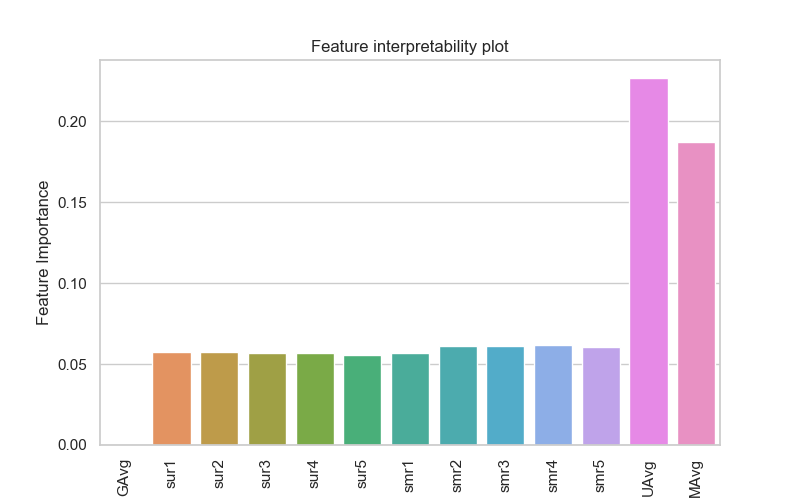

In [64]:
# plotting feature importance
coloumns = x_train.columns
feature_imp = xgb_knn_bsl.best_estimator_.feature_importances_

sns.set(style="whitegrid")
plt.figure(figsize=(8,5))
sns.barplot(x = coloumns,y = feature_imp)
plt.xticks(rotation='vertical')
plt.xlabel("Feature Name")
plt.ylabel("Feature Importance")
plt.title("Feature interpretability plot")
plt.show()

### 5.2 Tuning XGBoost with initial 13 features + Surprise Baseline predictor

Dataset creation for suprise

In [65]:
# create the traindata from the dataframe...
train_data = Dataset.load_from_df(reg_train[['user', 'movie', 'rating']], reader)

# build the trainset from traindata.., It is of dataset format from surprise library..
trainset = train_data.build_full_trainset() 

testset = list(zip(reg_test_df.user.values, reg_test_df.movie.values, reg_test_df.rating.values))
testset[:3]

[(808635, 71, 5), (941866, 71, 4), (1737912, 71, 3)]

In [66]:
# options are to specify.., how to compute those user and item biases
bsl_options = {'method': 'sgd',
               'learning_rate': .001
               }
bsl_algo = BaselineOnly(bsl_options=bsl_options)
# run this algorithm.., It will return the train and test results..
bsl_train_results, bsl_test_results = run_surprise(bsl_algo, trainset, testset, verbose=True)


# Just store these error metrics in our models_evaluation datastructure
tuned_models_evaluation_train['bsl_algo'] = bsl_train_results 
tuned_models_evaluation_test['bsl_algo'] = bsl_test_results

Training the model...
Estimating biases using sgd...
Done. time taken : 0:00:01.700399 

Evaluating the model with train data..
time taken : 0:00:02.048523
---------------
Train Data
---------------
RMSE : 0.9552562205339807

MAPE : 30.353233415224267

adding train results in the dictionary..

Evaluating for test data...
time taken : 0:00:00.088065
---------------
Test Data
---------------
RMSE : 1.0731636807255809

MAPE : 34.989136338308896

storing the test results in test dictionary...

---------------------------------------------
Total time taken to run this algorithm : 0:00:03.840992


- Adding suprise o/p to reg_train

In [67]:
# add our baseline_predicted value as our feature..
reg_train['bslpr'] = tuned_models_evaluation_train['bsl_algo']['predictions']
reg_train.head(2) 

# add that baseline predicted ratings with Surprise to the test data as well
reg_test_df['bslpr']  = tuned_models_evaluation_test['bsl_algo']['predictions']
reg_test_df.head(2)

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,smr3,smr4,smr5,UAvg,MAvg,rating,bslpr
0,808635,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,5,3.579949
1,941866,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,4,3.579949


In [68]:
# prepare train data
x_train = reg_train.drop(['user', 'movie','rating'], axis=1)
y_train = reg_train['rating']

# Prepare Test data
x_test = reg_test_df.drop(['user','movie','rating'], axis=1)
y_test = reg_test_df['rating']


# making model ready for tuning
xgb = XGBRegressor(silent=False, n_jobs=-1)
xgb_bsl = GridSearchCV(xgb,param_grid,cv = 5)

In [69]:
train_results, test_results = run_xgboost(xgb_bsl, x_train, y_train, x_test, y_test)

# store the results in models_evaluations dictionaries
tuned_models_evaluation_train['xgb_bsl'] = train_results
tuned_models_evaluation_test['xgb_bsl'] = test_results


Training the model..
[12:57:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1380 extra nodes, 0 pruned nodes, max_depth=10
[12:57:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1394 extra nodes, 0 pruned nodes, max_depth=10
[12:57:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1396 extra nodes, 0 pruned nodes, max_depth=10
[12:57:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1410 extra nodes, 0 pruned nodes, max_depth=10
[12:57:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1412 extra nodes, 0 pruned nodes, max_depth=10
[12:57:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1416 extra nodes, 0 pruned nodes, max_depth=10
[12:57:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1416 extra nodes, 0 pruned nodes, max_depth=10
[12:57:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1450 extra nodes, 0 pruned nodes, max_depth=10
[12:57:11] src/tree/updater_prune.cc:74: tree pruning end, 

[12:57:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1646 extra nodes, 0 pruned nodes, max_depth=10
[12:57:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1700 extra nodes, 0 pruned nodes, max_depth=10
[12:57:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1768 extra nodes, 0 pruned nodes, max_depth=10
[12:57:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1674 extra nodes, 0 pruned nodes, max_depth=10
[12:57:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1630 extra nodes, 0 pruned nodes, max_depth=10
[12:57:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1746 extra nodes, 0 pruned nodes, max_depth=10
[12:57:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1664 extra nodes, 0 pruned nodes, max_depth=10
[12:57:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1630 extra nodes, 0 pruned nodes, max_depth=10
[12:57:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1822 extra n

[12:57:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1546 extra nodes, 0 pruned nodes, max_depth=10
[12:57:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1654 extra nodes, 0 pruned nodes, max_depth=10
[12:57:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1574 extra nodes, 0 pruned nodes, max_depth=10
[12:57:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1694 extra nodes, 0 pruned nodes, max_depth=10
[12:57:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1644 extra nodes, 0 pruned nodes, max_depth=10
[12:57:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1642 extra nodes, 0 pruned nodes, max_depth=10
[12:57:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1622 extra nodes, 0 pruned nodes, max_depth=10
[12:57:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1608 extra nodes, 0 pruned nodes, max_depth=10
[12:57:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1658 extra n

[12:57:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1472 extra nodes, 0 pruned nodes, max_depth=10
[12:57:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1572 extra nodes, 0 pruned nodes, max_depth=10
[12:57:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1484 extra nodes, 0 pruned nodes, max_depth=10
[12:57:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1602 extra nodes, 0 pruned nodes, max_depth=10
[12:57:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1494 extra nodes, 0 pruned nodes, max_depth=10
[12:57:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1602 extra nodes, 0 pruned nodes, max_depth=10
[12:57:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1608 extra nodes, 0 pruned nodes, max_depth=10
[12:57:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1508 extra nodes, 0 pruned nodes, max_depth=10
[12:57:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1606 extra n

[12:57:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1776 extra nodes, 0 pruned nodes, max_depth=10
[12:57:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1786 extra nodes, 0 pruned nodes, max_depth=10
[12:57:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1794 extra nodes, 0 pruned nodes, max_depth=10
[12:57:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1768 extra nodes, 0 pruned nodes, max_depth=10
[12:57:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1764 extra nodes, 0 pruned nodes, max_depth=10
[12:57:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1758 extra nodes, 0 pruned nodes, max_depth=10
[12:57:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1852 extra nodes, 0 pruned nodes, max_depth=10
[12:57:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1776 extra nodes, 0 pruned nodes, max_depth=10
[12:57:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1854 extra n

[12:57:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1702 extra nodes, 0 pruned nodes, max_depth=10
[12:57:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1624 extra nodes, 0 pruned nodes, max_depth=10
[12:57:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1768 extra nodes, 0 pruned nodes, max_depth=10
[12:57:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1688 extra nodes, 0 pruned nodes, max_depth=10
[12:57:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1664 extra nodes, 0 pruned nodes, max_depth=10
[12:57:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1782 extra nodes, 0 pruned nodes, max_depth=10
[12:57:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1654 extra nodes, 0 pruned nodes, max_depth=10
[12:57:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1714 extra nodes, 0 pruned nodes, max_depth=10
[12:57:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1674 extra n

[12:57:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1560 extra nodes, 0 pruned nodes, max_depth=10
[12:57:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1658 extra nodes, 0 pruned nodes, max_depth=10
[12:57:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1486 extra nodes, 0 pruned nodes, max_depth=10
[12:57:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1658 extra nodes, 0 pruned nodes, max_depth=10
[12:57:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1546 extra nodes, 0 pruned nodes, max_depth=10
[12:57:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1656 extra nodes, 0 pruned nodes, max_depth=10
[12:57:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1538 extra nodes, 0 pruned nodes, max_depth=10
[12:57:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1580 extra nodes, 0 pruned nodes, max_depth=10
[12:57:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1676 extra n

[12:58:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1356 extra nodes, 0 pruned nodes, max_depth=10
[12:58:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1354 extra nodes, 0 pruned nodes, max_depth=10
[12:58:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1354 extra nodes, 0 pruned nodes, max_depth=10
[12:58:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1372 extra nodes, 0 pruned nodes, max_depth=10
[12:58:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1374 extra nodes, 0 pruned nodes, max_depth=10
[12:58:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1388 extra nodes, 0 pruned nodes, max_depth=10
[12:58:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1370 extra nodes, 0 pruned nodes, max_depth=10
[12:58:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1408 extra nodes, 0 pruned nodes, max_depth=10
[12:58:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1446 extra n

[12:58:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1698 extra nodes, 0 pruned nodes, max_depth=10
[12:58:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1614 extra nodes, 0 pruned nodes, max_depth=10
[12:58:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1680 extra nodes, 0 pruned nodes, max_depth=10
[12:58:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1542 extra nodes, 0 pruned nodes, max_depth=10
[12:58:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1644 extra nodes, 0 pruned nodes, max_depth=10
[12:58:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1586 extra nodes, 0 pruned nodes, max_depth=10
[12:58:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1678 extra nodes, 0 pruned nodes, max_depth=10
[12:58:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1714 extra nodes, 0 pruned nodes, max_depth=10
[12:58:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1546 extra n

[12:58:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1540 extra nodes, 0 pruned nodes, max_depth=10
[12:58:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1522 extra nodes, 0 pruned nodes, max_depth=10
[12:58:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1610 extra nodes, 0 pruned nodes, max_depth=10
[12:58:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1564 extra nodes, 0 pruned nodes, max_depth=10
[12:58:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1560 extra nodes, 0 pruned nodes, max_depth=10
[12:58:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1588 extra nodes, 0 pruned nodes, max_depth=10
[12:58:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1580 extra nodes, 0 pruned nodes, max_depth=10
[12:58:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1566 extra nodes, 0 pruned nodes, max_depth=10
[12:58:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1580 extra n

[12:58:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1554 extra nodes, 0 pruned nodes, max_depth=10
[12:58:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1452 extra nodes, 0 pruned nodes, max_depth=10
[12:58:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1514 extra nodes, 0 pruned nodes, max_depth=10
[12:58:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1462 extra nodes, 0 pruned nodes, max_depth=10
[12:58:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1524 extra nodes, 0 pruned nodes, max_depth=10
[12:58:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1498 extra nodes, 0 pruned nodes, max_depth=10
[12:58:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1502 extra nodes, 0 pruned nodes, max_depth=10
[12:58:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1572 extra nodes, 0 pruned nodes, max_depth=10
[12:58:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1542 extra n

[12:58:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1690 extra nodes, 0 pruned nodes, max_depth=10
[12:58:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1712 extra nodes, 0 pruned nodes, max_depth=10
[12:58:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1722 extra nodes, 0 pruned nodes, max_depth=10
[12:58:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1762 extra nodes, 0 pruned nodes, max_depth=10
[12:58:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1696 extra nodes, 0 pruned nodes, max_depth=10
[12:58:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1730 extra nodes, 0 pruned nodes, max_depth=10
[12:58:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1350 extra nodes, 0 pruned nodes, max_depth=10
[12:58:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1384 extra nodes, 0 pruned nodes, max_depth=10
[12:58:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1376 extra n

[12:58:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1582 extra nodes, 0 pruned nodes, max_depth=10
[12:58:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1738 extra nodes, 0 pruned nodes, max_depth=10
[12:58:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1584 extra nodes, 0 pruned nodes, max_depth=10
[12:58:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1622 extra nodes, 0 pruned nodes, max_depth=10
[12:58:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1768 extra nodes, 0 pruned nodes, max_depth=10
[12:58:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1616 extra nodes, 0 pruned nodes, max_depth=10
[12:58:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1632 extra nodes, 0 pruned nodes, max_depth=10
[12:58:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1632 extra nodes, 0 pruned nodes, max_depth=10
[12:58:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1690 extra n

[12:58:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1444 extra nodes, 0 pruned nodes, max_depth=10
[12:58:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1570 extra nodes, 0 pruned nodes, max_depth=10
[12:58:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1490 extra nodes, 0 pruned nodes, max_depth=10
[12:58:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1566 extra nodes, 0 pruned nodes, max_depth=10
[12:58:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1490 extra nodes, 0 pruned nodes, max_depth=10
[12:58:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1550 extra nodes, 0 pruned nodes, max_depth=10
[12:58:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1494 extra nodes, 0 pruned nodes, max_depth=10
[12:58:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1598 extra nodes, 0 pruned nodes, max_depth=10
[12:58:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1512 extra n

[12:58:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1340 extra nodes, 0 pruned nodes, max_depth=10
[12:58:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1310 extra nodes, 0 pruned nodes, max_depth=10
[12:58:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1342 extra nodes, 0 pruned nodes, max_depth=10
[12:58:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1302 extra nodes, 0 pruned nodes, max_depth=10
[12:58:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1388 extra nodes, 0 pruned nodes, max_depth=10
[12:58:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1382 extra nodes, 0 pruned nodes, max_depth=10
[12:58:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1336 extra nodes, 0 pruned nodes, max_depth=10
[12:58:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1394 extra nodes, 0 pruned nodes, max_depth=10
[12:58:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1392 extra n

[12:59:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1488 extra nodes, 0 pruned nodes, max_depth=10
[12:59:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1690 extra nodes, 0 pruned nodes, max_depth=10
[12:59:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1536 extra nodes, 0 pruned nodes, max_depth=10
[12:59:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1550 extra nodes, 0 pruned nodes, max_depth=10
[12:59:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1658 extra nodes, 0 pruned nodes, max_depth=10
[12:59:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1502 extra nodes, 0 pruned nodes, max_depth=10
[12:59:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1614 extra nodes, 0 pruned nodes, max_depth=10
[12:59:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1564 extra nodes, 0 pruned nodes, max_depth=10
[12:59:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1670 extra n

[12:59:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1546 extra nodes, 0 pruned nodes, max_depth=10
[12:59:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1502 extra nodes, 0 pruned nodes, max_depth=10
[12:59:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1540 extra nodes, 0 pruned nodes, max_depth=10
[12:59:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1516 extra nodes, 0 pruned nodes, max_depth=10
[12:59:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1536 extra nodes, 0 pruned nodes, max_depth=10
[12:59:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1544 extra nodes, 0 pruned nodes, max_depth=10
[12:59:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1562 extra nodes, 0 pruned nodes, max_depth=10
[12:59:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1546 extra nodes, 0 pruned nodes, max_depth=10
[12:59:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1560 extra n

[12:59:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1490 extra nodes, 0 pruned nodes, max_depth=10
[12:59:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1430 extra nodes, 0 pruned nodes, max_depth=10
[12:59:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1494 extra nodes, 0 pruned nodes, max_depth=10
[12:59:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1410 extra nodes, 0 pruned nodes, max_depth=10
[12:59:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1508 extra nodes, 0 pruned nodes, max_depth=10
[12:59:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1436 extra nodes, 0 pruned nodes, max_depth=10
[12:59:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1524 extra nodes, 0 pruned nodes, max_depth=10
[12:59:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1440 extra nodes, 0 pruned nodes, max_depth=10
[12:59:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1550 extra n

[12:59:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1694 extra nodes, 0 pruned nodes, max_depth=10
[12:59:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1674 extra nodes, 0 pruned nodes, max_depth=10
[12:59:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1674 extra nodes, 0 pruned nodes, max_depth=10
[12:59:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1688 extra nodes, 0 pruned nodes, max_depth=10
[12:59:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1302 extra nodes, 0 pruned nodes, max_depth=10
[12:59:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1332 extra nodes, 0 pruned nodes, max_depth=10
[12:59:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1320 extra nodes, 0 pruned nodes, max_depth=10
[12:59:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1358 extra nodes, 0 pruned nodes, max_depth=10
[12:59:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1370 extra n

[12:59:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1534 extra nodes, 0 pruned nodes, max_depth=10
[12:59:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1624 extra nodes, 0 pruned nodes, max_depth=10
[12:59:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1576 extra nodes, 0 pruned nodes, max_depth=10
[12:59:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1628 extra nodes, 0 pruned nodes, max_depth=10
[12:59:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1532 extra nodes, 0 pruned nodes, max_depth=10
[12:59:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1642 extra nodes, 0 pruned nodes, max_depth=10
[12:59:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1624 extra nodes, 0 pruned nodes, max_depth=10
[12:59:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1552 extra nodes, 0 pruned nodes, max_depth=10
[12:59:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1614 extra n

[12:59:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1468 extra nodes, 0 pruned nodes, max_depth=10
[12:59:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1520 extra nodes, 0 pruned nodes, max_depth=10
[12:59:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1420 extra nodes, 0 pruned nodes, max_depth=10
[12:59:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1534 extra nodes, 0 pruned nodes, max_depth=10
[12:59:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1456 extra nodes, 0 pruned nodes, max_depth=10
[12:59:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1528 extra nodes, 0 pruned nodes, max_depth=10
[12:59:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1438 extra nodes, 0 pruned nodes, max_depth=10
[12:59:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1554 extra nodes, 0 pruned nodes, max_depth=10
[12:59:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1548 extra n

[12:59:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7764 extra nodes, 0 pruned nodes, max_depth=15
[12:59:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7944 extra nodes, 0 pruned nodes, max_depth=15
[12:59:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7972 extra nodes, 0 pruned nodes, max_depth=15
[12:59:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8070 extra nodes, 0 pruned nodes, max_depth=15
[12:59:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8088 extra nodes, 0 pruned nodes, max_depth=15
[12:59:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8184 extra nodes, 0 pruned nodes, max_depth=15
[12:59:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8420 extra nodes, 0 pruned nodes, max_depth=15
[12:59:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8360 extra nodes, 0 pruned nodes, max_depth=15
[12:59:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8512 extra n

[13:00:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15226 extra nodes, 0 pruned nodes, max_depth=15
[13:00:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15218 extra nodes, 0 pruned nodes, max_depth=15
[13:00:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15722 extra nodes, 0 pruned nodes, max_depth=15
[13:00:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15132 extra nodes, 0 pruned nodes, max_depth=15
[13:00:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15526 extra nodes, 0 pruned nodes, max_depth=15
[13:00:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16208 extra nodes, 0 pruned nodes, max_depth=15
[13:00:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16138 extra nodes, 0 pruned nodes, max_depth=15
[13:00:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16306 extra nodes, 0 pruned nodes, max_depth=15
[13:00:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1549

[13:00:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13406 extra nodes, 0 pruned nodes, max_depth=15
[13:00:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12900 extra nodes, 0 pruned nodes, max_depth=15
[13:00:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13530 extra nodes, 0 pruned nodes, max_depth=15
[13:00:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13506 extra nodes, 0 pruned nodes, max_depth=15
[13:00:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13904 extra nodes, 0 pruned nodes, max_depth=15
[13:00:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13478 extra nodes, 0 pruned nodes, max_depth=15
[13:00:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14162 extra nodes, 0 pruned nodes, max_depth=15
[13:00:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14080 extra nodes, 0 pruned nodes, max_depth=15
[13:00:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1447

[13:00:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9436 extra nodes, 0 pruned nodes, max_depth=15
[13:00:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9110 extra nodes, 0 pruned nodes, max_depth=15
[13:00:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9638 extra nodes, 0 pruned nodes, max_depth=15
[13:00:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9446 extra nodes, 0 pruned nodes, max_depth=15
[13:00:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10154 extra nodes, 0 pruned nodes, max_depth=15
[13:00:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9904 extra nodes, 0 pruned nodes, max_depth=15
[13:00:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10232 extra nodes, 0 pruned nodes, max_depth=15
[13:00:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10174 extra nodes, 0 pruned nodes, max_depth=15
[13:00:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10588 ext

[13:00:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6096 extra nodes, 0 pruned nodes, max_depth=15
[13:00:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6230 extra nodes, 0 pruned nodes, max_depth=15
[13:00:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6218 extra nodes, 0 pruned nodes, max_depth=15
[13:00:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6386 extra nodes, 0 pruned nodes, max_depth=15
[13:00:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6660 extra nodes, 0 pruned nodes, max_depth=15
[13:00:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6600 extra nodes, 0 pruned nodes, max_depth=15
[13:00:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6790 extra nodes, 0 pruned nodes, max_depth=15
[13:00:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6866 extra nodes, 0 pruned nodes, max_depth=15
[13:00:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6914 extra n

[13:00:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14572 extra nodes, 0 pruned nodes, max_depth=15
[13:00:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14252 extra nodes, 0 pruned nodes, max_depth=15
[13:00:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14796 extra nodes, 0 pruned nodes, max_depth=15
[13:00:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14960 extra nodes, 0 pruned nodes, max_depth=15
[13:00:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14906 extra nodes, 0 pruned nodes, max_depth=15
[13:00:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14642 extra nodes, 0 pruned nodes, max_depth=15
[13:00:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14748 extra nodes, 0 pruned nodes, max_depth=15
[13:00:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15114 extra nodes, 0 pruned nodes, max_depth=15
[13:00:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1559

[13:01:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10552 extra nodes, 0 pruned nodes, max_depth=15
[13:01:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10926 extra nodes, 0 pruned nodes, max_depth=15
[13:01:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10864 extra nodes, 0 pruned nodes, max_depth=15
[13:01:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11368 extra nodes, 0 pruned nodes, max_depth=15
[13:01:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11324 extra nodes, 0 pruned nodes, max_depth=15
[13:01:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11524 extra nodes, 0 pruned nodes, max_depth=15
[13:01:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11078 extra nodes, 0 pruned nodes, max_depth=15
[13:01:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11778 extra nodes, 0 pruned nodes, max_depth=15
[13:01:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1184

[13:01:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6216 extra nodes, 0 pruned nodes, max_depth=15
[13:01:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6368 extra nodes, 0 pruned nodes, max_depth=15
[13:01:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6236 extra nodes, 0 pruned nodes, max_depth=15
[13:01:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6342 extra nodes, 0 pruned nodes, max_depth=15
[13:01:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6528 extra nodes, 0 pruned nodes, max_depth=15
[13:01:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6590 extra nodes, 0 pruned nodes, max_depth=15
[13:01:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6534 extra nodes, 0 pruned nodes, max_depth=15
[13:01:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6754 extra nodes, 0 pruned nodes, max_depth=15
[13:01:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6810 extra n

[13:01:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12228 extra nodes, 0 pruned nodes, max_depth=15
[13:01:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12858 extra nodes, 0 pruned nodes, max_depth=15
[13:01:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12586 extra nodes, 0 pruned nodes, max_depth=15
[13:01:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12884 extra nodes, 0 pruned nodes, max_depth=15
[13:01:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12964 extra nodes, 0 pruned nodes, max_depth=15
[13:01:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12812 extra nodes, 0 pruned nodes, max_depth=15
[13:01:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12848 extra nodes, 0 pruned nodes, max_depth=15
[13:01:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12952 extra nodes, 0 pruned nodes, max_depth=15
[13:01:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1308

[13:01:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10676 extra nodes, 0 pruned nodes, max_depth=15
[13:01:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10614 extra nodes, 0 pruned nodes, max_depth=15
[13:01:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10630 extra nodes, 0 pruned nodes, max_depth=15
[13:01:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10940 extra nodes, 0 pruned nodes, max_depth=15
[13:01:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10794 extra nodes, 0 pruned nodes, max_depth=15
[13:01:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10890 extra nodes, 0 pruned nodes, max_depth=15
[13:01:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11160 extra nodes, 0 pruned nodes, max_depth=15
[13:01:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10790 extra nodes, 0 pruned nodes, max_depth=15
[13:01:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1143

[13:01:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7654 extra nodes, 0 pruned nodes, max_depth=15
[13:01:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7906 extra nodes, 0 pruned nodes, max_depth=15
[13:01:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7766 extra nodes, 0 pruned nodes, max_depth=15
[13:01:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7764 extra nodes, 0 pruned nodes, max_depth=15
[13:01:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8154 extra nodes, 0 pruned nodes, max_depth=15
[13:02:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8018 extra nodes, 0 pruned nodes, max_depth=15
[13:02:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8438 extra nodes, 0 pruned nodes, max_depth=15
[13:02:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8222 extra nodes, 0 pruned nodes, max_depth=15
[13:02:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8680 extra n

[13:02:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4930 extra nodes, 0 pruned nodes, max_depth=15
[13:02:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5050 extra nodes, 0 pruned nodes, max_depth=15
[13:02:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5190 extra nodes, 0 pruned nodes, max_depth=15
[13:02:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5276 extra nodes, 0 pruned nodes, max_depth=15
[13:02:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5272 extra nodes, 0 pruned nodes, max_depth=15
[13:02:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5422 extra nodes, 0 pruned nodes, max_depth=15
[13:02:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5414 extra nodes, 0 pruned nodes, max_depth=15
[13:02:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5688 extra nodes, 0 pruned nodes, max_depth=15
[13:02:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5716 extra n

[13:02:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11690 extra nodes, 0 pruned nodes, max_depth=15
[13:02:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12058 extra nodes, 0 pruned nodes, max_depth=15
[13:02:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11926 extra nodes, 0 pruned nodes, max_depth=15
[13:02:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12088 extra nodes, 0 pruned nodes, max_depth=15
[13:02:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11974 extra nodes, 0 pruned nodes, max_depth=15
[13:02:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12586 extra nodes, 0 pruned nodes, max_depth=15
[13:02:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12202 extra nodes, 0 pruned nodes, max_depth=15
[13:02:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12816 extra nodes, 0 pruned nodes, max_depth=15
[13:02:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1199

[13:02:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9312 extra nodes, 0 pruned nodes, max_depth=15
[13:02:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9414 extra nodes, 0 pruned nodes, max_depth=15
[13:02:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9568 extra nodes, 0 pruned nodes, max_depth=15
[13:02:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9408 extra nodes, 0 pruned nodes, max_depth=15
[13:02:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9776 extra nodes, 0 pruned nodes, max_depth=15
[13:02:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9874 extra nodes, 0 pruned nodes, max_depth=15
[13:02:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9892 extra nodes, 0 pruned nodes, max_depth=15
[13:02:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10136 extra nodes, 0 pruned nodes, max_depth=15
[13:02:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10214 extra

[13:02:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5778 extra nodes, 0 pruned nodes, max_depth=15
[13:02:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5676 extra nodes, 0 pruned nodes, max_depth=15
[13:02:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5874 extra nodes, 0 pruned nodes, max_depth=15
[13:02:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5934 extra nodes, 0 pruned nodes, max_depth=15
[13:02:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5938 extra nodes, 0 pruned nodes, max_depth=15
[13:02:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6314 extra nodes, 0 pruned nodes, max_depth=15
[13:02:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6282 extra nodes, 0 pruned nodes, max_depth=15
[13:02:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6350 extra nodes, 0 pruned nodes, max_depth=15
[13:02:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6360 extra n

[13:03:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11402 extra nodes, 0 pruned nodes, max_depth=15
[13:03:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11554 extra nodes, 0 pruned nodes, max_depth=15
[13:03:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11248 extra nodes, 0 pruned nodes, max_depth=15
[13:03:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11414 extra nodes, 0 pruned nodes, max_depth=15
[13:03:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11202 extra nodes, 0 pruned nodes, max_depth=15
[13:03:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11432 extra nodes, 0 pruned nodes, max_depth=15
[13:03:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11370 extra nodes, 0 pruned nodes, max_depth=15
[13:03:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10822 extra nodes, 0 pruned nodes, max_depth=15
[13:03:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4002

[13:03:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9532 extra nodes, 0 pruned nodes, max_depth=15
[13:03:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10042 extra nodes, 0 pruned nodes, max_depth=15
[13:03:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10002 extra nodes, 0 pruned nodes, max_depth=15
[13:03:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9900 extra nodes, 0 pruned nodes, max_depth=15
[13:03:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10020 extra nodes, 0 pruned nodes, max_depth=15
[13:03:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10518 extra nodes, 0 pruned nodes, max_depth=15
[13:03:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10410 extra nodes, 0 pruned nodes, max_depth=15
[13:03:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10274 extra nodes, 0 pruned nodes, max_depth=15
[13:03:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10448 

[13:03:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6988 extra nodes, 0 pruned nodes, max_depth=15
[13:03:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7370 extra nodes, 0 pruned nodes, max_depth=15
[13:03:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7118 extra nodes, 0 pruned nodes, max_depth=15
[13:03:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7398 extra nodes, 0 pruned nodes, max_depth=15
[13:03:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7392 extra nodes, 0 pruned nodes, max_depth=15
[13:03:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7796 extra nodes, 0 pruned nodes, max_depth=15
[13:03:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7816 extra nodes, 0 pruned nodes, max_depth=15
[13:03:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7798 extra nodes, 0 pruned nodes, max_depth=15
[13:03:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7634 extra n

[13:03:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4580 extra nodes, 0 pruned nodes, max_depth=15
[13:03:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4796 extra nodes, 0 pruned nodes, max_depth=15
[13:03:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4770 extra nodes, 0 pruned nodes, max_depth=15
[13:03:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4946 extra nodes, 0 pruned nodes, max_depth=15
[13:03:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4980 extra nodes, 0 pruned nodes, max_depth=15
[13:03:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5182 extra nodes, 0 pruned nodes, max_depth=15
[13:03:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5166 extra nodes, 0 pruned nodes, max_depth=15
[13:03:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5250 extra nodes, 0 pruned nodes, max_depth=15
[13:03:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5250 extra n

[13:03:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10594 extra nodes, 0 pruned nodes, max_depth=15
[13:03:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10538 extra nodes, 0 pruned nodes, max_depth=15
[13:03:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10682 extra nodes, 0 pruned nodes, max_depth=15
[13:03:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10764 extra nodes, 0 pruned nodes, max_depth=15
[13:03:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10974 extra nodes, 0 pruned nodes, max_depth=15
[13:03:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10998 extra nodes, 0 pruned nodes, max_depth=15
[13:03:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10862 extra nodes, 0 pruned nodes, max_depth=15
[13:03:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10916 extra nodes, 0 pruned nodes, max_depth=15
[13:03:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1102

[13:04:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8582 extra nodes, 0 pruned nodes, max_depth=15
[13:04:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8532 extra nodes, 0 pruned nodes, max_depth=15
[13:04:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8626 extra nodes, 0 pruned nodes, max_depth=15
[13:04:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8818 extra nodes, 0 pruned nodes, max_depth=15
[13:04:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8892 extra nodes, 0 pruned nodes, max_depth=15
[13:04:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8968 extra nodes, 0 pruned nodes, max_depth=15
[13:04:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9174 extra nodes, 0 pruned nodes, max_depth=15
[13:04:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8798 extra nodes, 0 pruned nodes, max_depth=15
[13:04:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9234 extra n

[13:04:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12884 extra nodes, 0 pruned nodes, max_depth=20
[13:04:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13284 extra nodes, 0 pruned nodes, max_depth=20
[13:04:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14130 extra nodes, 0 pruned nodes, max_depth=20
[13:04:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14284 extra nodes, 0 pruned nodes, max_depth=20
[13:04:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14218 extra nodes, 0 pruned nodes, max_depth=20
[13:04:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14868 extra nodes, 0 pruned nodes, max_depth=20
[13:04:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14314 extra nodes, 0 pruned nodes, max_depth=20
[13:04:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14632 extra nodes, 0 pruned nodes, max_depth=20
[13:04:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1490

[13:04:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 38650 extra nodes, 0 pruned nodes, max_depth=20
[13:04:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 38182 extra nodes, 0 pruned nodes, max_depth=20
[13:04:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 38840 extra nodes, 0 pruned nodes, max_depth=20
[13:04:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 39284 extra nodes, 0 pruned nodes, max_depth=20
[13:04:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 38704 extra nodes, 0 pruned nodes, max_depth=20
[13:04:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 39722 extra nodes, 0 pruned nodes, max_depth=20
[13:04:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7754 extra nodes, 0 pruned nodes, max_depth=20
[13:04:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7940 extra nodes, 0 pruned nodes, max_depth=20
[13:04:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8436 e

[13:04:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28098 extra nodes, 0 pruned nodes, max_depth=20
[13:04:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27862 extra nodes, 0 pruned nodes, max_depth=20
[13:04:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28910 extra nodes, 0 pruned nodes, max_depth=20
[13:04:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29164 extra nodes, 0 pruned nodes, max_depth=20
[13:04:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29648 extra nodes, 0 pruned nodes, max_depth=20
[13:04:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30172 extra nodes, 0 pruned nodes, max_depth=20
[13:04:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30788 extra nodes, 0 pruned nodes, max_depth=20
[13:04:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30138 extra nodes, 0 pruned nodes, max_depth=20
[13:04:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3178

[13:05:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16802 extra nodes, 0 pruned nodes, max_depth=20
[13:05:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16466 extra nodes, 0 pruned nodes, max_depth=20
[13:05:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17020 extra nodes, 0 pruned nodes, max_depth=20
[13:05:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17594 extra nodes, 0 pruned nodes, max_depth=20
[13:05:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17262 extra nodes, 0 pruned nodes, max_depth=20
[13:05:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18468 extra nodes, 0 pruned nodes, max_depth=20
[13:05:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18194 extra nodes, 0 pruned nodes, max_depth=20
[13:05:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18694 extra nodes, 0 pruned nodes, max_depth=20
[13:05:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1959

[13:05:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8744 extra nodes, 0 pruned nodes, max_depth=20
[13:05:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8978 extra nodes, 0 pruned nodes, max_depth=20
[13:05:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8890 extra nodes, 0 pruned nodes, max_depth=20
[13:05:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9196 extra nodes, 0 pruned nodes, max_depth=20
[13:05:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9750 extra nodes, 0 pruned nodes, max_depth=20
[13:05:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10050 extra nodes, 0 pruned nodes, max_depth=20
[13:05:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10096 extra nodes, 0 pruned nodes, max_depth=20
[13:05:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10082 extra nodes, 0 pruned nodes, max_depth=20
[13:05:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10494 ext

[13:05:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 31840 extra nodes, 0 pruned nodes, max_depth=20
[13:05:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32814 extra nodes, 0 pruned nodes, max_depth=20
[13:05:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33390 extra nodes, 0 pruned nodes, max_depth=20
[13:05:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33620 extra nodes, 0 pruned nodes, max_depth=20
[13:05:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34574 extra nodes, 0 pruned nodes, max_depth=20
[13:05:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33914 extra nodes, 0 pruned nodes, max_depth=20
[13:05:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34474 extra nodes, 0 pruned nodes, max_depth=20
[13:05:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34766 extra nodes, 0 pruned nodes, max_depth=20
[13:05:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3567

[13:06:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19512 extra nodes, 0 pruned nodes, max_depth=20
[13:06:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20422 extra nodes, 0 pruned nodes, max_depth=20
[13:06:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20962 extra nodes, 0 pruned nodes, max_depth=20
[13:06:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21530 extra nodes, 0 pruned nodes, max_depth=20
[13:06:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21904 extra nodes, 0 pruned nodes, max_depth=20
[13:06:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22200 extra nodes, 0 pruned nodes, max_depth=20
[13:06:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22614 extra nodes, 0 pruned nodes, max_depth=20
[13:06:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23574 extra nodes, 0 pruned nodes, max_depth=20
[13:06:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2376

[13:06:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8490 extra nodes, 0 pruned nodes, max_depth=20
[13:06:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8762 extra nodes, 0 pruned nodes, max_depth=20
[13:06:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8852 extra nodes, 0 pruned nodes, max_depth=20
[13:06:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9176 extra nodes, 0 pruned nodes, max_depth=20
[13:06:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9342 extra nodes, 0 pruned nodes, max_depth=20
[13:06:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9450 extra nodes, 0 pruned nodes, max_depth=20
[13:06:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9778 extra nodes, 0 pruned nodes, max_depth=20
[13:06:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10084 extra nodes, 0 pruned nodes, max_depth=20
[13:06:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9928 extra 

[13:06:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27168 extra nodes, 0 pruned nodes, max_depth=20
[13:06:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26996 extra nodes, 0 pruned nodes, max_depth=20
[13:06:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27444 extra nodes, 0 pruned nodes, max_depth=20
[13:06:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27440 extra nodes, 0 pruned nodes, max_depth=20
[13:06:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27330 extra nodes, 0 pruned nodes, max_depth=20
[13:06:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27558 extra nodes, 0 pruned nodes, max_depth=20
[13:06:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27672 extra nodes, 0 pruned nodes, max_depth=20
[13:06:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28116 extra nodes, 0 pruned nodes, max_depth=20
[13:06:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2852

[13:06:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18802 extra nodes, 0 pruned nodes, max_depth=20
[13:06:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18618 extra nodes, 0 pruned nodes, max_depth=20
[13:06:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19170 extra nodes, 0 pruned nodes, max_depth=20
[13:06:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19472 extra nodes, 0 pruned nodes, max_depth=20
[13:06:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20068 extra nodes, 0 pruned nodes, max_depth=20
[13:06:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19974 extra nodes, 0 pruned nodes, max_depth=20
[13:07:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20680 extra nodes, 0 pruned nodes, max_depth=20
[13:07:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21252 extra nodes, 0 pruned nodes, max_depth=20
[13:07:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2171

[13:07:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10702 extra nodes, 0 pruned nodes, max_depth=20
[13:07:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11066 extra nodes, 0 pruned nodes, max_depth=20
[13:07:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11244 extra nodes, 0 pruned nodes, max_depth=20
[13:07:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11342 extra nodes, 0 pruned nodes, max_depth=20
[13:07:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11590 extra nodes, 0 pruned nodes, max_depth=20
[13:07:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12066 extra nodes, 0 pruned nodes, max_depth=20
[13:07:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12442 extra nodes, 0 pruned nodes, max_depth=20
[13:07:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12288 extra nodes, 0 pruned nodes, max_depth=20
[13:07:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1249

[13:07:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5570 extra nodes, 0 pruned nodes, max_depth=20
[13:07:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5896 extra nodes, 0 pruned nodes, max_depth=20
[13:07:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5946 extra nodes, 0 pruned nodes, max_depth=20
[13:07:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6260 extra nodes, 0 pruned nodes, max_depth=20
[13:07:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6302 extra nodes, 0 pruned nodes, max_depth=20
[13:07:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6440 extra nodes, 0 pruned nodes, max_depth=20
[13:07:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6472 extra nodes, 0 pruned nodes, max_depth=20
[13:07:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6898 extra nodes, 0 pruned nodes, max_depth=20
[13:07:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6896 extra n

[13:07:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21832 extra nodes, 0 pruned nodes, max_depth=20
[13:07:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22392 extra nodes, 0 pruned nodes, max_depth=20
[13:07:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22926 extra nodes, 0 pruned nodes, max_depth=20
[13:07:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22768 extra nodes, 0 pruned nodes, max_depth=20
[13:07:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23368 extra nodes, 0 pruned nodes, max_depth=20
[13:07:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23480 extra nodes, 0 pruned nodes, max_depth=20
[13:07:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23954 extra nodes, 0 pruned nodes, max_depth=20
[13:07:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24172 extra nodes, 0 pruned nodes, max_depth=20
[13:07:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2409

[13:08:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13544 extra nodes, 0 pruned nodes, max_depth=20
[13:08:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13840 extra nodes, 0 pruned nodes, max_depth=20
[13:08:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14242 extra nodes, 0 pruned nodes, max_depth=20
[13:08:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14328 extra nodes, 0 pruned nodes, max_depth=20
[13:08:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14864 extra nodes, 0 pruned nodes, max_depth=20
[13:08:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15272 extra nodes, 0 pruned nodes, max_depth=20
[13:08:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14890 extra nodes, 0 pruned nodes, max_depth=20
[13:08:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16032 extra nodes, 0 pruned nodes, max_depth=20
[13:08:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1610

[13:08:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6324 extra nodes, 0 pruned nodes, max_depth=20
[13:08:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6328 extra nodes, 0 pruned nodes, max_depth=20
[13:08:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6678 extra nodes, 0 pruned nodes, max_depth=20
[13:08:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6920 extra nodes, 0 pruned nodes, max_depth=20
[13:08:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7034 extra nodes, 0 pruned nodes, max_depth=20
[13:08:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7058 extra nodes, 0 pruned nodes, max_depth=20
[13:08:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7468 extra nodes, 0 pruned nodes, max_depth=20
[13:08:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7670 extra nodes, 0 pruned nodes, max_depth=20
[13:08:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7848 extra n

[13:08:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21096 extra nodes, 0 pruned nodes, max_depth=20
[13:08:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20506 extra nodes, 0 pruned nodes, max_depth=20
[13:08:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21174 extra nodes, 0 pruned nodes, max_depth=20
[13:08:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21536 extra nodes, 0 pruned nodes, max_depth=20
[13:08:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22472 extra nodes, 0 pruned nodes, max_depth=20
[13:08:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22396 extra nodes, 0 pruned nodes, max_depth=20
[13:08:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21804 extra nodes, 0 pruned nodes, max_depth=20
[13:08:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22118 extra nodes, 0 pruned nodes, max_depth=20
[13:08:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2247

[13:08:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14196 extra nodes, 0 pruned nodes, max_depth=20
[13:08:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14530 extra nodes, 0 pruned nodes, max_depth=20
[13:08:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14484 extra nodes, 0 pruned nodes, max_depth=20
[13:08:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14864 extra nodes, 0 pruned nodes, max_depth=20
[13:08:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15308 extra nodes, 0 pruned nodes, max_depth=20
[13:08:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15694 extra nodes, 0 pruned nodes, max_depth=20
[13:08:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15916 extra nodes, 0 pruned nodes, max_depth=20
[13:08:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15956 extra nodes, 0 pruned nodes, max_depth=20
[13:08:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1631

[13:09:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8238 extra nodes, 0 pruned nodes, max_depth=20
[13:09:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8224 extra nodes, 0 pruned nodes, max_depth=20
[13:09:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8514 extra nodes, 0 pruned nodes, max_depth=20
[13:09:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8522 extra nodes, 0 pruned nodes, max_depth=20
[13:09:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8986 extra nodes, 0 pruned nodes, max_depth=20
[13:09:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9244 extra nodes, 0 pruned nodes, max_depth=20
[13:09:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9342 extra nodes, 0 pruned nodes, max_depth=20
[13:09:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9480 extra nodes, 0 pruned nodes, max_depth=20
[13:09:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9342 extra n

[13:09:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23594 extra nodes, 0 pruned nodes, max_depth=20
[13:09:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4270 extra nodes, 0 pruned nodes, max_depth=20
[13:09:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4394 extra nodes, 0 pruned nodes, max_depth=20
[13:09:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4454 extra nodes, 0 pruned nodes, max_depth=20
[13:09:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4652 extra nodes, 0 pruned nodes, max_depth=20
[13:09:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4846 extra nodes, 0 pruned nodes, max_depth=20
[13:09:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4904 extra nodes, 0 pruned nodes, max_depth=20
[13:09:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5162 extra nodes, 0 pruned nodes, max_depth=20
[13:09:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5226 extra 

[13:09:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16754 extra nodes, 0 pruned nodes, max_depth=20
[13:09:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17012 extra nodes, 0 pruned nodes, max_depth=20
[13:09:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17734 extra nodes, 0 pruned nodes, max_depth=20
[13:09:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18036 extra nodes, 0 pruned nodes, max_depth=20
[13:09:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17734 extra nodes, 0 pruned nodes, max_depth=20
[13:09:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18192 extra nodes, 0 pruned nodes, max_depth=20
[13:09:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18730 extra nodes, 0 pruned nodes, max_depth=20
[13:09:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19274 extra nodes, 0 pruned nodes, max_depth=20
[13:09:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1916

[13:10:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10132 extra nodes, 0 pruned nodes, max_depth=20
[13:10:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10324 extra nodes, 0 pruned nodes, max_depth=20
[13:10:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10156 extra nodes, 0 pruned nodes, max_depth=20
[13:10:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10744 extra nodes, 0 pruned nodes, max_depth=20
[13:10:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11028 extra nodes, 0 pruned nodes, max_depth=20
[13:10:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11078 extra nodes, 0 pruned nodes, max_depth=20
[13:10:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11262 extra nodes, 0 pruned nodes, max_depth=20
[13:10:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11584 extra nodes, 0 pruned nodes, max_depth=20
[13:10:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1189

[13:10:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1632 extra nodes, 0 pruned nodes, max_depth=10
[13:10:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1644 extra nodes, 0 pruned nodes, max_depth=10
[13:10:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1782 extra nodes, 0 pruned nodes, max_depth=10
[13:10:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1726 extra nodes, 0 pruned nodes, max_depth=10
[13:10:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1684 extra nodes, 0 pruned nodes, max_depth=10
[13:10:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1756 extra nodes, 0 pruned nodes, max_depth=10
[13:10:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1814 extra nodes, 0 pruned nodes, max_depth=10
[13:10:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1654 extra nodes, 0 pruned nodes, max_depth=10
[13:10:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1848 extra n

[13:10:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1098 extra nodes, 0 pruned nodes, max_depth=10
[13:10:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1234 extra nodes, 0 pruned nodes, max_depth=10
[13:10:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1354 extra nodes, 0 pruned nodes, max_depth=10
[13:10:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1330 extra nodes, 0 pruned nodes, max_depth=10
[13:10:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1212 extra nodes, 0 pruned nodes, max_depth=10
[13:10:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1364 extra nodes, 0 pruned nodes, max_depth=10
[13:10:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1090 extra nodes, 0 pruned nodes, max_depth=10
[13:10:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1284 extra nodes, 0 pruned nodes, max_depth=10
[13:10:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1230 extra n

[13:10:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1538 extra nodes, 0 pruned nodes, max_depth=10
[13:10:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1510 extra nodes, 0 pruned nodes, max_depth=10
[13:10:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1520 extra nodes, 0 pruned nodes, max_depth=10
[13:10:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1422 extra nodes, 0 pruned nodes, max_depth=10
[13:10:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1424 extra nodes, 0 pruned nodes, max_depth=10
[13:10:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1308 extra nodes, 0 pruned nodes, max_depth=10
[13:10:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1408 extra nodes, 0 pruned nodes, max_depth=10
[13:10:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1334 extra nodes, 0 pruned nodes, max_depth=10
[13:10:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1520 extra n

[13:10:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1768 extra nodes, 0 pruned nodes, max_depth=10
[13:10:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1858 extra nodes, 0 pruned nodes, max_depth=10
[13:10:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1794 extra nodes, 0 pruned nodes, max_depth=10
[13:10:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1816 extra nodes, 0 pruned nodes, max_depth=10
[13:10:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1748 extra nodes, 0 pruned nodes, max_depth=10
[13:10:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1820 extra nodes, 0 pruned nodes, max_depth=10
[13:10:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1794 extra nodes, 0 pruned nodes, max_depth=10
[13:10:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1716 extra nodes, 0 pruned nodes, max_depth=10
[13:10:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1778 extra n

[13:10:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1432 extra nodes, 0 pruned nodes, max_depth=10
[13:10:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1476 extra nodes, 0 pruned nodes, max_depth=10
[13:10:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1464 extra nodes, 0 pruned nodes, max_depth=10
[13:10:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1538 extra nodes, 0 pruned nodes, max_depth=10
[13:10:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1504 extra nodes, 0 pruned nodes, max_depth=10
[13:10:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1518 extra nodes, 0 pruned nodes, max_depth=10
[13:10:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1620 extra nodes, 0 pruned nodes, max_depth=10
[13:10:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1558 extra nodes, 0 pruned nodes, max_depth=10
[13:10:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1684 extra n

[13:10:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1184 extra nodes, 0 pruned nodes, max_depth=10
[13:10:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1352 extra nodes, 0 pruned nodes, max_depth=10
[13:10:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1214 extra nodes, 0 pruned nodes, max_depth=10
[13:10:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1260 extra nodes, 0 pruned nodes, max_depth=10
[13:10:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1420 extra nodes, 0 pruned nodes, max_depth=10
[13:10:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1422 extra nodes, 0 pruned nodes, max_depth=10
[13:10:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1386 extra nodes, 0 pruned nodes, max_depth=10
[13:10:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1344 extra nodes, 0 pruned nodes, max_depth=10
[13:10:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1194 extra n

[13:11:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1614 extra nodes, 0 pruned nodes, max_depth=10
[13:11:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1606 extra nodes, 0 pruned nodes, max_depth=10
[13:11:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1640 extra nodes, 0 pruned nodes, max_depth=10
[13:11:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1550 extra nodes, 0 pruned nodes, max_depth=10
[13:11:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1608 extra nodes, 0 pruned nodes, max_depth=10
[13:11:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1638 extra nodes, 0 pruned nodes, max_depth=10
[13:11:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1464 extra nodes, 0 pruned nodes, max_depth=10
[13:11:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1710 extra nodes, 0 pruned nodes, max_depth=10
[13:11:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1590 extra n

[13:11:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1688 extra nodes, 0 pruned nodes, max_depth=10
[13:11:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1568 extra nodes, 0 pruned nodes, max_depth=10
[13:11:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1596 extra nodes, 0 pruned nodes, max_depth=10
[13:11:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1590 extra nodes, 0 pruned nodes, max_depth=10
[13:11:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1590 extra nodes, 0 pruned nodes, max_depth=10
[13:11:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1724 extra nodes, 0 pruned nodes, max_depth=10
[13:11:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1744 extra nodes, 0 pruned nodes, max_depth=10
[13:11:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1706 extra nodes, 0 pruned nodes, max_depth=10
[13:11:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1680 extra n

[13:11:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1186 extra nodes, 0 pruned nodes, max_depth=10
[13:11:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1080 extra nodes, 0 pruned nodes, max_depth=10
[13:11:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1072 extra nodes, 0 pruned nodes, max_depth=10
[13:11:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1176 extra nodes, 0 pruned nodes, max_depth=10
[13:11:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 912 extra nodes, 0 pruned nodes, max_depth=10
[13:11:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1032 extra nodes, 0 pruned nodes, max_depth=10
[13:11:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1042 extra nodes, 0 pruned nodes, max_depth=10
[13:11:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1168 extra nodes, 0 pruned nodes, max_depth=10
[13:11:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1092 extra no

[13:11:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1306 extra nodes, 0 pruned nodes, max_depth=10
[13:11:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1446 extra nodes, 0 pruned nodes, max_depth=10
[13:11:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1334 extra nodes, 0 pruned nodes, max_depth=10
[13:11:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1292 extra nodes, 0 pruned nodes, max_depth=10
[13:11:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1246 extra nodes, 0 pruned nodes, max_depth=10
[13:11:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1308 extra nodes, 0 pruned nodes, max_depth=10
[13:11:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1320 extra nodes, 0 pruned nodes, max_depth=10
[13:11:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1248 extra nodes, 0 pruned nodes, max_depth=10
[13:11:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1282 extra n

[13:11:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1658 extra nodes, 0 pruned nodes, max_depth=10
[13:11:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1708 extra nodes, 0 pruned nodes, max_depth=10
[13:11:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1688 extra nodes, 0 pruned nodes, max_depth=10
[13:11:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1798 extra nodes, 0 pruned nodes, max_depth=10
[13:11:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1696 extra nodes, 0 pruned nodes, max_depth=10
[13:11:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1690 extra nodes, 0 pruned nodes, max_depth=10
[13:11:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1656 extra nodes, 0 pruned nodes, max_depth=10
[13:11:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1640 extra nodes, 0 pruned nodes, max_depth=10
[13:11:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1626 extra n

[13:11:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1410 extra nodes, 0 pruned nodes, max_depth=10
[13:11:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1440 extra nodes, 0 pruned nodes, max_depth=10
[13:11:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1460 extra nodes, 0 pruned nodes, max_depth=10
[13:11:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1428 extra nodes, 0 pruned nodes, max_depth=10
[13:11:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1548 extra nodes, 0 pruned nodes, max_depth=10
[13:11:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1500 extra nodes, 0 pruned nodes, max_depth=10
[13:11:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1626 extra nodes, 0 pruned nodes, max_depth=10
[13:11:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1532 extra nodes, 0 pruned nodes, max_depth=10
[13:11:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1682 extra n

[13:11:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1102 extra nodes, 0 pruned nodes, max_depth=10
[13:11:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1300 extra nodes, 0 pruned nodes, max_depth=10
[13:11:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1344 extra nodes, 0 pruned nodes, max_depth=10
[13:11:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1094 extra nodes, 0 pruned nodes, max_depth=10
[13:11:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1178 extra nodes, 0 pruned nodes, max_depth=10
[13:11:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1180 extra nodes, 0 pruned nodes, max_depth=10
[13:11:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1144 extra nodes, 0 pruned nodes, max_depth=10
[13:11:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1036 extra nodes, 0 pruned nodes, max_depth=10
[13:11:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1132 extra n

[13:11:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1522 extra nodes, 0 pruned nodes, max_depth=10
[13:11:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1402 extra nodes, 0 pruned nodes, max_depth=10
[13:11:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1516 extra nodes, 0 pruned nodes, max_depth=10
[13:11:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1456 extra nodes, 0 pruned nodes, max_depth=10
[13:11:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1424 extra nodes, 0 pruned nodes, max_depth=10
[13:11:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1528 extra nodes, 0 pruned nodes, max_depth=10
[13:11:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1466 extra nodes, 0 pruned nodes, max_depth=10
[13:11:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1274 extra nodes, 0 pruned nodes, max_depth=10
[13:11:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1346 extra n

[13:12:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1530 extra nodes, 0 pruned nodes, max_depth=10
[13:12:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1654 extra nodes, 0 pruned nodes, max_depth=10
[13:12:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1574 extra nodes, 0 pruned nodes, max_depth=10
[13:12:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1684 extra nodes, 0 pruned nodes, max_depth=10
[13:12:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1684 extra nodes, 0 pruned nodes, max_depth=10
[13:12:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1618 extra nodes, 0 pruned nodes, max_depth=10
[13:12:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1690 extra nodes, 0 pruned nodes, max_depth=10
[13:12:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1682 extra nodes, 0 pruned nodes, max_depth=10
[13:12:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1650 extra n

[13:12:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 994 extra nodes, 0 pruned nodes, max_depth=10
[13:12:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 916 extra nodes, 0 pruned nodes, max_depth=10
[13:12:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 882 extra nodes, 0 pruned nodes, max_depth=10
[13:12:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 880 extra nodes, 0 pruned nodes, max_depth=10
[13:12:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 982 extra nodes, 0 pruned nodes, max_depth=10
[13:12:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 898 extra nodes, 0 pruned nodes, max_depth=10
[13:12:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1012 extra nodes, 0 pruned nodes, max_depth=10
[13:12:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 758 extra nodes, 0 pruned nodes, max_depth=10
[13:12:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 964 extra nodes, 0 

[13:12:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1090 extra nodes, 0 pruned nodes, max_depth=10
[13:12:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1098 extra nodes, 0 pruned nodes, max_depth=10
[13:12:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1172 extra nodes, 0 pruned nodes, max_depth=10
[13:12:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1208 extra nodes, 0 pruned nodes, max_depth=10
[13:12:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1104 extra nodes, 0 pruned nodes, max_depth=10
[13:12:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1036 extra nodes, 0 pruned nodes, max_depth=10
[13:12:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1104 extra nodes, 0 pruned nodes, max_depth=10
[13:12:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1178 extra nodes, 0 pruned nodes, max_depth=10
[13:12:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1156 extra n

[13:12:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1594 extra nodes, 0 pruned nodes, max_depth=10
[13:12:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1650 extra nodes, 0 pruned nodes, max_depth=10
[13:12:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1608 extra nodes, 0 pruned nodes, max_depth=10
[13:12:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1640 extra nodes, 0 pruned nodes, max_depth=10
[13:12:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1658 extra nodes, 0 pruned nodes, max_depth=10
[13:12:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1610 extra nodes, 0 pruned nodes, max_depth=10
[13:12:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1520 extra nodes, 0 pruned nodes, max_depth=10
[13:12:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1546 extra nodes, 0 pruned nodes, max_depth=10
[13:12:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1600 extra n

[13:12:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1418 extra nodes, 0 pruned nodes, max_depth=10
[13:12:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1400 extra nodes, 0 pruned nodes, max_depth=10
[13:12:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1504 extra nodes, 0 pruned nodes, max_depth=10
[13:12:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1558 extra nodes, 0 pruned nodes, max_depth=10
[13:12:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1476 extra nodes, 0 pruned nodes, max_depth=10
[13:12:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1588 extra nodes, 0 pruned nodes, max_depth=10
[13:12:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1592 extra nodes, 0 pruned nodes, max_depth=10
[13:12:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1502 extra nodes, 0 pruned nodes, max_depth=10
[13:12:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1672 extra n

[13:12:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1024 extra nodes, 0 pruned nodes, max_depth=10
[13:12:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1282 extra nodes, 0 pruned nodes, max_depth=10
[13:12:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 986 extra nodes, 0 pruned nodes, max_depth=10
[13:12:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 914 extra nodes, 0 pruned nodes, max_depth=10
[13:12:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1050 extra nodes, 0 pruned nodes, max_depth=10
[13:12:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 976 extra nodes, 0 pruned nodes, max_depth=10
[13:12:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 960 extra nodes, 0 pruned nodes, max_depth=10
[13:12:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1170 extra nodes, 0 pruned nodes, max_depth=10
[13:12:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1018 extra nodes

[13:12:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1458 extra nodes, 0 pruned nodes, max_depth=10
[13:12:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1316 extra nodes, 0 pruned nodes, max_depth=10
[13:12:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1400 extra nodes, 0 pruned nodes, max_depth=10
[13:12:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1530 extra nodes, 0 pruned nodes, max_depth=10
[13:12:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1388 extra nodes, 0 pruned nodes, max_depth=10
[13:12:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1392 extra nodes, 0 pruned nodes, max_depth=10
[13:12:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1336 extra nodes, 0 pruned nodes, max_depth=10
[13:12:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1294 extra nodes, 0 pruned nodes, max_depth=10
[13:12:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1350 extra n

[13:13:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16524 extra nodes, 0 pruned nodes, max_depth=15
[13:13:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16018 extra nodes, 0 pruned nodes, max_depth=15
[13:13:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17746 extra nodes, 0 pruned nodes, max_depth=15
[13:13:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17728 extra nodes, 0 pruned nodes, max_depth=15
[13:13:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17482 extra nodes, 0 pruned nodes, max_depth=15
[13:13:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17978 extra nodes, 0 pruned nodes, max_depth=15
[13:13:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17464 extra nodes, 0 pruned nodes, max_depth=15
[13:13:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16910 extra nodes, 0 pruned nodes, max_depth=15
[13:13:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1891

[13:13:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7878 extra nodes, 0 pruned nodes, max_depth=15
[13:13:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7848 extra nodes, 0 pruned nodes, max_depth=15
[13:13:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6340 extra nodes, 0 pruned nodes, max_depth=15
[13:13:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8818 extra nodes, 0 pruned nodes, max_depth=15
[13:13:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9608 extra nodes, 0 pruned nodes, max_depth=15
[13:13:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6374 extra nodes, 0 pruned nodes, max_depth=15
[13:13:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6624 extra nodes, 0 pruned nodes, max_depth=15
[13:13:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6110 extra nodes, 0 pruned nodes, max_depth=15
[13:13:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6718 extra n

[13:13:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10994 extra nodes, 0 pruned nodes, max_depth=15
[13:13:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12716 extra nodes, 0 pruned nodes, max_depth=15
[13:13:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11576 extra nodes, 0 pruned nodes, max_depth=15
[13:13:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11852 extra nodes, 0 pruned nodes, max_depth=15
[13:13:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10436 extra nodes, 0 pruned nodes, max_depth=15
[13:13:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11860 extra nodes, 0 pruned nodes, max_depth=15
[13:13:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9654 extra nodes, 0 pruned nodes, max_depth=15
[13:13:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10406 extra nodes, 0 pruned nodes, max_depth=15
[13:13:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10690

[13:13:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16788 extra nodes, 0 pruned nodes, max_depth=15
[13:13:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17776 extra nodes, 0 pruned nodes, max_depth=15
[13:13:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16158 extra nodes, 0 pruned nodes, max_depth=15
[13:13:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17676 extra nodes, 0 pruned nodes, max_depth=15
[13:13:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17396 extra nodes, 0 pruned nodes, max_depth=15
[13:13:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17000 extra nodes, 0 pruned nodes, max_depth=15
[13:13:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16062 extra nodes, 0 pruned nodes, max_depth=15
[13:13:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16544 extra nodes, 0 pruned nodes, max_depth=15
[13:13:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1520

[13:13:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10992 extra nodes, 0 pruned nodes, max_depth=15
[13:13:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11268 extra nodes, 0 pruned nodes, max_depth=15
[13:13:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12132 extra nodes, 0 pruned nodes, max_depth=15
[13:13:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12496 extra nodes, 0 pruned nodes, max_depth=15
[13:13:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12962 extra nodes, 0 pruned nodes, max_depth=15
[13:13:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13514 extra nodes, 0 pruned nodes, max_depth=15
[13:13:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14880 extra nodes, 0 pruned nodes, max_depth=15
[13:13:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14670 extra nodes, 0 pruned nodes, max_depth=15
[13:13:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1596

[13:14:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9902 extra nodes, 0 pruned nodes, max_depth=15
[13:14:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10564 extra nodes, 0 pruned nodes, max_depth=15
[13:14:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9134 extra nodes, 0 pruned nodes, max_depth=15
[13:14:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8772 extra nodes, 0 pruned nodes, max_depth=15
[13:14:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9620 extra nodes, 0 pruned nodes, max_depth=15
[13:14:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8290 extra nodes, 0 pruned nodes, max_depth=15
[13:14:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11138 extra nodes, 0 pruned nodes, max_depth=15
[13:14:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9218 extra nodes, 0 pruned nodes, max_depth=15
[13:14:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11696 extr

[13:14:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15116 extra nodes, 0 pruned nodes, max_depth=15
[13:14:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15174 extra nodes, 0 pruned nodes, max_depth=15
[13:14:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13810 extra nodes, 0 pruned nodes, max_depth=15
[13:14:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14458 extra nodes, 0 pruned nodes, max_depth=15
[13:14:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13902 extra nodes, 0 pruned nodes, max_depth=15
[13:14:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14240 extra nodes, 0 pruned nodes, max_depth=15
[13:14:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13318 extra nodes, 0 pruned nodes, max_depth=15
[13:14:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13986 extra nodes, 0 pruned nodes, max_depth=15
[13:14:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1337

[13:14:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13308 extra nodes, 0 pruned nodes, max_depth=15
[13:14:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13358 extra nodes, 0 pruned nodes, max_depth=15
[13:14:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13550 extra nodes, 0 pruned nodes, max_depth=15
[13:14:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13602 extra nodes, 0 pruned nodes, max_depth=15
[13:14:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13496 extra nodes, 0 pruned nodes, max_depth=15
[13:14:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13958 extra nodes, 0 pruned nodes, max_depth=15
[13:14:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14044 extra nodes, 0 pruned nodes, max_depth=15
[13:14:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13800 extra nodes, 0 pruned nodes, max_depth=15
[13:14:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1390

[13:14:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5600 extra nodes, 0 pruned nodes, max_depth=15
[13:14:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7014 extra nodes, 0 pruned nodes, max_depth=15
[13:14:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7366 extra nodes, 0 pruned nodes, max_depth=15
[13:14:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4944 extra nodes, 0 pruned nodes, max_depth=15
[13:14:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6186 extra nodes, 0 pruned nodes, max_depth=15
[13:14:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5410 extra nodes, 0 pruned nodes, max_depth=15
[13:14:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5954 extra nodes, 0 pruned nodes, max_depth=15
[13:14:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4800 extra nodes, 0 pruned nodes, max_depth=15
[13:14:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5276 extra n

[13:14:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8312 extra nodes, 0 pruned nodes, max_depth=15
[13:15:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8882 extra nodes, 0 pruned nodes, max_depth=15
[13:15:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9266 extra nodes, 0 pruned nodes, max_depth=15
[13:15:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7814 extra nodes, 0 pruned nodes, max_depth=15
[13:15:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8156 extra nodes, 0 pruned nodes, max_depth=15
[13:15:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8130 extra nodes, 0 pruned nodes, max_depth=15
[13:15:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7634 extra nodes, 0 pruned nodes, max_depth=15
[13:15:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8152 extra nodes, 0 pruned nodes, max_depth=15
[13:15:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7934 extra n

[13:15:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14968 extra nodes, 0 pruned nodes, max_depth=15
[13:15:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12936 extra nodes, 0 pruned nodes, max_depth=15
[13:15:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12850 extra nodes, 0 pruned nodes, max_depth=15
[13:15:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12366 extra nodes, 0 pruned nodes, max_depth=15
[13:15:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12516 extra nodes, 0 pruned nodes, max_depth=15
[13:15:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13010 extra nodes, 0 pruned nodes, max_depth=15
[13:15:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11992 extra nodes, 0 pruned nodes, max_depth=15
[13:15:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12368 extra nodes, 0 pruned nodes, max_depth=15
[13:15:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1325

[13:15:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9402 extra nodes, 0 pruned nodes, max_depth=15
[13:15:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10014 extra nodes, 0 pruned nodes, max_depth=15
[13:15:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10482 extra nodes, 0 pruned nodes, max_depth=15
[13:15:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11094 extra nodes, 0 pruned nodes, max_depth=15
[13:15:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11758 extra nodes, 0 pruned nodes, max_depth=15
[13:15:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12178 extra nodes, 0 pruned nodes, max_depth=15
[13:15:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11886 extra nodes, 0 pruned nodes, max_depth=15
[13:15:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12704 extra nodes, 0 pruned nodes, max_depth=15
[13:15:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12564

[13:15:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6766 extra nodes, 0 pruned nodes, max_depth=15
[13:15:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6272 extra nodes, 0 pruned nodes, max_depth=15
[13:15:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6858 extra nodes, 0 pruned nodes, max_depth=15
[13:15:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5588 extra nodes, 0 pruned nodes, max_depth=15
[13:15:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5808 extra nodes, 0 pruned nodes, max_depth=15
[13:15:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4808 extra nodes, 0 pruned nodes, max_depth=15
[13:15:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6322 extra nodes, 0 pruned nodes, max_depth=15
[13:15:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6552 extra nodes, 0 pruned nodes, max_depth=15
[13:15:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6020 extra n

[13:15:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10520 extra nodes, 0 pruned nodes, max_depth=15
[13:15:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10656 extra nodes, 0 pruned nodes, max_depth=15
[13:15:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11056 extra nodes, 0 pruned nodes, max_depth=15
[13:15:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10778 extra nodes, 0 pruned nodes, max_depth=15
[13:15:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9990 extra nodes, 0 pruned nodes, max_depth=15
[13:15:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10010 extra nodes, 0 pruned nodes, max_depth=15
[13:15:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10106 extra nodes, 0 pruned nodes, max_depth=15
[13:15:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9936 extra nodes, 0 pruned nodes, max_depth=15
[13:15:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9224 e

[13:16:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11614 extra nodes, 0 pruned nodes, max_depth=15
[13:16:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12034 extra nodes, 0 pruned nodes, max_depth=15
[13:16:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11948 extra nodes, 0 pruned nodes, max_depth=15
[13:16:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11904 extra nodes, 0 pruned nodes, max_depth=15
[13:16:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11704 extra nodes, 0 pruned nodes, max_depth=15
[13:16:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11784 extra nodes, 0 pruned nodes, max_depth=15
[13:16:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11778 extra nodes, 0 pruned nodes, max_depth=15
[13:16:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11718 extra nodes, 0 pruned nodes, max_depth=15
[13:16:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1209

[13:16:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4258 extra nodes, 0 pruned nodes, max_depth=15
[13:16:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2584 extra nodes, 0 pruned nodes, max_depth=15
[13:16:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3292 extra nodes, 0 pruned nodes, max_depth=15
[13:16:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5506 extra nodes, 0 pruned nodes, max_depth=15
[13:16:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4002 extra nodes, 0 pruned nodes, max_depth=15
[13:16:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4414 extra nodes, 0 pruned nodes, max_depth=15
[13:16:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4890 extra nodes, 0 pruned nodes, max_depth=15
[13:16:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5206 extra nodes, 0 pruned nodes, max_depth=15
[13:16:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5634 extra n

[13:16:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7434 extra nodes, 0 pruned nodes, max_depth=15
[13:16:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6502 extra nodes, 0 pruned nodes, max_depth=15
[13:16:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5452 extra nodes, 0 pruned nodes, max_depth=15
[13:16:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7128 extra nodes, 0 pruned nodes, max_depth=15
[13:16:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5896 extra nodes, 0 pruned nodes, max_depth=15
[13:16:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5110 extra nodes, 0 pruned nodes, max_depth=15
[13:16:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4816 extra nodes, 0 pruned nodes, max_depth=15
[13:16:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5506 extra nodes, 0 pruned nodes, max_depth=15
[13:16:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5684 extra n

[13:16:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11790 extra nodes, 0 pruned nodes, max_depth=15
[13:16:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10462 extra nodes, 0 pruned nodes, max_depth=15
[13:16:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9956 extra nodes, 0 pruned nodes, max_depth=15
[13:16:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11018 extra nodes, 0 pruned nodes, max_depth=15
[13:16:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10170 extra nodes, 0 pruned nodes, max_depth=15
[13:16:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11228 extra nodes, 0 pruned nodes, max_depth=15
[13:16:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10218 extra nodes, 0 pruned nodes, max_depth=15
[13:16:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10030 extra nodes, 0 pruned nodes, max_depth=15
[13:16:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9680 

[13:16:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9132 extra nodes, 0 pruned nodes, max_depth=15
[13:16:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9422 extra nodes, 0 pruned nodes, max_depth=15
[13:16:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10126 extra nodes, 0 pruned nodes, max_depth=15
[13:16:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10552 extra nodes, 0 pruned nodes, max_depth=15
[13:16:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10318 extra nodes, 0 pruned nodes, max_depth=15
[13:16:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11034 extra nodes, 0 pruned nodes, max_depth=15
[13:16:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11096 extra nodes, 0 pruned nodes, max_depth=15
[13:16:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11608 extra nodes, 0 pruned nodes, max_depth=15
[13:16:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11666 

[13:17:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4548 extra nodes, 0 pruned nodes, max_depth=15
[13:17:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4334 extra nodes, 0 pruned nodes, max_depth=15
[13:17:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3840 extra nodes, 0 pruned nodes, max_depth=15
[13:17:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5668 extra nodes, 0 pruned nodes, max_depth=15
[13:17:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4910 extra nodes, 0 pruned nodes, max_depth=15
[13:17:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6578 extra nodes, 0 pruned nodes, max_depth=15
[13:17:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4480 extra nodes, 0 pruned nodes, max_depth=15
[13:17:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3108 extra nodes, 0 pruned nodes, max_depth=15
[13:17:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5738 extra n

[13:17:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7750 extra nodes, 0 pruned nodes, max_depth=15
[13:17:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7806 extra nodes, 0 pruned nodes, max_depth=15
[13:17:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8490 extra nodes, 0 pruned nodes, max_depth=15
[13:17:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7594 extra nodes, 0 pruned nodes, max_depth=15
[13:17:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8210 extra nodes, 0 pruned nodes, max_depth=15
[13:17:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7578 extra nodes, 0 pruned nodes, max_depth=15
[13:17:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7960 extra nodes, 0 pruned nodes, max_depth=15
[13:17:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6510 extra nodes, 0 pruned nodes, max_depth=15
[13:17:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7648 extra n

[13:17:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 47048 extra nodes, 0 pruned nodes, max_depth=20
[13:17:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 48272 extra nodes, 0 pruned nodes, max_depth=20
[13:17:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50168 extra nodes, 0 pruned nodes, max_depth=20
[13:17:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 53228 extra nodes, 0 pruned nodes, max_depth=20
[13:17:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52210 extra nodes, 0 pruned nodes, max_depth=20
[13:17:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52152 extra nodes, 0 pruned nodes, max_depth=20
[13:17:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 53788 extra nodes, 0 pruned nodes, max_depth=20
[13:17:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 54404 extra nodes, 0 pruned nodes, max_depth=20
[13:17:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5378

[13:17:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30908 extra nodes, 0 pruned nodes, max_depth=20
[13:17:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25450 extra nodes, 0 pruned nodes, max_depth=20
[13:17:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25384 extra nodes, 0 pruned nodes, max_depth=20
[13:18:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7754 extra nodes, 0 pruned nodes, max_depth=20
[13:18:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8556 extra nodes, 0 pruned nodes, max_depth=20
[13:18:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9618 extra nodes, 0 pruned nodes, max_depth=20
[13:18:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10926 extra nodes, 0 pruned nodes, max_depth=20
[13:18:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12074 extra nodes, 0 pruned nodes, max_depth=20
[13:18:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13516 e

[13:18:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 41952 extra nodes, 0 pruned nodes, max_depth=20
[13:18:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 39196 extra nodes, 0 pruned nodes, max_depth=20
[13:18:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 40060 extra nodes, 0 pruned nodes, max_depth=20
[13:18:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 39550 extra nodes, 0 pruned nodes, max_depth=20
[13:18:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 39886 extra nodes, 0 pruned nodes, max_depth=20
[13:18:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 37024 extra nodes, 0 pruned nodes, max_depth=20
[13:18:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 37560 extra nodes, 0 pruned nodes, max_depth=20
[13:18:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36404 extra nodes, 0 pruned nodes, max_depth=20
[13:18:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3055

[13:18:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 58232 extra nodes, 0 pruned nodes, max_depth=20
[13:18:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 54942 extra nodes, 0 pruned nodes, max_depth=20
[13:18:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 55914 extra nodes, 0 pruned nodes, max_depth=20
[13:18:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 53898 extra nodes, 0 pruned nodes, max_depth=20
[13:18:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 51244 extra nodes, 0 pruned nodes, max_depth=20
[13:18:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50910 extra nodes, 0 pruned nodes, max_depth=20
[13:18:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 49400 extra nodes, 0 pruned nodes, max_depth=20
[13:18:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 51270 extra nodes, 0 pruned nodes, max_depth=20
[13:18:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5111

[13:19:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21822 extra nodes, 0 pruned nodes, max_depth=20
[13:19:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23612 extra nodes, 0 pruned nodes, max_depth=20
[13:19:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26162 extra nodes, 0 pruned nodes, max_depth=20
[13:19:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28300 extra nodes, 0 pruned nodes, max_depth=20
[13:19:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29380 extra nodes, 0 pruned nodes, max_depth=20
[13:19:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 31744 extra nodes, 0 pruned nodes, max_depth=20
[13:19:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33650 extra nodes, 0 pruned nodes, max_depth=20
[13:19:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36024 extra nodes, 0 pruned nodes, max_depth=20
[13:19:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3678

[13:19:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33386 extra nodes, 0 pruned nodes, max_depth=20
[13:19:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30068 extra nodes, 0 pruned nodes, max_depth=20
[13:19:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28444 extra nodes, 0 pruned nodes, max_depth=20
[13:19:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27266 extra nodes, 0 pruned nodes, max_depth=20
[13:19:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24702 extra nodes, 0 pruned nodes, max_depth=20
[13:19:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23876 extra nodes, 0 pruned nodes, max_depth=20
[13:19:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30628 extra nodes, 0 pruned nodes, max_depth=20
[13:19:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25082 extra nodes, 0 pruned nodes, max_depth=20
[13:19:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3387

[13:19:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 45854 extra nodes, 0 pruned nodes, max_depth=20
[13:19:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 45474 extra nodes, 0 pruned nodes, max_depth=20
[13:19:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46544 extra nodes, 0 pruned nodes, max_depth=20
[13:19:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 45220 extra nodes, 0 pruned nodes, max_depth=20
[13:19:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 47104 extra nodes, 0 pruned nodes, max_depth=20
[13:19:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 47792 extra nodes, 0 pruned nodes, max_depth=20
[13:19:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 45260 extra nodes, 0 pruned nodes, max_depth=20
[13:19:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44824 extra nodes, 0 pruned nodes, max_depth=20
[13:19:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4687

[13:20:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32606 extra nodes, 0 pruned nodes, max_depth=20
[13:20:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32612 extra nodes, 0 pruned nodes, max_depth=20
[13:20:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32348 extra nodes, 0 pruned nodes, max_depth=20
[13:20:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34154 extra nodes, 0 pruned nodes, max_depth=20
[13:20:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34384 extra nodes, 0 pruned nodes, max_depth=20
[13:20:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35052 extra nodes, 0 pruned nodes, max_depth=20
[13:20:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34720 extra nodes, 0 pruned nodes, max_depth=20
[13:20:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35630 extra nodes, 0 pruned nodes, max_depth=20
[13:20:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3482

[13:20:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12328 extra nodes, 0 pruned nodes, max_depth=20
[13:20:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11190 extra nodes, 0 pruned nodes, max_depth=20
[13:20:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18810 extra nodes, 0 pruned nodes, max_depth=20
[13:20:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14248 extra nodes, 0 pruned nodes, max_depth=20
[13:20:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16238 extra nodes, 0 pruned nodes, max_depth=20
[13:20:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12202 extra nodes, 0 pruned nodes, max_depth=20
[13:20:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5560 extra nodes, 0 pruned nodes, max_depth=20
[13:20:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6206 extra nodes, 0 pruned nodes, max_depth=20
[13:20:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6970 e

[13:20:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25604 extra nodes, 0 pruned nodes, max_depth=20
[13:20:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23870 extra nodes, 0 pruned nodes, max_depth=20
[13:20:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24710 extra nodes, 0 pruned nodes, max_depth=20
[13:20:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22978 extra nodes, 0 pruned nodes, max_depth=20
[13:20:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21114 extra nodes, 0 pruned nodes, max_depth=20
[13:20:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25726 extra nodes, 0 pruned nodes, max_depth=20
[13:20:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23506 extra nodes, 0 pruned nodes, max_depth=20
[13:20:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23232 extra nodes, 0 pruned nodes, max_depth=20
[13:20:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2052

[13:21:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36316 extra nodes, 0 pruned nodes, max_depth=20
[13:21:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 37440 extra nodes, 0 pruned nodes, max_depth=20
[13:21:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36732 extra nodes, 0 pruned nodes, max_depth=20
[13:21:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36728 extra nodes, 0 pruned nodes, max_depth=20
[13:21:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35926 extra nodes, 0 pruned nodes, max_depth=20
[13:21:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35032 extra nodes, 0 pruned nodes, max_depth=20
[13:21:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35296 extra nodes, 0 pruned nodes, max_depth=20
[13:21:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32986 extra nodes, 0 pruned nodes, max_depth=20
[13:21:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3327

[13:21:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11734 extra nodes, 0 pruned nodes, max_depth=20
[13:21:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12594 extra nodes, 0 pruned nodes, max_depth=20
[13:21:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14574 extra nodes, 0 pruned nodes, max_depth=20
[13:21:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16106 extra nodes, 0 pruned nodes, max_depth=20
[13:21:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16926 extra nodes, 0 pruned nodes, max_depth=20
[13:21:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18566 extra nodes, 0 pruned nodes, max_depth=20
[13:21:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20244 extra nodes, 0 pruned nodes, max_depth=20
[13:21:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21364 extra nodes, 0 pruned nodes, max_depth=20
[13:21:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2302

[13:21:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25136 extra nodes, 0 pruned nodes, max_depth=20
[13:21:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18514 extra nodes, 0 pruned nodes, max_depth=20
[13:21:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20082 extra nodes, 0 pruned nodes, max_depth=20
[13:21:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17042 extra nodes, 0 pruned nodes, max_depth=20
[13:21:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19332 extra nodes, 0 pruned nodes, max_depth=20
[13:21:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17850 extra nodes, 0 pruned nodes, max_depth=20
[13:21:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23764 extra nodes, 0 pruned nodes, max_depth=20
[13:21:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15484 extra nodes, 0 pruned nodes, max_depth=20
[13:21:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1490

[13:22:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34054 extra nodes, 0 pruned nodes, max_depth=20
[13:22:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33094 extra nodes, 0 pruned nodes, max_depth=20
[13:22:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30084 extra nodes, 0 pruned nodes, max_depth=20
[13:22:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 31212 extra nodes, 0 pruned nodes, max_depth=20
[13:22:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 31208 extra nodes, 0 pruned nodes, max_depth=20
[13:22:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30716 extra nodes, 0 pruned nodes, max_depth=20
[13:22:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30758 extra nodes, 0 pruned nodes, max_depth=20
[13:22:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28970 extra nodes, 0 pruned nodes, max_depth=20
[13:22:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2720

[13:22:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23818 extra nodes, 0 pruned nodes, max_depth=20
[13:22:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24634 extra nodes, 0 pruned nodes, max_depth=20
[13:22:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25046 extra nodes, 0 pruned nodes, max_depth=20
[13:22:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25842 extra nodes, 0 pruned nodes, max_depth=20
[13:22:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25538 extra nodes, 0 pruned nodes, max_depth=20
[13:22:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26862 extra nodes, 0 pruned nodes, max_depth=20
[13:22:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27270 extra nodes, 0 pruned nodes, max_depth=20
[13:22:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26932 extra nodes, 0 pruned nodes, max_depth=20
[13:22:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2754

[13:22:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9604 extra nodes, 0 pruned nodes, max_depth=20
[13:22:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12794 extra nodes, 0 pruned nodes, max_depth=20
[13:22:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12790 extra nodes, 0 pruned nodes, max_depth=20
[13:22:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10906 extra nodes, 0 pruned nodes, max_depth=20
[13:22:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9668 extra nodes, 0 pruned nodes, max_depth=20
[13:22:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8174 extra nodes, 0 pruned nodes, max_depth=20
[13:22:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11614 extra nodes, 0 pruned nodes, max_depth=20
[13:22:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10516 extra nodes, 0 pruned nodes, max_depth=20
[13:22:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10526 e

[13:23:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20284 extra nodes, 0 pruned nodes, max_depth=20
[13:23:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19476 extra nodes, 0 pruned nodes, max_depth=20
[13:23:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18608 extra nodes, 0 pruned nodes, max_depth=20
[13:23:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17722 extra nodes, 0 pruned nodes, max_depth=20
[13:23:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17836 extra nodes, 0 pruned nodes, max_depth=20
[13:23:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18194 extra nodes, 0 pruned nodes, max_depth=20
[13:23:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17076 extra nodes, 0 pruned nodes, max_depth=20
[13:23:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17256 extra nodes, 0 pruned nodes, max_depth=20
[13:23:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1696

[13:23:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27746 extra nodes, 0 pruned nodes, max_depth=20
[13:23:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28358 extra nodes, 0 pruned nodes, max_depth=20
[13:23:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29580 extra nodes, 0 pruned nodes, max_depth=20
[13:23:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29928 extra nodes, 0 pruned nodes, max_depth=20
[13:23:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30008 extra nodes, 0 pruned nodes, max_depth=20
[13:23:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28190 extra nodes, 0 pruned nodes, max_depth=20
[13:23:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28424 extra nodes, 0 pruned nodes, max_depth=20
[13:23:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28352 extra nodes, 0 pruned nodes, max_depth=20
[13:23:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2727

[13:23:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6966 extra nodes, 0 pruned nodes, max_depth=20
[13:23:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7752 extra nodes, 0 pruned nodes, max_depth=20
[13:23:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8186 extra nodes, 0 pruned nodes, max_depth=20
[13:23:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9276 extra nodes, 0 pruned nodes, max_depth=20
[13:23:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10654 extra nodes, 0 pruned nodes, max_depth=20
[13:23:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11338 extra nodes, 0 pruned nodes, max_depth=20
[13:23:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13196 extra nodes, 0 pruned nodes, max_depth=20
[13:23:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14140 extra nodes, 0 pruned nodes, max_depth=20
[13:23:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14938 ex

[13:24:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14404 extra nodes, 0 pruned nodes, max_depth=20
[13:24:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13984 extra nodes, 0 pruned nodes, max_depth=20
[13:24:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14332 extra nodes, 0 pruned nodes, max_depth=20
[13:24:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15718 extra nodes, 0 pruned nodes, max_depth=20
[13:24:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16212 extra nodes, 0 pruned nodes, max_depth=20
[13:24:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14594 extra nodes, 0 pruned nodes, max_depth=20
[13:24:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15590 extra nodes, 0 pruned nodes, max_depth=20
[13:24:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14210 extra nodes, 0 pruned nodes, max_depth=20
[13:24:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1521

[13:24:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25142 extra nodes, 0 pruned nodes, max_depth=20
[13:24:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24694 extra nodes, 0 pruned nodes, max_depth=20
[13:24:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24728 extra nodes, 0 pruned nodes, max_depth=20
[13:24:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25104 extra nodes, 0 pruned nodes, max_depth=20
[13:24:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24748 extra nodes, 0 pruned nodes, max_depth=20
[13:24:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24410 extra nodes, 0 pruned nodes, max_depth=20
[13:24:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25488 extra nodes, 0 pruned nodes, max_depth=20
[13:24:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24162 extra nodes, 0 pruned nodes, max_depth=20
[13:24:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2378

[13:24:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1794 extra nodes, 0 pruned nodes, max_depth=10
[13:24:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1722 extra nodes, 0 pruned nodes, max_depth=10
[13:24:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1626 extra nodes, 0 pruned nodes, max_depth=10
[13:24:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1684 extra nodes, 0 pruned nodes, max_depth=10
[13:24:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1606 extra nodes, 0 pruned nodes, max_depth=10
[13:24:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1586 extra nodes, 0 pruned nodes, max_depth=10
[13:24:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1566 extra nodes, 0 pruned nodes, max_depth=10
[13:24:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1634 extra nodes, 0 pruned nodes, max_depth=10
[13:24:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1488 extra n

[13:24:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 442 extra nodes, 0 pruned nodes, max_depth=10
[13:24:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 964 extra nodes, 0 pruned nodes, max_depth=10
[13:24:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 512 extra nodes, 0 pruned nodes, max_depth=10
[13:24:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 638 extra nodes, 0 pruned nodes, max_depth=10
[13:24:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1152 extra nodes, 0 pruned nodes, max_depth=10
[13:24:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 754 extra nodes, 0 pruned nodes, max_depth=10
[13:24:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 378 extra nodes, 0 pruned nodes, max_depth=10
[13:24:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 306 extra nodes, 0 pruned nodes, max_depth=10
[13:24:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1206 extra nodes, 0

[13:24:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1024 extra nodes, 0 pruned nodes, max_depth=10
[13:24:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1012 extra nodes, 0 pruned nodes, max_depth=10
[13:24:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 938 extra nodes, 0 pruned nodes, max_depth=10
[13:24:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 836 extra nodes, 0 pruned nodes, max_depth=10
[13:24:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1210 extra nodes, 0 pruned nodes, max_depth=10
[13:24:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 580 extra nodes, 0 pruned nodes, max_depth=10
[13:24:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 732 extra nodes, 0 pruned nodes, max_depth=10
[13:24:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 448 extra nodes, 0 pruned nodes, max_depth=10
[13:24:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 882 extra nodes, 

[13:25:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1402 extra nodes, 0 pruned nodes, max_depth=10
[13:25:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1432 extra nodes, 0 pruned nodes, max_depth=10
[13:25:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1534 extra nodes, 0 pruned nodes, max_depth=10
[13:25:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1208 extra nodes, 0 pruned nodes, max_depth=10
[13:25:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1368 extra nodes, 0 pruned nodes, max_depth=10
[13:25:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1208 extra nodes, 0 pruned nodes, max_depth=10
[13:25:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1266 extra nodes, 0 pruned nodes, max_depth=10
[13:25:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1378 extra nodes, 0 pruned nodes, max_depth=10
[13:25:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1402 extra n

[13:25:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1786 extra nodes, 0 pruned nodes, max_depth=10
[13:25:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1726 extra nodes, 0 pruned nodes, max_depth=10
[13:25:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1766 extra nodes, 0 pruned nodes, max_depth=10
[13:25:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1800 extra nodes, 0 pruned nodes, max_depth=10
[13:25:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1708 extra nodes, 0 pruned nodes, max_depth=10
[13:25:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1824 extra nodes, 0 pruned nodes, max_depth=10
[13:25:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1760 extra nodes, 0 pruned nodes, max_depth=10
[13:25:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1778 extra nodes, 0 pruned nodes, max_depth=10
[13:25:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1814 extra n

[13:25:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 460 extra nodes, 0 pruned nodes, max_depth=10
[13:25:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1008 extra nodes, 0 pruned nodes, max_depth=10
[13:25:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1130 extra nodes, 0 pruned nodes, max_depth=10
[13:25:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 908 extra nodes, 0 pruned nodes, max_depth=10
[13:25:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 748 extra nodes, 0 pruned nodes, max_depth=10
[13:25:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 674 extra nodes, 0 pruned nodes, max_depth=10
[13:25:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 458 extra nodes, 0 pruned nodes, max_depth=10
[13:25:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1172 extra nodes, 0 pruned nodes, max_depth=10
[13:25:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1210 extra nodes,

[13:25:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 896 extra nodes, 0 pruned nodes, max_depth=10
[13:25:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1178 extra nodes, 0 pruned nodes, max_depth=10
[13:25:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1132 extra nodes, 0 pruned nodes, max_depth=10
[13:25:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1234 extra nodes, 0 pruned nodes, max_depth=10
[13:25:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1262 extra nodes, 0 pruned nodes, max_depth=10
[13:25:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1364 extra nodes, 0 pruned nodes, max_depth=10
[13:25:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1218 extra nodes, 0 pruned nodes, max_depth=10
[13:25:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 772 extra nodes, 0 pruned nodes, max_depth=10
[13:25:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 480 extra node

[13:25:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1394 extra nodes, 0 pruned nodes, max_depth=10
[13:25:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1416 extra nodes, 0 pruned nodes, max_depth=10
[13:25:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1460 extra nodes, 0 pruned nodes, max_depth=10
[13:25:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1302 extra nodes, 0 pruned nodes, max_depth=10
[13:25:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1224 extra nodes, 0 pruned nodes, max_depth=10
[13:25:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1144 extra nodes, 0 pruned nodes, max_depth=10
[13:25:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1250 extra nodes, 0 pruned nodes, max_depth=10
[13:25:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1132 extra nodes, 0 pruned nodes, max_depth=10
[13:25:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1156 extra n

[13:25:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 912 extra nodes, 0 pruned nodes, max_depth=10
[13:25:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 876 extra nodes, 0 pruned nodes, max_depth=10
[13:25:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 924 extra nodes, 0 pruned nodes, max_depth=10
[13:25:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1266 extra nodes, 0 pruned nodes, max_depth=10
[13:25:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1322 extra nodes, 0 pruned nodes, max_depth=10
[13:25:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1442 extra nodes, 0 pruned nodes, max_depth=10
[13:25:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1500 extra nodes, 0 pruned nodes, max_depth=10
[13:25:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1618 extra nodes, 0 pruned nodes, max_depth=10
[13:25:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1626 extra node

[13:25:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 558 extra nodes, 0 pruned nodes, max_depth=10
[13:25:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 368 extra nodes, 0 pruned nodes, max_depth=10
[13:25:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 994 extra nodes, 0 pruned nodes, max_depth=10
[13:25:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 804 extra nodes, 0 pruned nodes, max_depth=10
[13:25:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 648 extra nodes, 0 pruned nodes, max_depth=10
[13:25:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 334 extra nodes, 0 pruned nodes, max_depth=10
[13:25:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 842 extra nodes, 0 pruned nodes, max_depth=10
[13:25:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 494 extra nodes, 0 pruned nodes, max_depth=10
[13:25:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 326 extra nodes, 0 p

[13:25:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1356 extra nodes, 0 pruned nodes, max_depth=10
[13:25:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 996 extra nodes, 0 pruned nodes, max_depth=10
[13:25:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1178 extra nodes, 0 pruned nodes, max_depth=10
[13:25:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1070 extra nodes, 0 pruned nodes, max_depth=10
[13:25:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1224 extra nodes, 0 pruned nodes, max_depth=10
[13:25:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 980 extra nodes, 0 pruned nodes, max_depth=10
[13:25:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 842 extra nodes, 0 pruned nodes, max_depth=10
[13:25:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1162 extra nodes, 0 pruned nodes, max_depth=10
[13:25:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 864 extra nodes

[13:26:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1750 extra nodes, 0 pruned nodes, max_depth=10
[13:26:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1652 extra nodes, 0 pruned nodes, max_depth=10
[13:26:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1722 extra nodes, 0 pruned nodes, max_depth=10
[13:26:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1712 extra nodes, 0 pruned nodes, max_depth=10
[13:26:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1646 extra nodes, 0 pruned nodes, max_depth=10
[13:26:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1710 extra nodes, 0 pruned nodes, max_depth=10
[13:26:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1686 extra nodes, 0 pruned nodes, max_depth=10
[13:26:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1648 extra nodes, 0 pruned nodes, max_depth=10
[13:26:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1412 extra n

[13:26:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1302 extra nodes, 0 pruned nodes, max_depth=10
[13:26:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 890 extra nodes, 0 pruned nodes, max_depth=10
[13:26:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 222 extra nodes, 0 pruned nodes, max_depth=10
[13:26:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 512 extra nodes, 0 pruned nodes, max_depth=10
[13:26:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 330 extra nodes, 0 pruned nodes, max_depth=10
[13:26:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 830 extra nodes, 0 pruned nodes, max_depth=10
[13:26:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 522 extra nodes, 0 pruned nodes, max_depth=10
[13:26:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 596 extra nodes, 0 pruned nodes, max_depth=10
[13:26:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 758 extra nodes, 0 

[13:26:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 674 extra nodes, 0 pruned nodes, max_depth=10
[13:26:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 734 extra nodes, 0 pruned nodes, max_depth=10
[13:26:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 880 extra nodes, 0 pruned nodes, max_depth=10
[13:26:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 958 extra nodes, 0 pruned nodes, max_depth=10
[13:26:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1194 extra nodes, 0 pruned nodes, max_depth=10
[13:26:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 836 extra nodes, 0 pruned nodes, max_depth=10
[13:26:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 538 extra nodes, 0 pruned nodes, max_depth=10
[13:26:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 950 extra nodes, 0 pruned nodes, max_depth=10
[13:26:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 704 extra nodes, 0 

[13:26:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1288 extra nodes, 0 pruned nodes, max_depth=10
[13:26:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1180 extra nodes, 0 pruned nodes, max_depth=10
[13:26:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1144 extra nodes, 0 pruned nodes, max_depth=10
[13:26:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1096 extra nodes, 0 pruned nodes, max_depth=10
[13:26:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1086 extra nodes, 0 pruned nodes, max_depth=10
[13:26:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1200 extra nodes, 0 pruned nodes, max_depth=10
[13:26:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1012 extra nodes, 0 pruned nodes, max_depth=10
[13:26:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1138 extra nodes, 0 pruned nodes, max_depth=10
[13:26:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1118 extra n

[13:26:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1212 extra nodes, 0 pruned nodes, max_depth=10
[13:26:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1284 extra nodes, 0 pruned nodes, max_depth=10
[13:26:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1400 extra nodes, 0 pruned nodes, max_depth=10
[13:26:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1438 extra nodes, 0 pruned nodes, max_depth=10
[13:26:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1576 extra nodes, 0 pruned nodes, max_depth=10
[13:26:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1564 extra nodes, 0 pruned nodes, max_depth=10
[13:26:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1538 extra nodes, 0 pruned nodes, max_depth=10
[13:26:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1532 extra nodes, 0 pruned nodes, max_depth=10
[13:26:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1702 extra n

[13:26:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 854 extra nodes, 0 pruned nodes, max_depth=10
[13:26:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 352 extra nodes, 0 pruned nodes, max_depth=10
[13:26:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 654 extra nodes, 0 pruned nodes, max_depth=10
[13:26:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 508 extra nodes, 0 pruned nodes, max_depth=10
[13:26:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 454 extra nodes, 0 pruned nodes, max_depth=10
[13:26:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 282 extra nodes, 0 pruned nodes, max_depth=10
[13:26:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 422 extra nodes, 0 pruned nodes, max_depth=10
[13:26:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 508 extra nodes, 0 pruned nodes, max_depth=10
[13:26:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 428 extra nodes, 0 p

[13:26:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 868 extra nodes, 0 pruned nodes, max_depth=10
[13:26:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 816 extra nodes, 0 pruned nodes, max_depth=10
[13:26:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1048 extra nodes, 0 pruned nodes, max_depth=10
[13:26:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 900 extra nodes, 0 pruned nodes, max_depth=10
[13:26:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 866 extra nodes, 0 pruned nodes, max_depth=10
[13:26:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 982 extra nodes, 0 pruned nodes, max_depth=10
[13:26:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 888 extra nodes, 0 pruned nodes, max_depth=10
[13:26:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 912 extra nodes, 0 pruned nodes, max_depth=10
[13:26:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 802 extra nodes, 0 

[13:26:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1634 extra nodes, 0 pruned nodes, max_depth=10
[13:26:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1570 extra nodes, 0 pruned nodes, max_depth=10
[13:26:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1654 extra nodes, 0 pruned nodes, max_depth=10
[13:26:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1598 extra nodes, 0 pruned nodes, max_depth=10
[13:26:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1612 extra nodes, 0 pruned nodes, max_depth=10
[13:26:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1628 extra nodes, 0 pruned nodes, max_depth=10
[13:26:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1430 extra nodes, 0 pruned nodes, max_depth=10
[13:26:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1456 extra nodes, 0 pruned nodes, max_depth=10
[13:26:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1280 extra n

[13:26:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 292 extra nodes, 0 pruned nodes, max_depth=10
[13:26:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 810 extra nodes, 0 pruned nodes, max_depth=10
[13:26:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 402 extra nodes, 0 pruned nodes, max_depth=10
[13:26:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 132 extra nodes, 0 pruned nodes, max_depth=10
[13:26:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 832 extra nodes, 0 pruned nodes, max_depth=10
[13:26:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1116 extra nodes, 0 pruned nodes, max_depth=10
[13:26:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 312 extra nodes, 0 pruned nodes, max_depth=10
[13:26:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 576 extra nodes, 0 pruned nodes, max_depth=10
[13:26:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 132 extra nodes, 0 

[13:27:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 848 extra nodes, 0 pruned nodes, max_depth=10
[13:27:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 338 extra nodes, 0 pruned nodes, max_depth=10
[13:27:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 704 extra nodes, 0 pruned nodes, max_depth=10
[13:27:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 262 extra nodes, 0 pruned nodes, max_depth=10
[13:27:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 476 extra nodes, 0 pruned nodes, max_depth=10
[13:27:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 550 extra nodes, 0 pruned nodes, max_depth=10
[13:27:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 394 extra nodes, 0 pruned nodes, max_depth=10
[13:27:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 392 extra nodes, 0 pruned nodes, max_depth=10
[13:27:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 384 extra nodes, 0 p

[13:27:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11766 extra nodes, 0 pruned nodes, max_depth=15
[13:27:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11540 extra nodes, 0 pruned nodes, max_depth=15
[13:27:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11792 extra nodes, 0 pruned nodes, max_depth=15
[13:27:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11224 extra nodes, 0 pruned nodes, max_depth=15
[13:27:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9864 extra nodes, 0 pruned nodes, max_depth=15
[13:27:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10650 extra nodes, 0 pruned nodes, max_depth=15
[13:27:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10476 extra nodes, 0 pruned nodes, max_depth=15
[13:27:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9742 extra nodes, 0 pruned nodes, max_depth=15
[13:27:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9680 e

[13:27:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11360 extra nodes, 0 pruned nodes, max_depth=15
[13:27:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12484 extra nodes, 0 pruned nodes, max_depth=15
[13:27:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13716 extra nodes, 0 pruned nodes, max_depth=15
[13:27:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15008 extra nodes, 0 pruned nodes, max_depth=15
[13:27:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16034 extra nodes, 0 pruned nodes, max_depth=15
[13:27:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16328 extra nodes, 0 pruned nodes, max_depth=15
[13:27:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16366 extra nodes, 0 pruned nodes, max_depth=15
[13:27:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17118 extra nodes, 0 pruned nodes, max_depth=15
[13:27:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1740

[13:27:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1198 extra nodes, 0 pruned nodes, max_depth=15
[13:27:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5122 extra nodes, 0 pruned nodes, max_depth=15
[13:27:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3794 extra nodes, 0 pruned nodes, max_depth=15
[13:27:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5872 extra nodes, 0 pruned nodes, max_depth=15
[13:27:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1776 extra nodes, 0 pruned nodes, max_depth=15
[13:27:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3364 extra nodes, 0 pruned nodes, max_depth=15
[13:27:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1508 extra nodes, 0 pruned nodes, max_depth=15
[13:27:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1844 extra nodes, 0 pruned nodes, max_depth=15
[13:27:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5920 extra n

[13:27:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9286 extra nodes, 0 pruned nodes, max_depth=15
[13:27:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8178 extra nodes, 0 pruned nodes, max_depth=15
[13:27:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7296 extra nodes, 0 pruned nodes, max_depth=15
[13:27:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10166 extra nodes, 0 pruned nodes, max_depth=15
[13:27:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5090 extra nodes, 0 pruned nodes, max_depth=15
[13:27:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6072 extra nodes, 0 pruned nodes, max_depth=15
[13:27:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4562 extra nodes, 0 pruned nodes, max_depth=15
[13:27:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7096 extra nodes, 0 pruned nodes, max_depth=15
[13:27:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6050 extra 

[13:28:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17384 extra nodes, 0 pruned nodes, max_depth=15
[13:28:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18148 extra nodes, 0 pruned nodes, max_depth=15
[13:28:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15890 extra nodes, 0 pruned nodes, max_depth=15
[13:28:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15394 extra nodes, 0 pruned nodes, max_depth=15
[13:28:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15098 extra nodes, 0 pruned nodes, max_depth=15
[13:28:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14174 extra nodes, 0 pruned nodes, max_depth=15
[13:28:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15620 extra nodes, 0 pruned nodes, max_depth=15
[13:28:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13724 extra nodes, 0 pruned nodes, max_depth=15
[13:28:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1409

[13:28:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3390 extra nodes, 0 pruned nodes, max_depth=15
[13:28:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1380 extra nodes, 0 pruned nodes, max_depth=15
[13:28:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 888 extra nodes, 0 pruned nodes, max_depth=15
[13:28:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4706 extra nodes, 0 pruned nodes, max_depth=15
[13:28:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2414 extra nodes, 0 pruned nodes, max_depth=15
[13:28:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1024 extra nodes, 0 pruned nodes, max_depth=15
[13:28:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5826 extra nodes, 0 pruned nodes, max_depth=15
[13:28:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3166 extra nodes, 0 pruned nodes, max_depth=15
[13:28:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2430 extra no

[13:28:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5134 extra nodes, 0 pruned nodes, max_depth=15
[13:28:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3178 extra nodes, 0 pruned nodes, max_depth=15
[13:28:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1424 extra nodes, 0 pruned nodes, max_depth=15
[13:28:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6298 extra nodes, 0 pruned nodes, max_depth=15
[13:28:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5838 extra nodes, 0 pruned nodes, max_depth=15
[13:28:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2572 extra nodes, 0 pruned nodes, max_depth=15
[13:28:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3546 extra nodes, 0 pruned nodes, max_depth=15
[13:28:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1272 extra nodes, 0 pruned nodes, max_depth=15
[13:28:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1024 extra n

[13:28:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8116 extra nodes, 0 pruned nodes, max_depth=15
[13:28:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8210 extra nodes, 0 pruned nodes, max_depth=15
[13:28:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7170 extra nodes, 0 pruned nodes, max_depth=15
[13:28:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6782 extra nodes, 0 pruned nodes, max_depth=15
[13:28:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7066 extra nodes, 0 pruned nodes, max_depth=15
[13:28:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6274 extra nodes, 0 pruned nodes, max_depth=15
[13:28:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5280 extra nodes, 0 pruned nodes, max_depth=15
[13:28:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6564 extra nodes, 0 pruned nodes, max_depth=15
[13:28:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7528 extra n

[13:28:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12590 extra nodes, 0 pruned nodes, max_depth=15
[13:28:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13284 extra nodes, 0 pruned nodes, max_depth=15
[13:28:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14128 extra nodes, 0 pruned nodes, max_depth=15
[13:28:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13900 extra nodes, 0 pruned nodes, max_depth=15
[13:28:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13912 extra nodes, 0 pruned nodes, max_depth=15
[13:28:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13698 extra nodes, 0 pruned nodes, max_depth=15
[13:28:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14492 extra nodes, 0 pruned nodes, max_depth=15
[13:28:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14068 extra nodes, 0 pruned nodes, max_depth=15
[13:28:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1309

[13:29:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 486 extra nodes, 0 pruned nodes, max_depth=15
[13:29:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 850 extra nodes, 0 pruned nodes, max_depth=15
[13:29:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 370 extra nodes, 0 pruned nodes, max_depth=15
[13:29:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1950 extra nodes, 0 pruned nodes, max_depth=15
[13:29:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 466 extra nodes, 0 pruned nodes, max_depth=15
[13:29:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4904 extra nodes, 0 pruned nodes, max_depth=15
[13:29:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1738 extra nodes, 0 pruned nodes, max_depth=15
[13:29:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1954 extra nodes, 0 pruned nodes, max_depth=15
[13:29:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1374 extra nodes

[13:29:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3300 extra nodes, 0 pruned nodes, max_depth=15
[13:29:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4066 extra nodes, 0 pruned nodes, max_depth=15
[13:29:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3128 extra nodes, 0 pruned nodes, max_depth=15
[13:29:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2708 extra nodes, 0 pruned nodes, max_depth=15
[13:29:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3780 extra nodes, 0 pruned nodes, max_depth=15
[13:29:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4930 extra nodes, 0 pruned nodes, max_depth=15
[13:29:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2218 extra nodes, 0 pruned nodes, max_depth=15
[13:29:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2226 extra nodes, 0 pruned nodes, max_depth=15
[13:29:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5896 extra n

[13:29:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9470 extra nodes, 0 pruned nodes, max_depth=15
[13:29:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9960 extra nodes, 0 pruned nodes, max_depth=15
[13:29:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9536 extra nodes, 0 pruned nodes, max_depth=15
[13:29:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9370 extra nodes, 0 pruned nodes, max_depth=15
[13:29:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8810 extra nodes, 0 pruned nodes, max_depth=15
[13:29:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8776 extra nodes, 0 pruned nodes, max_depth=15
[13:29:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7626 extra nodes, 0 pruned nodes, max_depth=15
[13:29:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8820 extra nodes, 0 pruned nodes, max_depth=15
[13:29:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8540 extra n

[13:29:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2210 extra nodes, 0 pruned nodes, max_depth=15
[13:29:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 754 extra nodes, 0 pruned nodes, max_depth=15
[13:29:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4534 extra nodes, 0 pruned nodes, max_depth=15
[13:29:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5600 extra nodes, 0 pruned nodes, max_depth=15
[13:29:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6526 extra nodes, 0 pruned nodes, max_depth=15
[13:29:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7544 extra nodes, 0 pruned nodes, max_depth=15
[13:29:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8588 extra nodes, 0 pruned nodes, max_depth=15
[13:29:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9992 extra nodes, 0 pruned nodes, max_depth=15
[13:29:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11092 extra n

[13:29:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2118 extra nodes, 0 pruned nodes, max_depth=15
[13:29:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3748 extra nodes, 0 pruned nodes, max_depth=15
[13:29:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2802 extra nodes, 0 pruned nodes, max_depth=15
[13:29:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5900 extra nodes, 0 pruned nodes, max_depth=15
[13:29:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 668 extra nodes, 0 pruned nodes, max_depth=15
[13:29:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2594 extra nodes, 0 pruned nodes, max_depth=15
[13:29:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 680 extra nodes, 0 pruned nodes, max_depth=15
[13:29:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3462 extra nodes, 0 pruned nodes, max_depth=15
[13:29:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1896 extra nod

[13:30:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3864 extra nodes, 0 pruned nodes, max_depth=15
[13:30:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5240 extra nodes, 0 pruned nodes, max_depth=15
[13:30:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3946 extra nodes, 0 pruned nodes, max_depth=15
[13:30:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3350 extra nodes, 0 pruned nodes, max_depth=15
[13:30:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5126 extra nodes, 0 pruned nodes, max_depth=15
[13:30:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4908 extra nodes, 0 pruned nodes, max_depth=15
[13:30:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3556 extra nodes, 0 pruned nodes, max_depth=15
[13:30:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4678 extra nodes, 0 pruned nodes, max_depth=15
[13:30:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2484 extra n

[13:30:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11494 extra nodes, 0 pruned nodes, max_depth=15
[13:30:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11820 extra nodes, 0 pruned nodes, max_depth=15
[13:30:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10974 extra nodes, 0 pruned nodes, max_depth=15
[13:30:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11848 extra nodes, 0 pruned nodes, max_depth=15
[13:30:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11290 extra nodes, 0 pruned nodes, max_depth=15
[13:30:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10236 extra nodes, 0 pruned nodes, max_depth=15
[13:30:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10234 extra nodes, 0 pruned nodes, max_depth=15
[13:30:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10416 extra nodes, 0 pruned nodes, max_depth=15
[13:30:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9722

[13:30:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 532 extra nodes, 0 pruned nodes, max_depth=15
[13:30:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 160 extra nodes, 0 pruned nodes, max_depth=15
[13:30:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1554 extra nodes, 0 pruned nodes, max_depth=15
[13:30:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1562 extra nodes, 0 pruned nodes, max_depth=15
[13:30:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4474 extra nodes, 0 pruned nodes, max_depth=15
[13:30:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1634 extra nodes, 0 pruned nodes, max_depth=15
[13:30:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2872 extra nodes, 0 pruned nodes, max_depth=15
[13:30:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2390 extra nodes, 0 pruned nodes, max_depth=15
[13:30:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2718 extra nod

[13:30:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3416 extra nodes, 0 pruned nodes, max_depth=15
[13:30:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3068 extra nodes, 0 pruned nodes, max_depth=15
[13:30:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2408 extra nodes, 0 pruned nodes, max_depth=15
[13:30:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3002 extra nodes, 0 pruned nodes, max_depth=15
[13:30:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2612 extra nodes, 0 pruned nodes, max_depth=15
[13:30:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3718 extra nodes, 0 pruned nodes, max_depth=15
[13:30:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2656 extra nodes, 0 pruned nodes, max_depth=15
[13:30:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1392 extra nodes, 0 pruned nodes, max_depth=15
[13:30:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2068 extra n

[13:30:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6322 extra nodes, 0 pruned nodes, max_depth=15
[13:30:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5782 extra nodes, 0 pruned nodes, max_depth=15
[13:30:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5952 extra nodes, 0 pruned nodes, max_depth=15
[13:30:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7010 extra nodes, 0 pruned nodes, max_depth=15
[13:30:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7534 extra nodes, 0 pruned nodes, max_depth=15
[13:30:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4956 extra nodes, 0 pruned nodes, max_depth=15
[13:30:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4726 extra nodes, 0 pruned nodes, max_depth=15
[13:30:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4632 extra nodes, 0 pruned nodes, max_depth=15
[13:30:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6650 extra n

[13:31:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9544 extra nodes, 0 pruned nodes, max_depth=15
[13:31:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10192 extra nodes, 0 pruned nodes, max_depth=15
[13:31:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10934 extra nodes, 0 pruned nodes, max_depth=15
[13:31:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11650 extra nodes, 0 pruned nodes, max_depth=15
[13:31:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11004 extra nodes, 0 pruned nodes, max_depth=15
[13:31:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11212 extra nodes, 0 pruned nodes, max_depth=15
[13:31:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11966 extra nodes, 0 pruned nodes, max_depth=15
[13:31:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12196 extra nodes, 0 pruned nodes, max_depth=15
[13:31:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12288

[13:31:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 986 extra nodes, 0 pruned nodes, max_depth=15
[13:31:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3102 extra nodes, 0 pruned nodes, max_depth=15
[13:31:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 864 extra nodes, 0 pruned nodes, max_depth=15
[13:31:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2230 extra nodes, 0 pruned nodes, max_depth=15
[13:31:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 434 extra nodes, 0 pruned nodes, max_depth=15
[13:31:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3096 extra nodes, 0 pruned nodes, max_depth=15
[13:31:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1904 extra nodes, 0 pruned nodes, max_depth=15
[13:31:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1858 extra nodes, 0 pruned nodes, max_depth=15
[13:31:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1682 extra node

[13:31:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21444 extra nodes, 0 pruned nodes, max_depth=20
[13:31:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20568 extra nodes, 0 pruned nodes, max_depth=20
[13:31:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22058 extra nodes, 0 pruned nodes, max_depth=20
[13:31:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21386 extra nodes, 0 pruned nodes, max_depth=20
[13:31:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28684 extra nodes, 0 pruned nodes, max_depth=20
[13:31:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 31954 extra nodes, 0 pruned nodes, max_depth=20
[13:31:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19716 extra nodes, 0 pruned nodes, max_depth=20
[13:31:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25596 extra nodes, 0 pruned nodes, max_depth=20
[13:31:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1010

[13:31:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 55550 extra nodes, 0 pruned nodes, max_depth=20
[13:31:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 54642 extra nodes, 0 pruned nodes, max_depth=20
[13:31:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52094 extra nodes, 0 pruned nodes, max_depth=20
[13:31:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50202 extra nodes, 0 pruned nodes, max_depth=20
[13:31:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 45364 extra nodes, 0 pruned nodes, max_depth=20
[13:31:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 49988 extra nodes, 0 pruned nodes, max_depth=20
[13:31:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 49016 extra nodes, 0 pruned nodes, max_depth=20
[13:31:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46314 extra nodes, 0 pruned nodes, max_depth=20
[13:31:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4606

[13:32:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11654 extra nodes, 0 pruned nodes, max_depth=20
[13:32:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24288 extra nodes, 0 pruned nodes, max_depth=20
[13:32:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11370 extra nodes, 0 pruned nodes, max_depth=20
[13:32:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15586 extra nodes, 0 pruned nodes, max_depth=20
[13:32:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12184 extra nodes, 0 pruned nodes, max_depth=20
[13:32:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25730 extra nodes, 0 pruned nodes, max_depth=20
[13:32:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8970 extra nodes, 0 pruned nodes, max_depth=20
[13:32:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12842 extra nodes, 0 pruned nodes, max_depth=20
[13:32:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12480

[13:32:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9144 extra nodes, 0 pruned nodes, max_depth=20
[13:32:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19048 extra nodes, 0 pruned nodes, max_depth=20
[13:32:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18004 extra nodes, 0 pruned nodes, max_depth=20
[13:32:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18614 extra nodes, 0 pruned nodes, max_depth=20
[13:32:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9184 extra nodes, 0 pruned nodes, max_depth=20
[13:32:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13822 extra nodes, 0 pruned nodes, max_depth=20
[13:32:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26114 extra nodes, 0 pruned nodes, max_depth=20
[13:32:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13454 extra nodes, 0 pruned nodes, max_depth=20
[13:32:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11202 

[13:32:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 39742 extra nodes, 0 pruned nodes, max_depth=20
[13:32:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 41056 extra nodes, 0 pruned nodes, max_depth=20
[13:32:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36210 extra nodes, 0 pruned nodes, max_depth=20
[13:32:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32384 extra nodes, 0 pruned nodes, max_depth=20
[13:32:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36208 extra nodes, 0 pruned nodes, max_depth=20
[13:32:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35518 extra nodes, 0 pruned nodes, max_depth=20
[13:32:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30986 extra nodes, 0 pruned nodes, max_depth=20
[13:32:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29716 extra nodes, 0 pruned nodes, max_depth=20
[13:32:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2953

[13:33:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18032 extra nodes, 0 pruned nodes, max_depth=20
[13:33:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21904 extra nodes, 0 pruned nodes, max_depth=20
[13:33:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25730 extra nodes, 0 pruned nodes, max_depth=20
[13:33:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30350 extra nodes, 0 pruned nodes, max_depth=20
[13:33:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35550 extra nodes, 0 pruned nodes, max_depth=20
[13:33:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 39338 extra nodes, 0 pruned nodes, max_depth=20
[13:33:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 43478 extra nodes, 0 pruned nodes, max_depth=20
[13:33:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44146 extra nodes, 0 pruned nodes, max_depth=20
[13:33:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4753

[13:33:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17194 extra nodes, 0 pruned nodes, max_depth=20
[13:33:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16288 extra nodes, 0 pruned nodes, max_depth=20
[13:33:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19394 extra nodes, 0 pruned nodes, max_depth=20
[13:33:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14392 extra nodes, 0 pruned nodes, max_depth=20
[13:33:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3652 extra nodes, 0 pruned nodes, max_depth=20
[13:33:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11940 extra nodes, 0 pruned nodes, max_depth=20
[13:33:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15120 extra nodes, 0 pruned nodes, max_depth=20
[13:33:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24176 extra nodes, 0 pruned nodes, max_depth=20
[13:33:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13120

[13:33:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16530 extra nodes, 0 pruned nodes, max_depth=20
[13:33:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15192 extra nodes, 0 pruned nodes, max_depth=20
[13:33:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18352 extra nodes, 0 pruned nodes, max_depth=20
[13:33:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13150 extra nodes, 0 pruned nodes, max_depth=20
[13:33:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15424 extra nodes, 0 pruned nodes, max_depth=20
[13:33:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14780 extra nodes, 0 pruned nodes, max_depth=20
[13:33:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12736 extra nodes, 0 pruned nodes, max_depth=20
[13:33:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17692 extra nodes, 0 pruned nodes, max_depth=20
[13:33:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1225

[13:34:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36850 extra nodes, 0 pruned nodes, max_depth=20
[13:34:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36290 extra nodes, 0 pruned nodes, max_depth=20
[13:34:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34498 extra nodes, 0 pruned nodes, max_depth=20
[13:34:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35318 extra nodes, 0 pruned nodes, max_depth=20
[13:34:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35996 extra nodes, 0 pruned nodes, max_depth=20
[13:34:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 31410 extra nodes, 0 pruned nodes, max_depth=20
[13:34:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 31954 extra nodes, 0 pruned nodes, max_depth=20
[13:34:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32750 extra nodes, 0 pruned nodes, max_depth=20
[13:34:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3252

[13:34:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8922 extra nodes, 0 pruned nodes, max_depth=20
[13:34:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7902 extra nodes, 0 pruned nodes, max_depth=20
[13:34:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13932 extra nodes, 0 pruned nodes, max_depth=20
[13:34:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10032 extra nodes, 0 pruned nodes, max_depth=20
[13:34:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4328 extra nodes, 0 pruned nodes, max_depth=20
[13:34:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1936 extra nodes, 0 pruned nodes, max_depth=20
[13:34:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6434 extra nodes, 0 pruned nodes, max_depth=20
[13:34:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5826 extra nodes, 0 pruned nodes, max_depth=20
[13:34:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2294 extra

[13:34:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15784 extra nodes, 0 pruned nodes, max_depth=20
[13:34:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9530 extra nodes, 0 pruned nodes, max_depth=20
[13:34:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15272 extra nodes, 0 pruned nodes, max_depth=20
[13:34:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9686 extra nodes, 0 pruned nodes, max_depth=20
[13:34:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6012 extra nodes, 0 pruned nodes, max_depth=20
[13:34:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4940 extra nodes, 0 pruned nodes, max_depth=20
[13:34:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10174 extra nodes, 0 pruned nodes, max_depth=20
[13:34:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5074 extra nodes, 0 pruned nodes, max_depth=20
[13:34:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5212 extr

[13:35:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26108 extra nodes, 0 pruned nodes, max_depth=20
[13:35:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26328 extra nodes, 0 pruned nodes, max_depth=20
[13:35:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27204 extra nodes, 0 pruned nodes, max_depth=20
[13:35:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26184 extra nodes, 0 pruned nodes, max_depth=20
[13:35:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23642 extra nodes, 0 pruned nodes, max_depth=20
[13:35:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23768 extra nodes, 0 pruned nodes, max_depth=20
[13:35:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23204 extra nodes, 0 pruned nodes, max_depth=20
[13:35:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22810 extra nodes, 0 pruned nodes, max_depth=20
[13:35:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2012

[13:35:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6696 extra nodes, 0 pruned nodes, max_depth=20
[13:35:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8554 extra nodes, 0 pruned nodes, max_depth=20
[13:35:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10910 extra nodes, 0 pruned nodes, max_depth=20
[13:35:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13584 extra nodes, 0 pruned nodes, max_depth=20
[13:35:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16510 extra nodes, 0 pruned nodes, max_depth=20
[13:35:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19332 extra nodes, 0 pruned nodes, max_depth=20
[13:35:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22430 extra nodes, 0 pruned nodes, max_depth=20
[13:35:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25230 extra nodes, 0 pruned nodes, max_depth=20
[13:35:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28096 

[13:35:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1478 extra nodes, 0 pruned nodes, max_depth=20
[13:35:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2336 extra nodes, 0 pruned nodes, max_depth=20
[13:35:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7370 extra nodes, 0 pruned nodes, max_depth=20
[13:35:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2066 extra nodes, 0 pruned nodes, max_depth=20
[13:35:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7610 extra nodes, 0 pruned nodes, max_depth=20
[13:35:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6206 extra nodes, 0 pruned nodes, max_depth=20
[13:35:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2238 extra nodes, 0 pruned nodes, max_depth=20
[13:35:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11560 extra nodes, 0 pruned nodes, max_depth=20
[13:35:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6968 extra 

[13:35:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11726 extra nodes, 0 pruned nodes, max_depth=20
[13:35:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12592 extra nodes, 0 pruned nodes, max_depth=20
[13:35:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11148 extra nodes, 0 pruned nodes, max_depth=20
[13:35:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10230 extra nodes, 0 pruned nodes, max_depth=20
[13:35:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11718 extra nodes, 0 pruned nodes, max_depth=20
[13:35:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16032 extra nodes, 0 pruned nodes, max_depth=20
[13:35:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13066 extra nodes, 0 pruned nodes, max_depth=20
[13:35:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8616 extra nodes, 0 pruned nodes, max_depth=20
[13:35:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10624

[13:36:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29388 extra nodes, 0 pruned nodes, max_depth=20
[13:36:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28604 extra nodes, 0 pruned nodes, max_depth=20
[13:36:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28996 extra nodes, 0 pruned nodes, max_depth=20
[13:36:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28138 extra nodes, 0 pruned nodes, max_depth=20
[13:36:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26460 extra nodes, 0 pruned nodes, max_depth=20
[13:36:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26998 extra nodes, 0 pruned nodes, max_depth=20
[13:36:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26660 extra nodes, 0 pruned nodes, max_depth=20
[13:36:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25902 extra nodes, 0 pruned nodes, max_depth=20
[13:36:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2476

[13:36:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9238 extra nodes, 0 pruned nodes, max_depth=20
[13:36:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 434 extra nodes, 0 pruned nodes, max_depth=20
[13:36:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 450 extra nodes, 0 pruned nodes, max_depth=20
[13:36:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 138 extra nodes, 0 pruned nodes, max_depth=20
[13:36:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6428 extra nodes, 0 pruned nodes, max_depth=20
[13:36:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4274 extra nodes, 0 pruned nodes, max_depth=20
[13:36:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1192 extra nodes, 0 pruned nodes, max_depth=20
[13:36:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 746 extra nodes, 0 pruned nodes, max_depth=20
[13:36:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9216 extra nodes

[13:36:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7082 extra nodes, 0 pruned nodes, max_depth=20
[13:36:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7424 extra nodes, 0 pruned nodes, max_depth=20
[13:36:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4784 extra nodes, 0 pruned nodes, max_depth=20
[13:36:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10232 extra nodes, 0 pruned nodes, max_depth=20
[13:36:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4438 extra nodes, 0 pruned nodes, max_depth=20
[13:36:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5386 extra nodes, 0 pruned nodes, max_depth=20
[13:36:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4516 extra nodes, 0 pruned nodes, max_depth=20
[13:36:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5612 extra nodes, 0 pruned nodes, max_depth=20
[13:36:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4624 extra 

[13:37:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20618 extra nodes, 0 pruned nodes, max_depth=20
[13:37:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19442 extra nodes, 0 pruned nodes, max_depth=20
[13:37:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23642 extra nodes, 0 pruned nodes, max_depth=20
[13:37:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19624 extra nodes, 0 pruned nodes, max_depth=20
[13:37:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20806 extra nodes, 0 pruned nodes, max_depth=20
[13:37:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19316 extra nodes, 0 pruned nodes, max_depth=20
[13:37:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15422 extra nodes, 0 pruned nodes, max_depth=20
[13:37:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14980 extra nodes, 0 pruned nodes, max_depth=20
[13:37:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1558

[13:37:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4090 extra nodes, 0 pruned nodes, max_depth=20
[13:37:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5344 extra nodes, 0 pruned nodes, max_depth=20
[13:37:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6692 extra nodes, 0 pruned nodes, max_depth=20
[13:37:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8608 extra nodes, 0 pruned nodes, max_depth=20
[13:37:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10656 extra nodes, 0 pruned nodes, max_depth=20
[13:37:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13030 extra nodes, 0 pruned nodes, max_depth=20
[13:37:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15666 extra nodes, 0 pruned nodes, max_depth=20
[13:37:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17822 extra nodes, 0 pruned nodes, max_depth=20
[13:37:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20698 ex

[13:37:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1248 extra nodes, 0 pruned nodes, max_depth=20
[13:37:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3106 extra nodes, 0 pruned nodes, max_depth=20
[13:37:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1404 extra nodes, 0 pruned nodes, max_depth=20
[13:37:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3584 extra nodes, 0 pruned nodes, max_depth=20
[13:37:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5384 extra nodes, 0 pruned nodes, max_depth=20
[13:37:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1060 extra nodes, 0 pruned nodes, max_depth=20
[13:37:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1146 extra nodes, 0 pruned nodes, max_depth=20
[13:37:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2968 extra nodes, 0 pruned nodes, max_depth=20
[13:37:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1268 extra n

[13:37:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1746 extra nodes, 0 pruned nodes, max_depth=10
[13:37:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1700 extra nodes, 0 pruned nodes, max_depth=10
[13:37:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1656 extra nodes, 0 pruned nodes, max_depth=10
[13:37:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1650 extra nodes, 0 pruned nodes, max_depth=10
[13:37:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1686 extra nodes, 0 pruned nodes, max_depth=10
[13:37:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1576 extra nodes, 0 pruned nodes, max_depth=10
[13:37:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1590 extra nodes, 0 pruned nodes, max_depth=10
[13:37:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1612 extra nodes, 0 pruned nodes, max_depth=10
[13:37:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1554 extra n

<IPython.core.display.Javascript object>


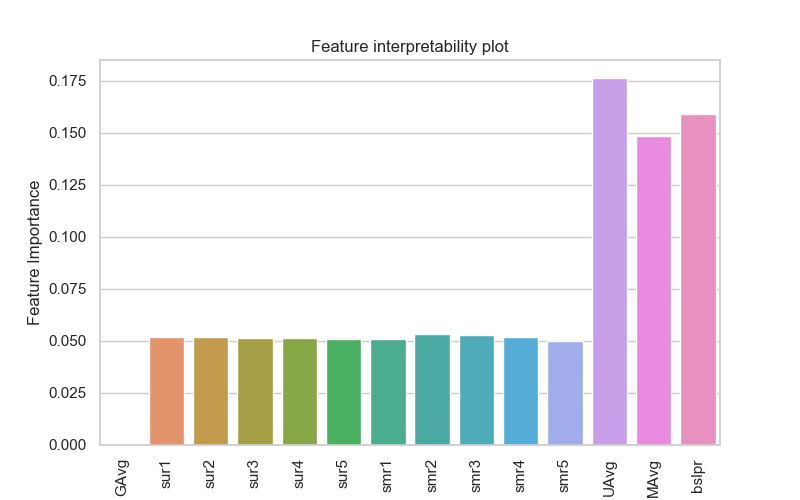

In [70]:
# plotting feature importance
coloumns = x_train.columns
feature_imp = xgb_bsl.best_estimator_.feature_importances_

sns.set(style="whitegrid")
plt.figure(figsize=(8,5))
sns.barplot(x = coloumns,y = feature_imp)
plt.xticks(rotation='vertical')
plt.xlabel("Feature Name")
plt.ylabel("Feature Importance")
plt.title("Feature interpretability plot")
plt.show()

### 5.3 Tuning XGBoost with initial 13 features + Surprise Baseline predictor + KNNBaseline predictor

- Surprise KNNBaseline with user user similarities

In [71]:
# we specify , how to compute similarities and what to consider with sim_options to our algorithm
sim_options = {'user_based' : True,
               'name': 'pearson_baseline',
               'shrinkage': 100,
               'min_support': 2
              } 
# we keep other parameters like regularization parameter and learning_rate as default values.
bsl_options = {'method': 'sgd'} 

knn_bsl_u = KNNBaseline(k=40, sim_options = sim_options, bsl_options = bsl_options)
knn_bsl_u_train_results, knn_bsl_u_test_results = run_surprise(knn_bsl_u, trainset, testset, verbose=True)



Training the model...
Estimating biases using sgd...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Done. time taken : 0:05:42.519686 

Evaluating the model with train data..
time taken : 0:09:21.186649
---------------
Train Data
---------------
RMSE : 0.3278050914466148

MAPE : 9.027978982373568

adding train results in the dictionary..

Evaluating for test data...
time taken : 0:00:00.113587
---------------
Test Data
---------------
RMSE : 1.072409004806261

MAPE : 34.936622813459635

storing the test results in test dictionary...

---------------------------------------------
Total time taken to run this algorithm : 0:15:03.837434


In [72]:
# Just store these error metrics in our models_evaluation datastructure
tuned_models_evaluation_train['knn_bsl_u'] = knn_bsl_u_train_results 
tuned_models_evaluation_test['knn_bsl_u'] = knn_bsl_u_test_results

- Surprise KNNBaseline with movie movie similarities

In [73]:
# we specify , how to compute similarities and what to consider with sim_options to our algorithm

# 'user_based' : Fals => this considers the similarities of movies instead of users

sim_options = {'user_based' : False,
               'name': 'pearson_baseline',
               'shrinkage': 100,
               'min_support': 2
              } 
# we keep other parameters like regularization parameter and learning_rate as default values.
bsl_options = {'method': 'sgd'}


knn_bsl_m = KNNBaseline(k=40, sim_options = sim_options, bsl_options = bsl_options)

knn_bsl_m_train_results, knn_bsl_m_test_results = run_surprise(knn_bsl_m, trainset, testset, verbose=True)

Training the model...
Estimating biases using sgd...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Done. time taken : 0:00:02.907284 

Evaluating the model with train data..
time taken : 0:00:17.127093
---------------
Train Data
---------------
RMSE : 0.32316657950987937

MAPE : 8.404159172327828

adding train results in the dictionary..

Evaluating for test data...
time taken : 0:00:00.091570
---------------
Test Data
---------------
RMSE : 1.0723215145319687

MAPE : 34.92807707883072

storing the test results in test dictionary...

---------------------------------------------
Total time taken to run this algorithm : 0:00:20.128949


In [74]:
# Just store these error metrics in our models_evaluation datastructure
tuned_models_evaluation_train['knn_bsl_m'] = knn_bsl_m_train_results 
tuned_models_evaluation_test['knn_bsl_m'] = knn_bsl_m_test_results

In [75]:
# add the predicted values from both knns to this dataframe
reg_train['knn_bsl_u'] = tuned_models_evaluation_train['knn_bsl_u']['predictions']
reg_train['knn_bsl_m'] = tuned_models_evaluation_train['knn_bsl_m']['predictions']

reg_train.head(2)

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,smr3,smr4,smr5,UAvg,MAvg,rating,bslpr,knn_bsl_u,knn_bsl_m
0,174683,10,3.587581,5.0,5.0,3.0,4.0,4.0,3.0,5.0,4.0,3.0,2.0,3.882353,3.611111,5,3.672848,4.996793,4.977554
1,233949,10,3.587581,4.0,4.0,5.0,1.0,3.0,2.0,3.0,2.0,3.0,3.0,2.692308,3.611111,3,3.688917,3.062453,3.051725


In [76]:
reg_test_df['knn_bsl_u'] = tuned_models_evaluation_test['knn_bsl_u']['predictions']
reg_test_df['knn_bsl_m'] = tuned_models_evaluation_test['knn_bsl_m']['predictions']

reg_test_df.head(2)

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,smr3,smr4,smr5,UAvg,MAvg,rating,bslpr,knn_bsl_u,knn_bsl_m
0,808635,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,5,3.579949,3.579949,3.579949
1,941866,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,4,3.579949,3.579949,3.579949


In [77]:
# prepare the train data....
x_train = reg_train.drop(['user', 'movie', 'rating'], axis=1)
y_train = reg_train['rating']

# prepare the train data....
x_test = reg_test_df.drop(['user','movie','rating'], axis=1)
y_test = reg_test_df['rating']

# making model ready for tuning
xgb = XGBRegressor(silent=False, n_jobs=-1)
xgb_knn_bsl_um = GridSearchCV(xgb,param_grid,cv = 5)

In [78]:
train_results, test_results = run_xgboost(xgb_knn_bsl_um, x_train, y_train, x_test, y_test)

# store the results in models_evaluations dictionaries
tuned_models_evaluation_train['xgb_knn_bsl_um'] = train_results
tuned_models_evaluation_test['xgb_knn_bsl_um'] = test_results


Training the model..
[13:53:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1404 extra nodes, 0 pruned nodes, max_depth=10
[13:53:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1416 extra nodes, 0 pruned nodes, max_depth=10
[13:53:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1420 extra nodes, 0 pruned nodes, max_depth=10
[13:53:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1430 extra nodes, 0 pruned nodes, max_depth=10
[13:53:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1430 extra nodes, 0 pruned nodes, max_depth=10
[13:53:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1430 extra nodes, 0 pruned nodes, max_depth=10
[13:53:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1460 extra nodes, 0 pruned nodes, max_depth=10
[13:53:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1408 extra nodes, 0 pruned nodes, max_depth=10
[13:53:26] src/tree/updater_prune.cc:74: tree pruning end, 

[13:53:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1758 extra nodes, 0 pruned nodes, max_depth=10
[13:53:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1682 extra nodes, 0 pruned nodes, max_depth=10
[13:53:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1750 extra nodes, 0 pruned nodes, max_depth=10
[13:53:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1672 extra nodes, 0 pruned nodes, max_depth=10
[13:53:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1706 extra nodes, 0 pruned nodes, max_depth=10
[13:53:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1682 extra nodes, 0 pruned nodes, max_depth=10
[13:53:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1692 extra nodes, 0 pruned nodes, max_depth=10
[13:53:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1770 extra nodes, 0 pruned nodes, max_depth=10
[13:53:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1770 extra n

[13:53:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1560 extra nodes, 0 pruned nodes, max_depth=10
[13:53:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1710 extra nodes, 0 pruned nodes, max_depth=10
[13:53:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1630 extra nodes, 0 pruned nodes, max_depth=10
[13:53:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1636 extra nodes, 0 pruned nodes, max_depth=10
[13:53:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1680 extra nodes, 0 pruned nodes, max_depth=10
[13:53:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1594 extra nodes, 0 pruned nodes, max_depth=10
[13:53:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1620 extra nodes, 0 pruned nodes, max_depth=10
[13:53:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1620 extra nodes, 0 pruned nodes, max_depth=10
[13:53:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1694 extra n

[13:53:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1502 extra nodes, 0 pruned nodes, max_depth=10
[13:53:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1584 extra nodes, 0 pruned nodes, max_depth=10
[13:53:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1514 extra nodes, 0 pruned nodes, max_depth=10
[13:53:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1600 extra nodes, 0 pruned nodes, max_depth=10
[13:53:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1510 extra nodes, 0 pruned nodes, max_depth=10
[13:53:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1584 extra nodes, 0 pruned nodes, max_depth=10
[13:53:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1618 extra nodes, 0 pruned nodes, max_depth=10
[13:53:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1536 extra nodes, 0 pruned nodes, max_depth=10
[13:53:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1614 extra n

[13:54:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1780 extra nodes, 0 pruned nodes, max_depth=10
[13:54:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1782 extra nodes, 0 pruned nodes, max_depth=10
[13:54:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1772 extra nodes, 0 pruned nodes, max_depth=10
[13:54:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1746 extra nodes, 0 pruned nodes, max_depth=10
[13:54:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1794 extra nodes, 0 pruned nodes, max_depth=10
[13:54:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1800 extra nodes, 0 pruned nodes, max_depth=10
[13:54:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1792 extra nodes, 0 pruned nodes, max_depth=10
[13:54:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1774 extra nodes, 0 pruned nodes, max_depth=10
[13:54:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1854 extra n

[13:54:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1780 extra nodes, 0 pruned nodes, max_depth=10
[13:54:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1652 extra nodes, 0 pruned nodes, max_depth=10
[13:54:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1714 extra nodes, 0 pruned nodes, max_depth=10
[13:54:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1796 extra nodes, 0 pruned nodes, max_depth=10
[13:54:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1664 extra nodes, 0 pruned nodes, max_depth=10
[13:54:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1750 extra nodes, 0 pruned nodes, max_depth=10
[13:54:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1658 extra nodes, 0 pruned nodes, max_depth=10
[13:54:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1696 extra nodes, 0 pruned nodes, max_depth=10
[13:54:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1820 extra n

[13:54:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1534 extra nodes, 0 pruned nodes, max_depth=10
[13:54:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1640 extra nodes, 0 pruned nodes, max_depth=10
[13:54:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1590 extra nodes, 0 pruned nodes, max_depth=10
[13:54:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1566 extra nodes, 0 pruned nodes, max_depth=10
[13:54:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1632 extra nodes, 0 pruned nodes, max_depth=10
[13:54:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1498 extra nodes, 0 pruned nodes, max_depth=10
[13:54:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1666 extra nodes, 0 pruned nodes, max_depth=10
[13:54:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1666 extra nodes, 0 pruned nodes, max_depth=10
[13:54:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1562 extra n

[13:54:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1350 extra nodes, 0 pruned nodes, max_depth=10
[13:54:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1356 extra nodes, 0 pruned nodes, max_depth=10
[13:54:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1382 extra nodes, 0 pruned nodes, max_depth=10
[13:54:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1372 extra nodes, 0 pruned nodes, max_depth=10
[13:54:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1376 extra nodes, 0 pruned nodes, max_depth=10
[13:54:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1390 extra nodes, 0 pruned nodes, max_depth=10
[13:54:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1390 extra nodes, 0 pruned nodes, max_depth=10
[13:54:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1412 extra nodes, 0 pruned nodes, max_depth=10
[13:54:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1376 extra n

[13:54:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1582 extra nodes, 0 pruned nodes, max_depth=10
[13:54:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1696 extra nodes, 0 pruned nodes, max_depth=10
[13:54:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1570 extra nodes, 0 pruned nodes, max_depth=10
[13:54:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1716 extra nodes, 0 pruned nodes, max_depth=10
[13:54:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1604 extra nodes, 0 pruned nodes, max_depth=10
[13:54:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1604 extra nodes, 0 pruned nodes, max_depth=10
[13:54:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1620 extra nodes, 0 pruned nodes, max_depth=10
[13:54:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1604 extra nodes, 0 pruned nodes, max_depth=10
[13:54:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1646 extra n

[13:54:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1538 extra nodes, 0 pruned nodes, max_depth=10
[13:54:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1524 extra nodes, 0 pruned nodes, max_depth=10
[13:54:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1540 extra nodes, 0 pruned nodes, max_depth=10
[13:54:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1602 extra nodes, 0 pruned nodes, max_depth=10
[13:54:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1572 extra nodes, 0 pruned nodes, max_depth=10
[13:54:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1600 extra nodes, 0 pruned nodes, max_depth=10
[13:54:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1558 extra nodes, 0 pruned nodes, max_depth=10
[13:54:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1588 extra nodes, 0 pruned nodes, max_depth=10
[13:54:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1604 extra n

[13:54:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1560 extra nodes, 0 pruned nodes, max_depth=10
[13:54:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1474 extra nodes, 0 pruned nodes, max_depth=10
[13:54:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1542 extra nodes, 0 pruned nodes, max_depth=10
[13:54:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1458 extra nodes, 0 pruned nodes, max_depth=10
[13:54:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1544 extra nodes, 0 pruned nodes, max_depth=10
[13:54:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1492 extra nodes, 0 pruned nodes, max_depth=10
[13:54:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1544 extra nodes, 0 pruned nodes, max_depth=10
[13:54:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1514 extra nodes, 0 pruned nodes, max_depth=10
[13:54:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1560 extra n

[13:55:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1702 extra nodes, 0 pruned nodes, max_depth=10
[13:55:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1742 extra nodes, 0 pruned nodes, max_depth=10
[13:55:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1714 extra nodes, 0 pruned nodes, max_depth=10
[13:55:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1764 extra nodes, 0 pruned nodes, max_depth=10
[13:55:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1710 extra nodes, 0 pruned nodes, max_depth=10
[13:55:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1742 extra nodes, 0 pruned nodes, max_depth=10
[13:55:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1704 extra nodes, 0 pruned nodes, max_depth=10
[13:55:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1370 extra nodes, 0 pruned nodes, max_depth=10
[13:55:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1404 extra n

[13:55:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1602 extra nodes, 0 pruned nodes, max_depth=10
[13:55:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1614 extra nodes, 0 pruned nodes, max_depth=10
[13:55:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1718 extra nodes, 0 pruned nodes, max_depth=10
[13:55:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1638 extra nodes, 0 pruned nodes, max_depth=10
[13:55:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1608 extra nodes, 0 pruned nodes, max_depth=10
[13:55:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1690 extra nodes, 0 pruned nodes, max_depth=10
[13:55:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1656 extra nodes, 0 pruned nodes, max_depth=10
[13:55:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1698 extra nodes, 0 pruned nodes, max_depth=10
[13:55:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1628 extra n

[13:55:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1602 extra nodes, 0 pruned nodes, max_depth=10
[13:55:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1554 extra nodes, 0 pruned nodes, max_depth=10
[13:55:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1498 extra nodes, 0 pruned nodes, max_depth=10
[13:55:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1496 extra nodes, 0 pruned nodes, max_depth=10
[13:55:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1576 extra nodes, 0 pruned nodes, max_depth=10
[13:55:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1486 extra nodes, 0 pruned nodes, max_depth=10
[13:55:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1590 extra nodes, 0 pruned nodes, max_depth=10
[13:55:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1594 extra nodes, 0 pruned nodes, max_depth=10
[13:55:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1554 extra n

[13:55:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1324 extra nodes, 0 pruned nodes, max_depth=10
[13:55:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1364 extra nodes, 0 pruned nodes, max_depth=10
[13:55:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1340 extra nodes, 0 pruned nodes, max_depth=10
[13:55:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1388 extra nodes, 0 pruned nodes, max_depth=10
[13:55:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1390 extra nodes, 0 pruned nodes, max_depth=10
[13:55:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1344 extra nodes, 0 pruned nodes, max_depth=10
[13:55:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1402 extra nodes, 0 pruned nodes, max_depth=10
[13:55:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1416 extra nodes, 0 pruned nodes, max_depth=10
[13:55:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1404 extra n

[13:55:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1624 extra nodes, 0 pruned nodes, max_depth=10
[13:55:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1534 extra nodes, 0 pruned nodes, max_depth=10
[13:55:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1564 extra nodes, 0 pruned nodes, max_depth=10
[13:55:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1632 extra nodes, 0 pruned nodes, max_depth=10
[13:55:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1528 extra nodes, 0 pruned nodes, max_depth=10
[13:55:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1666 extra nodes, 0 pruned nodes, max_depth=10
[13:55:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1562 extra nodes, 0 pruned nodes, max_depth=10
[13:55:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1638 extra nodes, 0 pruned nodes, max_depth=10
[13:55:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1554 extra n

[13:55:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1514 extra nodes, 0 pruned nodes, max_depth=10
[13:55:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1514 extra nodes, 0 pruned nodes, max_depth=10
[13:55:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1582 extra nodes, 0 pruned nodes, max_depth=10
[13:55:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1518 extra nodes, 0 pruned nodes, max_depth=10
[13:55:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1560 extra nodes, 0 pruned nodes, max_depth=10
[13:55:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1578 extra nodes, 0 pruned nodes, max_depth=10
[13:55:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1578 extra nodes, 0 pruned nodes, max_depth=10
[13:55:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1574 extra nodes, 0 pruned nodes, max_depth=10
[13:55:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1578 extra n

[13:56:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1530 extra nodes, 0 pruned nodes, max_depth=10
[13:56:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1412 extra nodes, 0 pruned nodes, max_depth=10
[13:56:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1488 extra nodes, 0 pruned nodes, max_depth=10
[13:56:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1540 extra nodes, 0 pruned nodes, max_depth=10
[13:56:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1446 extra nodes, 0 pruned nodes, max_depth=10
[13:56:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1548 extra nodes, 0 pruned nodes, max_depth=10
[13:56:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1552 extra nodes, 0 pruned nodes, max_depth=10
[13:56:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1494 extra nodes, 0 pruned nodes, max_depth=10
[13:56:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1476 extra n

[13:56:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1646 extra nodes, 0 pruned nodes, max_depth=10
[13:56:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1650 extra nodes, 0 pruned nodes, max_depth=10
[13:56:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1326 extra nodes, 0 pruned nodes, max_depth=10
[13:56:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1356 extra nodes, 0 pruned nodes, max_depth=10
[13:56:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1352 extra nodes, 0 pruned nodes, max_depth=10
[13:56:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1374 extra nodes, 0 pruned nodes, max_depth=10
[13:56:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1392 extra nodes, 0 pruned nodes, max_depth=10
[13:56:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1378 extra nodes, 0 pruned nodes, max_depth=10
[13:56:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1398 extra n

[13:56:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1688 extra nodes, 0 pruned nodes, max_depth=10
[13:56:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1582 extra nodes, 0 pruned nodes, max_depth=10
[13:56:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1632 extra nodes, 0 pruned nodes, max_depth=10
[13:56:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1636 extra nodes, 0 pruned nodes, max_depth=10
[13:56:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1560 extra nodes, 0 pruned nodes, max_depth=10
[13:56:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1614 extra nodes, 0 pruned nodes, max_depth=10
[13:56:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1562 extra nodes, 0 pruned nodes, max_depth=10
[13:56:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1622 extra nodes, 0 pruned nodes, max_depth=10
[13:56:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1704 extra n

[13:56:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1490 extra nodes, 0 pruned nodes, max_depth=10
[13:56:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1464 extra nodes, 0 pruned nodes, max_depth=10
[13:56:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1550 extra nodes, 0 pruned nodes, max_depth=10
[13:56:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1540 extra nodes, 0 pruned nodes, max_depth=10
[13:56:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1540 extra nodes, 0 pruned nodes, max_depth=10
[13:56:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1444 extra nodes, 0 pruned nodes, max_depth=10
[13:56:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1586 extra nodes, 0 pruned nodes, max_depth=10
[13:56:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1482 extra nodes, 0 pruned nodes, max_depth=10
[13:56:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1560 extra n

[13:56:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7900 extra nodes, 0 pruned nodes, max_depth=15
[13:56:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8062 extra nodes, 0 pruned nodes, max_depth=15
[13:56:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8048 extra nodes, 0 pruned nodes, max_depth=15
[13:56:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8126 extra nodes, 0 pruned nodes, max_depth=15
[13:56:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8336 extra nodes, 0 pruned nodes, max_depth=15
[13:56:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8388 extra nodes, 0 pruned nodes, max_depth=15
[13:56:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8436 extra nodes, 0 pruned nodes, max_depth=15
[13:56:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8672 extra nodes, 0 pruned nodes, max_depth=15
[13:56:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8838 extra n

[13:56:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15668 extra nodes, 0 pruned nodes, max_depth=15
[13:56:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15676 extra nodes, 0 pruned nodes, max_depth=15
[13:56:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15764 extra nodes, 0 pruned nodes, max_depth=15
[13:56:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16136 extra nodes, 0 pruned nodes, max_depth=15
[13:56:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16168 extra nodes, 0 pruned nodes, max_depth=15
[13:56:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16018 extra nodes, 0 pruned nodes, max_depth=15
[13:56:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16334 extra nodes, 0 pruned nodes, max_depth=15
[13:56:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16604 extra nodes, 0 pruned nodes, max_depth=15
[13:56:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1601

[13:57:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12988 extra nodes, 0 pruned nodes, max_depth=15
[13:57:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13342 extra nodes, 0 pruned nodes, max_depth=15
[13:57:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13618 extra nodes, 0 pruned nodes, max_depth=15
[13:57:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13900 extra nodes, 0 pruned nodes, max_depth=15
[13:57:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13448 extra nodes, 0 pruned nodes, max_depth=15
[13:57:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14102 extra nodes, 0 pruned nodes, max_depth=15
[13:57:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14316 extra nodes, 0 pruned nodes, max_depth=15
[13:57:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13528 extra nodes, 0 pruned nodes, max_depth=15
[13:57:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1385

[13:57:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8940 extra nodes, 0 pruned nodes, max_depth=15
[13:57:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9746 extra nodes, 0 pruned nodes, max_depth=15
[13:57:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9176 extra nodes, 0 pruned nodes, max_depth=15
[13:57:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9826 extra nodes, 0 pruned nodes, max_depth=15
[13:57:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9938 extra nodes, 0 pruned nodes, max_depth=15
[13:57:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9484 extra nodes, 0 pruned nodes, max_depth=15
[13:57:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9636 extra nodes, 0 pruned nodes, max_depth=15
[13:57:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10442 extra nodes, 0 pruned nodes, max_depth=15
[13:57:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9972 extra 

[13:57:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16698 extra nodes, 0 pruned nodes, max_depth=15
[13:57:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16524 extra nodes, 0 pruned nodes, max_depth=15
[13:57:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16552 extra nodes, 0 pruned nodes, max_depth=15
[13:57:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17060 extra nodes, 0 pruned nodes, max_depth=15
[13:57:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16018 extra nodes, 0 pruned nodes, max_depth=15
[13:57:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6452 extra nodes, 0 pruned nodes, max_depth=15
[13:57:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6722 extra nodes, 0 pruned nodes, max_depth=15
[13:57:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6698 extra nodes, 0 pruned nodes, max_depth=15
[13:57:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6894 ex

[13:57:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14424 extra nodes, 0 pruned nodes, max_depth=15
[13:57:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14094 extra nodes, 0 pruned nodes, max_depth=15
[13:57:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14320 extra nodes, 0 pruned nodes, max_depth=15
[13:57:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14940 extra nodes, 0 pruned nodes, max_depth=15
[13:57:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14698 extra nodes, 0 pruned nodes, max_depth=15
[13:57:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15198 extra nodes, 0 pruned nodes, max_depth=15
[13:57:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14300 extra nodes, 0 pruned nodes, max_depth=15
[13:57:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15000 extra nodes, 0 pruned nodes, max_depth=15
[13:57:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1454

[13:58:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10290 extra nodes, 0 pruned nodes, max_depth=15
[13:58:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10562 extra nodes, 0 pruned nodes, max_depth=15
[13:58:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10546 extra nodes, 0 pruned nodes, max_depth=15
[13:58:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10390 extra nodes, 0 pruned nodes, max_depth=15
[13:58:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11122 extra nodes, 0 pruned nodes, max_depth=15
[13:58:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11198 extra nodes, 0 pruned nodes, max_depth=15
[13:58:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10928 extra nodes, 0 pruned nodes, max_depth=15
[13:58:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11460 extra nodes, 0 pruned nodes, max_depth=15
[13:58:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1162

[13:58:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5984 extra nodes, 0 pruned nodes, max_depth=15
[13:58:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6154 extra nodes, 0 pruned nodes, max_depth=15
[13:58:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6268 extra nodes, 0 pruned nodes, max_depth=15
[13:58:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6248 extra nodes, 0 pruned nodes, max_depth=15
[13:58:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6406 extra nodes, 0 pruned nodes, max_depth=15
[13:58:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6524 extra nodes, 0 pruned nodes, max_depth=15
[13:58:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6366 extra nodes, 0 pruned nodes, max_depth=15
[13:58:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6626 extra nodes, 0 pruned nodes, max_depth=15
[13:58:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6484 extra n

[13:58:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12438 extra nodes, 0 pruned nodes, max_depth=15
[13:58:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12458 extra nodes, 0 pruned nodes, max_depth=15
[13:58:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12588 extra nodes, 0 pruned nodes, max_depth=15
[13:58:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12578 extra nodes, 0 pruned nodes, max_depth=15
[13:58:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12576 extra nodes, 0 pruned nodes, max_depth=15
[13:58:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12868 extra nodes, 0 pruned nodes, max_depth=15
[13:58:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12934 extra nodes, 0 pruned nodes, max_depth=15
[13:58:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13004 extra nodes, 0 pruned nodes, max_depth=15
[13:58:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1298

[13:58:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10580 extra nodes, 0 pruned nodes, max_depth=15
[13:58:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10190 extra nodes, 0 pruned nodes, max_depth=15
[13:58:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10688 extra nodes, 0 pruned nodes, max_depth=15
[13:58:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10402 extra nodes, 0 pruned nodes, max_depth=15
[13:58:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10852 extra nodes, 0 pruned nodes, max_depth=15
[13:58:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10656 extra nodes, 0 pruned nodes, max_depth=15
[13:58:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10836 extra nodes, 0 pruned nodes, max_depth=15
[13:58:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10746 extra nodes, 0 pruned nodes, max_depth=15
[13:58:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1103

[13:59:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6608 extra nodes, 0 pruned nodes, max_depth=15
[13:59:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6950 extra nodes, 0 pruned nodes, max_depth=15
[13:59:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6912 extra nodes, 0 pruned nodes, max_depth=15
[13:59:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7232 extra nodes, 0 pruned nodes, max_depth=15
[13:59:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7180 extra nodes, 0 pruned nodes, max_depth=15
[13:59:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7638 extra nodes, 0 pruned nodes, max_depth=15
[13:59:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7294 extra nodes, 0 pruned nodes, max_depth=15
[13:59:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7926 extra nodes, 0 pruned nodes, max_depth=15
[13:59:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7548 extra n

[13:59:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13074 extra nodes, 0 pruned nodes, max_depth=15
[13:59:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12972 extra nodes, 0 pruned nodes, max_depth=15
[13:59:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12694 extra nodes, 0 pruned nodes, max_depth=15
[13:59:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13322 extra nodes, 0 pruned nodes, max_depth=15
[13:59:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12888 extra nodes, 0 pruned nodes, max_depth=15
[13:59:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13126 extra nodes, 0 pruned nodes, max_depth=15
[13:59:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13546 extra nodes, 0 pruned nodes, max_depth=15
[13:59:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13096 extra nodes, 0 pruned nodes, max_depth=15
[13:59:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1305

[13:59:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10884 extra nodes, 0 pruned nodes, max_depth=15
[13:59:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10778 extra nodes, 0 pruned nodes, max_depth=15
[13:59:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10886 extra nodes, 0 pruned nodes, max_depth=15
[13:59:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11288 extra nodes, 0 pruned nodes, max_depth=15
[13:59:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11044 extra nodes, 0 pruned nodes, max_depth=15
[13:59:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11456 extra nodes, 0 pruned nodes, max_depth=15
[13:59:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12014 extra nodes, 0 pruned nodes, max_depth=15
[13:59:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11270 extra nodes, 0 pruned nodes, max_depth=15
[13:59:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1146

[13:59:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8020 extra nodes, 0 pruned nodes, max_depth=15
[13:59:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7616 extra nodes, 0 pruned nodes, max_depth=15
[13:59:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7736 extra nodes, 0 pruned nodes, max_depth=15
[13:59:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8322 extra nodes, 0 pruned nodes, max_depth=15
[13:59:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7996 extra nodes, 0 pruned nodes, max_depth=15
[13:59:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8412 extra nodes, 0 pruned nodes, max_depth=15
[13:59:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8208 extra nodes, 0 pruned nodes, max_depth=15
[13:59:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8362 extra nodes, 0 pruned nodes, max_depth=15
[13:59:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8930 extra n

[14:00:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4610 extra nodes, 0 pruned nodes, max_depth=15
[14:00:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4686 extra nodes, 0 pruned nodes, max_depth=15
[14:00:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4798 extra nodes, 0 pruned nodes, max_depth=15
[14:00:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4826 extra nodes, 0 pruned nodes, max_depth=15
[14:00:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4966 extra nodes, 0 pruned nodes, max_depth=15
[14:00:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5074 extra nodes, 0 pruned nodes, max_depth=15
[14:00:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5132 extra nodes, 0 pruned nodes, max_depth=15
[14:00:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5304 extra nodes, 0 pruned nodes, max_depth=15
[14:00:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5308 extra n

[14:00:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10440 extra nodes, 0 pruned nodes, max_depth=15
[14:00:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10894 extra nodes, 0 pruned nodes, max_depth=15
[14:00:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10562 extra nodes, 0 pruned nodes, max_depth=15
[14:00:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11022 extra nodes, 0 pruned nodes, max_depth=15
[14:00:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10386 extra nodes, 0 pruned nodes, max_depth=15
[14:00:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10958 extra nodes, 0 pruned nodes, max_depth=15
[14:00:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11318 extra nodes, 0 pruned nodes, max_depth=15
[14:00:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10786 extra nodes, 0 pruned nodes, max_depth=15
[14:00:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1114

[14:00:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8358 extra nodes, 0 pruned nodes, max_depth=15
[14:00:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8478 extra nodes, 0 pruned nodes, max_depth=15
[14:00:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8638 extra nodes, 0 pruned nodes, max_depth=15
[14:00:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8728 extra nodes, 0 pruned nodes, max_depth=15
[14:00:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8824 extra nodes, 0 pruned nodes, max_depth=15
[14:00:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8704 extra nodes, 0 pruned nodes, max_depth=15
[14:00:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9024 extra nodes, 0 pruned nodes, max_depth=15
[14:00:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8868 extra nodes, 0 pruned nodes, max_depth=15
[14:00:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9570 extra n

[14:00:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5632 extra nodes, 0 pruned nodes, max_depth=15
[14:00:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5700 extra nodes, 0 pruned nodes, max_depth=15
[14:00:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5850 extra nodes, 0 pruned nodes, max_depth=15
[14:00:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5848 extra nodes, 0 pruned nodes, max_depth=15
[14:00:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5772 extra nodes, 0 pruned nodes, max_depth=15
[14:00:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5914 extra nodes, 0 pruned nodes, max_depth=15
[14:00:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6020 extra nodes, 0 pruned nodes, max_depth=15
[14:00:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6150 extra nodes, 0 pruned nodes, max_depth=15
[14:00:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6318 extra n

[14:01:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11140 extra nodes, 0 pruned nodes, max_depth=15
[14:01:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11112 extra nodes, 0 pruned nodes, max_depth=15
[14:01:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11384 extra nodes, 0 pruned nodes, max_depth=15
[14:01:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11180 extra nodes, 0 pruned nodes, max_depth=15
[14:01:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11364 extra nodes, 0 pruned nodes, max_depth=15
[14:01:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11152 extra nodes, 0 pruned nodes, max_depth=15
[14:01:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11424 extra nodes, 0 pruned nodes, max_depth=15
[14:01:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11462 extra nodes, 0 pruned nodes, max_depth=15
[14:01:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1138

[14:01:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9440 extra nodes, 0 pruned nodes, max_depth=15
[14:01:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9376 extra nodes, 0 pruned nodes, max_depth=15
[14:01:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9486 extra nodes, 0 pruned nodes, max_depth=15
[14:01:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9304 extra nodes, 0 pruned nodes, max_depth=15
[14:01:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9436 extra nodes, 0 pruned nodes, max_depth=15
[14:01:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9680 extra nodes, 0 pruned nodes, max_depth=15
[14:01:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9366 extra nodes, 0 pruned nodes, max_depth=15
[14:01:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9654 extra nodes, 0 pruned nodes, max_depth=15
[14:01:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10196 extra 

[14:01:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6638 extra nodes, 0 pruned nodes, max_depth=15
[14:01:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6426 extra nodes, 0 pruned nodes, max_depth=15
[14:01:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6598 extra nodes, 0 pruned nodes, max_depth=15
[14:01:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7042 extra nodes, 0 pruned nodes, max_depth=15
[14:01:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6752 extra nodes, 0 pruned nodes, max_depth=15
[14:01:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7086 extra nodes, 0 pruned nodes, max_depth=15
[14:01:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7316 extra nodes, 0 pruned nodes, max_depth=15
[14:01:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7086 extra nodes, 0 pruned nodes, max_depth=15
[14:01:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7404 extra n

[14:01:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11890 extra nodes, 0 pruned nodes, max_depth=15
[14:01:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10834 extra nodes, 0 pruned nodes, max_depth=15
[14:01:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8638 extra nodes, 0 pruned nodes, max_depth=20
[14:01:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8960 extra nodes, 0 pruned nodes, max_depth=20
[14:01:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9182 extra nodes, 0 pruned nodes, max_depth=20
[14:01:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9392 extra nodes, 0 pruned nodes, max_depth=20
[14:01:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9662 extra nodes, 0 pruned nodes, max_depth=20
[14:01:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9682 extra nodes, 0 pruned nodes, max_depth=20
[14:01:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9944 extra

[14:02:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32014 extra nodes, 0 pruned nodes, max_depth=20
[14:02:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 31710 extra nodes, 0 pruned nodes, max_depth=20
[14:02:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32002 extra nodes, 0 pruned nodes, max_depth=20
[14:02:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32456 extra nodes, 0 pruned nodes, max_depth=20
[14:02:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32512 extra nodes, 0 pruned nodes, max_depth=20
[14:02:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33218 extra nodes, 0 pruned nodes, max_depth=20
[14:02:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33486 extra nodes, 0 pruned nodes, max_depth=20
[14:02:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34332 extra nodes, 0 pruned nodes, max_depth=20
[14:02:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3362

[14:02:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19296 extra nodes, 0 pruned nodes, max_depth=20
[14:02:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19626 extra nodes, 0 pruned nodes, max_depth=20
[14:02:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20442 extra nodes, 0 pruned nodes, max_depth=20
[14:02:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20486 extra nodes, 0 pruned nodes, max_depth=20
[14:02:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20596 extra nodes, 0 pruned nodes, max_depth=20
[14:02:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21302 extra nodes, 0 pruned nodes, max_depth=20
[14:02:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21460 extra nodes, 0 pruned nodes, max_depth=20
[14:02:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22286 extra nodes, 0 pruned nodes, max_depth=20
[14:02:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2267

[14:02:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10586 extra nodes, 0 pruned nodes, max_depth=20
[14:02:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10762 extra nodes, 0 pruned nodes, max_depth=20
[14:02:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10796 extra nodes, 0 pruned nodes, max_depth=20
[14:02:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11504 extra nodes, 0 pruned nodes, max_depth=20
[14:02:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11520 extra nodes, 0 pruned nodes, max_depth=20
[14:02:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12222 extra nodes, 0 pruned nodes, max_depth=20
[14:02:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12184 extra nodes, 0 pruned nodes, max_depth=20
[14:02:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12374 extra nodes, 0 pruned nodes, max_depth=20
[14:02:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1216

[14:03:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34650 extra nodes, 0 pruned nodes, max_depth=20
[14:03:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34534 extra nodes, 0 pruned nodes, max_depth=20
[14:03:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35262 extra nodes, 0 pruned nodes, max_depth=20
[14:03:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36254 extra nodes, 0 pruned nodes, max_depth=20
[14:03:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36702 extra nodes, 0 pruned nodes, max_depth=20
[14:03:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35936 extra nodes, 0 pruned nodes, max_depth=20
[14:03:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36894 extra nodes, 0 pruned nodes, max_depth=20
[14:03:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36902 extra nodes, 0 pruned nodes, max_depth=20
[14:03:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3720

[14:03:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23660 extra nodes, 0 pruned nodes, max_depth=20
[14:03:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24480 extra nodes, 0 pruned nodes, max_depth=20
[14:03:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25114 extra nodes, 0 pruned nodes, max_depth=20
[14:03:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24786 extra nodes, 0 pruned nodes, max_depth=20
[14:03:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26154 extra nodes, 0 pruned nodes, max_depth=20
[14:03:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25548 extra nodes, 0 pruned nodes, max_depth=20
[14:03:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26314 extra nodes, 0 pruned nodes, max_depth=20
[14:03:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26390 extra nodes, 0 pruned nodes, max_depth=20
[14:03:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2692

[14:04:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13780 extra nodes, 0 pruned nodes, max_depth=20
[14:04:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14264 extra nodes, 0 pruned nodes, max_depth=20
[14:04:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13864 extra nodes, 0 pruned nodes, max_depth=20
[14:04:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14172 extra nodes, 0 pruned nodes, max_depth=20
[14:04:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15006 extra nodes, 0 pruned nodes, max_depth=20
[14:04:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15240 extra nodes, 0 pruned nodes, max_depth=20
[14:04:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15072 extra nodes, 0 pruned nodes, max_depth=20
[14:04:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15904 extra nodes, 0 pruned nodes, max_depth=20
[14:04:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1616

[14:04:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 37962 extra nodes, 0 pruned nodes, max_depth=20
[14:04:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 38670 extra nodes, 0 pruned nodes, max_depth=20
[14:04:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 39318 extra nodes, 0 pruned nodes, max_depth=20
[14:04:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 39618 extra nodes, 0 pruned nodes, max_depth=20
[14:04:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 38708 extra nodes, 0 pruned nodes, max_depth=20
[14:04:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6220 extra nodes, 0 pruned nodes, max_depth=20
[14:04:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6466 extra nodes, 0 pruned nodes, max_depth=20
[14:04:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6598 extra nodes, 0 pruned nodes, max_depth=20
[14:04:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6758 ex

[14:04:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21844 extra nodes, 0 pruned nodes, max_depth=20
[14:04:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22054 extra nodes, 0 pruned nodes, max_depth=20
[14:04:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23014 extra nodes, 0 pruned nodes, max_depth=20
[14:04:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22336 extra nodes, 0 pruned nodes, max_depth=20
[14:04:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22794 extra nodes, 0 pruned nodes, max_depth=20
[14:04:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23012 extra nodes, 0 pruned nodes, max_depth=20
[14:04:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23630 extra nodes, 0 pruned nodes, max_depth=20
[14:04:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23440 extra nodes, 0 pruned nodes, max_depth=20
[14:04:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2436

[14:05:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13620 extra nodes, 0 pruned nodes, max_depth=20
[14:05:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13712 extra nodes, 0 pruned nodes, max_depth=20
[14:05:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14144 extra nodes, 0 pruned nodes, max_depth=20
[14:05:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14122 extra nodes, 0 pruned nodes, max_depth=20
[14:05:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14366 extra nodes, 0 pruned nodes, max_depth=20
[14:05:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14936 extra nodes, 0 pruned nodes, max_depth=20
[14:05:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14994 extra nodes, 0 pruned nodes, max_depth=20
[14:05:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15288 extra nodes, 0 pruned nodes, max_depth=20
[14:05:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1538

[14:05:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7454 extra nodes, 0 pruned nodes, max_depth=20
[14:05:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7434 extra nodes, 0 pruned nodes, max_depth=20
[14:05:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7588 extra nodes, 0 pruned nodes, max_depth=20
[14:05:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7588 extra nodes, 0 pruned nodes, max_depth=20
[14:05:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7956 extra nodes, 0 pruned nodes, max_depth=20
[14:05:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7966 extra nodes, 0 pruned nodes, max_depth=20
[14:05:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8214 extra nodes, 0 pruned nodes, max_depth=20
[14:05:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8326 extra nodes, 0 pruned nodes, max_depth=20
[14:05:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8924 extra n

[14:05:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25448 extra nodes, 0 pruned nodes, max_depth=20
[14:05:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26164 extra nodes, 0 pruned nodes, max_depth=20
[14:05:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25492 extra nodes, 0 pruned nodes, max_depth=20
[14:05:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25594 extra nodes, 0 pruned nodes, max_depth=20
[14:05:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26126 extra nodes, 0 pruned nodes, max_depth=20
[14:05:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25688 extra nodes, 0 pruned nodes, max_depth=20
[14:05:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26522 extra nodes, 0 pruned nodes, max_depth=20
[14:05:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26954 extra nodes, 0 pruned nodes, max_depth=20
[14:05:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2652

[14:06:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17486 extra nodes, 0 pruned nodes, max_depth=20
[14:06:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16972 extra nodes, 0 pruned nodes, max_depth=20
[14:06:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18224 extra nodes, 0 pruned nodes, max_depth=20
[14:06:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17770 extra nodes, 0 pruned nodes, max_depth=20
[14:06:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18742 extra nodes, 0 pruned nodes, max_depth=20
[14:06:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17812 extra nodes, 0 pruned nodes, max_depth=20
[14:06:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18430 extra nodes, 0 pruned nodes, max_depth=20
[14:06:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19310 extra nodes, 0 pruned nodes, max_depth=20
[14:06:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1904

[14:06:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9276 extra nodes, 0 pruned nodes, max_depth=20
[14:06:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9632 extra nodes, 0 pruned nodes, max_depth=20
[14:06:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9644 extra nodes, 0 pruned nodes, max_depth=20
[14:06:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10160 extra nodes, 0 pruned nodes, max_depth=20
[14:06:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10070 extra nodes, 0 pruned nodes, max_depth=20
[14:06:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10618 extra nodes, 0 pruned nodes, max_depth=20
[14:06:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10548 extra nodes, 0 pruned nodes, max_depth=20
[14:06:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10680 extra nodes, 0 pruned nodes, max_depth=20
[14:06:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11234 e

[14:06:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28182 extra nodes, 0 pruned nodes, max_depth=20
[14:06:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27936 extra nodes, 0 pruned nodes, max_depth=20
[14:06:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28070 extra nodes, 0 pruned nodes, max_depth=20
[14:06:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28372 extra nodes, 0 pruned nodes, max_depth=20
[14:06:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28712 extra nodes, 0 pruned nodes, max_depth=20
[14:06:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29758 extra nodes, 0 pruned nodes, max_depth=20
[14:06:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30008 extra nodes, 0 pruned nodes, max_depth=20
[14:06:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28662 extra nodes, 0 pruned nodes, max_depth=20
[14:06:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4980

[14:07:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16756 extra nodes, 0 pruned nodes, max_depth=20
[14:07:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17664 extra nodes, 0 pruned nodes, max_depth=20
[14:07:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17546 extra nodes, 0 pruned nodes, max_depth=20
[14:07:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18154 extra nodes, 0 pruned nodes, max_depth=20
[14:07:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18088 extra nodes, 0 pruned nodes, max_depth=20
[14:07:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18628 extra nodes, 0 pruned nodes, max_depth=20
[14:07:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18624 extra nodes, 0 pruned nodes, max_depth=20
[14:07:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18640 extra nodes, 0 pruned nodes, max_depth=20
[14:07:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1896

[14:07:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10258 extra nodes, 0 pruned nodes, max_depth=20
[14:07:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10260 extra nodes, 0 pruned nodes, max_depth=20
[14:07:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10528 extra nodes, 0 pruned nodes, max_depth=20
[14:07:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10820 extra nodes, 0 pruned nodes, max_depth=20
[14:07:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11122 extra nodes, 0 pruned nodes, max_depth=20
[14:07:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11590 extra nodes, 0 pruned nodes, max_depth=20
[14:07:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11646 extra nodes, 0 pruned nodes, max_depth=20
[14:07:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11812 extra nodes, 0 pruned nodes, max_depth=20
[14:07:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1207

[14:07:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5482 extra nodes, 0 pruned nodes, max_depth=20
[14:07:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5502 extra nodes, 0 pruned nodes, max_depth=20
[14:07:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5742 extra nodes, 0 pruned nodes, max_depth=20
[14:07:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5762 extra nodes, 0 pruned nodes, max_depth=20
[14:07:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5836 extra nodes, 0 pruned nodes, max_depth=20
[14:07:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6000 extra nodes, 0 pruned nodes, max_depth=20
[14:07:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6112 extra nodes, 0 pruned nodes, max_depth=20
[14:07:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6334 extra nodes, 0 pruned nodes, max_depth=20
[14:07:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6556 extra n

[14:08:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20690 extra nodes, 0 pruned nodes, max_depth=20
[14:08:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20748 extra nodes, 0 pruned nodes, max_depth=20
[14:08:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20858 extra nodes, 0 pruned nodes, max_depth=20
[14:08:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21054 extra nodes, 0 pruned nodes, max_depth=20
[14:08:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21190 extra nodes, 0 pruned nodes, max_depth=20
[14:08:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21176 extra nodes, 0 pruned nodes, max_depth=20
[14:08:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21460 extra nodes, 0 pruned nodes, max_depth=20
[14:08:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21594 extra nodes, 0 pruned nodes, max_depth=20
[14:08:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2151

[14:08:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13076 extra nodes, 0 pruned nodes, max_depth=20
[14:08:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13340 extra nodes, 0 pruned nodes, max_depth=20
[14:08:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13822 extra nodes, 0 pruned nodes, max_depth=20
[14:08:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13618 extra nodes, 0 pruned nodes, max_depth=20
[14:08:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14178 extra nodes, 0 pruned nodes, max_depth=20
[14:08:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14058 extra nodes, 0 pruned nodes, max_depth=20
[14:08:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14398 extra nodes, 0 pruned nodes, max_depth=20
[14:08:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14532 extra nodes, 0 pruned nodes, max_depth=20
[14:08:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1553

[14:08:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6994 extra nodes, 0 pruned nodes, max_depth=20
[14:08:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7102 extra nodes, 0 pruned nodes, max_depth=20
[14:08:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7272 extra nodes, 0 pruned nodes, max_depth=20
[14:08:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7634 extra nodes, 0 pruned nodes, max_depth=20
[14:08:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7834 extra nodes, 0 pruned nodes, max_depth=20
[14:08:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7892 extra nodes, 0 pruned nodes, max_depth=20
[14:08:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8212 extra nodes, 0 pruned nodes, max_depth=20
[14:08:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8158 extra nodes, 0 pruned nodes, max_depth=20
[14:08:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8542 extra n

[14:09:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22852 extra nodes, 0 pruned nodes, max_depth=20
[14:09:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22414 extra nodes, 0 pruned nodes, max_depth=20
[14:09:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22832 extra nodes, 0 pruned nodes, max_depth=20
[14:09:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22032 extra nodes, 0 pruned nodes, max_depth=20
[14:09:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22668 extra nodes, 0 pruned nodes, max_depth=20
[14:09:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22550 extra nodes, 0 pruned nodes, max_depth=20
[14:09:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22594 extra nodes, 0 pruned nodes, max_depth=20
[14:09:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22666 extra nodes, 0 pruned nodes, max_depth=20
[14:09:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2293

[14:09:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1380 extra nodes, 0 pruned nodes, max_depth=10
[14:09:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1262 extra nodes, 0 pruned nodes, max_depth=10
[14:09:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1496 extra nodes, 0 pruned nodes, max_depth=10
[14:09:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1474 extra nodes, 0 pruned nodes, max_depth=10
[14:09:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1396 extra nodes, 0 pruned nodes, max_depth=10
[14:09:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1386 extra nodes, 0 pruned nodes, max_depth=10
[14:09:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1334 extra nodes, 0 pruned nodes, max_depth=10
[14:09:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1364 extra nodes, 0 pruned nodes, max_depth=10
[14:09:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1322 extra n

[14:09:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1748 extra nodes, 0 pruned nodes, max_depth=10
[14:09:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1806 extra nodes, 0 pruned nodes, max_depth=10
[14:09:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1780 extra nodes, 0 pruned nodes, max_depth=10
[14:09:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1730 extra nodes, 0 pruned nodes, max_depth=10
[14:09:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1774 extra nodes, 0 pruned nodes, max_depth=10
[14:09:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1710 extra nodes, 0 pruned nodes, max_depth=10
[14:09:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1712 extra nodes, 0 pruned nodes, max_depth=10
[14:09:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1728 extra nodes, 0 pruned nodes, max_depth=10
[14:09:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1646 extra n

[14:09:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1656 extra nodes, 0 pruned nodes, max_depth=10
[14:09:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1590 extra nodes, 0 pruned nodes, max_depth=10
[14:09:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1732 extra nodes, 0 pruned nodes, max_depth=10
[14:09:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1642 extra nodes, 0 pruned nodes, max_depth=10
[14:09:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1740 extra nodes, 0 pruned nodes, max_depth=10
[14:09:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1720 extra nodes, 0 pruned nodes, max_depth=10
[14:09:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1758 extra nodes, 0 pruned nodes, max_depth=10
[14:09:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1760 extra nodes, 0 pruned nodes, max_depth=10
[14:09:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1694 extra n

[14:09:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1278 extra nodes, 0 pruned nodes, max_depth=10
[14:09:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1250 extra nodes, 0 pruned nodes, max_depth=10
[14:09:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1308 extra nodes, 0 pruned nodes, max_depth=10
[14:09:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1252 extra nodes, 0 pruned nodes, max_depth=10
[14:09:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1316 extra nodes, 0 pruned nodes, max_depth=10
[14:09:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1212 extra nodes, 0 pruned nodes, max_depth=10
[14:09:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1202 extra nodes, 0 pruned nodes, max_depth=10
[14:09:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1244 extra nodes, 0 pruned nodes, max_depth=10
[14:09:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1340 extra n

[14:09:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1400 extra nodes, 0 pruned nodes, max_depth=10
[14:09:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1444 extra nodes, 0 pruned nodes, max_depth=10
[14:09:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1620 extra nodes, 0 pruned nodes, max_depth=10
[14:09:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1520 extra nodes, 0 pruned nodes, max_depth=10
[14:09:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1454 extra nodes, 0 pruned nodes, max_depth=10
[14:09:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1464 extra nodes, 0 pruned nodes, max_depth=10
[14:09:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1528 extra nodes, 0 pruned nodes, max_depth=10
[14:09:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1472 extra nodes, 0 pruned nodes, max_depth=10
[14:09:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1598 extra n

[14:09:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1776 extra nodes, 0 pruned nodes, max_depth=10
[14:09:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1864 extra nodes, 0 pruned nodes, max_depth=10
[14:09:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1860 extra nodes, 0 pruned nodes, max_depth=10
[14:09:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1782 extra nodes, 0 pruned nodes, max_depth=10
[14:09:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1866 extra nodes, 0 pruned nodes, max_depth=10
[14:09:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1830 extra nodes, 0 pruned nodes, max_depth=10
[14:10:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1750 extra nodes, 0 pruned nodes, max_depth=10
[14:10:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1842 extra nodes, 0 pruned nodes, max_depth=10
[14:10:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1794 extra n

[14:10:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1004 extra nodes, 0 pruned nodes, max_depth=10
[14:10:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1460 extra nodes, 0 pruned nodes, max_depth=10
[14:10:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1358 extra nodes, 0 pruned nodes, max_depth=10
[14:10:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1372 extra nodes, 0 pruned nodes, max_depth=10
[14:10:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1280 extra nodes, 0 pruned nodes, max_depth=10
[14:10:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1100 extra nodes, 0 pruned nodes, max_depth=10
[14:10:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1326 extra nodes, 0 pruned nodes, max_depth=10
[14:10:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1354 extra nodes, 0 pruned nodes, max_depth=10
[14:10:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1406 extra n

[14:10:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1138 extra nodes, 0 pruned nodes, max_depth=10
[14:10:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1206 extra nodes, 0 pruned nodes, max_depth=10
[14:10:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1220 extra nodes, 0 pruned nodes, max_depth=10
[14:10:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1262 extra nodes, 0 pruned nodes, max_depth=10
[14:10:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1118 extra nodes, 0 pruned nodes, max_depth=10
[14:10:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1258 extra nodes, 0 pruned nodes, max_depth=10
[14:10:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1260 extra nodes, 0 pruned nodes, max_depth=10
[14:10:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1174 extra nodes, 0 pruned nodes, max_depth=10
[14:10:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1172 extra n

[14:10:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1636 extra nodes, 0 pruned nodes, max_depth=10
[14:10:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1644 extra nodes, 0 pruned nodes, max_depth=10
[14:10:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1618 extra nodes, 0 pruned nodes, max_depth=10
[14:10:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1584 extra nodes, 0 pruned nodes, max_depth=10
[14:10:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1602 extra nodes, 0 pruned nodes, max_depth=10
[14:10:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1558 extra nodes, 0 pruned nodes, max_depth=10
[14:10:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1474 extra nodes, 0 pruned nodes, max_depth=10
[14:10:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1604 extra nodes, 0 pruned nodes, max_depth=10
[14:10:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1640 extra n

[14:10:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1668 extra nodes, 0 pruned nodes, max_depth=10
[14:10:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1658 extra nodes, 0 pruned nodes, max_depth=10
[14:10:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1662 extra nodes, 0 pruned nodes, max_depth=10
[14:10:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1678 extra nodes, 0 pruned nodes, max_depth=10
[14:10:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1678 extra nodes, 0 pruned nodes, max_depth=10
[14:10:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1724 extra nodes, 0 pruned nodes, max_depth=10
[14:10:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1696 extra nodes, 0 pruned nodes, max_depth=10
[14:10:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1750 extra nodes, 0 pruned nodes, max_depth=10
[14:10:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1712 extra n

[14:10:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1224 extra nodes, 0 pruned nodes, max_depth=10
[14:10:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1028 extra nodes, 0 pruned nodes, max_depth=10
[14:10:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1120 extra nodes, 0 pruned nodes, max_depth=10
[14:10:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1074 extra nodes, 0 pruned nodes, max_depth=10
[14:10:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1252 extra nodes, 0 pruned nodes, max_depth=10
[14:10:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1122 extra nodes, 0 pruned nodes, max_depth=10
[14:10:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1204 extra nodes, 0 pruned nodes, max_depth=10
[14:10:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1002 extra nodes, 0 pruned nodes, max_depth=10
[14:10:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1320 extra n

[14:10:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1364 extra nodes, 0 pruned nodes, max_depth=10
[14:10:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1478 extra nodes, 0 pruned nodes, max_depth=10
[14:10:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1440 extra nodes, 0 pruned nodes, max_depth=10
[14:10:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1240 extra nodes, 0 pruned nodes, max_depth=10
[14:10:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1354 extra nodes, 0 pruned nodes, max_depth=10
[14:10:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1388 extra nodes, 0 pruned nodes, max_depth=10
[14:10:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1224 extra nodes, 0 pruned nodes, max_depth=10
[14:10:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1230 extra nodes, 0 pruned nodes, max_depth=10
[14:10:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1264 extra n

[14:11:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1750 extra nodes, 0 pruned nodes, max_depth=10
[14:11:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1732 extra nodes, 0 pruned nodes, max_depth=10
[14:11:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1704 extra nodes, 0 pruned nodes, max_depth=10
[14:11:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1742 extra nodes, 0 pruned nodes, max_depth=10
[14:11:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1748 extra nodes, 0 pruned nodes, max_depth=10
[14:11:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1722 extra nodes, 0 pruned nodes, max_depth=10
[14:11:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1752 extra nodes, 0 pruned nodes, max_depth=10
[14:11:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1680 extra nodes, 0 pruned nodes, max_depth=10
[14:11:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1728 extra n

[14:11:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1102 extra nodes, 0 pruned nodes, max_depth=10
[14:11:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 820 extra nodes, 0 pruned nodes, max_depth=10
[14:11:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1268 extra nodes, 0 pruned nodes, max_depth=10
[14:11:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1310 extra nodes, 0 pruned nodes, max_depth=10
[14:11:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1362 extra nodes, 0 pruned nodes, max_depth=10
[14:11:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1412 extra nodes, 0 pruned nodes, max_depth=10
[14:11:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1358 extra nodes, 0 pruned nodes, max_depth=10
[14:11:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1468 extra nodes, 0 pruned nodes, max_depth=10
[14:11:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1446 extra no

[14:11:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1102 extra nodes, 0 pruned nodes, max_depth=10
[14:11:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1058 extra nodes, 0 pruned nodes, max_depth=10
[14:11:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1056 extra nodes, 0 pruned nodes, max_depth=10
[14:11:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1094 extra nodes, 0 pruned nodes, max_depth=10
[14:11:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1132 extra nodes, 0 pruned nodes, max_depth=10
[14:11:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 970 extra nodes, 0 pruned nodes, max_depth=10
[14:11:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1136 extra nodes, 0 pruned nodes, max_depth=10
[14:11:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1002 extra nodes, 0 pruned nodes, max_depth=10
[14:11:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1050 extra no

[14:11:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1568 extra nodes, 0 pruned nodes, max_depth=10
[14:11:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1572 extra nodes, 0 pruned nodes, max_depth=10
[14:11:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1408 extra nodes, 0 pruned nodes, max_depth=10
[14:11:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1432 extra nodes, 0 pruned nodes, max_depth=10
[14:11:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1372 extra nodes, 0 pruned nodes, max_depth=10
[14:11:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1484 extra nodes, 0 pruned nodes, max_depth=10
[14:11:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1392 extra nodes, 0 pruned nodes, max_depth=10
[14:11:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1434 extra nodes, 0 pruned nodes, max_depth=10
[14:11:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1374 extra n

[14:11:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1606 extra nodes, 0 pruned nodes, max_depth=10
[14:11:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1606 extra nodes, 0 pruned nodes, max_depth=10
[14:11:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1652 extra nodes, 0 pruned nodes, max_depth=10
[14:11:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1676 extra nodes, 0 pruned nodes, max_depth=10
[14:11:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1622 extra nodes, 0 pruned nodes, max_depth=10
[14:11:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1708 extra nodes, 0 pruned nodes, max_depth=10
[14:11:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1688 extra nodes, 0 pruned nodes, max_depth=10
[14:11:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1714 extra nodes, 0 pruned nodes, max_depth=10
[14:11:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1594 extra n

[14:11:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 990 extra nodes, 0 pruned nodes, max_depth=10
[14:11:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1018 extra nodes, 0 pruned nodes, max_depth=10
[14:11:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 954 extra nodes, 0 pruned nodes, max_depth=10
[14:11:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1088 extra nodes, 0 pruned nodes, max_depth=10
[14:11:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 846 extra nodes, 0 pruned nodes, max_depth=10
[14:11:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1012 extra nodes, 0 pruned nodes, max_depth=10
[14:11:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 980 extra nodes, 0 pruned nodes, max_depth=10
[14:11:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 808 extra nodes, 0 pruned nodes, max_depth=10
[14:11:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 930 extra nodes, 

[14:11:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1432 extra nodes, 0 pruned nodes, max_depth=10
[14:11:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1238 extra nodes, 0 pruned nodes, max_depth=10
[14:11:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1198 extra nodes, 0 pruned nodes, max_depth=10
[14:11:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1192 extra nodes, 0 pruned nodes, max_depth=10
[14:11:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1202 extra nodes, 0 pruned nodes, max_depth=10
[14:11:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1024 extra nodes, 0 pruned nodes, max_depth=10
[14:11:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1308 extra nodes, 0 pruned nodes, max_depth=10
[14:11:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1060 extra nodes, 0 pruned nodes, max_depth=10
[14:11:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1204 extra n

[14:12:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1560 extra nodes, 0 pruned nodes, max_depth=10
[14:12:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1688 extra nodes, 0 pruned nodes, max_depth=10
[14:12:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1682 extra nodes, 0 pruned nodes, max_depth=10
[14:12:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1618 extra nodes, 0 pruned nodes, max_depth=10
[14:12:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1672 extra nodes, 0 pruned nodes, max_depth=10
[14:12:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1698 extra nodes, 0 pruned nodes, max_depth=10
[14:12:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1654 extra nodes, 0 pruned nodes, max_depth=10
[14:12:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1652 extra nodes, 0 pruned nodes, max_depth=10
[14:12:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1554 extra n

[14:12:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7636 extra nodes, 0 pruned nodes, max_depth=15
[14:12:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8088 extra nodes, 0 pruned nodes, max_depth=15
[14:12:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8792 extra nodes, 0 pruned nodes, max_depth=15
[14:12:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9518 extra nodes, 0 pruned nodes, max_depth=15
[14:12:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10158 extra nodes, 0 pruned nodes, max_depth=15
[14:12:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10446 extra nodes, 0 pruned nodes, max_depth=15
[14:12:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11590 extra nodes, 0 pruned nodes, max_depth=15
[14:12:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11854 extra nodes, 0 pruned nodes, max_depth=15
[14:12:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13278 ex

[14:12:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10482 extra nodes, 0 pruned nodes, max_depth=15
[14:12:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11056 extra nodes, 0 pruned nodes, max_depth=15
[14:12:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11558 extra nodes, 0 pruned nodes, max_depth=15
[14:12:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9976 extra nodes, 0 pruned nodes, max_depth=15
[14:12:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9870 extra nodes, 0 pruned nodes, max_depth=15
[14:12:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7732 extra nodes, 0 pruned nodes, max_depth=15
[14:12:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9816 extra nodes, 0 pruned nodes, max_depth=15
[14:12:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11372 extra nodes, 0 pruned nodes, max_depth=15
[14:12:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9844 ext

[14:12:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16564 extra nodes, 0 pruned nodes, max_depth=15
[14:12:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16312 extra nodes, 0 pruned nodes, max_depth=15
[14:12:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15996 extra nodes, 0 pruned nodes, max_depth=15
[14:12:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15756 extra nodes, 0 pruned nodes, max_depth=15
[14:12:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16140 extra nodes, 0 pruned nodes, max_depth=15
[14:12:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16378 extra nodes, 0 pruned nodes, max_depth=15
[14:12:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15006 extra nodes, 0 pruned nodes, max_depth=15
[14:12:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16166 extra nodes, 0 pruned nodes, max_depth=15
[14:12:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1508

[14:13:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14642 extra nodes, 0 pruned nodes, max_depth=15
[14:13:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14688 extra nodes, 0 pruned nodes, max_depth=15
[14:13:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15166 extra nodes, 0 pruned nodes, max_depth=15
[14:13:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15648 extra nodes, 0 pruned nodes, max_depth=15
[14:13:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16062 extra nodes, 0 pruned nodes, max_depth=15
[14:13:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16720 extra nodes, 0 pruned nodes, max_depth=15
[14:13:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17086 extra nodes, 0 pruned nodes, max_depth=15
[14:13:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16918 extra nodes, 0 pruned nodes, max_depth=15
[14:13:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1675

[14:13:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9080 extra nodes, 0 pruned nodes, max_depth=15
[14:13:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9796 extra nodes, 0 pruned nodes, max_depth=15
[14:13:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9418 extra nodes, 0 pruned nodes, max_depth=15
[14:13:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10538 extra nodes, 0 pruned nodes, max_depth=15
[14:13:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8548 extra nodes, 0 pruned nodes, max_depth=15
[14:13:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7906 extra nodes, 0 pruned nodes, max_depth=15
[14:13:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9418 extra nodes, 0 pruned nodes, max_depth=15
[14:13:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6778 extra nodes, 0 pruned nodes, max_depth=15
[14:13:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9494 extra 

[14:13:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14330 extra nodes, 0 pruned nodes, max_depth=15
[14:13:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13322 extra nodes, 0 pruned nodes, max_depth=15
[14:13:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13988 extra nodes, 0 pruned nodes, max_depth=15
[14:13:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13416 extra nodes, 0 pruned nodes, max_depth=15
[14:13:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13302 extra nodes, 0 pruned nodes, max_depth=15
[14:13:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14180 extra nodes, 0 pruned nodes, max_depth=15
[14:13:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12184 extra nodes, 0 pruned nodes, max_depth=15
[14:13:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14214 extra nodes, 0 pruned nodes, max_depth=15
[14:13:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1206

[14:13:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17736 extra nodes, 0 pruned nodes, max_depth=15
[14:13:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17936 extra nodes, 0 pruned nodes, max_depth=15
[14:13:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17672 extra nodes, 0 pruned nodes, max_depth=15
[14:13:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18570 extra nodes, 0 pruned nodes, max_depth=15
[14:13:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18276 extra nodes, 0 pruned nodes, max_depth=15
[14:13:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18080 extra nodes, 0 pruned nodes, max_depth=15
[14:13:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17704 extra nodes, 0 pruned nodes, max_depth=15
[14:13:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17682 extra nodes, 0 pruned nodes, max_depth=15
[14:13:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1792

[14:14:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8070 extra nodes, 0 pruned nodes, max_depth=15
[14:14:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7144 extra nodes, 0 pruned nodes, max_depth=15
[14:14:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10672 extra nodes, 0 pruned nodes, max_depth=15
[14:14:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9116 extra nodes, 0 pruned nodes, max_depth=15
[14:14:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9800 extra nodes, 0 pruned nodes, max_depth=15
[14:14:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5222 extra nodes, 0 pruned nodes, max_depth=15
[14:14:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5680 extra nodes, 0 pruned nodes, max_depth=15
[14:14:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6274 extra nodes, 0 pruned nodes, max_depth=15
[14:14:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6606 extra 

[14:14:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9050 extra nodes, 0 pruned nodes, max_depth=15
[14:14:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9432 extra nodes, 0 pruned nodes, max_depth=15
[14:14:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9954 extra nodes, 0 pruned nodes, max_depth=15
[14:14:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8966 extra nodes, 0 pruned nodes, max_depth=15
[14:14:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7756 extra nodes, 0 pruned nodes, max_depth=15
[14:14:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8348 extra nodes, 0 pruned nodes, max_depth=15
[14:14:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7710 extra nodes, 0 pruned nodes, max_depth=15
[14:14:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7946 extra nodes, 0 pruned nodes, max_depth=15
[14:14:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8344 extra n

[14:14:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13180 extra nodes, 0 pruned nodes, max_depth=15
[14:14:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12582 extra nodes, 0 pruned nodes, max_depth=15
[14:14:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13836 extra nodes, 0 pruned nodes, max_depth=15
[14:14:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13260 extra nodes, 0 pruned nodes, max_depth=15
[14:14:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12198 extra nodes, 0 pruned nodes, max_depth=15
[14:14:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13206 extra nodes, 0 pruned nodes, max_depth=15
[14:14:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11862 extra nodes, 0 pruned nodes, max_depth=15
[14:14:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12788 extra nodes, 0 pruned nodes, max_depth=15
[14:14:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1230

[14:14:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8892 extra nodes, 0 pruned nodes, max_depth=15
[14:14:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9096 extra nodes, 0 pruned nodes, max_depth=15
[14:14:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9988 extra nodes, 0 pruned nodes, max_depth=15
[14:14:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10614 extra nodes, 0 pruned nodes, max_depth=15
[14:14:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10266 extra nodes, 0 pruned nodes, max_depth=15
[14:14:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11020 extra nodes, 0 pruned nodes, max_depth=15
[14:14:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11792 extra nodes, 0 pruned nodes, max_depth=15
[14:14:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11860 extra nodes, 0 pruned nodes, max_depth=15
[14:14:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12494 e

[14:15:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7498 extra nodes, 0 pruned nodes, max_depth=15
[14:15:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7282 extra nodes, 0 pruned nodes, max_depth=15
[14:15:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8892 extra nodes, 0 pruned nodes, max_depth=15
[14:15:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6956 extra nodes, 0 pruned nodes, max_depth=15
[14:15:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7402 extra nodes, 0 pruned nodes, max_depth=15
[14:15:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6734 extra nodes, 0 pruned nodes, max_depth=15
[14:15:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7780 extra nodes, 0 pruned nodes, max_depth=15
[14:15:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6914 extra nodes, 0 pruned nodes, max_depth=15
[14:15:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8284 extra n

[14:15:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12096 extra nodes, 0 pruned nodes, max_depth=15
[14:15:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11148 extra nodes, 0 pruned nodes, max_depth=15
[14:15:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11108 extra nodes, 0 pruned nodes, max_depth=15
[14:15:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11130 extra nodes, 0 pruned nodes, max_depth=15
[14:15:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11100 extra nodes, 0 pruned nodes, max_depth=15
[14:15:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10342 extra nodes, 0 pruned nodes, max_depth=15
[14:15:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10694 extra nodes, 0 pruned nodes, max_depth=15
[14:15:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9782 extra nodes, 0 pruned nodes, max_depth=15
[14:15:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9934 

[14:15:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12982 extra nodes, 0 pruned nodes, max_depth=15
[14:15:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13728 extra nodes, 0 pruned nodes, max_depth=15
[14:15:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13606 extra nodes, 0 pruned nodes, max_depth=15
[14:15:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13984 extra nodes, 0 pruned nodes, max_depth=15
[14:15:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14594 extra nodes, 0 pruned nodes, max_depth=15
[14:15:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13634 extra nodes, 0 pruned nodes, max_depth=15
[14:15:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14070 extra nodes, 0 pruned nodes, max_depth=15
[14:15:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13184 extra nodes, 0 pruned nodes, max_depth=15
[14:15:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1338

[14:15:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5868 extra nodes, 0 pruned nodes, max_depth=15
[14:15:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6490 extra nodes, 0 pruned nodes, max_depth=15
[14:15:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7574 extra nodes, 0 pruned nodes, max_depth=15
[14:15:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5156 extra nodes, 0 pruned nodes, max_depth=15
[14:15:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6540 extra nodes, 0 pruned nodes, max_depth=15
[14:15:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5130 extra nodes, 0 pruned nodes, max_depth=15
[14:15:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5824 extra nodes, 0 pruned nodes, max_depth=15
[14:15:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7166 extra nodes, 0 pruned nodes, max_depth=15
[14:15:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6270 extra n

[14:16:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7500 extra nodes, 0 pruned nodes, max_depth=15
[14:16:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7606 extra nodes, 0 pruned nodes, max_depth=15
[14:16:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7084 extra nodes, 0 pruned nodes, max_depth=15
[14:16:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6430 extra nodes, 0 pruned nodes, max_depth=15
[14:16:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7130 extra nodes, 0 pruned nodes, max_depth=15
[14:16:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7238 extra nodes, 0 pruned nodes, max_depth=15
[14:16:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7076 extra nodes, 0 pruned nodes, max_depth=15
[14:16:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6904 extra nodes, 0 pruned nodes, max_depth=15
[14:16:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6136 extra n

[14:16:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12236 extra nodes, 0 pruned nodes, max_depth=15
[14:16:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12014 extra nodes, 0 pruned nodes, max_depth=15
[14:16:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12016 extra nodes, 0 pruned nodes, max_depth=15
[14:16:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11924 extra nodes, 0 pruned nodes, max_depth=15
[14:16:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12038 extra nodes, 0 pruned nodes, max_depth=15
[14:16:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11586 extra nodes, 0 pruned nodes, max_depth=15
[14:16:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11700 extra nodes, 0 pruned nodes, max_depth=15
[14:16:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10210 extra nodes, 0 pruned nodes, max_depth=15
[14:16:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1121

[14:16:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5822 extra nodes, 0 pruned nodes, max_depth=15
[14:16:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6570 extra nodes, 0 pruned nodes, max_depth=15
[14:16:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6830 extra nodes, 0 pruned nodes, max_depth=15
[14:16:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7668 extra nodes, 0 pruned nodes, max_depth=15
[14:16:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8008 extra nodes, 0 pruned nodes, max_depth=15
[14:16:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8418 extra nodes, 0 pruned nodes, max_depth=15
[14:16:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9086 extra nodes, 0 pruned nodes, max_depth=15
[14:16:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8996 extra nodes, 0 pruned nodes, max_depth=15
[14:16:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9666 extra n

[14:16:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7322 extra nodes, 0 pruned nodes, max_depth=15
[14:16:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6600 extra nodes, 0 pruned nodes, max_depth=15
[14:16:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6154 extra nodes, 0 pruned nodes, max_depth=15
[14:16:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5886 extra nodes, 0 pruned nodes, max_depth=15
[14:16:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5920 extra nodes, 0 pruned nodes, max_depth=15
[14:16:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6008 extra nodes, 0 pruned nodes, max_depth=15
[14:16:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6404 extra nodes, 0 pruned nodes, max_depth=15
[14:16:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5246 extra nodes, 0 pruned nodes, max_depth=15
[14:16:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7440 extra n

[14:17:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10386 extra nodes, 0 pruned nodes, max_depth=15
[14:17:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9028 extra nodes, 0 pruned nodes, max_depth=15
[14:17:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9950 extra nodes, 0 pruned nodes, max_depth=15
[14:17:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8722 extra nodes, 0 pruned nodes, max_depth=15
[14:17:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9226 extra nodes, 0 pruned nodes, max_depth=15
[14:17:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9338 extra nodes, 0 pruned nodes, max_depth=15
[14:17:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9174 extra nodes, 0 pruned nodes, max_depth=15
[14:17:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8630 extra nodes, 0 pruned nodes, max_depth=15
[14:17:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8348 extra 

[14:17:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11084 extra nodes, 0 pruned nodes, max_depth=15
[14:17:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11666 extra nodes, 0 pruned nodes, max_depth=15
[14:17:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10958 extra nodes, 0 pruned nodes, max_depth=15
[14:17:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11552 extra nodes, 0 pruned nodes, max_depth=15
[14:17:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11150 extra nodes, 0 pruned nodes, max_depth=15
[14:17:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11454 extra nodes, 0 pruned nodes, max_depth=15
[14:17:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11458 extra nodes, 0 pruned nodes, max_depth=15
[14:17:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12030 extra nodes, 0 pruned nodes, max_depth=15
[14:17:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1180

[14:17:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6632 extra nodes, 0 pruned nodes, max_depth=15
[14:17:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5190 extra nodes, 0 pruned nodes, max_depth=15
[14:17:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5292 extra nodes, 0 pruned nodes, max_depth=15
[14:17:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5042 extra nodes, 0 pruned nodes, max_depth=15
[14:17:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5038 extra nodes, 0 pruned nodes, max_depth=15
[14:17:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5514 extra nodes, 0 pruned nodes, max_depth=15
[14:17:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5062 extra nodes, 0 pruned nodes, max_depth=15
[14:17:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4166 extra nodes, 0 pruned nodes, max_depth=15
[14:17:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3872 extra n

[14:17:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 49206 extra nodes, 0 pruned nodes, max_depth=20
[14:17:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 49926 extra nodes, 0 pruned nodes, max_depth=20
[14:17:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 49008 extra nodes, 0 pruned nodes, max_depth=20
[14:17:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46752 extra nodes, 0 pruned nodes, max_depth=20
[14:17:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 41876 extra nodes, 0 pruned nodes, max_depth=20
[14:17:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 41888 extra nodes, 0 pruned nodes, max_depth=20
[14:17:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 45294 extra nodes, 0 pruned nodes, max_depth=20
[14:17:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44480 extra nodes, 0 pruned nodes, max_depth=20
[14:17:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4024

[14:18:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52372 extra nodes, 0 pruned nodes, max_depth=20
[14:18:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 53068 extra nodes, 0 pruned nodes, max_depth=20
[14:18:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52902 extra nodes, 0 pruned nodes, max_depth=20
[14:18:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 49886 extra nodes, 0 pruned nodes, max_depth=20
[14:18:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52978 extra nodes, 0 pruned nodes, max_depth=20
[14:18:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 53744 extra nodes, 0 pruned nodes, max_depth=20
[14:18:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 53762 extra nodes, 0 pruned nodes, max_depth=20
[14:18:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 56654 extra nodes, 0 pruned nodes, max_depth=20
[14:18:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5304

[14:18:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8140 extra nodes, 0 pruned nodes, max_depth=20
[14:18:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9280 extra nodes, 0 pruned nodes, max_depth=20
[14:18:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10450 extra nodes, 0 pruned nodes, max_depth=20
[14:18:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11716 extra nodes, 0 pruned nodes, max_depth=20
[14:18:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12900 extra nodes, 0 pruned nodes, max_depth=20
[14:18:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14436 extra nodes, 0 pruned nodes, max_depth=20
[14:18:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15658 extra nodes, 0 pruned nodes, max_depth=20
[14:18:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18004 extra nodes, 0 pruned nodes, max_depth=20
[14:18:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19416 

[14:19:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34452 extra nodes, 0 pruned nodes, max_depth=20
[14:19:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 41250 extra nodes, 0 pruned nodes, max_depth=20
[14:19:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 40418 extra nodes, 0 pruned nodes, max_depth=20
[14:19:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33086 extra nodes, 0 pruned nodes, max_depth=20
[14:19:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 37870 extra nodes, 0 pruned nodes, max_depth=20
[14:19:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36386 extra nodes, 0 pruned nodes, max_depth=20
[14:19:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 38866 extra nodes, 0 pruned nodes, max_depth=20
[14:19:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36076 extra nodes, 0 pruned nodes, max_depth=20
[14:19:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3871

[14:19:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52912 extra nodes, 0 pruned nodes, max_depth=20
[14:19:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 53474 extra nodes, 0 pruned nodes, max_depth=20
[14:19:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 54588 extra nodes, 0 pruned nodes, max_depth=20
[14:19:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 51976 extra nodes, 0 pruned nodes, max_depth=20
[14:19:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52522 extra nodes, 0 pruned nodes, max_depth=20
[14:19:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 51108 extra nodes, 0 pruned nodes, max_depth=20
[14:19:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 49324 extra nodes, 0 pruned nodes, max_depth=20
[14:19:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50440 extra nodes, 0 pruned nodes, max_depth=20
[14:19:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5699

[14:19:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28920 extra nodes, 0 pruned nodes, max_depth=20
[14:19:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30696 extra nodes, 0 pruned nodes, max_depth=20
[14:19:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33658 extra nodes, 0 pruned nodes, max_depth=20
[14:19:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34846 extra nodes, 0 pruned nodes, max_depth=20
[14:19:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36670 extra nodes, 0 pruned nodes, max_depth=20
[14:19:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36970 extra nodes, 0 pruned nodes, max_depth=20
[14:20:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 37796 extra nodes, 0 pruned nodes, max_depth=20
[14:20:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 40554 extra nodes, 0 pruned nodes, max_depth=20
[14:20:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4178

[14:20:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32464 extra nodes, 0 pruned nodes, max_depth=20
[14:20:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33026 extra nodes, 0 pruned nodes, max_depth=20
[14:20:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32308 extra nodes, 0 pruned nodes, max_depth=20
[14:20:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 31938 extra nodes, 0 pruned nodes, max_depth=20
[14:20:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25124 extra nodes, 0 pruned nodes, max_depth=20
[14:20:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29036 extra nodes, 0 pruned nodes, max_depth=20
[14:20:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26534 extra nodes, 0 pruned nodes, max_depth=20
[14:20:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29286 extra nodes, 0 pruned nodes, max_depth=20
[14:20:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2892

[14:20:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 31938 extra nodes, 0 pruned nodes, max_depth=20
[14:20:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 31574 extra nodes, 0 pruned nodes, max_depth=20
[14:20:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30034 extra nodes, 0 pruned nodes, max_depth=20
[14:20:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32340 extra nodes, 0 pruned nodes, max_depth=20
[14:20:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29748 extra nodes, 0 pruned nodes, max_depth=20
[14:20:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29372 extra nodes, 0 pruned nodes, max_depth=20
[14:20:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28782 extra nodes, 0 pruned nodes, max_depth=20
[14:20:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27296 extra nodes, 0 pruned nodes, max_depth=20
[14:20:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2809

[14:21:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35410 extra nodes, 0 pruned nodes, max_depth=20
[14:21:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36668 extra nodes, 0 pruned nodes, max_depth=20
[14:21:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36240 extra nodes, 0 pruned nodes, max_depth=20
[14:21:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 37182 extra nodes, 0 pruned nodes, max_depth=20
[14:21:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 37592 extra nodes, 0 pruned nodes, max_depth=20
[14:21:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 37234 extra nodes, 0 pruned nodes, max_depth=20
[14:21:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36212 extra nodes, 0 pruned nodes, max_depth=20
[14:21:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35518 extra nodes, 0 pruned nodes, max_depth=20
[14:21:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3632

[14:21:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21456 extra nodes, 0 pruned nodes, max_depth=20
[14:21:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12760 extra nodes, 0 pruned nodes, max_depth=20
[14:21:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13082 extra nodes, 0 pruned nodes, max_depth=20
[14:21:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5872 extra nodes, 0 pruned nodes, max_depth=20
[14:21:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6680 extra nodes, 0 pruned nodes, max_depth=20
[14:21:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7648 extra nodes, 0 pruned nodes, max_depth=20
[14:21:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8658 extra nodes, 0 pruned nodes, max_depth=20
[14:21:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9284 extra nodes, 0 pruned nodes, max_depth=20
[14:21:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10486 ext

[14:21:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26074 extra nodes, 0 pruned nodes, max_depth=20
[14:21:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24870 extra nodes, 0 pruned nodes, max_depth=20
[14:21:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24572 extra nodes, 0 pruned nodes, max_depth=20
[14:21:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23270 extra nodes, 0 pruned nodes, max_depth=20
[14:21:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25450 extra nodes, 0 pruned nodes, max_depth=20
[14:21:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23236 extra nodes, 0 pruned nodes, max_depth=20
[14:21:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28314 extra nodes, 0 pruned nodes, max_depth=20
[14:21:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27004 extra nodes, 0 pruned nodes, max_depth=20
[14:21:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2462

[14:22:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35132 extra nodes, 0 pruned nodes, max_depth=20
[14:22:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 38618 extra nodes, 0 pruned nodes, max_depth=20
[14:22:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 37462 extra nodes, 0 pruned nodes, max_depth=20
[14:22:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 37680 extra nodes, 0 pruned nodes, max_depth=20
[14:22:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34864 extra nodes, 0 pruned nodes, max_depth=20
[14:22:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36148 extra nodes, 0 pruned nodes, max_depth=20
[14:22:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33632 extra nodes, 0 pruned nodes, max_depth=20
[14:22:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33976 extra nodes, 0 pruned nodes, max_depth=20
[14:22:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3385

[14:22:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16904 extra nodes, 0 pruned nodes, max_depth=20
[14:22:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18336 extra nodes, 0 pruned nodes, max_depth=20
[14:22:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19698 extra nodes, 0 pruned nodes, max_depth=20
[14:22:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21390 extra nodes, 0 pruned nodes, max_depth=20
[14:22:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23448 extra nodes, 0 pruned nodes, max_depth=20
[14:22:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24396 extra nodes, 0 pruned nodes, max_depth=20
[14:22:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25734 extra nodes, 0 pruned nodes, max_depth=20
[14:22:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26862 extra nodes, 0 pruned nodes, max_depth=20
[14:22:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2705

[14:23:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19134 extra nodes, 0 pruned nodes, max_depth=20
[14:23:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21680 extra nodes, 0 pruned nodes, max_depth=20
[14:23:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18104 extra nodes, 0 pruned nodes, max_depth=20
[14:23:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18142 extra nodes, 0 pruned nodes, max_depth=20
[14:23:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21358 extra nodes, 0 pruned nodes, max_depth=20
[14:23:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16400 extra nodes, 0 pruned nodes, max_depth=20
[14:23:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17002 extra nodes, 0 pruned nodes, max_depth=20
[14:23:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17524 extra nodes, 0 pruned nodes, max_depth=20
[14:23:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1611

[14:23:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24536 extra nodes, 0 pruned nodes, max_depth=20
[14:23:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23402 extra nodes, 0 pruned nodes, max_depth=20
[14:23:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25280 extra nodes, 0 pruned nodes, max_depth=20
[14:23:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22464 extra nodes, 0 pruned nodes, max_depth=20
[14:23:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23354 extra nodes, 0 pruned nodes, max_depth=20
[14:23:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22948 extra nodes, 0 pruned nodes, max_depth=20
[14:23:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22614 extra nodes, 0 pruned nodes, max_depth=20
[14:23:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20276 extra nodes, 0 pruned nodes, max_depth=20
[14:23:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2285

[14:23:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26812 extra nodes, 0 pruned nodes, max_depth=20
[14:23:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27842 extra nodes, 0 pruned nodes, max_depth=20
[14:23:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27158 extra nodes, 0 pruned nodes, max_depth=20
[14:23:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28120 extra nodes, 0 pruned nodes, max_depth=20
[14:23:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28260 extra nodes, 0 pruned nodes, max_depth=20
[14:23:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27302 extra nodes, 0 pruned nodes, max_depth=20
[14:23:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28630 extra nodes, 0 pruned nodes, max_depth=20
[14:23:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28132 extra nodes, 0 pruned nodes, max_depth=20
[14:23:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2905

[14:24:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11468 extra nodes, 0 pruned nodes, max_depth=20
[14:24:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12362 extra nodes, 0 pruned nodes, max_depth=20
[14:24:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10880 extra nodes, 0 pruned nodes, max_depth=20
[14:24:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10898 extra nodes, 0 pruned nodes, max_depth=20
[14:24:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8820 extra nodes, 0 pruned nodes, max_depth=20
[14:24:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9822 extra nodes, 0 pruned nodes, max_depth=20
[14:24:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4754 extra nodes, 0 pruned nodes, max_depth=20
[14:24:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5412 extra nodes, 0 pruned nodes, max_depth=20
[14:24:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6062 ext

[14:24:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20202 extra nodes, 0 pruned nodes, max_depth=20
[14:24:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19380 extra nodes, 0 pruned nodes, max_depth=20
[14:24:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19154 extra nodes, 0 pruned nodes, max_depth=20
[14:24:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17574 extra nodes, 0 pruned nodes, max_depth=20
[14:24:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18166 extra nodes, 0 pruned nodes, max_depth=20
[14:24:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20036 extra nodes, 0 pruned nodes, max_depth=20
[14:24:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18568 extra nodes, 0 pruned nodes, max_depth=20
[14:24:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20366 extra nodes, 0 pruned nodes, max_depth=20
[14:24:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1928

[14:24:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28660 extra nodes, 0 pruned nodes, max_depth=20
[14:24:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28226 extra nodes, 0 pruned nodes, max_depth=20
[14:24:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28330 extra nodes, 0 pruned nodes, max_depth=20
[14:24:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29198 extra nodes, 0 pruned nodes, max_depth=20
[14:24:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27664 extra nodes, 0 pruned nodes, max_depth=20
[14:24:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28598 extra nodes, 0 pruned nodes, max_depth=20
[14:24:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26106 extra nodes, 0 pruned nodes, max_depth=20
[14:24:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26582 extra nodes, 0 pruned nodes, max_depth=20
[14:24:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2620

[14:25:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10314 extra nodes, 0 pruned nodes, max_depth=20
[14:25:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11408 extra nodes, 0 pruned nodes, max_depth=20
[14:25:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12510 extra nodes, 0 pruned nodes, max_depth=20
[14:25:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13884 extra nodes, 0 pruned nodes, max_depth=20
[14:25:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15220 extra nodes, 0 pruned nodes, max_depth=20
[14:25:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16602 extra nodes, 0 pruned nodes, max_depth=20
[14:25:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17130 extra nodes, 0 pruned nodes, max_depth=20
[14:25:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19020 extra nodes, 0 pruned nodes, max_depth=20
[14:25:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1969

[14:25:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16018 extra nodes, 0 pruned nodes, max_depth=20
[14:25:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15624 extra nodes, 0 pruned nodes, max_depth=20
[14:25:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14030 extra nodes, 0 pruned nodes, max_depth=20
[14:25:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15032 extra nodes, 0 pruned nodes, max_depth=20
[14:25:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14622 extra nodes, 0 pruned nodes, max_depth=20
[14:25:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15012 extra nodes, 0 pruned nodes, max_depth=20
[14:25:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14296 extra nodes, 0 pruned nodes, max_depth=20
[14:25:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13190 extra nodes, 0 pruned nodes, max_depth=20
[14:25:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1462

[14:25:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1072 extra nodes, 0 pruned nodes, max_depth=10
[14:25:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 892 extra nodes, 0 pruned nodes, max_depth=10
[14:25:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1004 extra nodes, 0 pruned nodes, max_depth=10
[14:25:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1016 extra nodes, 0 pruned nodes, max_depth=10
[14:25:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1196 extra nodes, 0 pruned nodes, max_depth=10
[14:25:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1362 extra nodes, 0 pruned nodes, max_depth=10
[14:25:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 724 extra nodes, 0 pruned nodes, max_depth=10
[14:25:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 948 extra nodes, 0 pruned nodes, max_depth=10
[14:25:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1246 extra node

[14:26:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1648 extra nodes, 0 pruned nodes, max_depth=10
[14:26:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1740 extra nodes, 0 pruned nodes, max_depth=10
[14:26:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1586 extra nodes, 0 pruned nodes, max_depth=10
[14:26:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1618 extra nodes, 0 pruned nodes, max_depth=10
[14:26:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1418 extra nodes, 0 pruned nodes, max_depth=10
[14:26:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1610 extra nodes, 0 pruned nodes, max_depth=10
[14:26:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1586 extra nodes, 0 pruned nodes, max_depth=10
[14:26:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1390 extra nodes, 0 pruned nodes, max_depth=10
[14:26:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1390 extra n

[14:26:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 518 extra nodes, 0 pruned nodes, max_depth=10
[14:26:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 734 extra nodes, 0 pruned nodes, max_depth=10
[14:26:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 536 extra nodes, 0 pruned nodes, max_depth=10
[14:26:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1164 extra nodes, 0 pruned nodes, max_depth=10
[14:26:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 824 extra nodes, 0 pruned nodes, max_depth=10
[14:26:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 896 extra nodes, 0 pruned nodes, max_depth=10
[14:26:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1404 extra nodes, 0 pruned nodes, max_depth=10
[14:26:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1526 extra nodes, 0 pruned nodes, max_depth=10
[14:26:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1514 extra nodes,

[14:26:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 948 extra nodes, 0 pruned nodes, max_depth=10
[14:26:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1162 extra nodes, 0 pruned nodes, max_depth=10
[14:26:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 590 extra nodes, 0 pruned nodes, max_depth=10
[14:26:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 520 extra nodes, 0 pruned nodes, max_depth=10
[14:26:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1102 extra nodes, 0 pruned nodes, max_depth=10
[14:26:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1030 extra nodes, 0 pruned nodes, max_depth=10
[14:26:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 426 extra nodes, 0 pruned nodes, max_depth=10
[14:26:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1036 extra nodes, 0 pruned nodes, max_depth=10
[14:26:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 680 extra nodes,

[14:26:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1298 extra nodes, 0 pruned nodes, max_depth=10
[14:26:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1220 extra nodes, 0 pruned nodes, max_depth=10
[14:26:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1388 extra nodes, 0 pruned nodes, max_depth=10
[14:26:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1314 extra nodes, 0 pruned nodes, max_depth=10
[14:26:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1186 extra nodes, 0 pruned nodes, max_depth=10
[14:26:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1408 extra nodes, 0 pruned nodes, max_depth=10
[14:26:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1180 extra nodes, 0 pruned nodes, max_depth=10
[14:26:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1224 extra nodes, 0 pruned nodes, max_depth=10
[14:26:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1114 extra n

[14:26:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1830 extra nodes, 0 pruned nodes, max_depth=10
[14:26:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1820 extra nodes, 0 pruned nodes, max_depth=10
[14:26:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1866 extra nodes, 0 pruned nodes, max_depth=10
[14:26:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1822 extra nodes, 0 pruned nodes, max_depth=10
[14:26:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1834 extra nodes, 0 pruned nodes, max_depth=10
[14:26:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1886 extra nodes, 0 pruned nodes, max_depth=10
[14:26:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1826 extra nodes, 0 pruned nodes, max_depth=10
[14:26:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1824 extra nodes, 0 pruned nodes, max_depth=10
[14:26:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1796 extra n

[14:26:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 848 extra nodes, 0 pruned nodes, max_depth=10
[14:26:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 434 extra nodes, 0 pruned nodes, max_depth=10
[14:26:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 736 extra nodes, 0 pruned nodes, max_depth=10
[14:26:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 678 extra nodes, 0 pruned nodes, max_depth=10
[14:26:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 736 extra nodes, 0 pruned nodes, max_depth=10
[14:26:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1230 extra nodes, 0 pruned nodes, max_depth=10
[14:26:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 558 extra nodes, 0 pruned nodes, max_depth=10
[14:26:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 304 extra nodes, 0 pruned nodes, max_depth=10
[14:26:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 474 extra nodes, 0 

[14:26:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 680 extra nodes, 0 pruned nodes, max_depth=10
[14:26:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1086 extra nodes, 0 pruned nodes, max_depth=10
[14:26:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 888 extra nodes, 0 pruned nodes, max_depth=10
[14:26:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 966 extra nodes, 0 pruned nodes, max_depth=10
[14:26:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1110 extra nodes, 0 pruned nodes, max_depth=10
[14:26:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 616 extra nodes, 0 pruned nodes, max_depth=10
[14:26:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 644 extra nodes, 0 pruned nodes, max_depth=10
[14:26:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 720 extra nodes, 0 pruned nodes, max_depth=10
[14:26:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 488 extra nodes, 0

[14:27:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1428 extra nodes, 0 pruned nodes, max_depth=10
[14:27:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1362 extra nodes, 0 pruned nodes, max_depth=10
[14:27:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1264 extra nodes, 0 pruned nodes, max_depth=10
[14:27:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1296 extra nodes, 0 pruned nodes, max_depth=10
[14:27:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1166 extra nodes, 0 pruned nodes, max_depth=10
[14:27:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1214 extra nodes, 0 pruned nodes, max_depth=10
[14:27:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1224 extra nodes, 0 pruned nodes, max_depth=10
[14:27:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1212 extra nodes, 0 pruned nodes, max_depth=10
[14:27:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1436 extra n

[14:27:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 984 extra nodes, 0 pruned nodes, max_depth=10
[14:27:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 358 extra nodes, 0 pruned nodes, max_depth=10
[14:27:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1328 extra nodes, 0 pruned nodes, max_depth=10
[14:27:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1444 extra nodes, 0 pruned nodes, max_depth=10
[14:27:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1442 extra nodes, 0 pruned nodes, max_depth=10
[14:27:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1598 extra nodes, 0 pruned nodes, max_depth=10
[14:27:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1572 extra nodes, 0 pruned nodes, max_depth=10
[14:27:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1646 extra nodes, 0 pruned nodes, max_depth=10
[14:27:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1666 extra nod

[14:27:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 706 extra nodes, 0 pruned nodes, max_depth=10
[14:27:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 646 extra nodes, 0 pruned nodes, max_depth=10
[14:27:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 900 extra nodes, 0 pruned nodes, max_depth=10
[14:27:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 948 extra nodes, 0 pruned nodes, max_depth=10
[14:27:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1056 extra nodes, 0 pruned nodes, max_depth=10
[14:27:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 954 extra nodes, 0 pruned nodes, max_depth=10
[14:27:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 506 extra nodes, 0 pruned nodes, max_depth=10
[14:27:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 482 extra nodes, 0 pruned nodes, max_depth=10
[14:27:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 462 extra nodes, 0 

[14:27:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1300 extra nodes, 0 pruned nodes, max_depth=10
[14:27:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1118 extra nodes, 0 pruned nodes, max_depth=10
[14:27:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1198 extra nodes, 0 pruned nodes, max_depth=10
[14:27:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1174 extra nodes, 0 pruned nodes, max_depth=10
[14:27:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 950 extra nodes, 0 pruned nodes, max_depth=10
[14:27:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1074 extra nodes, 0 pruned nodes, max_depth=10
[14:27:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1204 extra nodes, 0 pruned nodes, max_depth=10
[14:27:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1050 extra nodes, 0 pruned nodes, max_depth=10
[14:27:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 784 extra nod

[14:27:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1706 extra nodes, 0 pruned nodes, max_depth=10
[14:27:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1792 extra nodes, 0 pruned nodes, max_depth=10
[14:27:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1716 extra nodes, 0 pruned nodes, max_depth=10
[14:27:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1748 extra nodes, 0 pruned nodes, max_depth=10
[14:27:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1676 extra nodes, 0 pruned nodes, max_depth=10
[14:27:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1600 extra nodes, 0 pruned nodes, max_depth=10
[14:27:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1656 extra nodes, 0 pruned nodes, max_depth=10
[14:27:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1580 extra nodes, 0 pruned nodes, max_depth=10
[14:27:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1566 extra n

[14:27:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 378 extra nodes, 0 pruned nodes, max_depth=10
[14:27:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 446 extra nodes, 0 pruned nodes, max_depth=10
[14:27:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 444 extra nodes, 0 pruned nodes, max_depth=10
[14:27:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 726 extra nodes, 0 pruned nodes, max_depth=10
[14:27:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 232 extra nodes, 0 pruned nodes, max_depth=10
[14:27:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1138 extra nodes, 0 pruned nodes, max_depth=10
[14:27:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 214 extra nodes, 0 pruned nodes, max_depth=10
[14:27:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 586 extra nodes, 0 pruned nodes, max_depth=10
[14:27:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 366 extra nodes, 0 

[14:27:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 772 extra nodes, 0 pruned nodes, max_depth=10
[14:27:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 716 extra nodes, 0 pruned nodes, max_depth=10
[14:27:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 708 extra nodes, 0 pruned nodes, max_depth=10
[14:27:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 570 extra nodes, 0 pruned nodes, max_depth=10
[14:27:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 916 extra nodes, 0 pruned nodes, max_depth=10
[14:27:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 908 extra nodes, 0 pruned nodes, max_depth=10
[14:27:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1034 extra nodes, 0 pruned nodes, max_depth=10
[14:27:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 612 extra nodes, 0 pruned nodes, max_depth=10
[14:27:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 520 extra nodes, 0 

[14:28:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1074 extra nodes, 0 pruned nodes, max_depth=10
[14:28:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1142 extra nodes, 0 pruned nodes, max_depth=10
[14:28:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1134 extra nodes, 0 pruned nodes, max_depth=10
[14:28:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1242 extra nodes, 0 pruned nodes, max_depth=10
[14:28:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 886 extra nodes, 0 pruned nodes, max_depth=10
[14:28:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1268 extra nodes, 0 pruned nodes, max_depth=10
[14:28:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1020 extra nodes, 0 pruned nodes, max_depth=10
[14:28:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1200 extra nodes, 0 pruned nodes, max_depth=10
[14:28:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 894 extra nod

[14:28:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1390 extra nodes, 0 pruned nodes, max_depth=10
[14:28:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1536 extra nodes, 0 pruned nodes, max_depth=10
[14:28:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1562 extra nodes, 0 pruned nodes, max_depth=10
[14:28:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1560 extra nodes, 0 pruned nodes, max_depth=10
[14:28:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1634 extra nodes, 0 pruned nodes, max_depth=10
[14:28:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1636 extra nodes, 0 pruned nodes, max_depth=10
[14:28:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1638 extra nodes, 0 pruned nodes, max_depth=10
[14:28:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1680 extra nodes, 0 pruned nodes, max_depth=10
[14:28:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1716 extra n

[14:28:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 652 extra nodes, 0 pruned nodes, max_depth=10
[14:28:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 482 extra nodes, 0 pruned nodes, max_depth=10
[14:28:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 298 extra nodes, 0 pruned nodes, max_depth=10
[14:28:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 426 extra nodes, 0 pruned nodes, max_depth=10
[14:28:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 828 extra nodes, 0 pruned nodes, max_depth=10
[14:28:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 240 extra nodes, 0 pruned nodes, max_depth=10
[14:28:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 394 extra nodes, 0 pruned nodes, max_depth=10
[14:28:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 780 extra nodes, 0 pruned nodes, max_depth=10
[14:28:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 238 extra nodes, 0 p

[14:28:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1066 extra nodes, 0 pruned nodes, max_depth=10
[14:28:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 996 extra nodes, 0 pruned nodes, max_depth=10
[14:28:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 956 extra nodes, 0 pruned nodes, max_depth=10
[14:28:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 662 extra nodes, 0 pruned nodes, max_depth=10
[14:28:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1012 extra nodes, 0 pruned nodes, max_depth=10
[14:28:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1036 extra nodes, 0 pruned nodes, max_depth=10
[14:28:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 966 extra nodes, 0 pruned nodes, max_depth=10
[14:28:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 840 extra nodes, 0 pruned nodes, max_depth=10
[14:28:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 966 extra nodes, 

[14:28:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1584 extra nodes, 0 pruned nodes, max_depth=10
[14:28:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1480 extra nodes, 0 pruned nodes, max_depth=10
[14:28:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1572 extra nodes, 0 pruned nodes, max_depth=10
[14:28:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1440 extra nodes, 0 pruned nodes, max_depth=10
[14:28:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1456 extra nodes, 0 pruned nodes, max_depth=10
[14:28:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1414 extra nodes, 0 pruned nodes, max_depth=10
[14:28:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1314 extra nodes, 0 pruned nodes, max_depth=10
[14:28:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1402 extra nodes, 0 pruned nodes, max_depth=10
[14:28:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1430 extra n

[14:28:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 548 extra nodes, 0 pruned nodes, max_depth=10
[14:28:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 482 extra nodes, 0 pruned nodes, max_depth=10
[14:28:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 308 extra nodes, 0 pruned nodes, max_depth=10
[14:28:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 442 extra nodes, 0 pruned nodes, max_depth=10
[14:28:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 954 extra nodes, 0 pruned nodes, max_depth=10
[14:28:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 878 extra nodes, 0 pruned nodes, max_depth=10
[14:28:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 710 extra nodes, 0 pruned nodes, max_depth=10
[14:28:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 462 extra nodes, 0 pruned nodes, max_depth=10
[14:28:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 176 extra nodes, 0 p

[14:28:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3688 extra nodes, 0 pruned nodes, max_depth=15
[14:28:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6218 extra nodes, 0 pruned nodes, max_depth=15
[14:29:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2988 extra nodes, 0 pruned nodes, max_depth=15
[14:29:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4004 extra nodes, 0 pruned nodes, max_depth=15
[14:29:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3590 extra nodes, 0 pruned nodes, max_depth=15
[14:29:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8050 extra nodes, 0 pruned nodes, max_depth=15
[14:29:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1744 extra nodes, 0 pruned nodes, max_depth=15
[14:29:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5524 extra nodes, 0 pruned nodes, max_depth=15
[14:29:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3690 extra n

[14:29:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11154 extra nodes, 0 pruned nodes, max_depth=15
[14:29:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11962 extra nodes, 0 pruned nodes, max_depth=15
[14:29:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10520 extra nodes, 0 pruned nodes, max_depth=15
[14:29:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9846 extra nodes, 0 pruned nodes, max_depth=15
[14:29:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9670 extra nodes, 0 pruned nodes, max_depth=15
[14:29:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9514 extra nodes, 0 pruned nodes, max_depth=15
[14:29:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10848 extra nodes, 0 pruned nodes, max_depth=15
[14:29:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10460 extra nodes, 0 pruned nodes, max_depth=15
[14:29:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10240 e

[14:29:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12722 extra nodes, 0 pruned nodes, max_depth=15
[14:29:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13966 extra nodes, 0 pruned nodes, max_depth=15
[14:29:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14228 extra nodes, 0 pruned nodes, max_depth=15
[14:29:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16460 extra nodes, 0 pruned nodes, max_depth=15
[14:29:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16692 extra nodes, 0 pruned nodes, max_depth=15
[14:29:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17034 extra nodes, 0 pruned nodes, max_depth=15
[14:29:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17064 extra nodes, 0 pruned nodes, max_depth=15
[14:29:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17464 extra nodes, 0 pruned nodes, max_depth=15
[14:29:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1843

[14:29:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2804 extra nodes, 0 pruned nodes, max_depth=15
[14:29:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5004 extra nodes, 0 pruned nodes, max_depth=15
[14:29:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1402 extra nodes, 0 pruned nodes, max_depth=15
[14:29:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1252 extra nodes, 0 pruned nodes, max_depth=15
[14:29:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3856 extra nodes, 0 pruned nodes, max_depth=15
[14:29:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1538 extra nodes, 0 pruned nodes, max_depth=15
[14:29:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5742 extra nodes, 0 pruned nodes, max_depth=15
[14:29:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1514 extra nodes, 0 pruned nodes, max_depth=15
[14:29:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6500 extra n

[14:29:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9022 extra nodes, 0 pruned nodes, max_depth=15
[14:29:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8994 extra nodes, 0 pruned nodes, max_depth=15
[14:29:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6970 extra nodes, 0 pruned nodes, max_depth=15
[14:29:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10654 extra nodes, 0 pruned nodes, max_depth=15
[14:29:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5826 extra nodes, 0 pruned nodes, max_depth=15
[14:29:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6780 extra nodes, 0 pruned nodes, max_depth=15
[14:29:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7502 extra nodes, 0 pruned nodes, max_depth=15
[14:29:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9006 extra nodes, 0 pruned nodes, max_depth=15
[14:29:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5326 extra 

[14:30:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18088 extra nodes, 0 pruned nodes, max_depth=15
[14:30:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17322 extra nodes, 0 pruned nodes, max_depth=15
[14:30:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15952 extra nodes, 0 pruned nodes, max_depth=15
[14:30:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15234 extra nodes, 0 pruned nodes, max_depth=15
[14:30:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16482 extra nodes, 0 pruned nodes, max_depth=15
[14:30:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14952 extra nodes, 0 pruned nodes, max_depth=15
[14:30:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14938 extra nodes, 0 pruned nodes, max_depth=15
[14:30:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14076 extra nodes, 0 pruned nodes, max_depth=15
[14:30:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1381

[14:30:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1438 extra nodes, 0 pruned nodes, max_depth=15
[14:30:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1992 extra nodes, 0 pruned nodes, max_depth=15
[14:30:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1514 extra nodes, 0 pruned nodes, max_depth=15
[14:30:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7238 extra nodes, 0 pruned nodes, max_depth=15
[14:30:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3086 extra nodes, 0 pruned nodes, max_depth=15
[14:30:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5414 extra nodes, 0 pruned nodes, max_depth=15
[14:30:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1556 extra nodes, 0 pruned nodes, max_depth=15
[14:30:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7822 extra nodes, 0 pruned nodes, max_depth=15
[14:30:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8636 extra n

[14:30:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4760 extra nodes, 0 pruned nodes, max_depth=15
[14:30:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2204 extra nodes, 0 pruned nodes, max_depth=15
[14:30:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2678 extra nodes, 0 pruned nodes, max_depth=15
[14:30:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1314 extra nodes, 0 pruned nodes, max_depth=15
[14:30:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2294 extra nodes, 0 pruned nodes, max_depth=15
[14:30:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3278 extra nodes, 0 pruned nodes, max_depth=15
[14:30:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7008 extra nodes, 0 pruned nodes, max_depth=15
[14:30:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1734 extra nodes, 0 pruned nodes, max_depth=15
[14:30:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2640 extra n

[14:30:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8118 extra nodes, 0 pruned nodes, max_depth=15
[14:30:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6926 extra nodes, 0 pruned nodes, max_depth=15
[14:30:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7176 extra nodes, 0 pruned nodes, max_depth=15
[14:30:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7052 extra nodes, 0 pruned nodes, max_depth=15
[14:30:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9702 extra nodes, 0 pruned nodes, max_depth=15
[14:30:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6106 extra nodes, 0 pruned nodes, max_depth=15
[14:30:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8278 extra nodes, 0 pruned nodes, max_depth=15
[14:30:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5078 extra nodes, 0 pruned nodes, max_depth=15
[14:30:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5460 extra n

[14:31:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11288 extra nodes, 0 pruned nodes, max_depth=15
[14:31:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12004 extra nodes, 0 pruned nodes, max_depth=15
[14:31:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12718 extra nodes, 0 pruned nodes, max_depth=15
[14:31:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13648 extra nodes, 0 pruned nodes, max_depth=15
[14:31:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14178 extra nodes, 0 pruned nodes, max_depth=15
[14:31:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13642 extra nodes, 0 pruned nodes, max_depth=15
[14:31:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14442 extra nodes, 0 pruned nodes, max_depth=15
[14:31:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14082 extra nodes, 0 pruned nodes, max_depth=15
[14:31:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1365

[14:31:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3500 extra nodes, 0 pruned nodes, max_depth=15
[14:31:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 988 extra nodes, 0 pruned nodes, max_depth=15
[14:31:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8352 extra nodes, 0 pruned nodes, max_depth=15
[14:31:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 954 extra nodes, 0 pruned nodes, max_depth=15
[14:31:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4234 extra nodes, 0 pruned nodes, max_depth=15
[14:31:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2536 extra nodes, 0 pruned nodes, max_depth=15
[14:31:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4516 extra nodes, 0 pruned nodes, max_depth=15
[14:31:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5426 extra nodes, 0 pruned nodes, max_depth=15
[14:31:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4188 extra nod

[14:31:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3724 extra nodes, 0 pruned nodes, max_depth=15
[14:31:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3696 extra nodes, 0 pruned nodes, max_depth=15
[14:31:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5928 extra nodes, 0 pruned nodes, max_depth=15
[14:31:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5138 extra nodes, 0 pruned nodes, max_depth=15
[14:31:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2634 extra nodes, 0 pruned nodes, max_depth=15
[14:31:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5022 extra nodes, 0 pruned nodes, max_depth=15
[14:31:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6100 extra nodes, 0 pruned nodes, max_depth=15
[14:31:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3764 extra nodes, 0 pruned nodes, max_depth=15
[14:31:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3176 extra n

[14:31:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12136 extra nodes, 0 pruned nodes, max_depth=15
[14:31:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11874 extra nodes, 0 pruned nodes, max_depth=15
[14:31:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11018 extra nodes, 0 pruned nodes, max_depth=15
[14:31:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10386 extra nodes, 0 pruned nodes, max_depth=15
[14:31:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11664 extra nodes, 0 pruned nodes, max_depth=15
[14:31:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10930 extra nodes, 0 pruned nodes, max_depth=15
[14:31:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11308 extra nodes, 0 pruned nodes, max_depth=15
[14:31:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9796 extra nodes, 0 pruned nodes, max_depth=15
[14:31:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10114

[14:32:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7810 extra nodes, 0 pruned nodes, max_depth=15
[14:32:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 576 extra nodes, 0 pruned nodes, max_depth=15
[14:32:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1384 extra nodes, 0 pruned nodes, max_depth=15
[14:32:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 944 extra nodes, 0 pruned nodes, max_depth=15
[14:32:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2784 extra nodes, 0 pruned nodes, max_depth=15
[14:32:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2818 extra nodes, 0 pruned nodes, max_depth=15
[14:32:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3010 extra nodes, 0 pruned nodes, max_depth=15
[14:32:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4424 extra nodes, 0 pruned nodes, max_depth=15
[14:32:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5348 extra nod

[14:32:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1658 extra nodes, 0 pruned nodes, max_depth=15
[14:32:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2940 extra nodes, 0 pruned nodes, max_depth=15
[14:32:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1528 extra nodes, 0 pruned nodes, max_depth=15
[14:32:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3302 extra nodes, 0 pruned nodes, max_depth=15
[14:32:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3424 extra nodes, 0 pruned nodes, max_depth=15
[14:32:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 348 extra nodes, 0 pruned nodes, max_depth=15
[14:32:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2952 extra nodes, 0 pruned nodes, max_depth=15
[14:32:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1194 extra nodes, 0 pruned nodes, max_depth=15
[14:32:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 224 extra nod

[14:32:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7026 extra nodes, 0 pruned nodes, max_depth=15
[14:32:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6106 extra nodes, 0 pruned nodes, max_depth=15
[14:32:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6526 extra nodes, 0 pruned nodes, max_depth=15
[14:32:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6184 extra nodes, 0 pruned nodes, max_depth=15
[14:32:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4708 extra nodes, 0 pruned nodes, max_depth=15
[14:32:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5296 extra nodes, 0 pruned nodes, max_depth=15
[14:32:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4956 extra nodes, 0 pruned nodes, max_depth=15
[14:32:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4770 extra nodes, 0 pruned nodes, max_depth=15
[14:32:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5200 extra n

[14:32:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10990 extra nodes, 0 pruned nodes, max_depth=15
[14:32:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11188 extra nodes, 0 pruned nodes, max_depth=15
[14:32:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12216 extra nodes, 0 pruned nodes, max_depth=15
[14:32:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12662 extra nodes, 0 pruned nodes, max_depth=15
[14:32:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12518 extra nodes, 0 pruned nodes, max_depth=15
[14:32:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12102 extra nodes, 0 pruned nodes, max_depth=15
[14:32:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12070 extra nodes, 0 pruned nodes, max_depth=15
[14:32:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11648 extra nodes, 0 pruned nodes, max_depth=15
[14:32:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1186

[14:32:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1990 extra nodes, 0 pruned nodes, max_depth=15
[14:32:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2428 extra nodes, 0 pruned nodes, max_depth=15
[14:33:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 704 extra nodes, 0 pruned nodes, max_depth=15
[14:33:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 656 extra nodes, 0 pruned nodes, max_depth=15
[14:33:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 976 extra nodes, 0 pruned nodes, max_depth=15
[14:33:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 926 extra nodes, 0 pruned nodes, max_depth=15
[14:33:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 760 extra nodes, 0 pruned nodes, max_depth=15
[14:33:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1624 extra nodes, 0 pruned nodes, max_depth=15
[14:33:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1160 extra nodes,

[14:33:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4534 extra nodes, 0 pruned nodes, max_depth=15
[14:33:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5324 extra nodes, 0 pruned nodes, max_depth=15
[14:33:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4260 extra nodes, 0 pruned nodes, max_depth=15
[14:33:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2846 extra nodes, 0 pruned nodes, max_depth=15
[14:33:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4198 extra nodes, 0 pruned nodes, max_depth=15
[14:33:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2306 extra nodes, 0 pruned nodes, max_depth=15
[14:33:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3306 extra nodes, 0 pruned nodes, max_depth=15
[14:33:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2650 extra nodes, 0 pruned nodes, max_depth=15
[14:33:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2224 extra n

[14:33:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9372 extra nodes, 0 pruned nodes, max_depth=15
[14:33:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8984 extra nodes, 0 pruned nodes, max_depth=15
[14:33:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9842 extra nodes, 0 pruned nodes, max_depth=15
[14:33:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8926 extra nodes, 0 pruned nodes, max_depth=15
[14:33:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8508 extra nodes, 0 pruned nodes, max_depth=15
[14:33:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7506 extra nodes, 0 pruned nodes, max_depth=15
[14:33:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7754 extra nodes, 0 pruned nodes, max_depth=15
[14:33:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6756 extra nodes, 0 pruned nodes, max_depth=15
[14:33:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7256 extra n

[14:33:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3384 extra nodes, 0 pruned nodes, max_depth=15
[14:33:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1240 extra nodes, 0 pruned nodes, max_depth=15
[14:33:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2588 extra nodes, 0 pruned nodes, max_depth=15
[14:33:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1596 extra nodes, 0 pruned nodes, max_depth=15
[14:33:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1182 extra nodes, 0 pruned nodes, max_depth=15
[14:33:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8638 extra nodes, 0 pruned nodes, max_depth=20
[14:33:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10824 extra nodes, 0 pruned nodes, max_depth=20
[14:33:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14096 extra nodes, 0 pruned nodes, max_depth=20
[14:33:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17142 extr

[14:34:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11064 extra nodes, 0 pruned nodes, max_depth=20
[14:34:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11528 extra nodes, 0 pruned nodes, max_depth=20
[14:34:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11532 extra nodes, 0 pruned nodes, max_depth=20
[14:34:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8916 extra nodes, 0 pruned nodes, max_depth=20
[14:34:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6466 extra nodes, 0 pruned nodes, max_depth=20
[14:34:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5942 extra nodes, 0 pruned nodes, max_depth=20
[14:34:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9890 extra nodes, 0 pruned nodes, max_depth=20
[14:34:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14884 extra nodes, 0 pruned nodes, max_depth=20
[14:34:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19074 ex

[14:34:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32610 extra nodes, 0 pruned nodes, max_depth=20
[14:34:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33168 extra nodes, 0 pruned nodes, max_depth=20
[14:34:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33444 extra nodes, 0 pruned nodes, max_depth=20
[14:34:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34408 extra nodes, 0 pruned nodes, max_depth=20
[14:34:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27728 extra nodes, 0 pruned nodes, max_depth=20
[14:34:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30948 extra nodes, 0 pruned nodes, max_depth=20
[14:34:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36674 extra nodes, 0 pruned nodes, max_depth=20
[14:34:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25352 extra nodes, 0 pruned nodes, max_depth=20
[14:34:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3244

[14:34:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36244 extra nodes, 0 pruned nodes, max_depth=20
[14:34:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 39828 extra nodes, 0 pruned nodes, max_depth=20
[14:34:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 42950 extra nodes, 0 pruned nodes, max_depth=20
[14:34:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46326 extra nodes, 0 pruned nodes, max_depth=20
[14:34:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 47434 extra nodes, 0 pruned nodes, max_depth=20
[14:34:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 49234 extra nodes, 0 pruned nodes, max_depth=20
[14:34:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50436 extra nodes, 0 pruned nodes, max_depth=20
[14:34:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52974 extra nodes, 0 pruned nodes, max_depth=20
[14:34:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5147

[14:35:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17924 extra nodes, 0 pruned nodes, max_depth=20
[14:35:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25240 extra nodes, 0 pruned nodes, max_depth=20
[14:35:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12948 extra nodes, 0 pruned nodes, max_depth=20
[14:35:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21786 extra nodes, 0 pruned nodes, max_depth=20
[14:35:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12148 extra nodes, 0 pruned nodes, max_depth=20
[14:35:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10830 extra nodes, 0 pruned nodes, max_depth=20
[14:35:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21380 extra nodes, 0 pruned nodes, max_depth=20
[14:35:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4890 extra nodes, 0 pruned nodes, max_depth=20
[14:35:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14722

[14:35:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23766 extra nodes, 0 pruned nodes, max_depth=20
[14:35:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18988 extra nodes, 0 pruned nodes, max_depth=20
[14:35:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27832 extra nodes, 0 pruned nodes, max_depth=20
[14:35:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20646 extra nodes, 0 pruned nodes, max_depth=20
[14:35:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19532 extra nodes, 0 pruned nodes, max_depth=20
[14:35:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23862 extra nodes, 0 pruned nodes, max_depth=20
[14:35:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22806 extra nodes, 0 pruned nodes, max_depth=20
[14:35:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18624 extra nodes, 0 pruned nodes, max_depth=20
[14:35:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2218

[14:35:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 53998 extra nodes, 0 pruned nodes, max_depth=20
[14:36:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 51236 extra nodes, 0 pruned nodes, max_depth=20
[14:36:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 51276 extra nodes, 0 pruned nodes, max_depth=20
[14:36:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46650 extra nodes, 0 pruned nodes, max_depth=20
[14:36:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 49212 extra nodes, 0 pruned nodes, max_depth=20
[14:36:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 48400 extra nodes, 0 pruned nodes, max_depth=20
[14:36:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 51300 extra nodes, 0 pruned nodes, max_depth=20
[14:36:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 45452 extra nodes, 0 pruned nodes, max_depth=20
[14:36:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4548

[14:36:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28668 extra nodes, 0 pruned nodes, max_depth=20
[14:36:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16708 extra nodes, 0 pruned nodes, max_depth=20
[14:36:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19162 extra nodes, 0 pruned nodes, max_depth=20
[14:36:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20100 extra nodes, 0 pruned nodes, max_depth=20
[14:36:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20480 extra nodes, 0 pruned nodes, max_depth=20
[14:36:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12454 extra nodes, 0 pruned nodes, max_depth=20
[14:36:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15968 extra nodes, 0 pruned nodes, max_depth=20
[14:36:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20770 extra nodes, 0 pruned nodes, max_depth=20
[14:36:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6220

[14:36:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7184 extra nodes, 0 pruned nodes, max_depth=20
[14:36:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9158 extra nodes, 0 pruned nodes, max_depth=20
[14:36:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4672 extra nodes, 0 pruned nodes, max_depth=20
[14:36:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4058 extra nodes, 0 pruned nodes, max_depth=20
[14:36:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15864 extra nodes, 0 pruned nodes, max_depth=20
[14:36:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7362 extra nodes, 0 pruned nodes, max_depth=20
[14:36:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6950 extra nodes, 0 pruned nodes, max_depth=20
[14:36:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8076 extra nodes, 0 pruned nodes, max_depth=20
[14:36:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3556 extra 

[14:37:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24470 extra nodes, 0 pruned nodes, max_depth=20
[14:37:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23464 extra nodes, 0 pruned nodes, max_depth=20
[14:37:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26500 extra nodes, 0 pruned nodes, max_depth=20
[14:37:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25832 extra nodes, 0 pruned nodes, max_depth=20
[14:37:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23614 extra nodes, 0 pruned nodes, max_depth=20
[14:37:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23812 extra nodes, 0 pruned nodes, max_depth=20
[14:37:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19538 extra nodes, 0 pruned nodes, max_depth=20
[14:37:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21808 extra nodes, 0 pruned nodes, max_depth=20
[14:37:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1744

[14:37:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17826 extra nodes, 0 pruned nodes, max_depth=20
[14:37:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21398 extra nodes, 0 pruned nodes, max_depth=20
[14:37:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23626 extra nodes, 0 pruned nodes, max_depth=20
[14:37:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26302 extra nodes, 0 pruned nodes, max_depth=20
[14:37:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29200 extra nodes, 0 pruned nodes, max_depth=20
[14:37:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30476 extra nodes, 0 pruned nodes, max_depth=20
[14:37:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32874 extra nodes, 0 pruned nodes, max_depth=20
[14:37:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34606 extra nodes, 0 pruned nodes, max_depth=20
[14:37:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3436

[14:37:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10056 extra nodes, 0 pruned nodes, max_depth=20
[14:37:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4248 extra nodes, 0 pruned nodes, max_depth=20
[14:37:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2724 extra nodes, 0 pruned nodes, max_depth=20
[14:37:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2530 extra nodes, 0 pruned nodes, max_depth=20
[14:37:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9632 extra nodes, 0 pruned nodes, max_depth=20
[14:37:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4616 extra nodes, 0 pruned nodes, max_depth=20
[14:37:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9218 extra nodes, 0 pruned nodes, max_depth=20
[14:37:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6064 extra nodes, 0 pruned nodes, max_depth=20
[14:37:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5756 extra 

[14:38:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14780 extra nodes, 0 pruned nodes, max_depth=20
[14:38:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15762 extra nodes, 0 pruned nodes, max_depth=20
[14:38:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13152 extra nodes, 0 pruned nodes, max_depth=20
[14:38:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15874 extra nodes, 0 pruned nodes, max_depth=20
[14:38:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14890 extra nodes, 0 pruned nodes, max_depth=20
[14:38:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12862 extra nodes, 0 pruned nodes, max_depth=20
[14:38:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15338 extra nodes, 0 pruned nodes, max_depth=20
[14:38:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14260 extra nodes, 0 pruned nodes, max_depth=20
[14:38:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1362

[14:38:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 37962 extra nodes, 0 pruned nodes, max_depth=20
[14:38:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36978 extra nodes, 0 pruned nodes, max_depth=20
[14:38:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34518 extra nodes, 0 pruned nodes, max_depth=20
[14:38:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33308 extra nodes, 0 pruned nodes, max_depth=20
[14:38:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33192 extra nodes, 0 pruned nodes, max_depth=20
[14:38:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33332 extra nodes, 0 pruned nodes, max_depth=20
[14:38:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32078 extra nodes, 0 pruned nodes, max_depth=20
[14:38:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 31694 extra nodes, 0 pruned nodes, max_depth=20
[14:38:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3084

[14:38:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8500 extra nodes, 0 pruned nodes, max_depth=20
[14:38:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1854 extra nodes, 0 pruned nodes, max_depth=20
[14:38:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10138 extra nodes, 0 pruned nodes, max_depth=20
[14:38:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16854 extra nodes, 0 pruned nodes, max_depth=20
[14:38:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1284 extra nodes, 0 pruned nodes, max_depth=20
[14:38:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2298 extra nodes, 0 pruned nodes, max_depth=20
[14:38:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10198 extra nodes, 0 pruned nodes, max_depth=20
[14:38:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15178 extra nodes, 0 pruned nodes, max_depth=20
[14:38:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5120 ext

[14:39:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5202 extra nodes, 0 pruned nodes, max_depth=20
[14:39:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11332 extra nodes, 0 pruned nodes, max_depth=20
[14:39:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4298 extra nodes, 0 pruned nodes, max_depth=20
[14:39:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2660 extra nodes, 0 pruned nodes, max_depth=20
[14:39:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2726 extra nodes, 0 pruned nodes, max_depth=20
[14:39:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8410 extra nodes, 0 pruned nodes, max_depth=20
[14:39:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4364 extra nodes, 0 pruned nodes, max_depth=20
[14:39:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2724 extra nodes, 0 pruned nodes, max_depth=20
[14:39:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9372 extra 

[14:39:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19016 extra nodes, 0 pruned nodes, max_depth=20
[14:39:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18020 extra nodes, 0 pruned nodes, max_depth=20
[14:39:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17992 extra nodes, 0 pruned nodes, max_depth=20
[14:39:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18350 extra nodes, 0 pruned nodes, max_depth=20
[14:39:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17638 extra nodes, 0 pruned nodes, max_depth=20
[14:39:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19992 extra nodes, 0 pruned nodes, max_depth=20
[14:39:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15888 extra nodes, 0 pruned nodes, max_depth=20
[14:39:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14470 extra nodes, 0 pruned nodes, max_depth=20
[14:39:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1229

[14:39:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12006 extra nodes, 0 pruned nodes, max_depth=20
[14:39:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14480 extra nodes, 0 pruned nodes, max_depth=20
[14:39:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17188 extra nodes, 0 pruned nodes, max_depth=20
[14:39:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19772 extra nodes, 0 pruned nodes, max_depth=20
[14:39:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21078 extra nodes, 0 pruned nodes, max_depth=20
[14:39:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23416 extra nodes, 0 pruned nodes, max_depth=20
[14:39:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24950 extra nodes, 0 pruned nodes, max_depth=20
[14:39:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25776 extra nodes, 0 pruned nodes, max_depth=20
[14:39:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2757

[14:40:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1912 extra nodes, 0 pruned nodes, max_depth=20
[14:40:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1532 extra nodes, 0 pruned nodes, max_depth=20
[14:40:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5658 extra nodes, 0 pruned nodes, max_depth=20
[14:40:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2128 extra nodes, 0 pruned nodes, max_depth=20
[14:40:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9254 extra nodes, 0 pruned nodes, max_depth=20
[14:40:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2598 extra nodes, 0 pruned nodes, max_depth=20
[14:40:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1186 extra nodes, 0 pruned nodes, max_depth=20
[14:40:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 666 extra nodes, 0 pruned nodes, max_depth=20
[14:40:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1368 extra no

[14:40:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9696 extra nodes, 0 pruned nodes, max_depth=20
[14:40:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12844 extra nodes, 0 pruned nodes, max_depth=20
[14:40:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9470 extra nodes, 0 pruned nodes, max_depth=20
[14:40:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11692 extra nodes, 0 pruned nodes, max_depth=20
[14:40:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12258 extra nodes, 0 pruned nodes, max_depth=20
[14:40:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8362 extra nodes, 0 pruned nodes, max_depth=20
[14:40:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9040 extra nodes, 0 pruned nodes, max_depth=20
[14:40:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7486 extra nodes, 0 pruned nodes, max_depth=20
[14:40:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7128 extr

[14:40:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26346 extra nodes, 0 pruned nodes, max_depth=20
[14:40:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26306 extra nodes, 0 pruned nodes, max_depth=20
[14:40:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27144 extra nodes, 0 pruned nodes, max_depth=20
[14:40:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27024 extra nodes, 0 pruned nodes, max_depth=20
[14:40:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26082 extra nodes, 0 pruned nodes, max_depth=20
[14:40:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25976 extra nodes, 0 pruned nodes, max_depth=20
[14:41:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24304 extra nodes, 0 pruned nodes, max_depth=20
[14:41:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26260 extra nodes, 0 pruned nodes, max_depth=20
[14:41:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2330

[14:41:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6532 extra nodes, 0 pruned nodes, max_depth=20
[14:41:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 598 extra nodes, 0 pruned nodes, max_depth=20
[14:41:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5574 extra nodes, 0 pruned nodes, max_depth=20
[14:41:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1322 extra nodes, 0 pruned nodes, max_depth=20
[14:41:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1748 extra nodes, 0 pruned nodes, max_depth=20
[14:41:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12194 extra nodes, 0 pruned nodes, max_depth=20
[14:41:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4844 extra nodes, 0 pruned nodes, max_depth=20
[14:41:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5762 extra nodes, 0 pruned nodes, max_depth=20
[14:41:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9470 extra n

[14:41:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1434 extra nodes, 0 pruned nodes, max_depth=10
[14:41:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1138 extra nodes, 0 pruned nodes, max_depth=10
[14:41:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1274 extra nodes, 0 pruned nodes, max_depth=10
[14:41:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1170 extra nodes, 0 pruned nodes, max_depth=10
[14:41:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1234 extra nodes, 0 pruned nodes, max_depth=10
[14:41:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1098 extra nodes, 0 pruned nodes, max_depth=10
[14:41:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1202 extra nodes, 0 pruned nodes, max_depth=10
[14:41:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1084 extra nodes, 0 pruned nodes, max_depth=10
[14:41:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1084 extra n

<IPython.core.display.Javascript object>


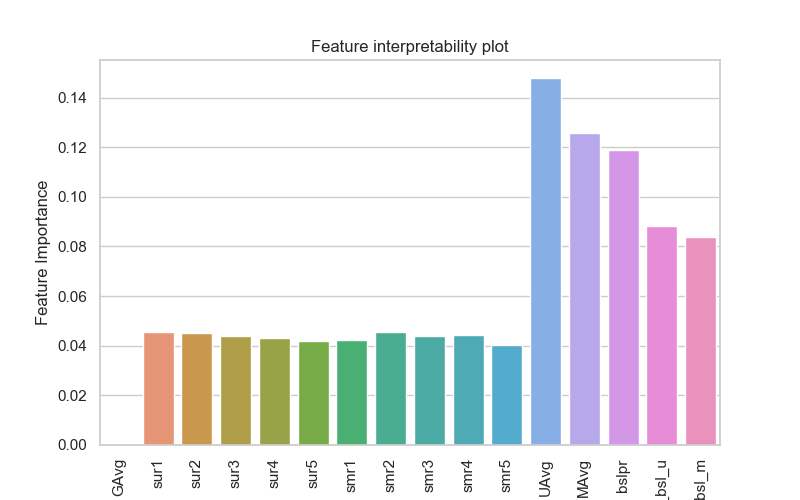

In [79]:
# plotting feature importance
coloumns = x_train.columns
feature_imp = xgb_knn_bsl_um.best_estimator_.feature_importances_

sns.set(style="whitegrid")
plt.figure(figsize=(8,5))
sns.barplot(x = coloumns,y = feature_imp)
plt.xticks(rotation='vertical')
plt.xlabel("Feature Name")
plt.ylabel("Feature Importance")
plt.title("Feature interpretability plot")
plt.show()

### 5.4 XgBoost with Surprise Baseline + Surprise KNNbaseline + MF Techniques

- svd

In [80]:
# initiallize the model
svd = SVD(n_factors=100, biased=True, random_state=15, verbose=True)
svd_train_results, svd_test_results = run_surprise(svd, trainset, testset, verbose=True)

# Just store these error metrics in our models_evaluation datastructure
tuned_models_evaluation_train['svd'] = svd_train_results 
tuned_models_evaluation_test['svd'] = svd_test_results

Training the model...
Processing epoch 0
Processing epoch 1
Processing epoch 2
Processing epoch 3
Processing epoch 4
Processing epoch 5
Processing epoch 6
Processing epoch 7
Processing epoch 8
Processing epoch 9
Processing epoch 10
Processing epoch 11
Processing epoch 12
Processing epoch 13
Processing epoch 14
Processing epoch 15
Processing epoch 16
Processing epoch 17
Processing epoch 18
Processing epoch 19
Done. time taken : 0:00:17.339956 

Evaluating the model with train data..
time taken : 0:00:02.456605
---------------
Train Data
---------------
RMSE : 0.6616921280231969

MAPE : 20.092740147412886

adding train results in the dictionary..

Evaluating for test data...
time taken : 0:00:00.062494
---------------
Test Data
---------------
RMSE : 1.0724398179398351

MAPE : 34.91362328393122

storing the test results in test dictionary...

---------------------------------------------
Total time taken to run this algorithm : 0:00:19.859055


- svd++

In [81]:
# initiallize the model
svdpp = SVDpp(n_factors=50, random_state=15, verbose=True)
svdpp_train_results, svdpp_test_results = run_surprise(svdpp, trainset, testset, verbose=True)

# Just store these error metrics in our models_evaluation datastructure
tuned_models_evaluation_train['svdpp'] = svdpp_train_results 
tuned_models_evaluation_test['svdpp'] = svdpp_test_results


Training the model...
 processing epoch 0
 processing epoch 1
 processing epoch 2
 processing epoch 3
 processing epoch 4
 processing epoch 5
 processing epoch 6
 processing epoch 7
 processing epoch 8
 processing epoch 9
 processing epoch 10
 processing epoch 11
 processing epoch 12
 processing epoch 13
 processing epoch 14
 processing epoch 15
 processing epoch 16
 processing epoch 17
 processing epoch 18
 processing epoch 19
Done. time taken : 0:03:58.865763 

Evaluating the model with train data..
time taken : 0:00:11.239821
---------------
Train Data
---------------
RMSE : 0.6111215770571189

MAPE : 17.916043542679418

adding train results in the dictionary..

Evaluating for test data...
time taken : 0:00:00.063047
---------------
Test Data
---------------
RMSE : 1.073107287201817

MAPE : 34.90611294334286

storing the test results in test dictionary...

---------------------------------------------
Total time taken to run this algorithm : 0:04:10.172634


In [82]:
# add the predicted values from both knns to this dataframe
reg_train['svd'] =tuned_models_evaluation_train['svd']['predictions']
reg_train['svdpp'] = tuned_models_evaluation_train['svdpp']['predictions']

reg_train.head(2) 

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,...,smr4,smr5,UAvg,MAvg,rating,bslpr,knn_bsl_u,knn_bsl_m,svd,svdpp
0,174683,10,3.587581,5.0,5.0,3.0,4.0,4.0,3.0,5.0,...,3.0,2.0,3.882353,3.611111,5,3.672848,4.996793,4.977554,4.220762,3.997242
1,233949,10,3.587581,4.0,4.0,5.0,1.0,3.0,2.0,3.0,...,3.0,3.0,2.692308,3.611111,3,3.688917,3.062453,3.051725,3.744945,3.671130


In [83]:
reg_test_df['svd'] = tuned_models_evaluation_test['svd']['predictions']
reg_test_df['svdpp'] = tuned_models_evaluation_test['svdpp']['predictions']

reg_test_df.head(2) 

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,...,smr4,smr5,UAvg,MAvg,rating,bslpr,knn_bsl_u,knn_bsl_m,svd,svdpp
0,808635,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,...,3.581679,3.581679,3.581679,3.581679,5,3.579949,3.579949,3.579949,3.579949,3.579949
1,941866,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,...,3.581679,3.581679,3.581679,3.581679,4,3.579949,3.579949,3.579949,3.579949,3.579949


In [84]:
# prepare x_train and y_train
x_train = reg_train.drop(['user', 'movie', 'rating',], axis=1)
y_train = reg_train['rating']

# prepare test data
x_test = reg_test_df.drop(['user', 'movie', 'rating'], axis=1)
y_test = reg_test_df['rating']

# making model ready for tuning
xgb = XGBRegressor(silent=False, n_jobs=-1)
xgb_final = GridSearchCV(xgb,param_grid,cv = 5)

In [85]:
train_results, test_results = run_xgboost(xgb_final, x_train, y_train, x_test, y_test)

# store the results in models_evaluations dictionaries
tuned_models_evaluation_train['xgb_final'] = train_results
tuned_models_evaluation_test['xgb_final'] = test_results

Training the model..
[14:46:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1422 extra nodes, 0 pruned nodes, max_depth=10
[14:46:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1426 extra nodes, 0 pruned nodes, max_depth=10
[14:46:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1432 extra nodes, 0 pruned nodes, max_depth=10
[14:46:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1444 extra nodes, 0 pruned nodes, max_depth=10
[14:46:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1446 extra nodes, 0 pruned nodes, max_depth=10
[14:46:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1454 extra nodes, 0 pruned nodes, max_depth=10
[14:46:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1482 extra nodes, 0 pruned nodes, max_depth=10
[14:46:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1418 extra nodes, 0 pruned nodes, max_depth=10
[14:46:13] src/tree/updater_prune.cc:74: tree pruning end, 

[14:46:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1768 extra nodes, 0 pruned nodes, max_depth=10
[14:46:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1660 extra nodes, 0 pruned nodes, max_depth=10
[14:46:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1696 extra nodes, 0 pruned nodes, max_depth=10
[14:46:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1664 extra nodes, 0 pruned nodes, max_depth=10
[14:46:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1784 extra nodes, 0 pruned nodes, max_depth=10
[14:46:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1648 extra nodes, 0 pruned nodes, max_depth=10
[14:46:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1754 extra nodes, 0 pruned nodes, max_depth=10
[14:46:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1628 extra nodes, 0 pruned nodes, max_depth=10
[14:46:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1752 extra n

[14:46:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1714 extra nodes, 0 pruned nodes, max_depth=10
[14:46:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1574 extra nodes, 0 pruned nodes, max_depth=10
[14:46:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1676 extra nodes, 0 pruned nodes, max_depth=10
[14:46:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1684 extra nodes, 0 pruned nodes, max_depth=10
[14:46:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1602 extra nodes, 0 pruned nodes, max_depth=10
[14:46:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1598 extra nodes, 0 pruned nodes, max_depth=10
[14:46:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1672 extra nodes, 0 pruned nodes, max_depth=10
[14:46:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1652 extra nodes, 0 pruned nodes, max_depth=10
[14:46:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1582 extra n

[14:46:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1506 extra nodes, 0 pruned nodes, max_depth=10
[14:46:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1562 extra nodes, 0 pruned nodes, max_depth=10
[14:46:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1502 extra nodes, 0 pruned nodes, max_depth=10
[14:46:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1620 extra nodes, 0 pruned nodes, max_depth=10
[14:46:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1612 extra nodes, 0 pruned nodes, max_depth=10
[14:46:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1518 extra nodes, 0 pruned nodes, max_depth=10
[14:46:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1630 extra nodes, 0 pruned nodes, max_depth=10
[14:46:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1530 extra nodes, 0 pruned nodes, max_depth=10
[14:46:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1624 extra n

[14:46:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1810 extra nodes, 0 pruned nodes, max_depth=10
[14:46:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1792 extra nodes, 0 pruned nodes, max_depth=10
[14:46:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1804 extra nodes, 0 pruned nodes, max_depth=10
[14:46:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1812 extra nodes, 0 pruned nodes, max_depth=10
[14:46:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1812 extra nodes, 0 pruned nodes, max_depth=10
[14:46:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1784 extra nodes, 0 pruned nodes, max_depth=10
[14:46:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1798 extra nodes, 0 pruned nodes, max_depth=10
[14:46:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1848 extra nodes, 0 pruned nodes, max_depth=10
[14:46:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1772 extra n

[14:47:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1718 extra nodes, 0 pruned nodes, max_depth=10
[14:47:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1724 extra nodes, 0 pruned nodes, max_depth=10
[14:47:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1662 extra nodes, 0 pruned nodes, max_depth=10
[14:47:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1784 extra nodes, 0 pruned nodes, max_depth=10
[14:47:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1662 extra nodes, 0 pruned nodes, max_depth=10
[14:47:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1804 extra nodes, 0 pruned nodes, max_depth=10
[14:47:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1652 extra nodes, 0 pruned nodes, max_depth=10
[14:47:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1674 extra nodes, 0 pruned nodes, max_depth=10
[14:47:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1686 extra n

[14:47:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1560 extra nodes, 0 pruned nodes, max_depth=10
[14:47:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1612 extra nodes, 0 pruned nodes, max_depth=10
[14:47:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1554 extra nodes, 0 pruned nodes, max_depth=10
[14:47:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1526 extra nodes, 0 pruned nodes, max_depth=10
[14:47:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1672 extra nodes, 0 pruned nodes, max_depth=10
[14:47:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1596 extra nodes, 0 pruned nodes, max_depth=10
[14:47:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1634 extra nodes, 0 pruned nodes, max_depth=10
[14:47:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1666 extra nodes, 0 pruned nodes, max_depth=10
[14:47:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1604 extra n

[14:47:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1376 extra nodes, 0 pruned nodes, max_depth=10
[14:47:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1370 extra nodes, 0 pruned nodes, max_depth=10
[14:47:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1388 extra nodes, 0 pruned nodes, max_depth=10
[14:47:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1406 extra nodes, 0 pruned nodes, max_depth=10
[14:47:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1404 extra nodes, 0 pruned nodes, max_depth=10
[14:47:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1424 extra nodes, 0 pruned nodes, max_depth=10
[14:47:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1406 extra nodes, 0 pruned nodes, max_depth=10
[14:47:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1418 extra nodes, 0 pruned nodes, max_depth=10
[14:47:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1414 extra n

[14:47:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1586 extra nodes, 0 pruned nodes, max_depth=10
[14:47:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1592 extra nodes, 0 pruned nodes, max_depth=10
[14:47:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1712 extra nodes, 0 pruned nodes, max_depth=10
[14:47:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1538 extra nodes, 0 pruned nodes, max_depth=10
[14:47:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1654 extra nodes, 0 pruned nodes, max_depth=10
[14:47:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1558 extra nodes, 0 pruned nodes, max_depth=10
[14:47:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1698 extra nodes, 0 pruned nodes, max_depth=10
[14:47:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1614 extra nodes, 0 pruned nodes, max_depth=10
[14:47:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1760 extra n

[14:47:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1626 extra nodes, 0 pruned nodes, max_depth=10
[14:47:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1568 extra nodes, 0 pruned nodes, max_depth=10
[14:47:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1562 extra nodes, 0 pruned nodes, max_depth=10
[14:47:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1598 extra nodes, 0 pruned nodes, max_depth=10
[14:47:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1580 extra nodes, 0 pruned nodes, max_depth=10
[14:47:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1592 extra nodes, 0 pruned nodes, max_depth=10
[14:47:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1580 extra nodes, 0 pruned nodes, max_depth=10
[14:47:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1586 extra nodes, 0 pruned nodes, max_depth=10
[14:47:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1640 extra n

[14:47:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1452 extra nodes, 0 pruned nodes, max_depth=10
[14:47:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1538 extra nodes, 0 pruned nodes, max_depth=10
[14:47:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1544 extra nodes, 0 pruned nodes, max_depth=10
[14:47:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1490 extra nodes, 0 pruned nodes, max_depth=10
[14:47:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1536 extra nodes, 0 pruned nodes, max_depth=10
[14:47:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1492 extra nodes, 0 pruned nodes, max_depth=10
[14:47:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1546 extra nodes, 0 pruned nodes, max_depth=10
[14:47:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1498 extra nodes, 0 pruned nodes, max_depth=10
[14:47:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1554 extra n

[14:48:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1706 extra nodes, 0 pruned nodes, max_depth=10
[14:48:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1722 extra nodes, 0 pruned nodes, max_depth=10
[14:48:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1728 extra nodes, 0 pruned nodes, max_depth=10
[14:48:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1748 extra nodes, 0 pruned nodes, max_depth=10
[14:48:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1790 extra nodes, 0 pruned nodes, max_depth=10
[14:48:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1718 extra nodes, 0 pruned nodes, max_depth=10
[14:48:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1746 extra nodes, 0 pruned nodes, max_depth=10
[14:48:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1710 extra nodes, 0 pruned nodes, max_depth=10
[14:48:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1380 extra n

[14:48:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1600 extra nodes, 0 pruned nodes, max_depth=10
[14:48:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1608 extra nodes, 0 pruned nodes, max_depth=10
[14:48:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1768 extra nodes, 0 pruned nodes, max_depth=10
[14:48:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1622 extra nodes, 0 pruned nodes, max_depth=10
[14:48:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1704 extra nodes, 0 pruned nodes, max_depth=10
[14:48:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1624 extra nodes, 0 pruned nodes, max_depth=10
[14:48:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1592 extra nodes, 0 pruned nodes, max_depth=10
[14:48:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1700 extra nodes, 0 pruned nodes, max_depth=10
[14:48:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1652 extra n

[14:48:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1476 extra nodes, 0 pruned nodes, max_depth=10
[14:48:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1538 extra nodes, 0 pruned nodes, max_depth=10
[14:48:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1560 extra nodes, 0 pruned nodes, max_depth=10
[14:48:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1608 extra nodes, 0 pruned nodes, max_depth=10
[14:48:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1518 extra nodes, 0 pruned nodes, max_depth=10
[14:48:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1572 extra nodes, 0 pruned nodes, max_depth=10
[14:48:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1516 extra nodes, 0 pruned nodes, max_depth=10
[14:48:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1480 extra nodes, 0 pruned nodes, max_depth=10
[14:48:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1604 extra n

[14:48:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1336 extra nodes, 0 pruned nodes, max_depth=10
[14:48:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1374 extra nodes, 0 pruned nodes, max_depth=10
[14:48:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1340 extra nodes, 0 pruned nodes, max_depth=10
[14:48:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1384 extra nodes, 0 pruned nodes, max_depth=10
[14:48:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1356 extra nodes, 0 pruned nodes, max_depth=10
[14:48:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1404 extra nodes, 0 pruned nodes, max_depth=10
[14:48:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1404 extra nodes, 0 pruned nodes, max_depth=10
[14:48:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1362 extra nodes, 0 pruned nodes, max_depth=10
[14:48:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1426 extra n

[14:48:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1546 extra nodes, 0 pruned nodes, max_depth=10
[14:48:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1582 extra nodes, 0 pruned nodes, max_depth=10
[14:48:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1610 extra nodes, 0 pruned nodes, max_depth=10
[14:48:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1532 extra nodes, 0 pruned nodes, max_depth=10
[14:48:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1548 extra nodes, 0 pruned nodes, max_depth=10
[14:48:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1546 extra nodes, 0 pruned nodes, max_depth=10
[14:48:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1630 extra nodes, 0 pruned nodes, max_depth=10
[14:48:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1566 extra nodes, 0 pruned nodes, max_depth=10
[14:48:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1626 extra n

[14:48:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1502 extra nodes, 0 pruned nodes, max_depth=10
[14:48:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1566 extra nodes, 0 pruned nodes, max_depth=10
[14:48:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1532 extra nodes, 0 pruned nodes, max_depth=10
[14:48:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1586 extra nodes, 0 pruned nodes, max_depth=10
[14:48:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1506 extra nodes, 0 pruned nodes, max_depth=10
[14:48:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1546 extra nodes, 0 pruned nodes, max_depth=10
[14:48:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1572 extra nodes, 0 pruned nodes, max_depth=10
[14:49:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1550 extra nodes, 0 pruned nodes, max_depth=10
[14:49:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1592 extra n

[14:49:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1510 extra nodes, 0 pruned nodes, max_depth=10
[14:49:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1462 extra nodes, 0 pruned nodes, max_depth=10
[14:49:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1510 extra nodes, 0 pruned nodes, max_depth=10
[14:49:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1430 extra nodes, 0 pruned nodes, max_depth=10
[14:49:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1516 extra nodes, 0 pruned nodes, max_depth=10
[14:49:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1454 extra nodes, 0 pruned nodes, max_depth=10
[14:49:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1532 extra nodes, 0 pruned nodes, max_depth=10
[14:49:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1466 extra nodes, 0 pruned nodes, max_depth=10
[14:49:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1538 extra n

[14:49:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1616 extra nodes, 0 pruned nodes, max_depth=10
[14:49:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1676 extra nodes, 0 pruned nodes, max_depth=10
[14:49:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1716 extra nodes, 0 pruned nodes, max_depth=10
[14:49:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1652 extra nodes, 0 pruned nodes, max_depth=10
[14:49:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1332 extra nodes, 0 pruned nodes, max_depth=10
[14:49:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1360 extra nodes, 0 pruned nodes, max_depth=10
[14:49:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1348 extra nodes, 0 pruned nodes, max_depth=10
[14:49:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1392 extra nodes, 0 pruned nodes, max_depth=10
[14:49:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1406 extra n

[14:49:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1564 extra nodes, 0 pruned nodes, max_depth=10
[14:49:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1714 extra nodes, 0 pruned nodes, max_depth=10
[14:49:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1546 extra nodes, 0 pruned nodes, max_depth=10
[14:49:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1642 extra nodes, 0 pruned nodes, max_depth=10
[14:49:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1580 extra nodes, 0 pruned nodes, max_depth=10
[14:49:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1636 extra nodes, 0 pruned nodes, max_depth=10
[14:49:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1664 extra nodes, 0 pruned nodes, max_depth=10
[14:49:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1572 extra nodes, 0 pruned nodes, max_depth=10
[14:49:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1646 extra n

[14:49:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1446 extra nodes, 0 pruned nodes, max_depth=10
[14:49:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1524 extra nodes, 0 pruned nodes, max_depth=10
[14:49:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1456 extra nodes, 0 pruned nodes, max_depth=10
[14:49:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1456 extra nodes, 0 pruned nodes, max_depth=10
[14:49:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1566 extra nodes, 0 pruned nodes, max_depth=10
[14:49:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1440 extra nodes, 0 pruned nodes, max_depth=10
[14:49:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1552 extra nodes, 0 pruned nodes, max_depth=10
[14:49:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1472 extra nodes, 0 pruned nodes, max_depth=10
[14:49:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1554 extra n

[14:49:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7980 extra nodes, 0 pruned nodes, max_depth=15
[14:49:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8148 extra nodes, 0 pruned nodes, max_depth=15
[14:49:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8246 extra nodes, 0 pruned nodes, max_depth=15
[14:49:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8068 extra nodes, 0 pruned nodes, max_depth=15
[14:49:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8224 extra nodes, 0 pruned nodes, max_depth=15
[14:49:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8372 extra nodes, 0 pruned nodes, max_depth=15
[14:49:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8558 extra nodes, 0 pruned nodes, max_depth=15
[14:49:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8626 extra nodes, 0 pruned nodes, max_depth=15
[14:49:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8714 extra n

[14:50:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15552 extra nodes, 0 pruned nodes, max_depth=15
[14:50:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15606 extra nodes, 0 pruned nodes, max_depth=15
[14:50:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15588 extra nodes, 0 pruned nodes, max_depth=15
[14:50:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16132 extra nodes, 0 pruned nodes, max_depth=15
[14:50:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15482 extra nodes, 0 pruned nodes, max_depth=15
[14:50:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16318 extra nodes, 0 pruned nodes, max_depth=15
[14:50:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16238 extra nodes, 0 pruned nodes, max_depth=15
[14:50:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16762 extra nodes, 0 pruned nodes, max_depth=15
[14:50:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1594

[14:50:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13336 extra nodes, 0 pruned nodes, max_depth=15
[14:50:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13522 extra nodes, 0 pruned nodes, max_depth=15
[14:50:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12956 extra nodes, 0 pruned nodes, max_depth=15
[14:50:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13008 extra nodes, 0 pruned nodes, max_depth=15
[14:50:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13550 extra nodes, 0 pruned nodes, max_depth=15
[14:50:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13624 extra nodes, 0 pruned nodes, max_depth=15
[14:50:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13470 extra nodes, 0 pruned nodes, max_depth=15
[14:50:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14328 extra nodes, 0 pruned nodes, max_depth=15
[14:50:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1420

[14:50:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9016 extra nodes, 0 pruned nodes, max_depth=15
[14:50:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9560 extra nodes, 0 pruned nodes, max_depth=15
[14:50:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9322 extra nodes, 0 pruned nodes, max_depth=15
[14:50:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9956 extra nodes, 0 pruned nodes, max_depth=15
[14:50:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9600 extra nodes, 0 pruned nodes, max_depth=15
[14:50:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10266 extra nodes, 0 pruned nodes, max_depth=15
[14:50:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9850 extra nodes, 0 pruned nodes, max_depth=15
[14:50:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10608 extra nodes, 0 pruned nodes, max_depth=15
[14:50:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10156 extr

[14:51:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16274 extra nodes, 0 pruned nodes, max_depth=15
[14:51:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16422 extra nodes, 0 pruned nodes, max_depth=15
[14:51:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16680 extra nodes, 0 pruned nodes, max_depth=15
[14:51:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16496 extra nodes, 0 pruned nodes, max_depth=15
[14:51:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17194 extra nodes, 0 pruned nodes, max_depth=15
[14:51:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6568 extra nodes, 0 pruned nodes, max_depth=15
[14:51:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6870 extra nodes, 0 pruned nodes, max_depth=15
[14:51:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6840 extra nodes, 0 pruned nodes, max_depth=15
[14:51:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7028 ex

[14:51:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13922 extra nodes, 0 pruned nodes, max_depth=15
[14:51:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14772 extra nodes, 0 pruned nodes, max_depth=15
[14:51:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14418 extra nodes, 0 pruned nodes, max_depth=15
[14:51:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14768 extra nodes, 0 pruned nodes, max_depth=15
[14:51:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14882 extra nodes, 0 pruned nodes, max_depth=15
[14:51:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14724 extra nodes, 0 pruned nodes, max_depth=15
[14:51:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15308 extra nodes, 0 pruned nodes, max_depth=15
[14:51:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15438 extra nodes, 0 pruned nodes, max_depth=15
[14:51:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1545

[14:51:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10360 extra nodes, 0 pruned nodes, max_depth=15
[14:51:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10872 extra nodes, 0 pruned nodes, max_depth=15
[14:51:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10996 extra nodes, 0 pruned nodes, max_depth=15
[14:51:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11054 extra nodes, 0 pruned nodes, max_depth=15
[14:51:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11184 extra nodes, 0 pruned nodes, max_depth=15
[14:51:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11066 extra nodes, 0 pruned nodes, max_depth=15
[14:51:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11540 extra nodes, 0 pruned nodes, max_depth=15
[14:51:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11898 extra nodes, 0 pruned nodes, max_depth=15
[14:51:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1168

[14:51:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6246 extra nodes, 0 pruned nodes, max_depth=15
[14:51:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6262 extra nodes, 0 pruned nodes, max_depth=15
[14:51:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6364 extra nodes, 0 pruned nodes, max_depth=15
[14:51:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6460 extra nodes, 0 pruned nodes, max_depth=15
[14:51:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6532 extra nodes, 0 pruned nodes, max_depth=15
[14:51:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6770 extra nodes, 0 pruned nodes, max_depth=15
[14:51:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6684 extra nodes, 0 pruned nodes, max_depth=15
[14:51:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6646 extra nodes, 0 pruned nodes, max_depth=15
[14:51:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6718 extra n

[14:52:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12704 extra nodes, 0 pruned nodes, max_depth=15
[14:52:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12674 extra nodes, 0 pruned nodes, max_depth=15
[14:52:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12548 extra nodes, 0 pruned nodes, max_depth=15
[14:52:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12698 extra nodes, 0 pruned nodes, max_depth=15
[14:52:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12822 extra nodes, 0 pruned nodes, max_depth=15
[14:52:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12932 extra nodes, 0 pruned nodes, max_depth=15
[14:52:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12798 extra nodes, 0 pruned nodes, max_depth=15
[14:52:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12950 extra nodes, 0 pruned nodes, max_depth=15
[14:52:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1305

[14:52:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10568 extra nodes, 0 pruned nodes, max_depth=15
[14:52:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11032 extra nodes, 0 pruned nodes, max_depth=15
[14:52:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10944 extra nodes, 0 pruned nodes, max_depth=15
[14:52:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10736 extra nodes, 0 pruned nodes, max_depth=15
[14:52:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11220 extra nodes, 0 pruned nodes, max_depth=15
[14:52:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10838 extra nodes, 0 pruned nodes, max_depth=15
[14:52:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11074 extra nodes, 0 pruned nodes, max_depth=15
[14:52:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11146 extra nodes, 0 pruned nodes, max_depth=15
[14:52:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1128

[14:52:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7606 extra nodes, 0 pruned nodes, max_depth=15
[14:52:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7714 extra nodes, 0 pruned nodes, max_depth=15
[14:52:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7454 extra nodes, 0 pruned nodes, max_depth=15
[14:52:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7758 extra nodes, 0 pruned nodes, max_depth=15
[14:52:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7708 extra nodes, 0 pruned nodes, max_depth=15
[14:52:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8044 extra nodes, 0 pruned nodes, max_depth=15
[14:52:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7860 extra nodes, 0 pruned nodes, max_depth=15
[14:52:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8360 extra nodes, 0 pruned nodes, max_depth=15
[14:52:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8092 extra n

[14:53:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13408 extra nodes, 0 pruned nodes, max_depth=15
[14:53:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13340 extra nodes, 0 pruned nodes, max_depth=15
[14:53:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13444 extra nodes, 0 pruned nodes, max_depth=15
[14:53:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13598 extra nodes, 0 pruned nodes, max_depth=15
[14:53:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13676 extra nodes, 0 pruned nodes, max_depth=15
[14:53:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13398 extra nodes, 0 pruned nodes, max_depth=15
[14:53:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13702 extra nodes, 0 pruned nodes, max_depth=15
[14:53:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5182 extra nodes, 0 pruned nodes, max_depth=15
[14:53:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5404 

[14:53:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11330 extra nodes, 0 pruned nodes, max_depth=15
[14:53:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11996 extra nodes, 0 pruned nodes, max_depth=15
[14:53:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11784 extra nodes, 0 pruned nodes, max_depth=15
[14:53:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11658 extra nodes, 0 pruned nodes, max_depth=15
[14:53:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12392 extra nodes, 0 pruned nodes, max_depth=15
[14:53:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11902 extra nodes, 0 pruned nodes, max_depth=15
[14:53:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12110 extra nodes, 0 pruned nodes, max_depth=15
[14:53:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12724 extra nodes, 0 pruned nodes, max_depth=15
[14:53:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1227

[14:53:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8816 extra nodes, 0 pruned nodes, max_depth=15
[14:53:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8732 extra nodes, 0 pruned nodes, max_depth=15
[14:53:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8736 extra nodes, 0 pruned nodes, max_depth=15
[14:53:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9054 extra nodes, 0 pruned nodes, max_depth=15
[14:53:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8582 extra nodes, 0 pruned nodes, max_depth=15
[14:53:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8894 extra nodes, 0 pruned nodes, max_depth=15
[14:53:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9328 extra nodes, 0 pruned nodes, max_depth=15
[14:53:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9422 extra nodes, 0 pruned nodes, max_depth=15
[14:53:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9740 extra n

[14:53:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5254 extra nodes, 0 pruned nodes, max_depth=15
[14:53:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5270 extra nodes, 0 pruned nodes, max_depth=15
[14:53:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5466 extra nodes, 0 pruned nodes, max_depth=15
[14:53:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5506 extra nodes, 0 pruned nodes, max_depth=15
[14:53:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5668 extra nodes, 0 pruned nodes, max_depth=15
[14:53:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5702 extra nodes, 0 pruned nodes, max_depth=15
[14:53:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5600 extra nodes, 0 pruned nodes, max_depth=15
[14:53:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5852 extra nodes, 0 pruned nodes, max_depth=15
[14:53:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5918 extra n

[14:54:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10342 extra nodes, 0 pruned nodes, max_depth=15
[14:54:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10910 extra nodes, 0 pruned nodes, max_depth=15
[14:54:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10394 extra nodes, 0 pruned nodes, max_depth=15
[14:54:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11062 extra nodes, 0 pruned nodes, max_depth=15
[14:54:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11118 extra nodes, 0 pruned nodes, max_depth=15
[14:54:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10626 extra nodes, 0 pruned nodes, max_depth=15
[14:54:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11126 extra nodes, 0 pruned nodes, max_depth=15
[14:54:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11464 extra nodes, 0 pruned nodes, max_depth=15
[14:54:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1089

[14:54:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9372 extra nodes, 0 pruned nodes, max_depth=15
[14:54:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9026 extra nodes, 0 pruned nodes, max_depth=15
[14:54:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9630 extra nodes, 0 pruned nodes, max_depth=15
[14:54:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9308 extra nodes, 0 pruned nodes, max_depth=15
[14:54:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9588 extra nodes, 0 pruned nodes, max_depth=15
[14:54:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9300 extra nodes, 0 pruned nodes, max_depth=15
[14:54:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9554 extra nodes, 0 pruned nodes, max_depth=15
[14:54:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9836 extra nodes, 0 pruned nodes, max_depth=15
[14:54:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9908 extra n

[14:54:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6326 extra nodes, 0 pruned nodes, max_depth=15
[14:54:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6350 extra nodes, 0 pruned nodes, max_depth=15
[14:54:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6492 extra nodes, 0 pruned nodes, max_depth=15
[14:54:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6674 extra nodes, 0 pruned nodes, max_depth=15
[14:54:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6900 extra nodes, 0 pruned nodes, max_depth=15
[14:54:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6678 extra nodes, 0 pruned nodes, max_depth=15
[14:54:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7156 extra nodes, 0 pruned nodes, max_depth=15
[14:54:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6956 extra nodes, 0 pruned nodes, max_depth=15
[14:54:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7318 extra n

[14:55:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11300 extra nodes, 0 pruned nodes, max_depth=15
[14:55:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11804 extra nodes, 0 pruned nodes, max_depth=15
[14:55:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11528 extra nodes, 0 pruned nodes, max_depth=15
[14:55:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11700 extra nodes, 0 pruned nodes, max_depth=15
[14:55:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11950 extra nodes, 0 pruned nodes, max_depth=15
[14:55:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11914 extra nodes, 0 pruned nodes, max_depth=15
[14:55:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11668 extra nodes, 0 pruned nodes, max_depth=15
[14:55:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4376 extra nodes, 0 pruned nodes, max_depth=15
[14:55:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4542 

[14:55:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10202 extra nodes, 0 pruned nodes, max_depth=15
[14:55:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10046 extra nodes, 0 pruned nodes, max_depth=15
[14:55:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10304 extra nodes, 0 pruned nodes, max_depth=15
[14:55:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10440 extra nodes, 0 pruned nodes, max_depth=15
[14:55:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9980 extra nodes, 0 pruned nodes, max_depth=15
[14:55:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10532 extra nodes, 0 pruned nodes, max_depth=15
[14:55:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10400 extra nodes, 0 pruned nodes, max_depth=15
[14:55:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10588 extra nodes, 0 pruned nodes, max_depth=15
[14:55:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10684

[14:55:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7364 extra nodes, 0 pruned nodes, max_depth=15
[14:55:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7342 extra nodes, 0 pruned nodes, max_depth=15
[14:55:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7710 extra nodes, 0 pruned nodes, max_depth=15
[14:55:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7752 extra nodes, 0 pruned nodes, max_depth=15
[14:55:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7838 extra nodes, 0 pruned nodes, max_depth=15
[14:55:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7786 extra nodes, 0 pruned nodes, max_depth=15
[14:55:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8180 extra nodes, 0 pruned nodes, max_depth=15
[14:55:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7986 extra nodes, 0 pruned nodes, max_depth=15
[14:55:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8046 extra n

[14:56:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10630 extra nodes, 0 pruned nodes, max_depth=20
[14:56:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10956 extra nodes, 0 pruned nodes, max_depth=20
[14:56:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11106 extra nodes, 0 pruned nodes, max_depth=20
[14:56:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11620 extra nodes, 0 pruned nodes, max_depth=20
[14:56:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11466 extra nodes, 0 pruned nodes, max_depth=20
[14:56:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11974 extra nodes, 0 pruned nodes, max_depth=20
[14:56:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12130 extra nodes, 0 pruned nodes, max_depth=20
[14:56:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12078 extra nodes, 0 pruned nodes, max_depth=20
[14:56:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1237

[14:56:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34426 extra nodes, 0 pruned nodes, max_depth=20
[14:56:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34078 extra nodes, 0 pruned nodes, max_depth=20
[14:56:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35488 extra nodes, 0 pruned nodes, max_depth=20
[14:56:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35498 extra nodes, 0 pruned nodes, max_depth=20
[14:56:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35492 extra nodes, 0 pruned nodes, max_depth=20
[14:56:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36916 extra nodes, 0 pruned nodes, max_depth=20
[14:56:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 37018 extra nodes, 0 pruned nodes, max_depth=20
[14:56:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 37682 extra nodes, 0 pruned nodes, max_depth=20
[14:56:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3741

[14:56:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23156 extra nodes, 0 pruned nodes, max_depth=20
[14:56:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23654 extra nodes, 0 pruned nodes, max_depth=20
[14:56:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24532 extra nodes, 0 pruned nodes, max_depth=20
[14:56:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24476 extra nodes, 0 pruned nodes, max_depth=20
[14:56:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24426 extra nodes, 0 pruned nodes, max_depth=20
[14:56:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25872 extra nodes, 0 pruned nodes, max_depth=20
[14:56:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25696 extra nodes, 0 pruned nodes, max_depth=20
[14:56:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26624 extra nodes, 0 pruned nodes, max_depth=20
[14:56:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2694

[14:57:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13722 extra nodes, 0 pruned nodes, max_depth=20
[14:57:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13588 extra nodes, 0 pruned nodes, max_depth=20
[14:57:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14298 extra nodes, 0 pruned nodes, max_depth=20
[14:57:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14172 extra nodes, 0 pruned nodes, max_depth=20
[14:57:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15020 extra nodes, 0 pruned nodes, max_depth=20
[14:57:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14582 extra nodes, 0 pruned nodes, max_depth=20
[14:57:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15026 extra nodes, 0 pruned nodes, max_depth=20
[14:57:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15122 extra nodes, 0 pruned nodes, max_depth=20
[14:57:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1553

[14:57:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 38450 extra nodes, 0 pruned nodes, max_depth=20
[14:57:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 39514 extra nodes, 0 pruned nodes, max_depth=20
[14:57:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 37838 extra nodes, 0 pruned nodes, max_depth=20
[14:57:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 40396 extra nodes, 0 pruned nodes, max_depth=20
[14:57:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 39148 extra nodes, 0 pruned nodes, max_depth=20
[14:57:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 39028 extra nodes, 0 pruned nodes, max_depth=20
[14:57:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 39470 extra nodes, 0 pruned nodes, max_depth=20
[14:57:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 39910 extra nodes, 0 pruned nodes, max_depth=20
[14:57:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4044

[14:58:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27206 extra nodes, 0 pruned nodes, max_depth=20
[14:58:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28300 extra nodes, 0 pruned nodes, max_depth=20
[14:58:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29040 extra nodes, 0 pruned nodes, max_depth=20
[14:58:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28924 extra nodes, 0 pruned nodes, max_depth=20
[14:58:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29744 extra nodes, 0 pruned nodes, max_depth=20
[14:58:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29562 extra nodes, 0 pruned nodes, max_depth=20
[14:58:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30508 extra nodes, 0 pruned nodes, max_depth=20
[14:58:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 31034 extra nodes, 0 pruned nodes, max_depth=20
[14:58:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3135

[14:58:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17234 extra nodes, 0 pruned nodes, max_depth=20
[14:58:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17196 extra nodes, 0 pruned nodes, max_depth=20
[14:58:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17200 extra nodes, 0 pruned nodes, max_depth=20
[14:58:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17560 extra nodes, 0 pruned nodes, max_depth=20
[14:58:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18684 extra nodes, 0 pruned nodes, max_depth=20
[14:58:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19128 extra nodes, 0 pruned nodes, max_depth=20
[14:58:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19060 extra nodes, 0 pruned nodes, max_depth=20
[14:58:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19258 extra nodes, 0 pruned nodes, max_depth=20
[14:58:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1959

[14:59:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7278 extra nodes, 0 pruned nodes, max_depth=20
[14:59:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7474 extra nodes, 0 pruned nodes, max_depth=20
[14:59:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7650 extra nodes, 0 pruned nodes, max_depth=20
[14:59:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7664 extra nodes, 0 pruned nodes, max_depth=20
[14:59:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8058 extra nodes, 0 pruned nodes, max_depth=20
[14:59:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8346 extra nodes, 0 pruned nodes, max_depth=20
[14:59:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8356 extra nodes, 0 pruned nodes, max_depth=20
[14:59:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8374 extra nodes, 0 pruned nodes, max_depth=20
[14:59:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8768 extra n

[14:59:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25136 extra nodes, 0 pruned nodes, max_depth=20
[14:59:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25726 extra nodes, 0 pruned nodes, max_depth=20
[14:59:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25266 extra nodes, 0 pruned nodes, max_depth=20
[14:59:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25970 extra nodes, 0 pruned nodes, max_depth=20
[14:59:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26038 extra nodes, 0 pruned nodes, max_depth=20
[14:59:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26376 extra nodes, 0 pruned nodes, max_depth=20
[14:59:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27126 extra nodes, 0 pruned nodes, max_depth=20
[14:59:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27412 extra nodes, 0 pruned nodes, max_depth=20
[14:59:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2725

[14:59:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16534 extra nodes, 0 pruned nodes, max_depth=20
[14:59:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17188 extra nodes, 0 pruned nodes, max_depth=20
[14:59:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16988 extra nodes, 0 pruned nodes, max_depth=20
[14:59:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17262 extra nodes, 0 pruned nodes, max_depth=20
[14:59:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18128 extra nodes, 0 pruned nodes, max_depth=20
[14:59:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18348 extra nodes, 0 pruned nodes, max_depth=20
[14:59:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18494 extra nodes, 0 pruned nodes, max_depth=20
[14:59:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18654 extra nodes, 0 pruned nodes, max_depth=20
[14:59:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1934

[15:00:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9504 extra nodes, 0 pruned nodes, max_depth=20
[15:00:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9658 extra nodes, 0 pruned nodes, max_depth=20
[15:00:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9318 extra nodes, 0 pruned nodes, max_depth=20
[15:00:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9778 extra nodes, 0 pruned nodes, max_depth=20
[15:00:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10088 extra nodes, 0 pruned nodes, max_depth=20
[15:00:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10298 extra nodes, 0 pruned nodes, max_depth=20
[15:00:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10490 extra nodes, 0 pruned nodes, max_depth=20
[15:00:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10648 extra nodes, 0 pruned nodes, max_depth=20
[15:00:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11158 ex

[15:00:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27832 extra nodes, 0 pruned nodes, max_depth=20
[15:00:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28210 extra nodes, 0 pruned nodes, max_depth=20
[15:00:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27798 extra nodes, 0 pruned nodes, max_depth=20
[15:00:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28676 extra nodes, 0 pruned nodes, max_depth=20
[15:00:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28084 extra nodes, 0 pruned nodes, max_depth=20
[15:00:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28356 extra nodes, 0 pruned nodes, max_depth=20
[15:00:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28462 extra nodes, 0 pruned nodes, max_depth=20
[15:00:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29838 extra nodes, 0 pruned nodes, max_depth=20
[15:00:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2945

[15:01:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20362 extra nodes, 0 pruned nodes, max_depth=20
[15:01:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20840 extra nodes, 0 pruned nodes, max_depth=20
[15:01:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20620 extra nodes, 0 pruned nodes, max_depth=20
[15:01:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20972 extra nodes, 0 pruned nodes, max_depth=20
[15:01:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21132 extra nodes, 0 pruned nodes, max_depth=20
[15:01:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21988 extra nodes, 0 pruned nodes, max_depth=20
[15:01:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21974 extra nodes, 0 pruned nodes, max_depth=20
[15:01:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21354 extra nodes, 0 pruned nodes, max_depth=20
[15:01:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2260

[15:01:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11666 extra nodes, 0 pruned nodes, max_depth=20
[15:01:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12106 extra nodes, 0 pruned nodes, max_depth=20
[15:01:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12344 extra nodes, 0 pruned nodes, max_depth=20
[15:01:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12208 extra nodes, 0 pruned nodes, max_depth=20
[15:01:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12574 extra nodes, 0 pruned nodes, max_depth=20
[15:01:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13052 extra nodes, 0 pruned nodes, max_depth=20
[15:01:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13362 extra nodes, 0 pruned nodes, max_depth=20
[15:01:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13650 extra nodes, 0 pruned nodes, max_depth=20
[15:01:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1404

[15:01:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5452 extra nodes, 0 pruned nodes, max_depth=20
[15:01:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5536 extra nodes, 0 pruned nodes, max_depth=20
[15:01:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5748 extra nodes, 0 pruned nodes, max_depth=20
[15:01:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5762 extra nodes, 0 pruned nodes, max_depth=20
[15:01:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6028 extra nodes, 0 pruned nodes, max_depth=20
[15:01:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6182 extra nodes, 0 pruned nodes, max_depth=20
[15:01:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6334 extra nodes, 0 pruned nodes, max_depth=20
[15:01:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6436 extra nodes, 0 pruned nodes, max_depth=20
[15:01:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6516 extra n

[15:02:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19826 extra nodes, 0 pruned nodes, max_depth=20
[15:02:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20214 extra nodes, 0 pruned nodes, max_depth=20
[15:02:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20348 extra nodes, 0 pruned nodes, max_depth=20
[15:02:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20536 extra nodes, 0 pruned nodes, max_depth=20
[15:02:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20838 extra nodes, 0 pruned nodes, max_depth=20
[15:02:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20918 extra nodes, 0 pruned nodes, max_depth=20
[15:02:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21124 extra nodes, 0 pruned nodes, max_depth=20
[15:02:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21698 extra nodes, 0 pruned nodes, max_depth=20
[15:02:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2173

[15:02:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12878 extra nodes, 0 pruned nodes, max_depth=20
[15:02:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12920 extra nodes, 0 pruned nodes, max_depth=20
[15:02:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13436 extra nodes, 0 pruned nodes, max_depth=20
[15:02:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13624 extra nodes, 0 pruned nodes, max_depth=20
[15:02:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13478 extra nodes, 0 pruned nodes, max_depth=20
[15:02:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14154 extra nodes, 0 pruned nodes, max_depth=20
[15:02:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14208 extra nodes, 0 pruned nodes, max_depth=20
[15:02:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14510 extra nodes, 0 pruned nodes, max_depth=20
[15:02:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1451

[15:02:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6994 extra nodes, 0 pruned nodes, max_depth=20
[15:02:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7208 extra nodes, 0 pruned nodes, max_depth=20
[15:02:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7378 extra nodes, 0 pruned nodes, max_depth=20
[15:02:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7444 extra nodes, 0 pruned nodes, max_depth=20
[15:02:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7908 extra nodes, 0 pruned nodes, max_depth=20
[15:02:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7582 extra nodes, 0 pruned nodes, max_depth=20
[15:02:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7954 extra nodes, 0 pruned nodes, max_depth=20
[15:02:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8248 extra nodes, 0 pruned nodes, max_depth=20
[15:02:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8340 extra n

[15:03:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21386 extra nodes, 0 pruned nodes, max_depth=20
[15:03:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22000 extra nodes, 0 pruned nodes, max_depth=20
[15:03:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22352 extra nodes, 0 pruned nodes, max_depth=20
[15:03:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22306 extra nodes, 0 pruned nodes, max_depth=20
[15:03:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22706 extra nodes, 0 pruned nodes, max_depth=20
[15:03:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22280 extra nodes, 0 pruned nodes, max_depth=20
[15:03:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22716 extra nodes, 0 pruned nodes, max_depth=20
[15:03:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23328 extra nodes, 0 pruned nodes, max_depth=20
[15:03:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2332

[15:03:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16206 extra nodes, 0 pruned nodes, max_depth=20
[15:03:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16614 extra nodes, 0 pruned nodes, max_depth=20
[15:03:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16262 extra nodes, 0 pruned nodes, max_depth=20
[15:03:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17152 extra nodes, 0 pruned nodes, max_depth=20
[15:03:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16614 extra nodes, 0 pruned nodes, max_depth=20
[15:03:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17134 extra nodes, 0 pruned nodes, max_depth=20
[15:03:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17076 extra nodes, 0 pruned nodes, max_depth=20
[15:03:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17356 extra nodes, 0 pruned nodes, max_depth=20
[15:03:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1740

[15:04:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9198 extra nodes, 0 pruned nodes, max_depth=20
[15:04:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9446 extra nodes, 0 pruned nodes, max_depth=20
[15:04:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9510 extra nodes, 0 pruned nodes, max_depth=20
[15:04:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9950 extra nodes, 0 pruned nodes, max_depth=20
[15:04:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9750 extra nodes, 0 pruned nodes, max_depth=20
[15:04:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10404 extra nodes, 0 pruned nodes, max_depth=20
[15:04:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10338 extra nodes, 0 pruned nodes, max_depth=20
[15:04:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10408 extra nodes, 0 pruned nodes, max_depth=20
[15:04:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10732 ext

[15:04:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24046 extra nodes, 0 pruned nodes, max_depth=20
[15:04:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24392 extra nodes, 0 pruned nodes, max_depth=20
[15:04:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1422 extra nodes, 0 pruned nodes, max_depth=10
[15:04:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1448 extra nodes, 0 pruned nodes, max_depth=10
[15:04:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1514 extra nodes, 0 pruned nodes, max_depth=10
[15:04:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1574 extra nodes, 0 pruned nodes, max_depth=10
[15:04:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1508 extra nodes, 0 pruned nodes, max_depth=10
[15:04:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1592 extra nodes, 0 pruned nodes, max_depth=10
[15:04:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1534 extra

[15:04:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1324 extra nodes, 0 pruned nodes, max_depth=10
[15:04:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1330 extra nodes, 0 pruned nodes, max_depth=10
[15:04:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1344 extra nodes, 0 pruned nodes, max_depth=10
[15:04:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1276 extra nodes, 0 pruned nodes, max_depth=10
[15:04:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1450 extra nodes, 0 pruned nodes, max_depth=10
[15:04:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1164 extra nodes, 0 pruned nodes, max_depth=10
[15:04:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1268 extra nodes, 0 pruned nodes, max_depth=10
[15:04:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1308 extra nodes, 0 pruned nodes, max_depth=10
[15:04:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1412 extra n

[15:04:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1684 extra nodes, 0 pruned nodes, max_depth=10
[15:04:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1658 extra nodes, 0 pruned nodes, max_depth=10
[15:04:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1662 extra nodes, 0 pruned nodes, max_depth=10
[15:04:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1632 extra nodes, 0 pruned nodes, max_depth=10
[15:04:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1650 extra nodes, 0 pruned nodes, max_depth=10
[15:04:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1570 extra nodes, 0 pruned nodes, max_depth=10
[15:04:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1540 extra nodes, 0 pruned nodes, max_depth=10
[15:04:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1470 extra nodes, 0 pruned nodes, max_depth=10
[15:04:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1632 extra n

[15:04:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1696 extra nodes, 0 pruned nodes, max_depth=10
[15:04:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1790 extra nodes, 0 pruned nodes, max_depth=10
[15:04:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1756 extra nodes, 0 pruned nodes, max_depth=10
[15:04:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1816 extra nodes, 0 pruned nodes, max_depth=10
[15:04:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1802 extra nodes, 0 pruned nodes, max_depth=10
[15:04:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1836 extra nodes, 0 pruned nodes, max_depth=10
[15:04:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1670 extra nodes, 0 pruned nodes, max_depth=10
[15:05:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1812 extra nodes, 0 pruned nodes, max_depth=10
[15:05:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1822 extra n

[15:05:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1246 extra nodes, 0 pruned nodes, max_depth=10
[15:05:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1372 extra nodes, 0 pruned nodes, max_depth=10
[15:05:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1140 extra nodes, 0 pruned nodes, max_depth=10
[15:05:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1218 extra nodes, 0 pruned nodes, max_depth=10
[15:05:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1220 extra nodes, 0 pruned nodes, max_depth=10
[15:05:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1248 extra nodes, 0 pruned nodes, max_depth=10
[15:05:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1006 extra nodes, 0 pruned nodes, max_depth=10
[15:05:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1294 extra nodes, 0 pruned nodes, max_depth=10
[15:05:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1192 extra n

[15:05:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1350 extra nodes, 0 pruned nodes, max_depth=10
[15:05:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1308 extra nodes, 0 pruned nodes, max_depth=10
[15:05:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1394 extra nodes, 0 pruned nodes, max_depth=10
[15:05:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1464 extra nodes, 0 pruned nodes, max_depth=10
[15:05:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1402 extra nodes, 0 pruned nodes, max_depth=10
[15:05:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1416 extra nodes, 0 pruned nodes, max_depth=10
[15:05:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1388 extra nodes, 0 pruned nodes, max_depth=10
[15:05:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1352 extra nodes, 0 pruned nodes, max_depth=10
[15:05:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1414 extra n

[15:05:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1844 extra nodes, 0 pruned nodes, max_depth=10
[15:05:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1724 extra nodes, 0 pruned nodes, max_depth=10
[15:05:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1798 extra nodes, 0 pruned nodes, max_depth=10
[15:05:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1822 extra nodes, 0 pruned nodes, max_depth=10
[15:05:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1810 extra nodes, 0 pruned nodes, max_depth=10
[15:05:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1774 extra nodes, 0 pruned nodes, max_depth=10
[15:05:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1804 extra nodes, 0 pruned nodes, max_depth=10
[15:05:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1822 extra nodes, 0 pruned nodes, max_depth=10
[15:05:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1724 extra n

[15:05:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1422 extra nodes, 0 pruned nodes, max_depth=10
[15:05:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1464 extra nodes, 0 pruned nodes, max_depth=10
[15:05:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1438 extra nodes, 0 pruned nodes, max_depth=10
[15:05:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1512 extra nodes, 0 pruned nodes, max_depth=10
[15:05:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1472 extra nodes, 0 pruned nodes, max_depth=10
[15:05:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1436 extra nodes, 0 pruned nodes, max_depth=10
[15:05:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1582 extra nodes, 0 pruned nodes, max_depth=10
[15:05:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1612 extra nodes, 0 pruned nodes, max_depth=10
[15:05:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1624 extra n

[15:05:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1126 extra nodes, 0 pruned nodes, max_depth=10
[15:05:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1340 extra nodes, 0 pruned nodes, max_depth=10
[15:05:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1168 extra nodes, 0 pruned nodes, max_depth=10
[15:05:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1212 extra nodes, 0 pruned nodes, max_depth=10
[15:05:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1094 extra nodes, 0 pruned nodes, max_depth=10
[15:05:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1216 extra nodes, 0 pruned nodes, max_depth=10
[15:05:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1230 extra nodes, 0 pruned nodes, max_depth=10
[15:05:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1094 extra nodes, 0 pruned nodes, max_depth=10
[15:05:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1256 extra n

[15:06:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1536 extra nodes, 0 pruned nodes, max_depth=10
[15:06:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1572 extra nodes, 0 pruned nodes, max_depth=10
[15:06:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1482 extra nodes, 0 pruned nodes, max_depth=10
[15:06:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1514 extra nodes, 0 pruned nodes, max_depth=10
[15:06:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1460 extra nodes, 0 pruned nodes, max_depth=10
[15:06:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1466 extra nodes, 0 pruned nodes, max_depth=10
[15:06:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1454 extra nodes, 0 pruned nodes, max_depth=10
[15:06:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1406 extra nodes, 0 pruned nodes, max_depth=10
[15:06:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1428 extra n

[15:06:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1730 extra nodes, 0 pruned nodes, max_depth=10
[15:06:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1706 extra nodes, 0 pruned nodes, max_depth=10
[15:06:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1732 extra nodes, 0 pruned nodes, max_depth=10
[15:06:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1684 extra nodes, 0 pruned nodes, max_depth=10
[15:06:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1764 extra nodes, 0 pruned nodes, max_depth=10
[15:06:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1654 extra nodes, 0 pruned nodes, max_depth=10
[15:06:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1686 extra nodes, 0 pruned nodes, max_depth=10
[15:06:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1768 extra nodes, 0 pruned nodes, max_depth=10
[15:06:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1684 extra n

[15:06:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 852 extra nodes, 0 pruned nodes, max_depth=10
[15:06:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1152 extra nodes, 0 pruned nodes, max_depth=10
[15:06:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1182 extra nodes, 0 pruned nodes, max_depth=10
[15:06:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1104 extra nodes, 0 pruned nodes, max_depth=10
[15:06:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1090 extra nodes, 0 pruned nodes, max_depth=10
[15:06:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1014 extra nodes, 0 pruned nodes, max_depth=10
[15:06:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 880 extra nodes, 0 pruned nodes, max_depth=10
[15:06:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 932 extra nodes, 0 pruned nodes, max_depth=10
[15:06:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1058 extra node

[15:06:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1232 extra nodes, 0 pruned nodes, max_depth=10
[15:06:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1240 extra nodes, 0 pruned nodes, max_depth=10
[15:06:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1108 extra nodes, 0 pruned nodes, max_depth=10
[15:06:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1138 extra nodes, 0 pruned nodes, max_depth=10
[15:06:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1242 extra nodes, 0 pruned nodes, max_depth=10
[15:06:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1322 extra nodes, 0 pruned nodes, max_depth=10
[15:06:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1236 extra nodes, 0 pruned nodes, max_depth=10
[15:06:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1208 extra nodes, 0 pruned nodes, max_depth=10
[15:06:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1222 extra n

[15:06:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1724 extra nodes, 0 pruned nodes, max_depth=10
[15:06:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1734 extra nodes, 0 pruned nodes, max_depth=10
[15:06:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1688 extra nodes, 0 pruned nodes, max_depth=10
[15:06:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1706 extra nodes, 0 pruned nodes, max_depth=10
[15:06:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1688 extra nodes, 0 pruned nodes, max_depth=10
[15:06:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1676 extra nodes, 0 pruned nodes, max_depth=10
[15:06:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1586 extra nodes, 0 pruned nodes, max_depth=10
[15:06:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1556 extra nodes, 0 pruned nodes, max_depth=10
[15:06:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1620 extra n

[15:06:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1450 extra nodes, 0 pruned nodes, max_depth=10
[15:06:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1404 extra nodes, 0 pruned nodes, max_depth=10
[15:06:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1540 extra nodes, 0 pruned nodes, max_depth=10
[15:06:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1574 extra nodes, 0 pruned nodes, max_depth=10
[15:06:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1424 extra nodes, 0 pruned nodes, max_depth=10
[15:06:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1590 extra nodes, 0 pruned nodes, max_depth=10
[15:06:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1622 extra nodes, 0 pruned nodes, max_depth=10
[15:06:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1552 extra nodes, 0 pruned nodes, max_depth=10
[15:06:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1560 extra n

[15:07:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 902 extra nodes, 0 pruned nodes, max_depth=10
[15:07:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1114 extra nodes, 0 pruned nodes, max_depth=10
[15:07:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1058 extra nodes, 0 pruned nodes, max_depth=10
[15:07:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 990 extra nodes, 0 pruned nodes, max_depth=10
[15:07:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1008 extra nodes, 0 pruned nodes, max_depth=10
[15:07:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 992 extra nodes, 0 pruned nodes, max_depth=10
[15:07:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 842 extra nodes, 0 pruned nodes, max_depth=10
[15:07:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 968 extra nodes, 0 pruned nodes, max_depth=10
[15:07:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1038 extra nodes,

[15:07:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1406 extra nodes, 0 pruned nodes, max_depth=10
[15:07:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1480 extra nodes, 0 pruned nodes, max_depth=10
[15:07:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1340 extra nodes, 0 pruned nodes, max_depth=10
[15:07:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1420 extra nodes, 0 pruned nodes, max_depth=10
[15:07:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1242 extra nodes, 0 pruned nodes, max_depth=10
[15:07:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1190 extra nodes, 0 pruned nodes, max_depth=10
[15:07:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1240 extra nodes, 0 pruned nodes, max_depth=10
[15:07:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1262 extra nodes, 0 pruned nodes, max_depth=10
[15:07:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1276 extra n

[15:07:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1632 extra nodes, 0 pruned nodes, max_depth=10
[15:07:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1588 extra nodes, 0 pruned nodes, max_depth=10
[15:07:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1726 extra nodes, 0 pruned nodes, max_depth=10
[15:07:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1644 extra nodes, 0 pruned nodes, max_depth=10
[15:07:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1578 extra nodes, 0 pruned nodes, max_depth=10
[15:07:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1748 extra nodes, 0 pruned nodes, max_depth=10
[15:07:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1666 extra nodes, 0 pruned nodes, max_depth=10
[15:07:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1664 extra nodes, 0 pruned nodes, max_depth=10
[15:07:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1698 extra n

[15:07:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1054 extra nodes, 0 pruned nodes, max_depth=10
[15:07:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 770 extra nodes, 0 pruned nodes, max_depth=10
[15:07:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 880 extra nodes, 0 pruned nodes, max_depth=10
[15:07:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 888 extra nodes, 0 pruned nodes, max_depth=10
[15:07:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1094 extra nodes, 0 pruned nodes, max_depth=10
[15:07:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 582 extra nodes, 0 pruned nodes, max_depth=10
[15:07:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1332 extra nodes, 0 pruned nodes, max_depth=10
[15:07:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1394 extra nodes, 0 pruned nodes, max_depth=10
[15:07:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1412 extra nodes

[15:07:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1124 extra nodes, 0 pruned nodes, max_depth=10
[15:07:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1092 extra nodes, 0 pruned nodes, max_depth=10
[15:07:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1136 extra nodes, 0 pruned nodes, max_depth=10
[15:07:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1144 extra nodes, 0 pruned nodes, max_depth=10
[15:07:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1046 extra nodes, 0 pruned nodes, max_depth=10
[15:07:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1038 extra nodes, 0 pruned nodes, max_depth=10
[15:07:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1164 extra nodes, 0 pruned nodes, max_depth=10
[15:07:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1048 extra nodes, 0 pruned nodes, max_depth=10
[15:07:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 990 extra no

[15:07:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1552 extra nodes, 0 pruned nodes, max_depth=10
[15:07:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1604 extra nodes, 0 pruned nodes, max_depth=10
[15:07:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1580 extra nodes, 0 pruned nodes, max_depth=10
[15:07:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1454 extra nodes, 0 pruned nodes, max_depth=10
[15:07:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1522 extra nodes, 0 pruned nodes, max_depth=10
[15:07:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1558 extra nodes, 0 pruned nodes, max_depth=10
[15:07:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1534 extra nodes, 0 pruned nodes, max_depth=10
[15:07:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1486 extra nodes, 0 pruned nodes, max_depth=10
[15:07:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1412 extra n

[15:08:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12494 extra nodes, 0 pruned nodes, max_depth=15
[15:08:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13784 extra nodes, 0 pruned nodes, max_depth=15
[15:08:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13430 extra nodes, 0 pruned nodes, max_depth=15
[15:08:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14458 extra nodes, 0 pruned nodes, max_depth=15
[15:08:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14820 extra nodes, 0 pruned nodes, max_depth=15
[15:08:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15018 extra nodes, 0 pruned nodes, max_depth=15
[15:08:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15830 extra nodes, 0 pruned nodes, max_depth=15
[15:08:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16750 extra nodes, 0 pruned nodes, max_depth=15
[15:08:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1638

[15:08:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9080 extra nodes, 0 pruned nodes, max_depth=15
[15:08:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11140 extra nodes, 0 pruned nodes, max_depth=15
[15:08:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10492 extra nodes, 0 pruned nodes, max_depth=15
[15:08:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9784 extra nodes, 0 pruned nodes, max_depth=15
[15:08:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10704 extra nodes, 0 pruned nodes, max_depth=15
[15:08:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10628 extra nodes, 0 pruned nodes, max_depth=15
[15:08:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11852 extra nodes, 0 pruned nodes, max_depth=15
[15:08:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11510 extra nodes, 0 pruned nodes, max_depth=15
[15:08:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7318 e

[15:08:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16206 extra nodes, 0 pruned nodes, max_depth=15
[15:08:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13800 extra nodes, 0 pruned nodes, max_depth=15
[15:08:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15264 extra nodes, 0 pruned nodes, max_depth=15
[15:08:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14114 extra nodes, 0 pruned nodes, max_depth=15
[15:08:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13126 extra nodes, 0 pruned nodes, max_depth=15
[15:08:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14456 extra nodes, 0 pruned nodes, max_depth=15
[15:08:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13620 extra nodes, 0 pruned nodes, max_depth=15
[15:08:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13278 extra nodes, 0 pruned nodes, max_depth=15
[15:08:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1315

[15:09:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18070 extra nodes, 0 pruned nodes, max_depth=15
[15:09:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17704 extra nodes, 0 pruned nodes, max_depth=15
[15:09:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18288 extra nodes, 0 pruned nodes, max_depth=15
[15:09:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17748 extra nodes, 0 pruned nodes, max_depth=15
[15:09:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18470 extra nodes, 0 pruned nodes, max_depth=15
[15:09:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18086 extra nodes, 0 pruned nodes, max_depth=15
[15:09:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17700 extra nodes, 0 pruned nodes, max_depth=15
[15:09:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18214 extra nodes, 0 pruned nodes, max_depth=15
[15:09:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1660

[15:09:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7258 extra nodes, 0 pruned nodes, max_depth=15
[15:09:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7852 extra nodes, 0 pruned nodes, max_depth=15
[15:09:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6134 extra nodes, 0 pruned nodes, max_depth=15
[15:09:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9422 extra nodes, 0 pruned nodes, max_depth=15
[15:09:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8662 extra nodes, 0 pruned nodes, max_depth=15
[15:09:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6192 extra nodes, 0 pruned nodes, max_depth=15
[15:09:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6568 extra nodes, 0 pruned nodes, max_depth=15
[15:09:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7356 extra nodes, 0 pruned nodes, max_depth=15
[15:09:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7812 extra n

[15:09:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12926 extra nodes, 0 pruned nodes, max_depth=15
[15:09:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11662 extra nodes, 0 pruned nodes, max_depth=15
[15:09:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11196 extra nodes, 0 pruned nodes, max_depth=15
[15:09:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12724 extra nodes, 0 pruned nodes, max_depth=15
[15:09:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13612 extra nodes, 0 pruned nodes, max_depth=15
[15:09:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12392 extra nodes, 0 pruned nodes, max_depth=15
[15:09:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11982 extra nodes, 0 pruned nodes, max_depth=15
[15:09:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13136 extra nodes, 0 pruned nodes, max_depth=15
[15:09:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1024

[15:09:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18110 extra nodes, 0 pruned nodes, max_depth=15
[15:09:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17870 extra nodes, 0 pruned nodes, max_depth=15
[15:09:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17696 extra nodes, 0 pruned nodes, max_depth=15
[15:09:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17188 extra nodes, 0 pruned nodes, max_depth=15
[15:09:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17778 extra nodes, 0 pruned nodes, max_depth=15
[15:09:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16654 extra nodes, 0 pruned nodes, max_depth=15
[15:09:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17164 extra nodes, 0 pruned nodes, max_depth=15
[15:09:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17122 extra nodes, 0 pruned nodes, max_depth=15
[15:09:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1595

[15:10:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8438 extra nodes, 0 pruned nodes, max_depth=15
[15:10:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9398 extra nodes, 0 pruned nodes, max_depth=15
[15:10:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9472 extra nodes, 0 pruned nodes, max_depth=15
[15:10:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10144 extra nodes, 0 pruned nodes, max_depth=15
[15:10:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10730 extra nodes, 0 pruned nodes, max_depth=15
[15:10:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11396 extra nodes, 0 pruned nodes, max_depth=15
[15:10:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11754 extra nodes, 0 pruned nodes, max_depth=15
[15:10:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12616 extra nodes, 0 pruned nodes, max_depth=15
[15:10:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11774 e

[15:10:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8442 extra nodes, 0 pruned nodes, max_depth=15
[15:10:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6850 extra nodes, 0 pruned nodes, max_depth=15
[15:10:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7322 extra nodes, 0 pruned nodes, max_depth=15
[15:10:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8212 extra nodes, 0 pruned nodes, max_depth=15
[15:10:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7836 extra nodes, 0 pruned nodes, max_depth=15
[15:10:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6848 extra nodes, 0 pruned nodes, max_depth=15
[15:10:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8636 extra nodes, 0 pruned nodes, max_depth=15
[15:10:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7984 extra nodes, 0 pruned nodes, max_depth=15
[15:10:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8304 extra n

[15:10:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12552 extra nodes, 0 pruned nodes, max_depth=15
[15:10:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11886 extra nodes, 0 pruned nodes, max_depth=15
[15:10:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11316 extra nodes, 0 pruned nodes, max_depth=15
[15:10:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11486 extra nodes, 0 pruned nodes, max_depth=15
[15:10:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11644 extra nodes, 0 pruned nodes, max_depth=15
[15:10:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10776 extra nodes, 0 pruned nodes, max_depth=15
[15:10:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11498 extra nodes, 0 pruned nodes, max_depth=15
[15:10:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11172 extra nodes, 0 pruned nodes, max_depth=15
[15:10:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1111

[15:11:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13862 extra nodes, 0 pruned nodes, max_depth=15
[15:11:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14048 extra nodes, 0 pruned nodes, max_depth=15
[15:11:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13856 extra nodes, 0 pruned nodes, max_depth=15
[15:11:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14442 extra nodes, 0 pruned nodes, max_depth=15
[15:11:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13888 extra nodes, 0 pruned nodes, max_depth=15
[15:11:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14852 extra nodes, 0 pruned nodes, max_depth=15
[15:11:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13912 extra nodes, 0 pruned nodes, max_depth=15
[15:11:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14160 extra nodes, 0 pruned nodes, max_depth=15
[15:11:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1358

[15:11:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5300 extra nodes, 0 pruned nodes, max_depth=15
[15:11:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6066 extra nodes, 0 pruned nodes, max_depth=15
[15:11:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5946 extra nodes, 0 pruned nodes, max_depth=15
[15:11:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6576 extra nodes, 0 pruned nodes, max_depth=15
[15:11:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6772 extra nodes, 0 pruned nodes, max_depth=15
[15:11:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6418 extra nodes, 0 pruned nodes, max_depth=15
[15:11:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4512 extra nodes, 0 pruned nodes, max_depth=15
[15:11:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6290 extra nodes, 0 pruned nodes, max_depth=15
[15:11:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5182 extra n

[15:11:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9302 extra nodes, 0 pruned nodes, max_depth=15
[15:11:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9046 extra nodes, 0 pruned nodes, max_depth=15
[15:11:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9082 extra nodes, 0 pruned nodes, max_depth=15
[15:11:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8918 extra nodes, 0 pruned nodes, max_depth=15
[15:11:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9052 extra nodes, 0 pruned nodes, max_depth=15
[15:11:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8034 extra nodes, 0 pruned nodes, max_depth=15
[15:11:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9450 extra nodes, 0 pruned nodes, max_depth=15
[15:11:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8800 extra nodes, 0 pruned nodes, max_depth=15
[15:11:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8506 extra n

[15:11:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15100 extra nodes, 0 pruned nodes, max_depth=15
[15:11:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13426 extra nodes, 0 pruned nodes, max_depth=15
[15:11:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13744 extra nodes, 0 pruned nodes, max_depth=15
[15:11:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14224 extra nodes, 0 pruned nodes, max_depth=15
[15:12:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13288 extra nodes, 0 pruned nodes, max_depth=15
[15:12:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14122 extra nodes, 0 pruned nodes, max_depth=15
[15:12:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13054 extra nodes, 0 pruned nodes, max_depth=15
[15:12:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13574 extra nodes, 0 pruned nodes, max_depth=15
[15:12:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1359

[15:12:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7500 extra nodes, 0 pruned nodes, max_depth=15
[15:12:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8208 extra nodes, 0 pruned nodes, max_depth=15
[15:12:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8400 extra nodes, 0 pruned nodes, max_depth=15
[15:12:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8796 extra nodes, 0 pruned nodes, max_depth=15
[15:12:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9284 extra nodes, 0 pruned nodes, max_depth=15
[15:12:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10156 extra nodes, 0 pruned nodes, max_depth=15
[15:12:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10330 extra nodes, 0 pruned nodes, max_depth=15
[15:12:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10352 extra nodes, 0 pruned nodes, max_depth=15
[15:12:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11156 ext

[15:12:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6742 extra nodes, 0 pruned nodes, max_depth=15
[15:12:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6428 extra nodes, 0 pruned nodes, max_depth=15
[15:12:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5772 extra nodes, 0 pruned nodes, max_depth=15
[15:12:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7174 extra nodes, 0 pruned nodes, max_depth=15
[15:12:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6416 extra nodes, 0 pruned nodes, max_depth=15
[15:12:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6198 extra nodes, 0 pruned nodes, max_depth=15
[15:12:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5042 extra nodes, 0 pruned nodes, max_depth=15
[15:12:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5722 extra nodes, 0 pruned nodes, max_depth=15
[15:12:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5546 extra n

[15:12:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9892 extra nodes, 0 pruned nodes, max_depth=15
[15:12:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9732 extra nodes, 0 pruned nodes, max_depth=15
[15:12:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9230 extra nodes, 0 pruned nodes, max_depth=15
[15:12:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9616 extra nodes, 0 pruned nodes, max_depth=15
[15:12:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9098 extra nodes, 0 pruned nodes, max_depth=15
[15:12:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9584 extra nodes, 0 pruned nodes, max_depth=15
[15:12:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9444 extra nodes, 0 pruned nodes, max_depth=15
[15:12:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9124 extra nodes, 0 pruned nodes, max_depth=15
[15:12:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9058 extra n

[15:13:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12202 extra nodes, 0 pruned nodes, max_depth=15
[15:13:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12036 extra nodes, 0 pruned nodes, max_depth=15
[15:13:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11884 extra nodes, 0 pruned nodes, max_depth=15
[15:13:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12172 extra nodes, 0 pruned nodes, max_depth=15
[15:13:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12500 extra nodes, 0 pruned nodes, max_depth=15
[15:13:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12130 extra nodes, 0 pruned nodes, max_depth=15
[15:13:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12326 extra nodes, 0 pruned nodes, max_depth=15
[15:13:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12614 extra nodes, 0 pruned nodes, max_depth=15
[15:13:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1228

[15:13:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5084 extra nodes, 0 pruned nodes, max_depth=15
[15:13:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4096 extra nodes, 0 pruned nodes, max_depth=15
[15:13:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4358 extra nodes, 0 pruned nodes, max_depth=15
[15:13:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4158 extra nodes, 0 pruned nodes, max_depth=15
[15:13:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5646 extra nodes, 0 pruned nodes, max_depth=15
[15:13:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4004 extra nodes, 0 pruned nodes, max_depth=15
[15:13:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4876 extra nodes, 0 pruned nodes, max_depth=15
[15:13:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4522 extra nodes, 0 pruned nodes, max_depth=15
[15:13:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4376 extra n

[15:13:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7428 extra nodes, 0 pruned nodes, max_depth=15
[15:13:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7794 extra nodes, 0 pruned nodes, max_depth=15
[15:13:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7184 extra nodes, 0 pruned nodes, max_depth=15
[15:13:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6586 extra nodes, 0 pruned nodes, max_depth=15
[15:13:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6534 extra nodes, 0 pruned nodes, max_depth=15
[15:13:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7738 extra nodes, 0 pruned nodes, max_depth=15
[15:13:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6758 extra nodes, 0 pruned nodes, max_depth=15
[15:13:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6684 extra nodes, 0 pruned nodes, max_depth=15
[15:13:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6696 extra n

[15:14:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11600 extra nodes, 0 pruned nodes, max_depth=15
[15:14:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11642 extra nodes, 0 pruned nodes, max_depth=15
[15:14:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11568 extra nodes, 0 pruned nodes, max_depth=15
[15:14:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11208 extra nodes, 0 pruned nodes, max_depth=15
[15:14:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11510 extra nodes, 0 pruned nodes, max_depth=15
[15:14:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11288 extra nodes, 0 pruned nodes, max_depth=15
[15:14:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11694 extra nodes, 0 pruned nodes, max_depth=15
[15:14:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10452 extra nodes, 0 pruned nodes, max_depth=15
[15:14:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1090

[15:14:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18940 extra nodes, 0 pruned nodes, max_depth=20
[15:14:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20382 extra nodes, 0 pruned nodes, max_depth=20
[15:14:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22670 extra nodes, 0 pruned nodes, max_depth=20
[15:14:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24428 extra nodes, 0 pruned nodes, max_depth=20
[15:14:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26866 extra nodes, 0 pruned nodes, max_depth=20
[15:14:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28712 extra nodes, 0 pruned nodes, max_depth=20
[15:14:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30630 extra nodes, 0 pruned nodes, max_depth=20
[15:14:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 31644 extra nodes, 0 pruned nodes, max_depth=20
[15:14:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3349

[15:14:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35626 extra nodes, 0 pruned nodes, max_depth=20
[15:14:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34308 extra nodes, 0 pruned nodes, max_depth=20
[15:14:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35410 extra nodes, 0 pruned nodes, max_depth=20
[15:14:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35196 extra nodes, 0 pruned nodes, max_depth=20
[15:14:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30092 extra nodes, 0 pruned nodes, max_depth=20
[15:14:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30504 extra nodes, 0 pruned nodes, max_depth=20
[15:14:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33658 extra nodes, 0 pruned nodes, max_depth=20
[15:14:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32748 extra nodes, 0 pruned nodes, max_depth=20
[15:14:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3048

[15:15:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 48650 extra nodes, 0 pruned nodes, max_depth=20
[15:15:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52210 extra nodes, 0 pruned nodes, max_depth=20
[15:15:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 53284 extra nodes, 0 pruned nodes, max_depth=20
[15:15:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52016 extra nodes, 0 pruned nodes, max_depth=20
[15:15:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 51228 extra nodes, 0 pruned nodes, max_depth=20
[15:15:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 49838 extra nodes, 0 pruned nodes, max_depth=20
[15:15:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 49924 extra nodes, 0 pruned nodes, max_depth=20
[15:15:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 49034 extra nodes, 0 pruned nodes, max_depth=20
[15:15:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5090

[15:15:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 42638 extra nodes, 0 pruned nodes, max_depth=20
[15:15:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 43828 extra nodes, 0 pruned nodes, max_depth=20
[15:15:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44290 extra nodes, 0 pruned nodes, max_depth=20
[15:15:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44052 extra nodes, 0 pruned nodes, max_depth=20
[15:15:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46574 extra nodes, 0 pruned nodes, max_depth=20
[15:15:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46194 extra nodes, 0 pruned nodes, max_depth=20
[15:15:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46718 extra nodes, 0 pruned nodes, max_depth=20
[15:15:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 51730 extra nodes, 0 pruned nodes, max_depth=20
[15:15:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4960

[15:16:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36160 extra nodes, 0 pruned nodes, max_depth=20
[15:16:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29678 extra nodes, 0 pruned nodes, max_depth=20
[15:16:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27900 extra nodes, 0 pruned nodes, max_depth=20
[15:16:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28862 extra nodes, 0 pruned nodes, max_depth=20
[15:16:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27508 extra nodes, 0 pruned nodes, max_depth=20
[15:16:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26266 extra nodes, 0 pruned nodes, max_depth=20
[15:16:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27794 extra nodes, 0 pruned nodes, max_depth=20
[15:16:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27858 extra nodes, 0 pruned nodes, max_depth=20
[15:16:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3454

[15:16:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 47770 extra nodes, 0 pruned nodes, max_depth=20
[15:16:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 47908 extra nodes, 0 pruned nodes, max_depth=20
[15:16:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52238 extra nodes, 0 pruned nodes, max_depth=20
[15:16:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46506 extra nodes, 0 pruned nodes, max_depth=20
[15:16:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 45060 extra nodes, 0 pruned nodes, max_depth=20
[15:16:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 41056 extra nodes, 0 pruned nodes, max_depth=20
[15:16:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44704 extra nodes, 0 pruned nodes, max_depth=20
[15:16:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46436 extra nodes, 0 pruned nodes, max_depth=20
[15:16:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4436

[15:17:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52646 extra nodes, 0 pruned nodes, max_depth=20
[15:17:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50644 extra nodes, 0 pruned nodes, max_depth=20
[15:17:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 53574 extra nodes, 0 pruned nodes, max_depth=20
[15:17:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52838 extra nodes, 0 pruned nodes, max_depth=20
[15:17:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 55860 extra nodes, 0 pruned nodes, max_depth=20
[15:17:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 54582 extra nodes, 0 pruned nodes, max_depth=20
[15:17:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 56342 extra nodes, 0 pruned nodes, max_depth=20
[15:17:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 56408 extra nodes, 0 pruned nodes, max_depth=20
[15:17:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5381

[15:17:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10106 extra nodes, 0 pruned nodes, max_depth=20
[15:17:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11636 extra nodes, 0 pruned nodes, max_depth=20
[15:17:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12572 extra nodes, 0 pruned nodes, max_depth=20
[15:17:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14120 extra nodes, 0 pruned nodes, max_depth=20
[15:17:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15342 extra nodes, 0 pruned nodes, max_depth=20
[15:17:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16580 extra nodes, 0 pruned nodes, max_depth=20
[15:17:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18432 extra nodes, 0 pruned nodes, max_depth=20
[15:17:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19634 extra nodes, 0 pruned nodes, max_depth=20
[15:17:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2131

[15:18:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23578 extra nodes, 0 pruned nodes, max_depth=20
[15:18:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25446 extra nodes, 0 pruned nodes, max_depth=20
[15:18:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21922 extra nodes, 0 pruned nodes, max_depth=20
[15:18:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23642 extra nodes, 0 pruned nodes, max_depth=20
[15:18:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22466 extra nodes, 0 pruned nodes, max_depth=20
[15:18:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21938 extra nodes, 0 pruned nodes, max_depth=20
[15:18:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22760 extra nodes, 0 pruned nodes, max_depth=20
[15:18:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23666 extra nodes, 0 pruned nodes, max_depth=20
[15:18:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2145

[15:18:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32146 extra nodes, 0 pruned nodes, max_depth=20
[15:18:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33218 extra nodes, 0 pruned nodes, max_depth=20
[15:18:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33282 extra nodes, 0 pruned nodes, max_depth=20
[15:18:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34224 extra nodes, 0 pruned nodes, max_depth=20
[15:18:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32770 extra nodes, 0 pruned nodes, max_depth=20
[15:18:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32264 extra nodes, 0 pruned nodes, max_depth=20
[15:18:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34456 extra nodes, 0 pruned nodes, max_depth=20
[15:18:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33536 extra nodes, 0 pruned nodes, max_depth=20
[15:18:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3279

[15:18:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28348 extra nodes, 0 pruned nodes, max_depth=20
[15:18:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28016 extra nodes, 0 pruned nodes, max_depth=20
[15:19:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29010 extra nodes, 0 pruned nodes, max_depth=20
[15:19:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29954 extra nodes, 0 pruned nodes, max_depth=20
[15:19:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30776 extra nodes, 0 pruned nodes, max_depth=20
[15:19:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32210 extra nodes, 0 pruned nodes, max_depth=20
[15:19:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32220 extra nodes, 0 pruned nodes, max_depth=20
[15:19:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 33682 extra nodes, 0 pruned nodes, max_depth=20
[15:19:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3421

[15:19:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16224 extra nodes, 0 pruned nodes, max_depth=20
[15:19:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23348 extra nodes, 0 pruned nodes, max_depth=20
[15:19:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20470 extra nodes, 0 pruned nodes, max_depth=20
[15:19:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16948 extra nodes, 0 pruned nodes, max_depth=20
[15:19:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19736 extra nodes, 0 pruned nodes, max_depth=20
[15:19:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20288 extra nodes, 0 pruned nodes, max_depth=20
[15:19:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20182 extra nodes, 0 pruned nodes, max_depth=20
[15:19:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17416 extra nodes, 0 pruned nodes, max_depth=20
[15:19:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1538

[15:19:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 31414 extra nodes, 0 pruned nodes, max_depth=20
[15:19:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30584 extra nodes, 0 pruned nodes, max_depth=20
[15:19:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29546 extra nodes, 0 pruned nodes, max_depth=20
[15:19:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29246 extra nodes, 0 pruned nodes, max_depth=20
[15:19:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29276 extra nodes, 0 pruned nodes, max_depth=20
[15:19:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26322 extra nodes, 0 pruned nodes, max_depth=20
[15:19:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29202 extra nodes, 0 pruned nodes, max_depth=20
[15:19:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30138 extra nodes, 0 pruned nodes, max_depth=20
[15:19:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2690

[15:20:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35280 extra nodes, 0 pruned nodes, max_depth=20
[15:20:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36250 extra nodes, 0 pruned nodes, max_depth=20
[15:20:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36536 extra nodes, 0 pruned nodes, max_depth=20
[15:20:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35888 extra nodes, 0 pruned nodes, max_depth=20
[15:20:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35922 extra nodes, 0 pruned nodes, max_depth=20
[15:20:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 37172 extra nodes, 0 pruned nodes, max_depth=20
[15:20:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 37380 extra nodes, 0 pruned nodes, max_depth=20
[15:20:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 37448 extra nodes, 0 pruned nodes, max_depth=20
[15:20:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3649

[15:20:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5862 extra nodes, 0 pruned nodes, max_depth=20
[15:20:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6844 extra nodes, 0 pruned nodes, max_depth=20
[15:20:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7384 extra nodes, 0 pruned nodes, max_depth=20
[15:20:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8436 extra nodes, 0 pruned nodes, max_depth=20
[15:20:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9090 extra nodes, 0 pruned nodes, max_depth=20
[15:20:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10474 extra nodes, 0 pruned nodes, max_depth=20
[15:20:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11320 extra nodes, 0 pruned nodes, max_depth=20
[15:20:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12140 extra nodes, 0 pruned nodes, max_depth=20
[15:20:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13516 ext

[15:21:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19096 extra nodes, 0 pruned nodes, max_depth=20
[15:21:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16518 extra nodes, 0 pruned nodes, max_depth=20
[15:21:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17614 extra nodes, 0 pruned nodes, max_depth=20
[15:21:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16054 extra nodes, 0 pruned nodes, max_depth=20
[15:21:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17082 extra nodes, 0 pruned nodes, max_depth=20
[15:21:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15876 extra nodes, 0 pruned nodes, max_depth=20
[15:21:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15908 extra nodes, 0 pruned nodes, max_depth=20
[15:21:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15466 extra nodes, 0 pruned nodes, max_depth=20
[15:21:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1668

[15:21:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27448 extra nodes, 0 pruned nodes, max_depth=20
[15:21:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24586 extra nodes, 0 pruned nodes, max_depth=20
[15:21:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24908 extra nodes, 0 pruned nodes, max_depth=20
[15:21:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25380 extra nodes, 0 pruned nodes, max_depth=20
[15:21:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24528 extra nodes, 0 pruned nodes, max_depth=20
[15:21:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24206 extra nodes, 0 pruned nodes, max_depth=20
[15:21:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24390 extra nodes, 0 pruned nodes, max_depth=20
[15:21:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23246 extra nodes, 0 pruned nodes, max_depth=20
[15:21:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2411

[15:22:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19756 extra nodes, 0 pruned nodes, max_depth=20
[15:22:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21114 extra nodes, 0 pruned nodes, max_depth=20
[15:22:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21328 extra nodes, 0 pruned nodes, max_depth=20
[15:22:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22344 extra nodes, 0 pruned nodes, max_depth=20
[15:22:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23040 extra nodes, 0 pruned nodes, max_depth=20
[15:22:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 23896 extra nodes, 0 pruned nodes, max_depth=20
[15:22:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24498 extra nodes, 0 pruned nodes, max_depth=20
[15:22:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 25170 extra nodes, 0 pruned nodes, max_depth=20
[15:22:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2497

[15:22:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14696 extra nodes, 0 pruned nodes, max_depth=20
[15:22:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13196 extra nodes, 0 pruned nodes, max_depth=20
[15:22:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15450 extra nodes, 0 pruned nodes, max_depth=20
[15:22:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10932 extra nodes, 0 pruned nodes, max_depth=20
[15:22:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12092 extra nodes, 0 pruned nodes, max_depth=20
[15:22:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13624 extra nodes, 0 pruned nodes, max_depth=20
[15:22:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13078 extra nodes, 0 pruned nodes, max_depth=20
[15:22:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14654 extra nodes, 0 pruned nodes, max_depth=20
[15:22:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1491

[15:22:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21556 extra nodes, 0 pruned nodes, max_depth=20
[15:22:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22212 extra nodes, 0 pruned nodes, max_depth=20
[15:22:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22062 extra nodes, 0 pruned nodes, max_depth=20
[15:22:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20900 extra nodes, 0 pruned nodes, max_depth=20
[15:22:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21146 extra nodes, 0 pruned nodes, max_depth=20
[15:22:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21276 extra nodes, 0 pruned nodes, max_depth=20
[15:22:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22454 extra nodes, 0 pruned nodes, max_depth=20
[15:22:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19098 extra nodes, 0 pruned nodes, max_depth=20
[15:22:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2058

[15:23:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27432 extra nodes, 0 pruned nodes, max_depth=20
[15:23:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28074 extra nodes, 0 pruned nodes, max_depth=20
[15:23:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27786 extra nodes, 0 pruned nodes, max_depth=20
[15:23:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27584 extra nodes, 0 pruned nodes, max_depth=20
[15:23:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29014 extra nodes, 0 pruned nodes, max_depth=20
[15:23:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27148 extra nodes, 0 pruned nodes, max_depth=20
[15:23:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28394 extra nodes, 0 pruned nodes, max_depth=20
[15:23:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26744 extra nodes, 0 pruned nodes, max_depth=20
[15:23:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2932

[15:23:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13248 extra nodes, 0 pruned nodes, max_depth=20
[15:23:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9492 extra nodes, 0 pruned nodes, max_depth=20
[15:23:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1422 extra nodes, 0 pruned nodes, max_depth=10
[15:23:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1510 extra nodes, 0 pruned nodes, max_depth=10
[15:23:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1570 extra nodes, 0 pruned nodes, max_depth=10
[15:23:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1500 extra nodes, 0 pruned nodes, max_depth=10
[15:23:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1680 extra nodes, 0 pruned nodes, max_depth=10
[15:23:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1630 extra nodes, 0 pruned nodes, max_depth=10
[15:23:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1756 extra 

[15:23:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 988 extra nodes, 0 pruned nodes, max_depth=10
[15:23:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 486 extra nodes, 0 pruned nodes, max_depth=10
[15:23:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 946 extra nodes, 0 pruned nodes, max_depth=10
[15:23:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1088 extra nodes, 0 pruned nodes, max_depth=10
[15:23:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1226 extra nodes, 0 pruned nodes, max_depth=10
[15:23:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 838 extra nodes, 0 pruned nodes, max_depth=10
[15:23:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 622 extra nodes, 0 pruned nodes, max_depth=10
[15:23:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 524 extra nodes, 0 pruned nodes, max_depth=10
[15:23:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 216 extra nodes, 0

[15:24:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1290 extra nodes, 0 pruned nodes, max_depth=10
[15:24:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1226 extra nodes, 0 pruned nodes, max_depth=10
[15:24:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1290 extra nodes, 0 pruned nodes, max_depth=10
[15:24:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1114 extra nodes, 0 pruned nodes, max_depth=10
[15:24:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1398 extra nodes, 0 pruned nodes, max_depth=10
[15:24:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1102 extra nodes, 0 pruned nodes, max_depth=10
[15:24:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1032 extra nodes, 0 pruned nodes, max_depth=10
[15:24:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1370 extra nodes, 0 pruned nodes, max_depth=10
[15:24:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 884 extra no

[15:24:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1812 extra nodes, 0 pruned nodes, max_depth=10
[15:24:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1800 extra nodes, 0 pruned nodes, max_depth=10
[15:24:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1832 extra nodes, 0 pruned nodes, max_depth=10
[15:24:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1792 extra nodes, 0 pruned nodes, max_depth=10
[15:24:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1788 extra nodes, 0 pruned nodes, max_depth=10
[15:24:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1792 extra nodes, 0 pruned nodes, max_depth=10
[15:24:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1674 extra nodes, 0 pruned nodes, max_depth=10
[15:24:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1620 extra nodes, 0 pruned nodes, max_depth=10
[15:24:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1666 extra n

[15:24:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 362 extra nodes, 0 pruned nodes, max_depth=10
[15:24:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 404 extra nodes, 0 pruned nodes, max_depth=10
[15:24:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1118 extra nodes, 0 pruned nodes, max_depth=10
[15:24:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 892 extra nodes, 0 pruned nodes, max_depth=10
[15:24:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 674 extra nodes, 0 pruned nodes, max_depth=10
[15:24:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1180 extra nodes, 0 pruned nodes, max_depth=10
[15:24:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 454 extra nodes, 0 pruned nodes, max_depth=10
[15:24:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 362 extra nodes, 0 pruned nodes, max_depth=10
[15:24:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 794 extra nodes, 0

[15:24:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 892 extra nodes, 0 pruned nodes, max_depth=10
[15:24:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 850 extra nodes, 0 pruned nodes, max_depth=10
[15:24:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 998 extra nodes, 0 pruned nodes, max_depth=10
[15:24:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 980 extra nodes, 0 pruned nodes, max_depth=10
[15:24:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 872 extra nodes, 0 pruned nodes, max_depth=10
[15:24:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1234 extra nodes, 0 pruned nodes, max_depth=10
[15:24:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 972 extra nodes, 0 pruned nodes, max_depth=10
[15:24:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1002 extra nodes, 0 pruned nodes, max_depth=10
[15:24:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 718 extra nodes, 0

[15:24:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1494 extra nodes, 0 pruned nodes, max_depth=10
[15:24:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1288 extra nodes, 0 pruned nodes, max_depth=10
[15:24:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1408 extra nodes, 0 pruned nodes, max_depth=10
[15:24:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1342 extra nodes, 0 pruned nodes, max_depth=10
[15:24:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1418 extra nodes, 0 pruned nodes, max_depth=10
[15:24:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1366 extra nodes, 0 pruned nodes, max_depth=10
[15:24:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1378 extra nodes, 0 pruned nodes, max_depth=10
[15:24:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1322 extra nodes, 0 pruned nodes, max_depth=10
[15:24:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1340 extra n

[15:24:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1492 extra nodes, 0 pruned nodes, max_depth=10
[15:24:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1432 extra nodes, 0 pruned nodes, max_depth=10
[15:24:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1594 extra nodes, 0 pruned nodes, max_depth=10
[15:24:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1488 extra nodes, 0 pruned nodes, max_depth=10
[15:24:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1626 extra nodes, 0 pruned nodes, max_depth=10
[15:24:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1652 extra nodes, 0 pruned nodes, max_depth=10
[15:24:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1712 extra nodes, 0 pruned nodes, max_depth=10
[15:24:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1564 extra nodes, 0 pruned nodes, max_depth=10
[15:24:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1650 extra n

[15:25:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 396 extra nodes, 0 pruned nodes, max_depth=10
[15:25:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 284 extra nodes, 0 pruned nodes, max_depth=10
[15:25:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 718 extra nodes, 0 pruned nodes, max_depth=10
[15:25:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1002 extra nodes, 0 pruned nodes, max_depth=10
[15:25:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 634 extra nodes, 0 pruned nodes, max_depth=10
[15:25:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 334 extra nodes, 0 pruned nodes, max_depth=10
[15:25:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 518 extra nodes, 0 pruned nodes, max_depth=10
[15:25:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 524 extra nodes, 0 pruned nodes, max_depth=10
[15:25:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1026 extra nodes, 0

[15:25:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1094 extra nodes, 0 pruned nodes, max_depth=10
[15:25:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 844 extra nodes, 0 pruned nodes, max_depth=10
[15:25:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1162 extra nodes, 0 pruned nodes, max_depth=10
[15:25:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 862 extra nodes, 0 pruned nodes, max_depth=10
[15:25:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1068 extra nodes, 0 pruned nodes, max_depth=10
[15:25:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 946 extra nodes, 0 pruned nodes, max_depth=10
[15:25:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1074 extra nodes, 0 pruned nodes, max_depth=10
[15:25:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 920 extra nodes, 0 pruned nodes, max_depth=10
[15:25:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 900 extra nodes,

[15:25:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1684 extra nodes, 0 pruned nodes, max_depth=10
[15:25:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1658 extra nodes, 0 pruned nodes, max_depth=10
[15:25:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1526 extra nodes, 0 pruned nodes, max_depth=10
[15:25:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1570 extra nodes, 0 pruned nodes, max_depth=10
[15:25:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1554 extra nodes, 0 pruned nodes, max_depth=10
[15:25:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1584 extra nodes, 0 pruned nodes, max_depth=10
[15:25:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1456 extra nodes, 0 pruned nodes, max_depth=10
[15:25:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1384 extra nodes, 0 pruned nodes, max_depth=10
[15:25:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1396 extra n

[15:25:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1122 extra nodes, 0 pruned nodes, max_depth=10
[15:25:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 178 extra nodes, 0 pruned nodes, max_depth=10
[15:25:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 230 extra nodes, 0 pruned nodes, max_depth=10
[15:25:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 598 extra nodes, 0 pruned nodes, max_depth=10
[15:25:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 598 extra nodes, 0 pruned nodes, max_depth=10
[15:25:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 710 extra nodes, 0 pruned nodes, max_depth=10
[15:25:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1070 extra nodes, 0 pruned nodes, max_depth=10
[15:25:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 462 extra nodes, 0 pruned nodes, max_depth=10
[15:25:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 494 extra nodes, 0

[15:25:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 940 extra nodes, 0 pruned nodes, max_depth=10
[15:25:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 816 extra nodes, 0 pruned nodes, max_depth=10
[15:25:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 796 extra nodes, 0 pruned nodes, max_depth=10
[15:25:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 646 extra nodes, 0 pruned nodes, max_depth=10
[15:25:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 782 extra nodes, 0 pruned nodes, max_depth=10
[15:25:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 798 extra nodes, 0 pruned nodes, max_depth=10
[15:25:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 754 extra nodes, 0 pruned nodes, max_depth=10
[15:25:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 890 extra nodes, 0 pruned nodes, max_depth=10
[15:25:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 590 extra nodes, 0 p

[15:25:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1024 extra nodes, 0 pruned nodes, max_depth=10
[15:25:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1112 extra nodes, 0 pruned nodes, max_depth=10
[15:25:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1082 extra nodes, 0 pruned nodes, max_depth=10
[15:25:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1004 extra nodes, 0 pruned nodes, max_depth=10
[15:25:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1226 extra nodes, 0 pruned nodes, max_depth=10
[15:25:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1174 extra nodes, 0 pruned nodes, max_depth=10
[15:25:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1126 extra nodes, 0 pruned nodes, max_depth=10
[15:25:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1078 extra nodes, 0 pruned nodes, max_depth=10
[15:25:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1118 extra n

[15:26:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1672 extra nodes, 0 pruned nodes, max_depth=10
[15:26:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1588 extra nodes, 0 pruned nodes, max_depth=10
[15:26:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1608 extra nodes, 0 pruned nodes, max_depth=10
[15:26:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1682 extra nodes, 0 pruned nodes, max_depth=10
[15:26:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1602 extra nodes, 0 pruned nodes, max_depth=10
[15:26:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1616 extra nodes, 0 pruned nodes, max_depth=10
[15:26:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1620 extra nodes, 0 pruned nodes, max_depth=10
[15:26:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1624 extra nodes, 0 pruned nodes, max_depth=10
[15:26:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1628 extra n

[15:26:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 272 extra nodes, 0 pruned nodes, max_depth=10
[15:26:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 100 extra nodes, 0 pruned nodes, max_depth=10
[15:26:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 394 extra nodes, 0 pruned nodes, max_depth=10
[15:26:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 588 extra nodes, 0 pruned nodes, max_depth=10
[15:26:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 456 extra nodes, 0 pruned nodes, max_depth=10
[15:26:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 764 extra nodes, 0 pruned nodes, max_depth=10
[15:26:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 318 extra nodes, 0 pruned nodes, max_depth=10
[15:26:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 430 extra nodes, 0 pruned nodes, max_depth=10
[15:26:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 590 extra nodes, 0 p

[15:26:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 500 extra nodes, 0 pruned nodes, max_depth=10
[15:26:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 968 extra nodes, 0 pruned nodes, max_depth=10
[15:26:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 550 extra nodes, 0 pruned nodes, max_depth=10
[15:26:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 556 extra nodes, 0 pruned nodes, max_depth=10
[15:26:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 906 extra nodes, 0 pruned nodes, max_depth=10
[15:26:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1020 extra nodes, 0 pruned nodes, max_depth=10
[15:26:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 566 extra nodes, 0 pruned nodes, max_depth=10
[15:26:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 810 extra nodes, 0 pruned nodes, max_depth=10
[15:26:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 794 extra nodes, 0 

[15:26:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1498 extra nodes, 0 pruned nodes, max_depth=10
[15:26:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1484 extra nodes, 0 pruned nodes, max_depth=10
[15:26:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1296 extra nodes, 0 pruned nodes, max_depth=10
[15:26:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1210 extra nodes, 0 pruned nodes, max_depth=10
[15:26:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1350 extra nodes, 0 pruned nodes, max_depth=10
[15:26:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1258 extra nodes, 0 pruned nodes, max_depth=10
[15:26:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1222 extra nodes, 0 pruned nodes, max_depth=10
[15:26:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1262 extra nodes, 0 pruned nodes, max_depth=10
[15:26:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1220 extra n

[15:26:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 926 extra nodes, 0 pruned nodes, max_depth=10
[15:26:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 514 extra nodes, 0 pruned nodes, max_depth=10
[15:26:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 508 extra nodes, 0 pruned nodes, max_depth=10
[15:26:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 138 extra nodes, 0 pruned nodes, max_depth=10
[15:26:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1332 extra nodes, 0 pruned nodes, max_depth=10
[15:26:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1424 extra nodes, 0 pruned nodes, max_depth=10
[15:26:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1436 extra nodes, 0 pruned nodes, max_depth=10
[15:26:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1484 extra nodes, 0 pruned nodes, max_depth=10
[15:26:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1630 extra nodes

[15:26:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 860 extra nodes, 0 pruned nodes, max_depth=10
[15:26:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 468 extra nodes, 0 pruned nodes, max_depth=10
[15:26:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 930 extra nodes, 0 pruned nodes, max_depth=10
[15:26:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 514 extra nodes, 0 pruned nodes, max_depth=10
[15:26:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 548 extra nodes, 0 pruned nodes, max_depth=10
[15:26:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 684 extra nodes, 0 pruned nodes, max_depth=10
[15:26:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 346 extra nodes, 0 pruned nodes, max_depth=10
[15:26:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 518 extra nodes, 0 pruned nodes, max_depth=10
[15:26:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 496 extra nodes, 0 p

[15:27:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1034 extra nodes, 0 pruned nodes, max_depth=10
[15:27:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1116 extra nodes, 0 pruned nodes, max_depth=10
[15:27:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 866 extra nodes, 0 pruned nodes, max_depth=10
[15:27:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1018 extra nodes, 0 pruned nodes, max_depth=10
[15:27:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1010 extra nodes, 0 pruned nodes, max_depth=10
[15:27:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 728 extra nodes, 0 pruned nodes, max_depth=10
[15:27:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1038 extra nodes, 0 pruned nodes, max_depth=10
[15:27:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 924 extra nodes, 0 pruned nodes, max_depth=10
[15:27:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1048 extra node

[15:27:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18258 extra nodes, 0 pruned nodes, max_depth=15
[15:27:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17842 extra nodes, 0 pruned nodes, max_depth=15
[15:27:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17460 extra nodes, 0 pruned nodes, max_depth=15
[15:27:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17480 extra nodes, 0 pruned nodes, max_depth=15
[15:27:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17836 extra nodes, 0 pruned nodes, max_depth=15
[15:27:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18622 extra nodes, 0 pruned nodes, max_depth=15
[15:27:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17656 extra nodes, 0 pruned nodes, max_depth=15
[15:27:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16952 extra nodes, 0 pruned nodes, max_depth=15
[15:27:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1710

[15:27:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2692 extra nodes, 0 pruned nodes, max_depth=15
[15:27:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3382 extra nodes, 0 pruned nodes, max_depth=15
[15:27:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6364 extra nodes, 0 pruned nodes, max_depth=15
[15:27:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8258 extra nodes, 0 pruned nodes, max_depth=15
[15:27:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4104 extra nodes, 0 pruned nodes, max_depth=15
[15:27:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6950 extra nodes, 0 pruned nodes, max_depth=15
[15:27:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5018 extra nodes, 0 pruned nodes, max_depth=15
[15:27:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1660 extra nodes, 0 pruned nodes, max_depth=15
[15:27:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8862 extra n

[15:27:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7784 extra nodes, 0 pruned nodes, max_depth=15
[15:27:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6212 extra nodes, 0 pruned nodes, max_depth=15
[15:27:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6576 extra nodes, 0 pruned nodes, max_depth=15
[15:27:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5916 extra nodes, 0 pruned nodes, max_depth=15
[15:27:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4610 extra nodes, 0 pruned nodes, max_depth=15
[15:27:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4304 extra nodes, 0 pruned nodes, max_depth=15
[15:27:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4892 extra nodes, 0 pruned nodes, max_depth=15
[15:27:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3144 extra nodes, 0 pruned nodes, max_depth=15
[15:27:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4652 extra n

[15:28:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13974 extra nodes, 0 pruned nodes, max_depth=15
[15:28:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14398 extra nodes, 0 pruned nodes, max_depth=15
[15:28:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14338 extra nodes, 0 pruned nodes, max_depth=15
[15:28:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12404 extra nodes, 0 pruned nodes, max_depth=15
[15:28:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12378 extra nodes, 0 pruned nodes, max_depth=15
[15:28:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12992 extra nodes, 0 pruned nodes, max_depth=15
[15:28:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12084 extra nodes, 0 pruned nodes, max_depth=15
[15:28:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12238 extra nodes, 0 pruned nodes, max_depth=15
[15:28:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1133

[15:28:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2512 extra nodes, 0 pruned nodes, max_depth=15
[15:28:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10304 extra nodes, 0 pruned nodes, max_depth=15
[15:28:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6568 extra nodes, 0 pruned nodes, max_depth=15
[15:28:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7788 extra nodes, 0 pruned nodes, max_depth=15
[15:28:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9238 extra nodes, 0 pruned nodes, max_depth=15
[15:28:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10554 extra nodes, 0 pruned nodes, max_depth=15
[15:28:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11702 extra nodes, 0 pruned nodes, max_depth=15
[15:28:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13128 extra nodes, 0 pruned nodes, max_depth=15
[15:28:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14146 ex

[15:28:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2920 extra nodes, 0 pruned nodes, max_depth=15
[15:28:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1754 extra nodes, 0 pruned nodes, max_depth=15
[15:28:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2100 extra nodes, 0 pruned nodes, max_depth=15
[15:28:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5786 extra nodes, 0 pruned nodes, max_depth=15
[15:28:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4152 extra nodes, 0 pruned nodes, max_depth=15
[15:28:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1712 extra nodes, 0 pruned nodes, max_depth=15
[15:28:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2778 extra nodes, 0 pruned nodes, max_depth=15
[15:28:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1842 extra nodes, 0 pruned nodes, max_depth=15
[15:28:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7640 extra n

[15:28:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10778 extra nodes, 0 pruned nodes, max_depth=15
[15:28:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9424 extra nodes, 0 pruned nodes, max_depth=15
[15:28:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9242 extra nodes, 0 pruned nodes, max_depth=15
[15:28:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11396 extra nodes, 0 pruned nodes, max_depth=15
[15:28:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5714 extra nodes, 0 pruned nodes, max_depth=15
[15:28:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7226 extra nodes, 0 pruned nodes, max_depth=15
[15:28:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8766 extra nodes, 0 pruned nodes, max_depth=15
[15:28:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9510 extra nodes, 0 pruned nodes, max_depth=15
[15:28:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8472 extra

[15:29:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14148 extra nodes, 0 pruned nodes, max_depth=15
[15:29:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13688 extra nodes, 0 pruned nodes, max_depth=15
[15:29:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13560 extra nodes, 0 pruned nodes, max_depth=15
[15:29:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13234 extra nodes, 0 pruned nodes, max_depth=15
[15:29:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14432 extra nodes, 0 pruned nodes, max_depth=15
[15:29:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14916 extra nodes, 0 pruned nodes, max_depth=15
[15:29:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13494 extra nodes, 0 pruned nodes, max_depth=15
[15:29:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12868 extra nodes, 0 pruned nodes, max_depth=15
[15:29:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1477

[15:29:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4902 extra nodes, 0 pruned nodes, max_depth=15
[15:29:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3882 extra nodes, 0 pruned nodes, max_depth=15
[15:29:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1122 extra nodes, 0 pruned nodes, max_depth=15
[15:29:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1102 extra nodes, 0 pruned nodes, max_depth=15
[15:29:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 936 extra nodes, 0 pruned nodes, max_depth=15
[15:29:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2934 extra nodes, 0 pruned nodes, max_depth=15
[15:29:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1250 extra nodes, 0 pruned nodes, max_depth=15
[15:29:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5196 extra nodes, 0 pruned nodes, max_depth=15
[15:29:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1122 extra no

[15:29:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5472 extra nodes, 0 pruned nodes, max_depth=15
[15:29:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2990 extra nodes, 0 pruned nodes, max_depth=15
[15:29:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3812 extra nodes, 0 pruned nodes, max_depth=15
[15:29:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7638 extra nodes, 0 pruned nodes, max_depth=15
[15:29:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1598 extra nodes, 0 pruned nodes, max_depth=15
[15:29:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3016 extra nodes, 0 pruned nodes, max_depth=15
[15:29:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2546 extra nodes, 0 pruned nodes, max_depth=15
[15:29:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6982 extra nodes, 0 pruned nodes, max_depth=15
[15:29:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4272 extra n

[15:30:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11742 extra nodes, 0 pruned nodes, max_depth=15
[15:30:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10268 extra nodes, 0 pruned nodes, max_depth=15
[15:30:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10750 extra nodes, 0 pruned nodes, max_depth=15
[15:30:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10472 extra nodes, 0 pruned nodes, max_depth=15
[15:30:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9294 extra nodes, 0 pruned nodes, max_depth=15
[15:30:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9472 extra nodes, 0 pruned nodes, max_depth=15
[15:30:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8376 extra nodes, 0 pruned nodes, max_depth=15
[15:30:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8882 extra nodes, 0 pruned nodes, max_depth=15
[15:30:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9718 ext

[15:30:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1800 extra nodes, 0 pruned nodes, max_depth=15
[15:30:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 552 extra nodes, 0 pruned nodes, max_depth=15
[15:30:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5182 extra nodes, 0 pruned nodes, max_depth=15
[15:30:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6376 extra nodes, 0 pruned nodes, max_depth=15
[15:30:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7192 extra nodes, 0 pruned nodes, max_depth=15
[15:30:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8528 extra nodes, 0 pruned nodes, max_depth=15
[15:30:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9258 extra nodes, 0 pruned nodes, max_depth=15
[15:30:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10594 extra nodes, 0 pruned nodes, max_depth=15
[15:30:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11014 extra 

[15:30:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 502 extra nodes, 0 pruned nodes, max_depth=15
[15:30:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6116 extra nodes, 0 pruned nodes, max_depth=15
[15:30:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3822 extra nodes, 0 pruned nodes, max_depth=15
[15:30:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3552 extra nodes, 0 pruned nodes, max_depth=15
[15:30:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1068 extra nodes, 0 pruned nodes, max_depth=15
[15:30:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4524 extra nodes, 0 pruned nodes, max_depth=15
[15:30:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2802 extra nodes, 0 pruned nodes, max_depth=15
[15:30:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1292 extra nodes, 0 pruned nodes, max_depth=15
[15:30:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2614 extra no

[15:30:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6072 extra nodes, 0 pruned nodes, max_depth=15
[15:30:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5626 extra nodes, 0 pruned nodes, max_depth=15
[15:30:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7430 extra nodes, 0 pruned nodes, max_depth=15
[15:30:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7844 extra nodes, 0 pruned nodes, max_depth=15
[15:30:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5242 extra nodes, 0 pruned nodes, max_depth=15
[15:30:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7130 extra nodes, 0 pruned nodes, max_depth=15
[15:30:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5730 extra nodes, 0 pruned nodes, max_depth=15
[15:30:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2950 extra nodes, 0 pruned nodes, max_depth=15
[15:30:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3620 extra n

[15:31:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11414 extra nodes, 0 pruned nodes, max_depth=15
[15:31:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11476 extra nodes, 0 pruned nodes, max_depth=15
[15:31:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12242 extra nodes, 0 pruned nodes, max_depth=15
[15:31:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11338 extra nodes, 0 pruned nodes, max_depth=15
[15:31:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11210 extra nodes, 0 pruned nodes, max_depth=15
[15:31:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11186 extra nodes, 0 pruned nodes, max_depth=15
[15:31:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10204 extra nodes, 0 pruned nodes, max_depth=15
[15:31:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10650 extra nodes, 0 pruned nodes, max_depth=15
[15:31:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9260

[15:31:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1086 extra nodes, 0 pruned nodes, max_depth=15
[15:31:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2366 extra nodes, 0 pruned nodes, max_depth=15
[15:31:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1936 extra nodes, 0 pruned nodes, max_depth=15
[15:31:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1018 extra nodes, 0 pruned nodes, max_depth=15
[15:31:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 868 extra nodes, 0 pruned nodes, max_depth=15
[15:31:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5558 extra nodes, 0 pruned nodes, max_depth=15
[15:31:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2098 extra nodes, 0 pruned nodes, max_depth=15
[15:31:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1528 extra nodes, 0 pruned nodes, max_depth=15
[15:31:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2234 extra no

[15:31:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2072 extra nodes, 0 pruned nodes, max_depth=15
[15:31:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2056 extra nodes, 0 pruned nodes, max_depth=15
[15:31:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2428 extra nodes, 0 pruned nodes, max_depth=15
[15:31:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2170 extra nodes, 0 pruned nodes, max_depth=15
[15:31:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2678 extra nodes, 0 pruned nodes, max_depth=15
[15:31:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2166 extra nodes, 0 pruned nodes, max_depth=15
[15:31:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4268 extra nodes, 0 pruned nodes, max_depth=15
[15:31:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2064 extra nodes, 0 pruned nodes, max_depth=15
[15:31:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4758 extra n

[15:31:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7082 extra nodes, 0 pruned nodes, max_depth=15
[15:31:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7638 extra nodes, 0 pruned nodes, max_depth=15
[15:31:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8238 extra nodes, 0 pruned nodes, max_depth=15
[15:31:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7930 extra nodes, 0 pruned nodes, max_depth=15
[15:31:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7004 extra nodes, 0 pruned nodes, max_depth=15
[15:31:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7284 extra nodes, 0 pruned nodes, max_depth=15
[15:31:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6548 extra nodes, 0 pruned nodes, max_depth=15
[15:31:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7014 extra nodes, 0 pruned nodes, max_depth=15
[15:31:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5988 extra n

[15:32:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6200 extra nodes, 0 pruned nodes, max_depth=15
[15:32:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7222 extra nodes, 0 pruned nodes, max_depth=15
[15:32:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8344 extra nodes, 0 pruned nodes, max_depth=15
[15:32:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8962 extra nodes, 0 pruned nodes, max_depth=15
[15:32:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9544 extra nodes, 0 pruned nodes, max_depth=15
[15:32:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10820 extra nodes, 0 pruned nodes, max_depth=15
[15:32:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11408 extra nodes, 0 pruned nodes, max_depth=15
[15:32:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11304 extra nodes, 0 pruned nodes, max_depth=15
[15:32:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12270 ext

[15:32:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 774 extra nodes, 0 pruned nodes, max_depth=15
[15:32:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1792 extra nodes, 0 pruned nodes, max_depth=15
[15:32:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1134 extra nodes, 0 pruned nodes, max_depth=15
[15:32:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3566 extra nodes, 0 pruned nodes, max_depth=15
[15:32:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 502 extra nodes, 0 pruned nodes, max_depth=15
[15:32:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 784 extra nodes, 0 pruned nodes, max_depth=15
[15:32:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2624 extra nodes, 0 pruned nodes, max_depth=15
[15:32:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 726 extra nodes, 0 pruned nodes, max_depth=15
[15:32:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4796 extra nodes

[15:32:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5190 extra nodes, 0 pruned nodes, max_depth=15
[15:32:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3746 extra nodes, 0 pruned nodes, max_depth=15
[15:32:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4746 extra nodes, 0 pruned nodes, max_depth=15
[15:32:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3938 extra nodes, 0 pruned nodes, max_depth=15
[15:32:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3762 extra nodes, 0 pruned nodes, max_depth=15
[15:32:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4394 extra nodes, 0 pruned nodes, max_depth=15
[15:32:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3552 extra nodes, 0 pruned nodes, max_depth=15
[15:32:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3796 extra nodes, 0 pruned nodes, max_depth=15
[15:32:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5490 extra n

[15:33:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52826 extra nodes, 0 pruned nodes, max_depth=20
[15:33:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 53432 extra nodes, 0 pruned nodes, max_depth=20
[15:33:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 51174 extra nodes, 0 pruned nodes, max_depth=20
[15:33:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 51494 extra nodes, 0 pruned nodes, max_depth=20
[15:33:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 51492 extra nodes, 0 pruned nodes, max_depth=20
[15:33:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50808 extra nodes, 0 pruned nodes, max_depth=20
[15:33:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 51936 extra nodes, 0 pruned nodes, max_depth=20
[15:33:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50496 extra nodes, 0 pruned nodes, max_depth=20
[15:33:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4833

[15:33:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15454 extra nodes, 0 pruned nodes, max_depth=20
[15:33:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10440 extra nodes, 0 pruned nodes, max_depth=20
[15:33:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20990 extra nodes, 0 pruned nodes, max_depth=20
[15:33:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18098 extra nodes, 0 pruned nodes, max_depth=20
[15:33:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16518 extra nodes, 0 pruned nodes, max_depth=20
[15:33:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27598 extra nodes, 0 pruned nodes, max_depth=20
[15:33:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3638 extra nodes, 0 pruned nodes, max_depth=20
[15:33:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16260 extra nodes, 0 pruned nodes, max_depth=20
[15:33:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11616

[15:33:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20548 extra nodes, 0 pruned nodes, max_depth=20
[15:33:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16536 extra nodes, 0 pruned nodes, max_depth=20
[15:33:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12456 extra nodes, 0 pruned nodes, max_depth=20
[15:33:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7880 extra nodes, 0 pruned nodes, max_depth=20
[15:33:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7274 extra nodes, 0 pruned nodes, max_depth=20
[15:33:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14396 extra nodes, 0 pruned nodes, max_depth=20
[15:33:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10888 extra nodes, 0 pruned nodes, max_depth=20
[15:33:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13096 extra nodes, 0 pruned nodes, max_depth=20
[15:33:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17828 

[15:34:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 43270 extra nodes, 0 pruned nodes, max_depth=20
[15:34:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44686 extra nodes, 0 pruned nodes, max_depth=20
[15:34:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 42322 extra nodes, 0 pruned nodes, max_depth=20
[15:34:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 42148 extra nodes, 0 pruned nodes, max_depth=20
[15:34:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 40602 extra nodes, 0 pruned nodes, max_depth=20
[15:34:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 38446 extra nodes, 0 pruned nodes, max_depth=20
[15:34:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 40944 extra nodes, 0 pruned nodes, max_depth=20
[15:34:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34224 extra nodes, 0 pruned nodes, max_depth=20
[15:34:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3568

[15:34:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14004 extra nodes, 0 pruned nodes, max_depth=20
[15:34:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17326 extra nodes, 0 pruned nodes, max_depth=20
[15:34:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20896 extra nodes, 0 pruned nodes, max_depth=20
[15:34:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24272 extra nodes, 0 pruned nodes, max_depth=20
[15:34:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29592 extra nodes, 0 pruned nodes, max_depth=20
[15:34:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32844 extra nodes, 0 pruned nodes, max_depth=20
[15:34:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35412 extra nodes, 0 pruned nodes, max_depth=20
[15:34:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 39148 extra nodes, 0 pruned nodes, max_depth=20
[15:34:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4256

[15:35:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22832 extra nodes, 0 pruned nodes, max_depth=20
[15:35:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34596 extra nodes, 0 pruned nodes, max_depth=20
[15:35:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 31162 extra nodes, 0 pruned nodes, max_depth=20
[15:35:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19390 extra nodes, 0 pruned nodes, max_depth=20
[15:35:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5154 extra nodes, 0 pruned nodes, max_depth=20
[15:35:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17656 extra nodes, 0 pruned nodes, max_depth=20
[15:35:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7286 extra nodes, 0 pruned nodes, max_depth=20
[15:35:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22252 extra nodes, 0 pruned nodes, max_depth=20
[15:35:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20790 

[15:35:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30596 extra nodes, 0 pruned nodes, max_depth=20
[15:35:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27492 extra nodes, 0 pruned nodes, max_depth=20
[15:35:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 31102 extra nodes, 0 pruned nodes, max_depth=20
[15:35:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26002 extra nodes, 0 pruned nodes, max_depth=20
[15:35:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27678 extra nodes, 0 pruned nodes, max_depth=20
[15:35:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34328 extra nodes, 0 pruned nodes, max_depth=20
[15:35:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29690 extra nodes, 0 pruned nodes, max_depth=20
[15:35:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29418 extra nodes, 0 pruned nodes, max_depth=20
[15:35:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2773

[15:36:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34902 extra nodes, 0 pruned nodes, max_depth=20
[15:36:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35178 extra nodes, 0 pruned nodes, max_depth=20
[15:36:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36386 extra nodes, 0 pruned nodes, max_depth=20
[15:36:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36478 extra nodes, 0 pruned nodes, max_depth=20
[15:36:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35680 extra nodes, 0 pruned nodes, max_depth=20
[15:36:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35148 extra nodes, 0 pruned nodes, max_depth=20
[15:36:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 35576 extra nodes, 0 pruned nodes, max_depth=20
[15:36:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32884 extra nodes, 0 pruned nodes, max_depth=20
[15:36:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3420

[15:36:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8896 extra nodes, 0 pruned nodes, max_depth=20
[15:36:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4616 extra nodes, 0 pruned nodes, max_depth=20
[15:36:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3842 extra nodes, 0 pruned nodes, max_depth=20
[15:36:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17444 extra nodes, 0 pruned nodes, max_depth=20
[15:36:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4966 extra nodes, 0 pruned nodes, max_depth=20
[15:36:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16440 extra nodes, 0 pruned nodes, max_depth=20
[15:36:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11044 extra nodes, 0 pruned nodes, max_depth=20
[15:36:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18322 extra nodes, 0 pruned nodes, max_depth=20
[15:36:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14938 ex

[15:36:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13194 extra nodes, 0 pruned nodes, max_depth=20
[15:36:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9072 extra nodes, 0 pruned nodes, max_depth=20
[15:36:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8122 extra nodes, 0 pruned nodes, max_depth=20
[15:36:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11150 extra nodes, 0 pruned nodes, max_depth=20
[15:36:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9556 extra nodes, 0 pruned nodes, max_depth=20
[15:36:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10506 extra nodes, 0 pruned nodes, max_depth=20
[15:36:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9964 extra nodes, 0 pruned nodes, max_depth=20
[15:36:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9228 extra nodes, 0 pruned nodes, max_depth=20
[15:36:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9264 extr

[15:37:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 31718 extra nodes, 0 pruned nodes, max_depth=20
[15:37:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 31788 extra nodes, 0 pruned nodes, max_depth=20
[15:37:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28950 extra nodes, 0 pruned nodes, max_depth=20
[15:37:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29536 extra nodes, 0 pruned nodes, max_depth=20
[15:37:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 29314 extra nodes, 0 pruned nodes, max_depth=20
[15:37:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27680 extra nodes, 0 pruned nodes, max_depth=20
[15:37:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26662 extra nodes, 0 pruned nodes, max_depth=20
[15:37:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27780 extra nodes, 0 pruned nodes, max_depth=20
[15:37:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2619

[15:37:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6232 extra nodes, 0 pruned nodes, max_depth=20
[15:37:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6108 extra nodes, 0 pruned nodes, max_depth=20
[15:37:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7930 extra nodes, 0 pruned nodes, max_depth=20
[15:37:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10070 extra nodes, 0 pruned nodes, max_depth=20
[15:37:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12552 extra nodes, 0 pruned nodes, max_depth=20
[15:37:42] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15362 extra nodes, 0 pruned nodes, max_depth=20
[15:37:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18786 extra nodes, 0 pruned nodes, max_depth=20
[15:37:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21234 extra nodes, 0 pruned nodes, max_depth=20
[15:37:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24090 e

[15:38:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22368 extra nodes, 0 pruned nodes, max_depth=20
[15:38:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2998 extra nodes, 0 pruned nodes, max_depth=20
[15:38:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4128 extra nodes, 0 pruned nodes, max_depth=20
[15:38:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3386 extra nodes, 0 pruned nodes, max_depth=20
[15:38:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4008 extra nodes, 0 pruned nodes, max_depth=20
[15:38:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3112 extra nodes, 0 pruned nodes, max_depth=20
[15:38:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8430 extra nodes, 0 pruned nodes, max_depth=20
[15:38:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13490 extra nodes, 0 pruned nodes, max_depth=20
[15:38:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6068 extra

[15:38:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18014 extra nodes, 0 pruned nodes, max_depth=20
[15:38:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19068 extra nodes, 0 pruned nodes, max_depth=20
[15:38:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18610 extra nodes, 0 pruned nodes, max_depth=20
[15:38:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20842 extra nodes, 0 pruned nodes, max_depth=20
[15:38:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17736 extra nodes, 0 pruned nodes, max_depth=20
[15:38:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16460 extra nodes, 0 pruned nodes, max_depth=20
[15:38:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16876 extra nodes, 0 pruned nodes, max_depth=20
[15:38:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 19320 extra nodes, 0 pruned nodes, max_depth=20
[15:38:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1966

[15:38:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27774 extra nodes, 0 pruned nodes, max_depth=20
[15:38:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26972 extra nodes, 0 pruned nodes, max_depth=20
[15:38:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27518 extra nodes, 0 pruned nodes, max_depth=20
[15:38:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27060 extra nodes, 0 pruned nodes, max_depth=20
[15:38:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28218 extra nodes, 0 pruned nodes, max_depth=20
[15:38:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27836 extra nodes, 0 pruned nodes, max_depth=20
[15:38:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28208 extra nodes, 0 pruned nodes, max_depth=20
[15:38:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 27700 extra nodes, 0 pruned nodes, max_depth=20
[15:38:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2889

[15:39:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6440 extra nodes, 0 pruned nodes, max_depth=20
[15:39:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1640 extra nodes, 0 pruned nodes, max_depth=20
[15:39:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2650 extra nodes, 0 pruned nodes, max_depth=20
[15:39:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4962 extra nodes, 0 pruned nodes, max_depth=20
[15:39:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3784 extra nodes, 0 pruned nodes, max_depth=20
[15:39:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2160 extra nodes, 0 pruned nodes, max_depth=20
[15:39:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5748 extra nodes, 0 pruned nodes, max_depth=20
[15:39:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3864 extra nodes, 0 pruned nodes, max_depth=20
[15:39:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2870 extra n

[15:39:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8516 extra nodes, 0 pruned nodes, max_depth=20
[15:39:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8234 extra nodes, 0 pruned nodes, max_depth=20
[15:39:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8210 extra nodes, 0 pruned nodes, max_depth=20
[15:39:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 9354 extra nodes, 0 pruned nodes, max_depth=20
[15:39:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4628 extra nodes, 0 pruned nodes, max_depth=20
[15:39:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5662 extra nodes, 0 pruned nodes, max_depth=20
[15:39:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4886 extra nodes, 0 pruned nodes, max_depth=20
[15:39:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7546 extra nodes, 0 pruned nodes, max_depth=20
[15:39:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7026 extra n

[15:40:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22906 extra nodes, 0 pruned nodes, max_depth=20
[15:40:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22456 extra nodes, 0 pruned nodes, max_depth=20
[15:40:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20894 extra nodes, 0 pruned nodes, max_depth=20
[15:40:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22728 extra nodes, 0 pruned nodes, max_depth=20
[15:40:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20364 extra nodes, 0 pruned nodes, max_depth=20
[15:40:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22388 extra nodes, 0 pruned nodes, max_depth=20
[15:40:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 17704 extra nodes, 0 pruned nodes, max_depth=20
[15:40:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 21134 extra nodes, 0 pruned nodes, max_depth=20
[15:40:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1668

[15:40:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3842 extra nodes, 0 pruned nodes, max_depth=20
[15:40:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1482 extra nodes, 0 pruned nodes, max_depth=20
[15:40:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2260 extra nodes, 0 pruned nodes, max_depth=20
[15:40:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4946 extra nodes, 0 pruned nodes, max_depth=20
[15:40:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6460 extra nodes, 0 pruned nodes, max_depth=20
[15:40:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 8290 extra nodes, 0 pruned nodes, max_depth=20
[15:40:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10138 extra nodes, 0 pruned nodes, max_depth=20
[15:40:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12580 extra nodes, 0 pruned nodes, max_depth=20
[15:40:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15122 extr

[15:40:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2980 extra nodes, 0 pruned nodes, max_depth=20
[15:40:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4658 extra nodes, 0 pruned nodes, max_depth=20
[15:40:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3076 extra nodes, 0 pruned nodes, max_depth=20
[15:40:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4498 extra nodes, 0 pruned nodes, max_depth=20
[15:40:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6202 extra nodes, 0 pruned nodes, max_depth=20
[15:40:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7736 extra nodes, 0 pruned nodes, max_depth=20
[15:40:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3800 extra nodes, 0 pruned nodes, max_depth=20
[15:40:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6274 extra nodes, 0 pruned nodes, max_depth=20
[15:40:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1266 extra n

[15:41:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18908 extra nodes, 0 pruned nodes, max_depth=20
[15:41:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11980 extra nodes, 0 pruned nodes, max_depth=20
[15:41:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 15640 extra nodes, 0 pruned nodes, max_depth=20
[15:41:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13220 extra nodes, 0 pruned nodes, max_depth=20
[15:41:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14514 extra nodes, 0 pruned nodes, max_depth=20
[15:41:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 11662 extra nodes, 0 pruned nodes, max_depth=20
[15:41:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13674 extra nodes, 0 pruned nodes, max_depth=20
[15:41:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 13768 extra nodes, 0 pruned nodes, max_depth=20
[15:41:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1046

[15:41:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1598 extra nodes, 0 pruned nodes, max_depth=10
[15:41:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1696 extra nodes, 0 pruned nodes, max_depth=10
[15:41:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1644 extra nodes, 0 pruned nodes, max_depth=10
[15:41:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1690 extra nodes, 0 pruned nodes, max_depth=10
[15:41:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1688 extra nodes, 0 pruned nodes, max_depth=10
[15:41:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1686 extra nodes, 0 pruned nodes, max_depth=10
[15:41:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1728 extra nodes, 0 pruned nodes, max_depth=10
[15:41:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1688 extra nodes, 0 pruned nodes, max_depth=10
[15:41:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1652 extra n

[15:41:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1198 extra nodes, 0 pruned nodes, max_depth=10
[15:41:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1066 extra nodes, 0 pruned nodes, max_depth=10
[15:41:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1164 extra nodes, 0 pruned nodes, max_depth=10
[15:41:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1020 extra nodes, 0 pruned nodes, max_depth=10
[15:41:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 960 extra nodes, 0 pruned nodes, max_depth=10
[15:41:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 862 extra nodes, 0 pruned nodes, max_depth=10
[15:41:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1216 extra nodes, 0 pruned nodes, max_depth=10
[15:41:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1082 extra nodes, 0 pruned nodes, max_depth=10
[15:41:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 950 extra node

<IPython.core.display.Javascript object>


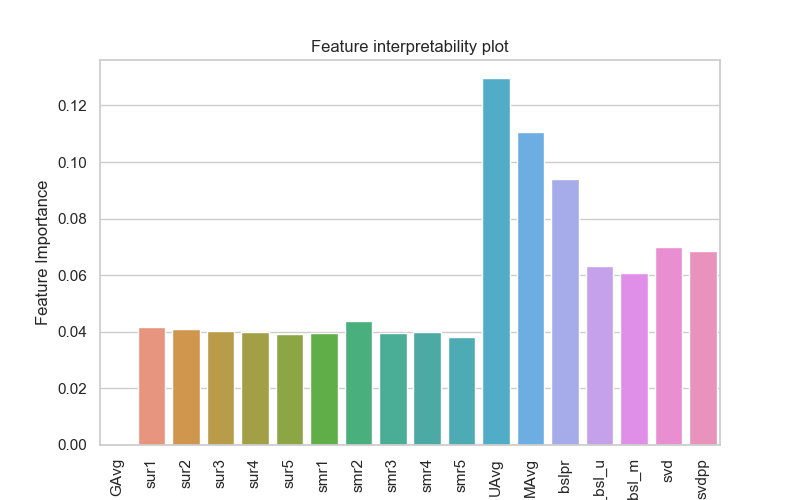

In [86]:
# plotting feature importance
coloumns = x_train.columns
feature_imp = xgb_final.best_estimator_.feature_importances_

sns.set(style="whitegrid")
plt.figure(figsize=(8,5))
sns.barplot(x = coloumns,y = feature_imp)
plt.xticks(rotation='vertical')
plt.xlabel("Feature Name")
plt.ylabel("Feature Importance")
plt.title("Feature interpretability plot")
plt.show()

### 5.5 XgBoost with Surprise Baseline + Surprise KNNbaseline + MF Techniques

In [87]:
# prepare train data
x_train = reg_train[['knn_bsl_u', 'knn_bsl_m', 'svd', 'svdpp']]
y_train = reg_train['rating']

# test data
x_test = reg_test_df[['knn_bsl_u', 'knn_bsl_m', 'svd', 'svdpp']]
y_test = reg_test_df['rating']

# making model ready for tuning
xgb = XGBRegressor(silent=False, n_jobs=-1)
xgb_all_models = GridSearchCV(xgb,param_grid,cv = 5)

In [88]:
train_results, test_results = run_xgboost(xgb_all_models, x_train, y_train, x_test, y_test)

# store the results in models_evaluations dictionaries
tuned_models_evaluation_train['xgb_all_models'] = train_results
tuned_models_evaluation_test['xgb_all_models'] = test_results

Training the model..
[15:41:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6 extra nodes, 0 pruned nodes, max_depth=3
[15:41:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6 extra nodes, 0 pruned nodes, max_depth=3
[15:41:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6 extra nodes, 0 pruned nodes, max_depth=3
[15:41:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6 extra nodes, 0 pruned nodes, max_depth=3
[15:41:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6 extra nodes, 0 pruned nodes, max_depth=3
[15:41:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6 extra nodes, 0 pruned nodes, max_depth=3
[15:41:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6 extra nodes, 0 pruned nodes, max_depth=3
[15:41:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16 extra nodes, 0 pruned nodes, max_depth=7
[15:41:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16 extra nodes, 0 prun

[15:41:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 288 extra nodes, 0 pruned nodes, max_depth=10
[15:41:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 170 extra nodes, 0 pruned nodes, max_depth=10
[15:41:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 400 extra nodes, 0 pruned nodes, max_depth=10
[15:41:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 326 extra nodes, 0 pruned nodes, max_depth=10
[15:41:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 346 extra nodes, 0 pruned nodes, max_depth=10
[15:41:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 286 extra nodes, 0 pruned nodes, max_depth=10
[15:41:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 276 extra nodes, 0 pruned nodes, max_depth=10
[15:41:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 402 extra nodes, 0 pruned nodes, max_depth=10
[15:41:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 358 extra nodes, 0 p

[15:42:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 362 extra nodes, 0 pruned nodes, max_depth=10
[15:42:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 394 extra nodes, 0 pruned nodes, max_depth=10
[15:42:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 406 extra nodes, 0 pruned nodes, max_depth=10
[15:42:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 412 extra nodes, 0 pruned nodes, max_depth=10
[15:42:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 308 extra nodes, 0 pruned nodes, max_depth=10
[15:42:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 418 extra nodes, 0 pruned nodes, max_depth=10
[15:42:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 432 extra nodes, 0 pruned nodes, max_depth=10
[15:42:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 436 extra nodes, 0 pruned nodes, max_depth=10
[15:42:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 384 extra nodes, 0 p

[15:42:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 262 extra nodes, 0 pruned nodes, max_depth=10
[15:42:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 172 extra nodes, 0 pruned nodes, max_depth=10
[15:42:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 244 extra nodes, 0 pruned nodes, max_depth=10
[15:42:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 356 extra nodes, 0 pruned nodes, max_depth=10
[15:42:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 210 extra nodes, 0 pruned nodes, max_depth=10
[15:42:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 328 extra nodes, 0 pruned nodes, max_depth=10
[15:42:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 278 extra nodes, 0 pruned nodes, max_depth=10
[15:42:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 260 extra nodes, 0 pruned nodes, max_depth=10
[15:42:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 352 extra nodes, 0 p

[15:42:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 464 extra nodes, 0 pruned nodes, max_depth=10
[15:42:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 516 extra nodes, 0 pruned nodes, max_depth=10
[15:42:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 482 extra nodes, 0 pruned nodes, max_depth=10
[15:42:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 522 extra nodes, 0 pruned nodes, max_depth=10
[15:42:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52 extra nodes, 0 pruned nodes, max_depth=10
[15:42:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 66 extra nodes, 0 pruned nodes, max_depth=10
[15:42:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 76 extra nodes, 0 pruned nodes, max_depth=10
[15:42:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 104 extra nodes, 0 pruned nodes, max_depth=10
[15:42:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 112 extra nodes, 0 prun

[15:42:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 374 extra nodes, 0 pruned nodes, max_depth=10
[15:42:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 536 extra nodes, 0 pruned nodes, max_depth=10
[15:42:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 404 extra nodes, 0 pruned nodes, max_depth=10
[15:42:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 478 extra nodes, 0 pruned nodes, max_depth=10
[15:42:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 434 extra nodes, 0 pruned nodes, max_depth=10
[15:42:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 308 extra nodes, 0 pruned nodes, max_depth=10
[15:42:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 412 extra nodes, 0 pruned nodes, max_depth=10
[15:42:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 326 extra nodes, 0 pruned nodes, max_depth=10
[15:42:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 348 extra nodes, 0 p

[15:42:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 264 extra nodes, 0 pruned nodes, max_depth=10
[15:42:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 184 extra nodes, 0 pruned nodes, max_depth=10
[15:42:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 308 extra nodes, 0 pruned nodes, max_depth=10
[15:42:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 390 extra nodes, 0 pruned nodes, max_depth=10
[15:42:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 254 extra nodes, 0 pruned nodes, max_depth=10
[15:42:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 318 extra nodes, 0 pruned nodes, max_depth=10
[15:42:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 300 extra nodes, 0 pruned nodes, max_depth=10
[15:42:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 304 extra nodes, 0 pruned nodes, max_depth=10
[15:42:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 320 extra nodes, 0 p

[15:42:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 66 extra nodes, 0 pruned nodes, max_depth=10
[15:42:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 70 extra nodes, 0 pruned nodes, max_depth=10
[15:42:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 74 extra nodes, 0 pruned nodes, max_depth=10
[15:42:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 62 extra nodes, 0 pruned nodes, max_depth=10
[15:42:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 56 extra nodes, 0 pruned nodes, max_depth=10
[15:42:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 90 extra nodes, 0 pruned nodes, max_depth=10
[15:42:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 106 extra nodes, 0 pruned nodes, max_depth=10
[15:42:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 110 extra nodes, 0 pruned nodes, max_depth=10
[15:42:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 104 extra nodes, 0 pruned 

[15:42:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 328 extra nodes, 0 pruned nodes, max_depth=10
[15:42:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 272 extra nodes, 0 pruned nodes, max_depth=10
[15:42:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 262 extra nodes, 0 pruned nodes, max_depth=10
[15:42:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 328 extra nodes, 0 pruned nodes, max_depth=10
[15:42:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 304 extra nodes, 0 pruned nodes, max_depth=10
[15:42:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 342 extra nodes, 0 pruned nodes, max_depth=10
[15:42:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 274 extra nodes, 0 pruned nodes, max_depth=10
[15:42:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 180 extra nodes, 0 pruned nodes, max_depth=10
[15:42:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 256 extra nodes, 0 p

[15:42:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 384 extra nodes, 0 pruned nodes, max_depth=10
[15:42:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 446 extra nodes, 0 pruned nodes, max_depth=10
[15:42:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 392 extra nodes, 0 pruned nodes, max_depth=10
[15:42:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 398 extra nodes, 0 pruned nodes, max_depth=10
[15:42:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 482 extra nodes, 0 pruned nodes, max_depth=10
[15:42:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 484 extra nodes, 0 pruned nodes, max_depth=10
[15:42:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 476 extra nodes, 0 pruned nodes, max_depth=10
[15:42:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 428 extra nodes, 0 pruned nodes, max_depth=10
[15:42:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 256 extra nodes, 0 p

[15:42:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 398 extra nodes, 0 pruned nodes, max_depth=10
[15:42:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 406 extra nodes, 0 pruned nodes, max_depth=10
[15:42:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 374 extra nodes, 0 pruned nodes, max_depth=10
[15:42:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 328 extra nodes, 0 pruned nodes, max_depth=10
[15:42:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 350 extra nodes, 0 pruned nodes, max_depth=10
[15:42:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 356 extra nodes, 0 pruned nodes, max_depth=10
[15:42:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 400 extra nodes, 0 pruned nodes, max_depth=10
[15:42:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 484 extra nodes, 0 pruned nodes, max_depth=10
[15:42:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 436 extra nodes, 0 p

[15:42:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 138 extra nodes, 0 pruned nodes, max_depth=10
[15:42:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 118 extra nodes, 0 pruned nodes, max_depth=10
[15:42:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 124 extra nodes, 0 pruned nodes, max_depth=10
[15:42:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 176 extra nodes, 0 pruned nodes, max_depth=10
[15:42:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 148 extra nodes, 0 pruned nodes, max_depth=10
[15:42:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 158 extra nodes, 0 pruned nodes, max_depth=10
[15:42:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 90 extra nodes, 0 pruned nodes, max_depth=10
[15:42:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 218 extra nodes, 0 pruned nodes, max_depth=10
[15:42:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 146 extra nodes, 0 pr

[15:42:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 436 extra nodes, 0 pruned nodes, max_depth=10
[15:42:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 348 extra nodes, 0 pruned nodes, max_depth=10
[15:42:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 486 extra nodes, 0 pruned nodes, max_depth=10
[15:42:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 340 extra nodes, 0 pruned nodes, max_depth=10
[15:42:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 308 extra nodes, 0 pruned nodes, max_depth=10
[15:42:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 296 extra nodes, 0 pruned nodes, max_depth=10
[15:42:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 476 extra nodes, 0 pruned nodes, max_depth=10
[15:42:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 424 extra nodes, 0 pruned nodes, max_depth=10
[15:42:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 348 extra nodes, 0 p

[15:43:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 380 extra nodes, 0 pruned nodes, max_depth=10
[15:43:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 306 extra nodes, 0 pruned nodes, max_depth=10
[15:43:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 284 extra nodes, 0 pruned nodes, max_depth=10
[15:43:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 182 extra nodes, 0 pruned nodes, max_depth=10
[15:43:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 322 extra nodes, 0 pruned nodes, max_depth=10
[15:43:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 344 extra nodes, 0 pruned nodes, max_depth=10
[15:43:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 446 extra nodes, 0 pruned nodes, max_depth=10
[15:43:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 382 extra nodes, 0 pruned nodes, max_depth=10
[15:43:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 324 extra nodes, 0 p

[15:43:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 186 extra nodes, 0 pruned nodes, max_depth=10
[15:43:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 184 extra nodes, 0 pruned nodes, max_depth=10
[15:43:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 172 extra nodes, 0 pruned nodes, max_depth=10
[15:43:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 160 extra nodes, 0 pruned nodes, max_depth=10
[15:43:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 160 extra nodes, 0 pruned nodes, max_depth=10
[15:43:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 202 extra nodes, 0 pruned nodes, max_depth=10
[15:43:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 198 extra nodes, 0 pruned nodes, max_depth=10
[15:43:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 162 extra nodes, 0 pruned nodes, max_depth=10
[15:43:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 178 extra nodes, 0 p

[15:43:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20 extra nodes, 0 pruned nodes, max_depth=6
[15:43:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22 extra nodes, 0 pruned nodes, max_depth=6
[15:43:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24 extra nodes, 0 pruned nodes, max_depth=7
[15:43:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24 extra nodes, 0 pruned nodes, max_depth=6
[15:43:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=5
[15:43:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28 extra nodes, 0 pruned nodes, max_depth=7
[15:43:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36 extra nodes, 0 pruned nodes, max_depth=9
[15:43:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28 extra nodes, 0 pruned nodes, max_depth=8
[15:43:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32 extra nodes, 0 pruned nodes, max_

[15:43:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 314 extra nodes, 0 pruned nodes, max_depth=10
[15:43:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 316 extra nodes, 0 pruned nodes, max_depth=10
[15:43:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 320 extra nodes, 0 pruned nodes, max_depth=10
[15:43:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 314 extra nodes, 0 pruned nodes, max_depth=10
[15:43:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 298 extra nodes, 0 pruned nodes, max_depth=10
[15:43:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 402 extra nodes, 0 pruned nodes, max_depth=10
[15:43:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 286 extra nodes, 0 pruned nodes, max_depth=10
[15:43:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 306 extra nodes, 0 pruned nodes, max_depth=10
[15:43:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 346 extra nodes, 0 p

[15:43:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 246 extra nodes, 0 pruned nodes, max_depth=10
[15:43:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 328 extra nodes, 0 pruned nodes, max_depth=10
[15:43:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 274 extra nodes, 0 pruned nodes, max_depth=10
[15:43:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 214 extra nodes, 0 pruned nodes, max_depth=10
[15:43:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 316 extra nodes, 0 pruned nodes, max_depth=10
[15:43:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 318 extra nodes, 0 pruned nodes, max_depth=10
[15:43:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 282 extra nodes, 0 pruned nodes, max_depth=10
[15:43:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 222 extra nodes, 0 pruned nodes, max_depth=10
[15:43:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 238 extra nodes, 0 p

[15:43:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 188 extra nodes, 0 pruned nodes, max_depth=10
[15:43:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 204 extra nodes, 0 pruned nodes, max_depth=10
[15:43:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 214 extra nodes, 0 pruned nodes, max_depth=10
[15:43:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 202 extra nodes, 0 pruned nodes, max_depth=10
[15:43:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 228 extra nodes, 0 pruned nodes, max_depth=10
[15:43:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 268 extra nodes, 0 pruned nodes, max_depth=10
[15:43:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 210 extra nodes, 0 pruned nodes, max_depth=10
[15:43:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 328 extra nodes, 0 pruned nodes, max_depth=10
[15:43:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 294 extra nodes, 0 p

[15:43:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24 extra nodes, 0 pruned nodes, max_depth=7
[15:43:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24 extra nodes, 0 pruned nodes, max_depth=7
[15:43:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22 extra nodes, 0 pruned nodes, max_depth=6
[15:43:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 38 extra nodes, 0 pruned nodes, max_depth=10
[15:43:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20 extra nodes, 0 pruned nodes, max_depth=6
[15:43:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36 extra nodes, 0 pruned nodes, max_depth=9
[15:43:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46 extra nodes, 0 pruned nodes, max_depth=10
[15:43:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28 extra nodes, 0 pruned nodes, max_depth=7
[15:43:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32 extra nodes, 0 pruned nodes, ma

[15:43:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 340 extra nodes, 0 pruned nodes, max_depth=10
[15:43:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 416 extra nodes, 0 pruned nodes, max_depth=10
[15:43:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 388 extra nodes, 0 pruned nodes, max_depth=10
[15:43:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 376 extra nodes, 0 pruned nodes, max_depth=10
[15:43:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 358 extra nodes, 0 pruned nodes, max_depth=10
[15:43:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 392 extra nodes, 0 pruned nodes, max_depth=10
[15:43:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 476 extra nodes, 0 pruned nodes, max_depth=10
[15:43:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 282 extra nodes, 0 pruned nodes, max_depth=10
[15:43:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 328 extra nodes, 0 p

[15:43:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 720 extra nodes, 0 pruned nodes, max_depth=15
[15:43:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 572 extra nodes, 0 pruned nodes, max_depth=15
[15:43:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 784 extra nodes, 0 pruned nodes, max_depth=15
[15:43:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 892 extra nodes, 0 pruned nodes, max_depth=15
[15:43:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 672 extra nodes, 0 pruned nodes, max_depth=15
[15:43:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 522 extra nodes, 0 pruned nodes, max_depth=15
[15:43:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 564 extra nodes, 0 pruned nodes, max_depth=15
[15:43:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 904 extra nodes, 0 pruned nodes, max_depth=15
[15:43:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 718 extra nodes, 0 p

[15:43:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 72 extra nodes, 0 pruned nodes, max_depth=14
[15:43:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 74 extra nodes, 0 pruned nodes, max_depth=14
[15:43:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32 extra nodes, 0 pruned nodes, max_depth=7
[15:43:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 630 extra nodes, 0 pruned nodes, max_depth=15
[15:43:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 690 extra nodes, 0 pruned nodes, max_depth=15
[15:43:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 578 extra nodes, 0 pruned nodes, max_depth=15
[15:43:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 608 extra nodes, 0 pruned nodes, max_depth=15
[15:43:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 86 extra nodes, 0 pruned nodes, max_depth=12
[15:43:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 910 extra nodes, 0 pruned

[15:43:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1486 extra nodes, 0 pruned nodes, max_depth=15
[15:43:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1708 extra nodes, 0 pruned nodes, max_depth=15
[15:43:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1704 extra nodes, 0 pruned nodes, max_depth=15
[15:43:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1506 extra nodes, 0 pruned nodes, max_depth=15
[15:43:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1420 extra nodes, 0 pruned nodes, max_depth=15
[15:43:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1694 extra nodes, 0 pruned nodes, max_depth=15
[15:43:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=6
[15:43:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22 extra nodes, 0 pruned nodes, max_depth=8
[15:43:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 

[15:43:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1534 extra nodes, 0 pruned nodes, max_depth=15
[15:43:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1296 extra nodes, 0 pruned nodes, max_depth=15
[15:43:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1452 extra nodes, 0 pruned nodes, max_depth=15
[15:43:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1428 extra nodes, 0 pruned nodes, max_depth=15
[15:43:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1230 extra nodes, 0 pruned nodes, max_depth=15
[15:44:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1252 extra nodes, 0 pruned nodes, max_depth=15
[15:44:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1100 extra nodes, 0 pruned nodes, max_depth=15
[15:44:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1618 extra nodes, 0 pruned nodes, max_depth=15
[15:44:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1398 extra n

[15:44:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 952 extra nodes, 0 pruned nodes, max_depth=15
[15:44:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 748 extra nodes, 0 pruned nodes, max_depth=15
[15:44:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1112 extra nodes, 0 pruned nodes, max_depth=15
[15:44:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1020 extra nodes, 0 pruned nodes, max_depth=15
[15:44:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 966 extra nodes, 0 pruned nodes, max_depth=15
[15:44:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1314 extra nodes, 0 pruned nodes, max_depth=15
[15:44:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 892 extra nodes, 0 pruned nodes, max_depth=15
[15:44:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1162 extra nodes, 0 pruned nodes, max_depth=15
[15:44:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1084 extra nodes

[15:44:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 120 extra nodes, 0 pruned nodes, max_depth=15
[15:44:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 66 extra nodes, 0 pruned nodes, max_depth=11
[15:44:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 82 extra nodes, 0 pruned nodes, max_depth=12
[15:44:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 84 extra nodes, 0 pruned nodes, max_depth=12
[15:44:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 116 extra nodes, 0 pruned nodes, max_depth=15
[15:44:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 78 extra nodes, 0 pruned nodes, max_depth=15
[15:44:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 106 extra nodes, 0 pruned nodes, max_depth=15
[15:44:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 180 extra nodes, 0 pruned nodes, max_depth=15
[15:44:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 202 extra nodes, 0 prune

[15:44:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1276 extra nodes, 0 pruned nodes, max_depth=15
[15:44:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1790 extra nodes, 0 pruned nodes, max_depth=15
[15:44:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1536 extra nodes, 0 pruned nodes, max_depth=15
[15:44:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1306 extra nodes, 0 pruned nodes, max_depth=15
[15:44:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1946 extra nodes, 0 pruned nodes, max_depth=15
[15:44:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1148 extra nodes, 0 pruned nodes, max_depth=15
[15:44:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1036 extra nodes, 0 pruned nodes, max_depth=15
[15:44:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1028 extra nodes, 0 pruned nodes, max_depth=15
[15:44:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1228 extra n

[15:44:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 682 extra nodes, 0 pruned nodes, max_depth=15
[15:44:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 638 extra nodes, 0 pruned nodes, max_depth=15
[15:44:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 702 extra nodes, 0 pruned nodes, max_depth=15
[15:44:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 790 extra nodes, 0 pruned nodes, max_depth=15
[15:44:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 648 extra nodes, 0 pruned nodes, max_depth=15
[15:44:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 734 extra nodes, 0 pruned nodes, max_depth=15
[15:44:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1106 extra nodes, 0 pruned nodes, max_depth=15
[15:44:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 730 extra nodes, 0 pruned nodes, max_depth=15
[15:44:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 626 extra nodes, 0 

[15:44:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 632 extra nodes, 0 pruned nodes, max_depth=15
[15:44:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 866 extra nodes, 0 pruned nodes, max_depth=15
[15:44:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 664 extra nodes, 0 pruned nodes, max_depth=15
[15:44:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 390 extra nodes, 0 pruned nodes, max_depth=15
[15:44:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 462 extra nodes, 0 pruned nodes, max_depth=15
[15:44:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 518 extra nodes, 0 pruned nodes, max_depth=15
[15:44:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 404 extra nodes, 0 pruned nodes, max_depth=15
[15:44:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 802 extra nodes, 0 pruned nodes, max_depth=15
[15:44:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 668 extra nodes, 0 p

[15:44:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 78 extra nodes, 0 pruned nodes, max_depth=13
[15:44:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 74 extra nodes, 0 pruned nodes, max_depth=13
[15:44:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 82 extra nodes, 0 pruned nodes, max_depth=12
[15:44:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 60 extra nodes, 0 pruned nodes, max_depth=12
[15:44:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 56 extra nodes, 0 pruned nodes, max_depth=12
[15:44:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 130 extra nodes, 0 pruned nodes, max_depth=12
[15:44:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 90 extra nodes, 0 pruned nodes, max_depth=11
[15:44:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 88 extra nodes, 0 pruned nodes, max_depth=11
[15:44:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 260 extra nodes, 0 pruned n

[15:44:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1264 extra nodes, 0 pruned nodes, max_depth=15
[15:44:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1384 extra nodes, 0 pruned nodes, max_depth=15
[15:44:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1264 extra nodes, 0 pruned nodes, max_depth=15
[15:44:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1538 extra nodes, 0 pruned nodes, max_depth=15
[15:44:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1324 extra nodes, 0 pruned nodes, max_depth=15
[15:44:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1494 extra nodes, 0 pruned nodes, max_depth=15
[15:44:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1360 extra nodes, 0 pruned nodes, max_depth=15
[15:44:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1578 extra nodes, 0 pruned nodes, max_depth=15
[15:44:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1394 extra n

[15:44:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1022 extra nodes, 0 pruned nodes, max_depth=15
[15:44:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1560 extra nodes, 0 pruned nodes, max_depth=15
[15:44:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1086 extra nodes, 0 pruned nodes, max_depth=15
[15:44:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1530 extra nodes, 0 pruned nodes, max_depth=15
[15:44:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1356 extra nodes, 0 pruned nodes, max_depth=15
[15:44:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1266 extra nodes, 0 pruned nodes, max_depth=15
[15:44:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1692 extra nodes, 0 pruned nodes, max_depth=15
[15:44:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1438 extra nodes, 0 pruned nodes, max_depth=15
[15:44:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1346 extra n

[15:45:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 328 extra nodes, 0 pruned nodes, max_depth=15
[15:45:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 374 extra nodes, 0 pruned nodes, max_depth=15
[15:45:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 190 extra nodes, 0 pruned nodes, max_depth=15
[15:45:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 340 extra nodes, 0 pruned nodes, max_depth=15
[15:45:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 350 extra nodes, 0 pruned nodes, max_depth=15
[15:45:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 348 extra nodes, 0 pruned nodes, max_depth=15
[15:45:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 342 extra nodes, 0 pruned nodes, max_depth=15
[15:45:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 334 extra nodes, 0 pruned nodes, max_depth=15
[15:45:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 320 extra nodes, 0 p

[15:45:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1186 extra nodes, 0 pruned nodes, max_depth=15
[15:45:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 874 extra nodes, 0 pruned nodes, max_depth=15
[15:45:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1230 extra nodes, 0 pruned nodes, max_depth=15
[15:45:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1448 extra nodes, 0 pruned nodes, max_depth=15
[15:45:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 758 extra nodes, 0 pruned nodes, max_depth=15
[15:45:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2 extra nodes, 0 pruned nodes, max_depth=1
[15:45:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2 extra nodes, 0 pruned nodes, max_depth=1
[15:45:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2 extra nodes, 0 pruned nodes, max_depth=1
[15:45:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2 extra nodes, 0 pruned no

[15:45:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 552 extra nodes, 0 pruned nodes, max_depth=15
[15:45:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 840 extra nodes, 0 pruned nodes, max_depth=15
[15:45:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 514 extra nodes, 0 pruned nodes, max_depth=15
[15:45:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 630 extra nodes, 0 pruned nodes, max_depth=15
[15:45:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 770 extra nodes, 0 pruned nodes, max_depth=15
[15:45:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 856 extra nodes, 0 pruned nodes, max_depth=15
[15:45:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 868 extra nodes, 0 pruned nodes, max_depth=15
[15:45:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 738 extra nodes, 0 pruned nodes, max_depth=15
[15:45:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 714 extra nodes, 0 p

[15:45:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 582 extra nodes, 0 pruned nodes, max_depth=15
[15:45:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 574 extra nodes, 0 pruned nodes, max_depth=15
[15:45:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 586 extra nodes, 0 pruned nodes, max_depth=15
[15:45:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 814 extra nodes, 0 pruned nodes, max_depth=15
[15:45:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 806 extra nodes, 0 pruned nodes, max_depth=15
[15:45:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1062 extra nodes, 0 pruned nodes, max_depth=15
[15:45:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 888 extra nodes, 0 pruned nodes, max_depth=15
[15:45:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 844 extra nodes, 0 pruned nodes, max_depth=15
[15:45:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1046 extra nodes, 0

[15:45:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 114 extra nodes, 0 pruned nodes, max_depth=11
[15:45:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 98 extra nodes, 0 pruned nodes, max_depth=11
[15:45:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 124 extra nodes, 0 pruned nodes, max_depth=14
[15:45:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 298 extra nodes, 0 pruned nodes, max_depth=15
[15:45:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 336 extra nodes, 0 pruned nodes, max_depth=15
[15:45:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 212 extra nodes, 0 pruned nodes, max_depth=15
[15:45:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 150 extra nodes, 0 pruned nodes, max_depth=13
[15:45:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 266 extra nodes, 0 pruned nodes, max_depth=15
[15:45:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 342 extra nodes, 0 pr

[15:45:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1382 extra nodes, 0 pruned nodes, max_depth=15
[15:45:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1208 extra nodes, 0 pruned nodes, max_depth=15
[15:45:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1418 extra nodes, 0 pruned nodes, max_depth=15
[15:45:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1324 extra nodes, 0 pruned nodes, max_depth=15
[15:45:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1368 extra nodes, 0 pruned nodes, max_depth=15
[15:45:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1336 extra nodes, 0 pruned nodes, max_depth=15
[15:45:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1238 extra nodes, 0 pruned nodes, max_depth=15
[15:45:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1458 extra nodes, 0 pruned nodes, max_depth=15
[15:45:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1456 extra n

[15:45:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1306 extra nodes, 0 pruned nodes, max_depth=15
[15:45:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1304 extra nodes, 0 pruned nodes, max_depth=15
[15:45:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1222 extra nodes, 0 pruned nodes, max_depth=15
[15:45:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1342 extra nodes, 0 pruned nodes, max_depth=15
[15:45:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1212 extra nodes, 0 pruned nodes, max_depth=15
[15:45:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1384 extra nodes, 0 pruned nodes, max_depth=15
[15:45:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1362 extra nodes, 0 pruned nodes, max_depth=15
[15:45:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1354 extra nodes, 0 pruned nodes, max_depth=15
[15:45:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1234 extra n

[15:45:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 258 extra nodes, 0 pruned nodes, max_depth=15
[15:45:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 318 extra nodes, 0 pruned nodes, max_depth=15
[15:45:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 304 extra nodes, 0 pruned nodes, max_depth=15
[15:45:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 278 extra nodes, 0 pruned nodes, max_depth=15
[15:45:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 392 extra nodes, 0 pruned nodes, max_depth=15
[15:45:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 440 extra nodes, 0 pruned nodes, max_depth=15
[15:45:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 520 extra nodes, 0 pruned nodes, max_depth=15
[15:45:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 516 extra nodes, 0 pruned nodes, max_depth=15
[15:45:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 380 extra nodes, 0 p

[15:46:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16 extra nodes, 0 pruned nodes, max_depth=7
[15:46:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16 extra nodes, 0 pruned nodes, max_depth=7
[15:46:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26 extra nodes, 0 pruned nodes, max_depth=7
[15:46:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12 extra nodes, 0 pruned nodes, max_depth=5
[15:46:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 172 extra nodes, 0 pruned nodes, max_depth=20
[15:46:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 170 extra nodes, 0 pruned nodes, max_depth=20
[15:46:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 152 extra nodes, 0 pruned nodes, max_depth=20
[15:46:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 202 extra nodes, 0 pruned nodes, max_depth=20
[15:46:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28 extra nodes, 0 pruned nod

[15:46:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3350 extra nodes, 0 pruned nodes, max_depth=20
[15:46:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2518 extra nodes, 0 pruned nodes, max_depth=20
[15:46:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2984 extra nodes, 0 pruned nodes, max_depth=20
[15:46:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2426 extra nodes, 0 pruned nodes, max_depth=20
[15:46:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4454 extra nodes, 0 pruned nodes, max_depth=20
[15:46:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3730 extra nodes, 0 pruned nodes, max_depth=20
[15:46:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2428 extra nodes, 0 pruned nodes, max_depth=20
[15:46:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2374 extra nodes, 0 pruned nodes, max_depth=20
[15:46:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3492 extra n

[15:46:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2328 extra nodes, 0 pruned nodes, max_depth=20
[15:46:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2654 extra nodes, 0 pruned nodes, max_depth=20
[15:46:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2548 extra nodes, 0 pruned nodes, max_depth=20
[15:46:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4058 extra nodes, 0 pruned nodes, max_depth=20
[15:46:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2298 extra nodes, 0 pruned nodes, max_depth=20
[15:46:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3848 extra nodes, 0 pruned nodes, max_depth=20
[15:46:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2652 extra nodes, 0 pruned nodes, max_depth=20
[15:46:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2432 extra nodes, 0 pruned nodes, max_depth=20
[15:46:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3264 extra n

[15:46:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1100 extra nodes, 0 pruned nodes, max_depth=20
[15:46:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1132 extra nodes, 0 pruned nodes, max_depth=20
[15:46:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1346 extra nodes, 0 pruned nodes, max_depth=20
[15:46:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1856 extra nodes, 0 pruned nodes, max_depth=20
[15:46:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1530 extra nodes, 0 pruned nodes, max_depth=20
[15:46:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1820 extra nodes, 0 pruned nodes, max_depth=20
[15:46:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1988 extra nodes, 0 pruned nodes, max_depth=20
[15:46:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1768 extra nodes, 0 pruned nodes, max_depth=20
[15:46:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2780 extra n

[15:46:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52 extra nodes, 0 pruned nodes, max_depth=10
[15:46:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 86 extra nodes, 0 pruned nodes, max_depth=13
[15:46:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 100 extra nodes, 0 pruned nodes, max_depth=13
[15:46:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 92 extra nodes, 0 pruned nodes, max_depth=13
[15:46:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 74 extra nodes, 0 pruned nodes, max_depth=10
[15:46:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 170 extra nodes, 0 pruned nodes, max_depth=16
[15:46:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 176 extra nodes, 0 pruned nodes, max_depth=16
[15:46:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 122 extra nodes, 0 pruned nodes, max_depth=14
[15:46:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 234 extra nodes, 0 prune

[15:46:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3452 extra nodes, 0 pruned nodes, max_depth=20
[15:46:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2406 extra nodes, 0 pruned nodes, max_depth=20
[15:46:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3030 extra nodes, 0 pruned nodes, max_depth=20
[15:46:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3038 extra nodes, 0 pruned nodes, max_depth=20
[15:46:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2644 extra nodes, 0 pruned nodes, max_depth=20
[15:46:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2372 extra nodes, 0 pruned nodes, max_depth=20
[15:46:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2382 extra nodes, 0 pruned nodes, max_depth=20
[15:46:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3332 extra nodes, 0 pruned nodes, max_depth=20
[15:46:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3852 extra n

[15:46:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1982 extra nodes, 0 pruned nodes, max_depth=20
[15:46:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1808 extra nodes, 0 pruned nodes, max_depth=20
[15:46:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2182 extra nodes, 0 pruned nodes, max_depth=20
[15:46:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2294 extra nodes, 0 pruned nodes, max_depth=20
[15:46:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2174 extra nodes, 0 pruned nodes, max_depth=20
[15:46:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2014 extra nodes, 0 pruned nodes, max_depth=20
[15:46:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2400 extra nodes, 0 pruned nodes, max_depth=20
[15:46:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2060 extra nodes, 0 pruned nodes, max_depth=20
[15:46:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1984 extra n

[15:47:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 224 extra nodes, 0 pruned nodes, max_depth=20
[15:47:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 246 extra nodes, 0 pruned nodes, max_depth=20
[15:47:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 80 extra nodes, 0 pruned nodes, max_depth=13
[15:47:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 96 extra nodes, 0 pruned nodes, max_depth=13
[15:47:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 164 extra nodes, 0 pruned nodes, max_depth=15
[15:47:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 100 extra nodes, 0 pruned nodes, max_depth=12
[15:47:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 160 extra nodes, 0 pruned nodes, max_depth=15
[15:47:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 172 extra nodes, 0 pruned nodes, max_depth=17
[15:47:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 156 extra nodes, 0 pru

[15:47:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2562 extra nodes, 0 pruned nodes, max_depth=20
[15:47:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2796 extra nodes, 0 pruned nodes, max_depth=20
[15:47:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1838 extra nodes, 0 pruned nodes, max_depth=20
[15:47:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2272 extra nodes, 0 pruned nodes, max_depth=20
[15:47:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1788 extra nodes, 0 pruned nodes, max_depth=20
[15:47:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1874 extra nodes, 0 pruned nodes, max_depth=20
[15:47:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2674 extra nodes, 0 pruned nodes, max_depth=20
[15:47:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2006 extra nodes, 0 pruned nodes, max_depth=20
[15:47:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1512 extra n

[15:47:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3628 extra nodes, 0 pruned nodes, max_depth=20
[15:47:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3894 extra nodes, 0 pruned nodes, max_depth=20
[15:47:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4140 extra nodes, 0 pruned nodes, max_depth=20
[15:47:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4106 extra nodes, 0 pruned nodes, max_depth=20
[15:47:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2934 extra nodes, 0 pruned nodes, max_depth=20
[15:47:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3170 extra nodes, 0 pruned nodes, max_depth=20
[15:47:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1712 extra nodes, 0 pruned nodes, max_depth=20
[15:47:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3862 extra nodes, 0 pruned nodes, max_depth=20
[15:47:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3708 extra n

[15:47:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1602 extra nodes, 0 pruned nodes, max_depth=20
[15:47:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2772 extra nodes, 0 pruned nodes, max_depth=20
[15:47:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1414 extra nodes, 0 pruned nodes, max_depth=20
[15:47:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1838 extra nodes, 0 pruned nodes, max_depth=20
[15:47:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2108 extra nodes, 0 pruned nodes, max_depth=20
[15:47:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1928 extra nodes, 0 pruned nodes, max_depth=20
[15:47:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3490 extra nodes, 0 pruned nodes, max_depth=20
[15:47:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2488 extra nodes, 0 pruned nodes, max_depth=20
[15:47:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2788 extra n

[15:47:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 270 extra nodes, 0 pruned nodes, max_depth=18
[15:47:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 124 extra nodes, 0 pruned nodes, max_depth=13
[15:47:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 150 extra nodes, 0 pruned nodes, max_depth=14
[15:47:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 150 extra nodes, 0 pruned nodes, max_depth=16
[15:47:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 72 extra nodes, 0 pruned nodes, max_depth=10
[15:47:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 266 extra nodes, 0 pruned nodes, max_depth=20
[15:47:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 260 extra nodes, 0 pruned nodes, max_depth=20
[15:47:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 390 extra nodes, 0 pruned nodes, max_depth=20
[15:47:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 250 extra nodes, 0 pr

[15:47:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2058 extra nodes, 0 pruned nodes, max_depth=20
[15:47:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2602 extra nodes, 0 pruned nodes, max_depth=20
[15:47:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2336 extra nodes, 0 pruned nodes, max_depth=20
[15:47:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2564 extra nodes, 0 pruned nodes, max_depth=20
[15:47:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2198 extra nodes, 0 pruned nodes, max_depth=20
[15:47:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2480 extra nodes, 0 pruned nodes, max_depth=20
[15:47:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2750 extra nodes, 0 pruned nodes, max_depth=20
[15:47:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2072 extra nodes, 0 pruned nodes, max_depth=20
[15:47:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2740 extra n

[15:47:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2272 extra nodes, 0 pruned nodes, max_depth=20
[15:47:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1896 extra nodes, 0 pruned nodes, max_depth=20
[15:47:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2578 extra nodes, 0 pruned nodes, max_depth=20
[15:47:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2234 extra nodes, 0 pruned nodes, max_depth=20
[15:47:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1698 extra nodes, 0 pruned nodes, max_depth=20
[15:47:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1968 extra nodes, 0 pruned nodes, max_depth=20
[15:47:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2622 extra nodes, 0 pruned nodes, max_depth=20
[15:47:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2916 extra nodes, 0 pruned nodes, max_depth=20
[15:47:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2178 extra n

[15:48:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 396 extra nodes, 0 pruned nodes, max_depth=20
[15:48:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 348 extra nodes, 0 pruned nodes, max_depth=20
[15:48:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 584 extra nodes, 0 pruned nodes, max_depth=20
[15:48:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 596 extra nodes, 0 pruned nodes, max_depth=20
[15:48:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 476 extra nodes, 0 pruned nodes, max_depth=20
[15:48:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 602 extra nodes, 0 pruned nodes, max_depth=20
[15:48:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1166 extra nodes, 0 pruned nodes, max_depth=20
[15:48:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 750 extra nodes, 0 pruned nodes, max_depth=20
[15:48:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 766 extra nodes, 0 

[15:48:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 0 extra nodes, 0 pruned nodes, max_depth=0
[15:48:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 0 extra nodes, 0 pruned nodes, max_depth=0
[15:48:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 0 extra nodes, 0 pruned nodes, max_depth=0
[15:48:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=5
[15:48:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=5
[15:48:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=5
[15:48:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16 extra nodes, 0 pruned nodes, max_depth=5
[15:48:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16 extra nodes, 0 pruned nodes, max_depth=5
[15:48:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16 extra nodes, 0 pruned nodes, max_dep

[15:48:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3102 extra nodes, 0 pruned nodes, max_depth=20
[15:48:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3364 extra nodes, 0 pruned nodes, max_depth=20
[15:48:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2944 extra nodes, 0 pruned nodes, max_depth=20
[15:48:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3024 extra nodes, 0 pruned nodes, max_depth=20
[15:48:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3492 extra nodes, 0 pruned nodes, max_depth=20
[15:48:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2962 extra nodes, 0 pruned nodes, max_depth=20
[15:48:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2944 extra nodes, 0 pruned nodes, max_depth=20
[15:48:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3734 extra nodes, 0 pruned nodes, max_depth=20
[15:48:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3870 extra n

[15:48:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1988 extra nodes, 0 pruned nodes, max_depth=20
[15:48:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2412 extra nodes, 0 pruned nodes, max_depth=20
[15:48:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2400 extra nodes, 0 pruned nodes, max_depth=20
[15:48:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2486 extra nodes, 0 pruned nodes, max_depth=20
[15:48:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2318 extra nodes, 0 pruned nodes, max_depth=20
[15:48:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1830 extra nodes, 0 pruned nodes, max_depth=20
[15:48:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2042 extra nodes, 0 pruned nodes, max_depth=20
[15:48:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1822 extra nodes, 0 pruned nodes, max_depth=20
[15:48:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2170 extra n

[15:48:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 454 extra nodes, 0 pruned nodes, max_depth=20
[15:48:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 312 extra nodes, 0 pruned nodes, max_depth=20
[15:48:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 216 extra nodes, 0 pruned nodes, max_depth=13
[15:48:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 334 extra nodes, 0 pruned nodes, max_depth=20
[15:48:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 762 extra nodes, 0 pruned nodes, max_depth=20
[15:48:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 570 extra nodes, 0 pruned nodes, max_depth=20
[15:48:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 498 extra nodes, 0 pruned nodes, max_depth=20
[15:48:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 774 extra nodes, 0 pruned nodes, max_depth=20
[15:48:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 550 extra nodes, 0 p

[15:48:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1672 extra nodes, 0 pruned nodes, max_depth=20
[15:48:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1538 extra nodes, 0 pruned nodes, max_depth=20
[15:48:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1688 extra nodes, 0 pruned nodes, max_depth=20
[15:48:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1814 extra nodes, 0 pruned nodes, max_depth=20
[15:48:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1402 extra nodes, 0 pruned nodes, max_depth=20
[15:48:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1584 extra nodes, 0 pruned nodes, max_depth=20
[15:48:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1518 extra nodes, 0 pruned nodes, max_depth=20
[15:48:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24 extra nodes, 0 pruned nodes, max_depth=7
[15:48:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24 extra nodes,

[15:48:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1906 extra nodes, 0 pruned nodes, max_depth=20
[15:48:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2172 extra nodes, 0 pruned nodes, max_depth=20
[15:48:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1768 extra nodes, 0 pruned nodes, max_depth=20
[15:48:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1610 extra nodes, 0 pruned nodes, max_depth=20
[15:48:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1720 extra nodes, 0 pruned nodes, max_depth=20
[15:48:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1816 extra nodes, 0 pruned nodes, max_depth=20
[15:48:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1974 extra nodes, 0 pruned nodes, max_depth=20
[15:48:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2072 extra nodes, 0 pruned nodes, max_depth=20
[15:48:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2114 extra n

[15:49:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 488 extra nodes, 0 pruned nodes, max_depth=10
[15:49:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 270 extra nodes, 0 pruned nodes, max_depth=10
[15:49:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 446 extra nodes, 0 pruned nodes, max_depth=10
[15:49:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 508 extra nodes, 0 pruned nodes, max_depth=10
[15:49:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 582 extra nodes, 0 pruned nodes, max_depth=10
[15:49:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 384 extra nodes, 0 pruned nodes, max_depth=10
[15:49:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 176 extra nodes, 0 pruned nodes, max_depth=10
[15:49:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 520 extra nodes, 0 pruned nodes, max_depth=10
[15:49:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 558 extra nodes, 0 p

[15:49:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 216 extra nodes, 0 pruned nodes, max_depth=10
[15:49:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 524 extra nodes, 0 pruned nodes, max_depth=10
[15:49:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 438 extra nodes, 0 pruned nodes, max_depth=10
[15:49:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 436 extra nodes, 0 pruned nodes, max_depth=10
[15:49:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 350 extra nodes, 0 pruned nodes, max_depth=10
[15:49:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 454 extra nodes, 0 pruned nodes, max_depth=10
[15:49:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 232 extra nodes, 0 pruned nodes, max_depth=10
[15:49:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 326 extra nodes, 0 pruned nodes, max_depth=10
[15:49:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 488 extra nodes, 0 p

[15:49:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 370 extra nodes, 0 pruned nodes, max_depth=10
[15:49:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 454 extra nodes, 0 pruned nodes, max_depth=10
[15:49:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 638 extra nodes, 0 pruned nodes, max_depth=10
[15:49:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 244 extra nodes, 0 pruned nodes, max_depth=10
[15:49:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 792 extra nodes, 0 pruned nodes, max_depth=10
[15:49:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 534 extra nodes, 0 pruned nodes, max_depth=10
[15:49:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 630 extra nodes, 0 pruned nodes, max_depth=10
[15:49:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 270 extra nodes, 0 pruned nodes, max_depth=10
[15:49:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 712 extra nodes, 0 p

[15:49:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 320 extra nodes, 0 pruned nodes, max_depth=10
[15:49:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 618 extra nodes, 0 pruned nodes, max_depth=10
[15:49:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 570 extra nodes, 0 pruned nodes, max_depth=10
[15:49:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 656 extra nodes, 0 pruned nodes, max_depth=10
[15:49:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 668 extra nodes, 0 pruned nodes, max_depth=10
[15:49:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 270 extra nodes, 0 pruned nodes, max_depth=10
[15:49:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 652 extra nodes, 0 pruned nodes, max_depth=10
[15:49:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 502 extra nodes, 0 pruned nodes, max_depth=10
[15:49:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 244 extra nodes, 0 p

[15:49:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 538 extra nodes, 0 pruned nodes, max_depth=10
[15:49:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 590 extra nodes, 0 pruned nodes, max_depth=10
[15:49:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 678 extra nodes, 0 pruned nodes, max_depth=10
[15:49:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 640 extra nodes, 0 pruned nodes, max_depth=10
[15:49:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 416 extra nodes, 0 pruned nodes, max_depth=10
[15:49:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 460 extra nodes, 0 pruned nodes, max_depth=10
[15:49:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 460 extra nodes, 0 pruned nodes, max_depth=10
[15:49:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 524 extra nodes, 0 pruned nodes, max_depth=10
[15:49:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 450 extra nodes, 0 p

[15:49:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 132 extra nodes, 0 pruned nodes, max_depth=10
[15:49:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 204 extra nodes, 0 pruned nodes, max_depth=10
[15:49:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 184 extra nodes, 0 pruned nodes, max_depth=10
[15:49:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 278 extra nodes, 0 pruned nodes, max_depth=10
[15:49:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 244 extra nodes, 0 pruned nodes, max_depth=10
[15:49:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 270 extra nodes, 0 pruned nodes, max_depth=10
[15:49:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 308 extra nodes, 0 pruned nodes, max_depth=10
[15:49:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 338 extra nodes, 0 pruned nodes, max_depth=10
[15:49:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 292 extra nodes, 0 p

[15:49:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 542 extra nodes, 0 pruned nodes, max_depth=10
[15:49:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 500 extra nodes, 0 pruned nodes, max_depth=10
[15:49:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 524 extra nodes, 0 pruned nodes, max_depth=10
[15:49:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 384 extra nodes, 0 pruned nodes, max_depth=10
[15:49:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 584 extra nodes, 0 pruned nodes, max_depth=10
[15:49:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 458 extra nodes, 0 pruned nodes, max_depth=10
[15:49:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 464 extra nodes, 0 pruned nodes, max_depth=10
[15:49:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 298 extra nodes, 0 pruned nodes, max_depth=10
[15:49:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 536 extra nodes, 0 p

[15:49:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 198 extra nodes, 0 pruned nodes, max_depth=10
[15:49:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 412 extra nodes, 0 pruned nodes, max_depth=10
[15:49:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 580 extra nodes, 0 pruned nodes, max_depth=10
[15:49:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 496 extra nodes, 0 pruned nodes, max_depth=10
[15:49:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 126 extra nodes, 0 pruned nodes, max_depth=10
[15:49:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 380 extra nodes, 0 pruned nodes, max_depth=10
[15:49:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 378 extra nodes, 0 pruned nodes, max_depth=10
[15:49:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 406 extra nodes, 0 pruned nodes, max_depth=10
[15:49:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 424 extra nodes, 0 p

[15:49:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 404 extra nodes, 0 pruned nodes, max_depth=10
[15:49:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 452 extra nodes, 0 pruned nodes, max_depth=10
[15:49:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 270 extra nodes, 0 pruned nodes, max_depth=10
[15:49:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 402 extra nodes, 0 pruned nodes, max_depth=10
[15:49:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 420 extra nodes, 0 pruned nodes, max_depth=10
[15:49:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 280 extra nodes, 0 pruned nodes, max_depth=10
[15:49:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 372 extra nodes, 0 pruned nodes, max_depth=10
[15:49:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 468 extra nodes, 0 pruned nodes, max_depth=10
[15:49:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 206 extra nodes, 0 p

[15:49:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 398 extra nodes, 0 pruned nodes, max_depth=10
[15:49:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 264 extra nodes, 0 pruned nodes, max_depth=10
[15:49:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 574 extra nodes, 0 pruned nodes, max_depth=10
[15:49:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 410 extra nodes, 0 pruned nodes, max_depth=10
[15:49:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 474 extra nodes, 0 pruned nodes, max_depth=10
[15:49:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 384 extra nodes, 0 pruned nodes, max_depth=10
[15:49:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10 extra nodes, 0 pruned nodes, max_depth=4
[15:49:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20 extra nodes, 0 pruned nodes, max_depth=5
[15:49:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 88 extra nodes, 0 pruned

[15:49:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 318 extra nodes, 0 pruned nodes, max_depth=10
[15:49:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 286 extra nodes, 0 pruned nodes, max_depth=10
[15:49:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 506 extra nodes, 0 pruned nodes, max_depth=10
[15:49:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 342 extra nodes, 0 pruned nodes, max_depth=10
[15:49:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 208 extra nodes, 0 pruned nodes, max_depth=10
[15:49:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 312 extra nodes, 0 pruned nodes, max_depth=10
[15:49:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 502 extra nodes, 0 pruned nodes, max_depth=10
[15:49:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 310 extra nodes, 0 pruned nodes, max_depth=10
[15:49:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 204 extra nodes, 0 p

[15:49:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 306 extra nodes, 0 pruned nodes, max_depth=10
[15:49:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 420 extra nodes, 0 pruned nodes, max_depth=10
[15:49:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 398 extra nodes, 0 pruned nodes, max_depth=10
[15:49:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 100 extra nodes, 0 pruned nodes, max_depth=10
[15:49:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 420 extra nodes, 0 pruned nodes, max_depth=10
[15:49:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 458 extra nodes, 0 pruned nodes, max_depth=10
[15:49:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 532 extra nodes, 0 pruned nodes, max_depth=10
[15:49:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 286 extra nodes, 0 pruned nodes, max_depth=10
[15:49:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 404 extra nodes, 0 p

[15:50:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 306 extra nodes, 0 pruned nodes, max_depth=10
[15:50:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 278 extra nodes, 0 pruned nodes, max_depth=10
[15:50:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 244 extra nodes, 0 pruned nodes, max_depth=10
[15:50:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 486 extra nodes, 0 pruned nodes, max_depth=10
[15:50:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 308 extra nodes, 0 pruned nodes, max_depth=10
[15:50:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 300 extra nodes, 0 pruned nodes, max_depth=10
[15:50:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 292 extra nodes, 0 pruned nodes, max_depth=10
[15:50:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 452 extra nodes, 0 pruned nodes, max_depth=10
[15:50:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 398 extra nodes, 0 p

[15:50:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 322 extra nodes, 0 pruned nodes, max_depth=10
[15:50:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 408 extra nodes, 0 pruned nodes, max_depth=10
[15:50:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 234 extra nodes, 0 pruned nodes, max_depth=10
[15:50:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 486 extra nodes, 0 pruned nodes, max_depth=10
[15:50:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 212 extra nodes, 0 pruned nodes, max_depth=10
[15:50:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 404 extra nodes, 0 pruned nodes, max_depth=10
[15:50:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 484 extra nodes, 0 pruned nodes, max_depth=10
[15:50:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 462 extra nodes, 0 pruned nodes, max_depth=10
[15:50:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 396 extra nodes, 0 p

[15:50:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 388 extra nodes, 0 pruned nodes, max_depth=10
[15:50:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 114 extra nodes, 0 pruned nodes, max_depth=10
[15:50:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 372 extra nodes, 0 pruned nodes, max_depth=10
[15:50:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 114 extra nodes, 0 pruned nodes, max_depth=10
[15:50:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 388 extra nodes, 0 pruned nodes, max_depth=10
[15:50:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 334 extra nodes, 0 pruned nodes, max_depth=10
[15:50:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 502 extra nodes, 0 pruned nodes, max_depth=10
[15:50:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 420 extra nodes, 0 pruned nodes, max_depth=10
[15:50:11] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 350 extra nodes, 0 p

[15:50:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 276 extra nodes, 0 pruned nodes, max_depth=10
[15:50:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 378 extra nodes, 0 pruned nodes, max_depth=10
[15:50:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 306 extra nodes, 0 pruned nodes, max_depth=10
[15:50:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 284 extra nodes, 0 pruned nodes, max_depth=10
[15:50:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 256 extra nodes, 0 pruned nodes, max_depth=10
[15:50:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 446 extra nodes, 0 pruned nodes, max_depth=10
[15:50:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 222 extra nodes, 0 pruned nodes, max_depth=10
[15:50:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 322 extra nodes, 0 pruned nodes, max_depth=10
[15:50:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 298 extra nodes, 0 p

[15:50:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10 extra nodes, 0 pruned nodes, max_depth=4
[15:50:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20 extra nodes, 0 pruned nodes, max_depth=5
[15:50:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 76 extra nodes, 0 pruned nodes, max_depth=10
[15:50:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 136 extra nodes, 0 pruned nodes, max_depth=10
[15:50:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 184 extra nodes, 0 pruned nodes, max_depth=10
[15:50:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 290 extra nodes, 0 pruned nodes, max_depth=10
[15:50:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 208 extra nodes, 0 pruned nodes, max_depth=10
[15:50:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 326 extra nodes, 0 pruned nodes, max_depth=10
[15:50:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 398 extra nodes, 0 pruned

[15:50:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 434 extra nodes, 0 pruned nodes, max_depth=10
[15:50:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 226 extra nodes, 0 pruned nodes, max_depth=10
[15:50:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 234 extra nodes, 0 pruned nodes, max_depth=10
[15:50:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 320 extra nodes, 0 pruned nodes, max_depth=10
[15:50:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 348 extra nodes, 0 pruned nodes, max_depth=10
[15:50:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 324 extra nodes, 0 pruned nodes, max_depth=10
[15:50:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 336 extra nodes, 0 pruned nodes, max_depth=10
[15:50:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 300 extra nodes, 0 pruned nodes, max_depth=10
[15:50:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 472 extra nodes, 0 p

[15:50:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 338 extra nodes, 0 pruned nodes, max_depth=10
[15:50:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 354 extra nodes, 0 pruned nodes, max_depth=10
[15:50:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 320 extra nodes, 0 pruned nodes, max_depth=10
[15:50:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 384 extra nodes, 0 pruned nodes, max_depth=10
[15:50:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 500 extra nodes, 0 pruned nodes, max_depth=10
[15:50:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 582 extra nodes, 0 pruned nodes, max_depth=10
[15:50:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 82 extra nodes, 0 pruned nodes, max_depth=10
[15:50:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 342 extra nodes, 0 pruned nodes, max_depth=10
[15:50:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 144 extra nodes, 0 pr

[15:50:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 408 extra nodes, 0 pruned nodes, max_depth=10
[15:50:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 316 extra nodes, 0 pruned nodes, max_depth=10
[15:50:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 480 extra nodes, 0 pruned nodes, max_depth=10
[15:50:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 398 extra nodes, 0 pruned nodes, max_depth=10
[15:50:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 208 extra nodes, 0 pruned nodes, max_depth=10
[15:50:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 368 extra nodes, 0 pruned nodes, max_depth=10
[15:50:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 414 extra nodes, 0 pruned nodes, max_depth=10
[15:50:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 200 extra nodes, 0 pruned nodes, max_depth=10
[15:50:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 358 extra nodes, 0 p

[15:50:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 352 extra nodes, 0 pruned nodes, max_depth=10
[15:50:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 442 extra nodes, 0 pruned nodes, max_depth=10
[15:50:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 168 extra nodes, 0 pruned nodes, max_depth=10
[15:50:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 464 extra nodes, 0 pruned nodes, max_depth=10
[15:50:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 442 extra nodes, 0 pruned nodes, max_depth=10
[15:50:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 292 extra nodes, 0 pruned nodes, max_depth=10
[15:50:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 298 extra nodes, 0 pruned nodes, max_depth=10
[15:50:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 296 extra nodes, 0 pruned nodes, max_depth=10
[15:50:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 268 extra nodes, 0 p

[15:50:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1978 extra nodes, 0 pruned nodes, max_depth=15
[15:50:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2104 extra nodes, 0 pruned nodes, max_depth=15
[15:50:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 456 extra nodes, 0 pruned nodes, max_depth=15
[15:50:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1922 extra nodes, 0 pruned nodes, max_depth=15
[15:50:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1586 extra nodes, 0 pruned nodes, max_depth=15
[15:50:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 756 extra nodes, 0 pruned nodes, max_depth=15
[15:50:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 558 extra nodes, 0 pruned nodes, max_depth=15
[15:50:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2824 extra nodes, 0 pruned nodes, max_depth=15
[15:50:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2354 extra node

[15:50:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1456 extra nodes, 0 pruned nodes, max_depth=15
[15:50:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1462 extra nodes, 0 pruned nodes, max_depth=15
[15:50:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2326 extra nodes, 0 pruned nodes, max_depth=15
[15:50:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 748 extra nodes, 0 pruned nodes, max_depth=15
[15:50:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 974 extra nodes, 0 pruned nodes, max_depth=15
[15:50:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1336 extra nodes, 0 pruned nodes, max_depth=15
[15:50:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1176 extra nodes, 0 pruned nodes, max_depth=15
[15:50:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1830 extra nodes, 0 pruned nodes, max_depth=15
[15:50:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1086 extra nod

[15:51:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1088 extra nodes, 0 pruned nodes, max_depth=15
[15:51:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1126 extra nodes, 0 pruned nodes, max_depth=15
[15:51:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1802 extra nodes, 0 pruned nodes, max_depth=15
[15:51:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1316 extra nodes, 0 pruned nodes, max_depth=15
[15:51:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 802 extra nodes, 0 pruned nodes, max_depth=15
[15:51:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 926 extra nodes, 0 pruned nodes, max_depth=15
[15:51:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1416 extra nodes, 0 pruned nodes, max_depth=15
[15:51:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1596 extra nodes, 0 pruned nodes, max_depth=15
[15:51:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1554 extra nod

[15:51:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1236 extra nodes, 0 pruned nodes, max_depth=15
[15:51:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2158 extra nodes, 0 pruned nodes, max_depth=15
[15:51:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1084 extra nodes, 0 pruned nodes, max_depth=15
[15:51:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 750 extra nodes, 0 pruned nodes, max_depth=15
[15:51:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1698 extra nodes, 0 pruned nodes, max_depth=15
[15:51:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1428 extra nodes, 0 pruned nodes, max_depth=15
[15:51:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1994 extra nodes, 0 pruned nodes, max_depth=15
[15:51:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1480 extra nodes, 0 pruned nodes, max_depth=15
[15:51:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2662 extra no

[15:51:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 954 extra nodes, 0 pruned nodes, max_depth=15
[15:51:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 724 extra nodes, 0 pruned nodes, max_depth=15
[15:51:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1456 extra nodes, 0 pruned nodes, max_depth=15
[15:51:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1986 extra nodes, 0 pruned nodes, max_depth=15
[15:51:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 810 extra nodes, 0 pruned nodes, max_depth=15
[15:51:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1288 extra nodes, 0 pruned nodes, max_depth=15
[15:51:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1290 extra nodes, 0 pruned nodes, max_depth=15
[15:51:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1608 extra nodes, 0 pruned nodes, max_depth=15
[15:51:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1174 extra node

[15:51:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2894 extra nodes, 0 pruned nodes, max_depth=15
[15:51:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1260 extra nodes, 0 pruned nodes, max_depth=15
[15:51:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2040 extra nodes, 0 pruned nodes, max_depth=15
[15:51:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 488 extra nodes, 0 pruned nodes, max_depth=15
[15:51:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2810 extra nodes, 0 pruned nodes, max_depth=15
[15:51:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 998 extra nodes, 0 pruned nodes, max_depth=15
[15:51:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2836 extra nodes, 0 pruned nodes, max_depth=15
[15:51:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1370 extra nodes, 0 pruned nodes, max_depth=15
[15:51:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1610 extra nod

[15:51:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 888 extra nodes, 0 pruned nodes, max_depth=15
[15:51:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2514 extra nodes, 0 pruned nodes, max_depth=15
[15:51:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2 extra nodes, 0 pruned nodes, max_depth=1
[15:51:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12 extra nodes, 0 pruned nodes, max_depth=6
[15:51:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2 extra nodes, 0 pruned nodes, max_depth=1
[15:51:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 102 extra nodes, 0 pruned nodes, max_depth=15
[15:51:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 96 extra nodes, 0 pruned nodes, max_depth=13
[15:51:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 166 extra nodes, 0 pruned nodes, max_depth=15
[15:51:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 350 extra nodes, 0 pruned no

[15:51:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 700 extra nodes, 0 pruned nodes, max_depth=15
[15:51:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1076 extra nodes, 0 pruned nodes, max_depth=15
[15:51:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 292 extra nodes, 0 pruned nodes, max_depth=15
[15:51:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 618 extra nodes, 0 pruned nodes, max_depth=15
[15:51:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1510 extra nodes, 0 pruned nodes, max_depth=15
[15:51:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1162 extra nodes, 0 pruned nodes, max_depth=15
[15:51:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1058 extra nodes, 0 pruned nodes, max_depth=15
[15:51:40] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 792 extra nodes, 0 pruned nodes, max_depth=15
[15:51:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 358 extra nodes,

[15:51:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1378 extra nodes, 0 pruned nodes, max_depth=15
[15:51:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 670 extra nodes, 0 pruned nodes, max_depth=15
[15:51:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1180 extra nodes, 0 pruned nodes, max_depth=15
[15:51:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1302 extra nodes, 0 pruned nodes, max_depth=15
[15:51:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1376 extra nodes, 0 pruned nodes, max_depth=15
[15:51:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1068 extra nodes, 0 pruned nodes, max_depth=15
[15:51:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1754 extra nodes, 0 pruned nodes, max_depth=15
[15:51:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 536 extra nodes, 0 pruned nodes, max_depth=15
[15:51:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 734 extra node

[15:51:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1168 extra nodes, 0 pruned nodes, max_depth=15
[15:51:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1210 extra nodes, 0 pruned nodes, max_depth=15
[15:51:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1128 extra nodes, 0 pruned nodes, max_depth=15
[15:51:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1264 extra nodes, 0 pruned nodes, max_depth=15
[15:51:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1528 extra nodes, 0 pruned nodes, max_depth=15
[15:51:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1388 extra nodes, 0 pruned nodes, max_depth=15
[15:51:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1316 extra nodes, 0 pruned nodes, max_depth=15
[15:51:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1186 extra nodes, 0 pruned nodes, max_depth=15
[15:51:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1102 extra n

[15:52:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 828 extra nodes, 0 pruned nodes, max_depth=15
[15:52:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 394 extra nodes, 0 pruned nodes, max_depth=15
[15:52:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 758 extra nodes, 0 pruned nodes, max_depth=15
[15:52:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 438 extra nodes, 0 pruned nodes, max_depth=15
[15:52:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1594 extra nodes, 0 pruned nodes, max_depth=15
[15:52:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 950 extra nodes, 0 pruned nodes, max_depth=15
[15:52:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1426 extra nodes, 0 pruned nodes, max_depth=15
[15:52:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 448 extra nodes, 0 pruned nodes, max_depth=15
[15:52:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1036 extra nodes, 

[15:52:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 598 extra nodes, 0 pruned nodes, max_depth=15
[15:52:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1030 extra nodes, 0 pruned nodes, max_depth=15
[15:52:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1658 extra nodes, 0 pruned nodes, max_depth=15
[15:52:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1352 extra nodes, 0 pruned nodes, max_depth=15
[15:52:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1660 extra nodes, 0 pruned nodes, max_depth=15
[15:52:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 394 extra nodes, 0 pruned nodes, max_depth=15
[15:52:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1120 extra nodes, 0 pruned nodes, max_depth=15
[15:52:09] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 614 extra nodes, 0 pruned nodes, max_depth=15
[15:52:10] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 950 extra nodes

[15:52:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 858 extra nodes, 0 pruned nodes, max_depth=15
[15:52:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 730 extra nodes, 0 pruned nodes, max_depth=15
[15:52:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 486 extra nodes, 0 pruned nodes, max_depth=15
[15:52:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 492 extra nodes, 0 pruned nodes, max_depth=15
[15:52:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 880 extra nodes, 0 pruned nodes, max_depth=15
[15:52:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 430 extra nodes, 0 pruned nodes, max_depth=15
[15:52:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 626 extra nodes, 0 pruned nodes, max_depth=15
[15:52:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1050 extra nodes, 0 pruned nodes, max_depth=15
[15:52:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 850 extra nodes, 0 

[15:52:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2 extra nodes, 0 pruned nodes, max_depth=1
[15:52:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2 extra nodes, 0 pruned nodes, max_depth=1
[15:52:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2 extra nodes, 0 pruned nodes, max_depth=1
[15:52:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 80 extra nodes, 0 pruned nodes, max_depth=15
[15:52:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 136 extra nodes, 0 pruned nodes, max_depth=15
[15:52:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 176 extra nodes, 0 pruned nodes, max_depth=15
[15:52:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 350 extra nodes, 0 pruned nodes, max_depth=15
[15:52:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 320 extra nodes, 0 pruned nodes, max_depth=15
[15:52:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 380 extra nodes, 0 pruned node

[15:52:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 274 extra nodes, 0 pruned nodes, max_depth=15
[15:52:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 902 extra nodes, 0 pruned nodes, max_depth=15
[15:52:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1082 extra nodes, 0 pruned nodes, max_depth=15
[15:52:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 548 extra nodes, 0 pruned nodes, max_depth=15
[15:52:30] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 578 extra nodes, 0 pruned nodes, max_depth=15
[15:52:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 864 extra nodes, 0 pruned nodes, max_depth=15
[15:52:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 330 extra nodes, 0 pruned nodes, max_depth=15
[15:52:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 714 extra nodes, 0 pruned nodes, max_depth=15
[15:52:31] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1076 extra nodes, 0

[15:52:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 834 extra nodes, 0 pruned nodes, max_depth=15
[15:52:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 594 extra nodes, 0 pruned nodes, max_depth=15
[15:52:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1058 extra nodes, 0 pruned nodes, max_depth=15
[15:52:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1200 extra nodes, 0 pruned nodes, max_depth=15
[15:52:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1700 extra nodes, 0 pruned nodes, max_depth=15
[15:52:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 704 extra nodes, 0 pruned nodes, max_depth=15
[15:52:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1058 extra nodes, 0 pruned nodes, max_depth=15
[15:52:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 924 extra nodes, 0 pruned nodes, max_depth=15
[15:52:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1264 extra nodes

[15:52:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1184 extra nodes, 0 pruned nodes, max_depth=15
[15:52:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 798 extra nodes, 0 pruned nodes, max_depth=15
[15:52:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1110 extra nodes, 0 pruned nodes, max_depth=15
[15:52:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1200 extra nodes, 0 pruned nodes, max_depth=15
[15:52:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1240 extra nodes, 0 pruned nodes, max_depth=15
[15:52:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 978 extra nodes, 0 pruned nodes, max_depth=15
[15:52:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 862 extra nodes, 0 pruned nodes, max_depth=15
[15:52:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 556 extra nodes, 0 pruned nodes, max_depth=15
[15:52:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 698 extra nodes,

[15:52:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 728 extra nodes, 0 pruned nodes, max_depth=15
[15:52:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 310 extra nodes, 0 pruned nodes, max_depth=15
[15:52:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 704 extra nodes, 0 pruned nodes, max_depth=15
[15:52:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1196 extra nodes, 0 pruned nodes, max_depth=15
[15:52:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 270 extra nodes, 0 pruned nodes, max_depth=15
[15:52:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1168 extra nodes, 0 pruned nodes, max_depth=15
[15:52:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1204 extra nodes, 0 pruned nodes, max_depth=15
[15:52:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1082 extra nodes, 0 pruned nodes, max_depth=15
[15:52:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 964 extra nodes,

[15:52:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 690 extra nodes, 0 pruned nodes, max_depth=15
[15:52:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1128 extra nodes, 0 pruned nodes, max_depth=15
[15:52:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1564 extra nodes, 0 pruned nodes, max_depth=15
[15:53:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 418 extra nodes, 0 pruned nodes, max_depth=15
[15:53:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 668 extra nodes, 0 pruned nodes, max_depth=15
[15:53:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1300 extra nodes, 0 pruned nodes, max_depth=15
[15:53:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 622 extra nodes, 0 pruned nodes, max_depth=15
[15:53:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 962 extra nodes, 0 pruned nodes, max_depth=15
[15:53:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 404 extra nodes, 

[15:53:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1854 extra nodes, 0 pruned nodes, max_depth=15
[15:53:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1958 extra nodes, 0 pruned nodes, max_depth=15
[15:53:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1510 extra nodes, 0 pruned nodes, max_depth=15
[15:53:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 490 extra nodes, 0 pruned nodes, max_depth=15
[15:53:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 924 extra nodes, 0 pruned nodes, max_depth=15
[15:53:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1766 extra nodes, 0 pruned nodes, max_depth=15
[15:53:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1718 extra nodes, 0 pruned nodes, max_depth=15
[15:53:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1666 extra nodes, 0 pruned nodes, max_depth=15
[15:53:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 408 extra node

[15:53:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 288 extra nodes, 0 pruned nodes, max_depth=20
[15:53:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 226 extra nodes, 0 pruned nodes, max_depth=17
[15:53:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 708 extra nodes, 0 pruned nodes, max_depth=20
[15:53:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1124 extra nodes, 0 pruned nodes, max_depth=20
[15:53:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 978 extra nodes, 0 pruned nodes, max_depth=20
[15:53:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 848 extra nodes, 0 pruned nodes, max_depth=20
[15:53:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1606 extra nodes, 0 pruned nodes, max_depth=20
[15:53:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2036 extra nodes, 0 pruned nodes, max_depth=20
[15:53:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1160 extra nodes,

[15:53:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7614 extra nodes, 0 pruned nodes, max_depth=20
[15:53:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2002 extra nodes, 0 pruned nodes, max_depth=20
[15:53:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1888 extra nodes, 0 pruned nodes, max_depth=20
[15:53:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1516 extra nodes, 0 pruned nodes, max_depth=20
[15:53:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2142 extra nodes, 0 pruned nodes, max_depth=20
[15:53:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1276 extra nodes, 0 pruned nodes, max_depth=20
[15:53:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4260 extra nodes, 0 pruned nodes, max_depth=20
[15:53:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2344 extra nodes, 0 pruned nodes, max_depth=20
[15:53:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4398 extra n

[15:53:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5968 extra nodes, 0 pruned nodes, max_depth=20
[15:53:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3870 extra nodes, 0 pruned nodes, max_depth=20
[15:53:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5232 extra nodes, 0 pruned nodes, max_depth=20
[15:53:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4164 extra nodes, 0 pruned nodes, max_depth=20
[15:53:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1918 extra nodes, 0 pruned nodes, max_depth=20
[15:53:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4662 extra nodes, 0 pruned nodes, max_depth=20
[15:53:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2944 extra nodes, 0 pruned nodes, max_depth=20
[15:53:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3654 extra nodes, 0 pruned nodes, max_depth=20
[15:53:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4478 extra n

[15:53:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3952 extra nodes, 0 pruned nodes, max_depth=20
[15:53:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4332 extra nodes, 0 pruned nodes, max_depth=20
[15:53:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4032 extra nodes, 0 pruned nodes, max_depth=20
[15:53:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3996 extra nodes, 0 pruned nodes, max_depth=20
[15:53:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3500 extra nodes, 0 pruned nodes, max_depth=20
[15:53:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4254 extra nodes, 0 pruned nodes, max_depth=20
[15:53:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3898 extra nodes, 0 pruned nodes, max_depth=20
[15:53:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5450 extra nodes, 0 pruned nodes, max_depth=20
[15:53:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5360 extra n

[15:53:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2128 extra nodes, 0 pruned nodes, max_depth=20
[15:53:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2624 extra nodes, 0 pruned nodes, max_depth=20
[15:53:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3766 extra nodes, 0 pruned nodes, max_depth=20
[15:53:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5678 extra nodes, 0 pruned nodes, max_depth=20
[15:53:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1874 extra nodes, 0 pruned nodes, max_depth=20
[15:53:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52 extra nodes, 0 pruned nodes, max_depth=10
[15:53:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 74 extra nodes, 0 pruned nodes, max_depth=10
[15:53:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 178 extra nodes, 0 pruned nodes, max_depth=12
[15:53:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 490 extra nodes, 

[15:54:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2158 extra nodes, 0 pruned nodes, max_depth=20
[15:54:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4240 extra nodes, 0 pruned nodes, max_depth=20
[15:54:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2836 extra nodes, 0 pruned nodes, max_depth=20
[15:54:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1914 extra nodes, 0 pruned nodes, max_depth=20
[15:54:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4668 extra nodes, 0 pruned nodes, max_depth=20
[15:54:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4134 extra nodes, 0 pruned nodes, max_depth=20
[15:54:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2044 extra nodes, 0 pruned nodes, max_depth=20
[15:54:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2020 extra nodes, 0 pruned nodes, max_depth=20
[15:54:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 7346 extra n

[15:54:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2344 extra nodes, 0 pruned nodes, max_depth=20
[15:54:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1552 extra nodes, 0 pruned nodes, max_depth=20
[15:54:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1094 extra nodes, 0 pruned nodes, max_depth=20
[15:54:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1182 extra nodes, 0 pruned nodes, max_depth=20
[15:54:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1294 extra nodes, 0 pruned nodes, max_depth=20
[15:54:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3250 extra nodes, 0 pruned nodes, max_depth=20
[15:54:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1488 extra nodes, 0 pruned nodes, max_depth=20
[15:54:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2222 extra nodes, 0 pruned nodes, max_depth=20
[15:54:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2336 extra n

[15:54:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1172 extra nodes, 0 pruned nodes, max_depth=20
[15:54:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 944 extra nodes, 0 pruned nodes, max_depth=20
[15:54:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1948 extra nodes, 0 pruned nodes, max_depth=20
[15:54:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1380 extra nodes, 0 pruned nodes, max_depth=20
[15:54:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1852 extra nodes, 0 pruned nodes, max_depth=20
[15:54:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2774 extra nodes, 0 pruned nodes, max_depth=20
[15:54:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1626 extra nodes, 0 pruned nodes, max_depth=20
[15:54:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1796 extra nodes, 0 pruned nodes, max_depth=20
[15:54:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 924 extra nod

[15:54:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5190 extra nodes, 0 pruned nodes, max_depth=20
[15:54:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3518 extra nodes, 0 pruned nodes, max_depth=20
[15:54:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2290 extra nodes, 0 pruned nodes, max_depth=20
[15:54:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 742 extra nodes, 0 pruned nodes, max_depth=20
[15:54:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1188 extra nodes, 0 pruned nodes, max_depth=20
[15:54:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4616 extra nodes, 0 pruned nodes, max_depth=20
[15:54:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3266 extra nodes, 0 pruned nodes, max_depth=20
[15:54:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4234 extra nodes, 0 pruned nodes, max_depth=20
[15:54:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2916 extra no

[15:54:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2790 extra nodes, 0 pruned nodes, max_depth=20
[15:54:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1556 extra nodes, 0 pruned nodes, max_depth=20
[15:54:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2904 extra nodes, 0 pruned nodes, max_depth=20
[15:54:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3320 extra nodes, 0 pruned nodes, max_depth=20
[15:54:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3202 extra nodes, 0 pruned nodes, max_depth=20
[15:54:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1818 extra nodes, 0 pruned nodes, max_depth=20
[15:54:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2260 extra nodes, 0 pruned nodes, max_depth=20
[15:54:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2346 extra nodes, 0 pruned nodes, max_depth=20
[15:54:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3850 extra n

[15:54:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2488 extra nodes, 0 pruned nodes, max_depth=20
[15:54:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2898 extra nodes, 0 pruned nodes, max_depth=20
[15:54:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2936 extra nodes, 0 pruned nodes, max_depth=20
[15:54:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2646 extra nodes, 0 pruned nodes, max_depth=20
[15:54:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2666 extra nodes, 0 pruned nodes, max_depth=20
[15:54:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2560 extra nodes, 0 pruned nodes, max_depth=20
[15:54:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2084 extra nodes, 0 pruned nodes, max_depth=20
[15:54:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1938 extra nodes, 0 pruned nodes, max_depth=20
[15:54:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2280 extra n

[15:55:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2290 extra nodes, 0 pruned nodes, max_depth=20
[15:55:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 42 extra nodes, 0 pruned nodes, max_depth=10
[15:55:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 122 extra nodes, 0 pruned nodes, max_depth=16
[15:55:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 82 extra nodes, 0 pruned nodes, max_depth=9
[15:55:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 204 extra nodes, 0 pruned nodes, max_depth=19
[15:55:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 488 extra nodes, 0 pruned nodes, max_depth=20
[15:55:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 654 extra nodes, 0 pruned nodes, max_depth=20
[15:55:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 988 extra nodes, 0 pruned nodes, max_depth=20
[15:55:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1956 extra nodes, 0 pr

[15:55:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3176 extra nodes, 0 pruned nodes, max_depth=20
[15:55:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1060 extra nodes, 0 pruned nodes, max_depth=20
[15:55:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 918 extra nodes, 0 pruned nodes, max_depth=20
[15:55:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2460 extra nodes, 0 pruned nodes, max_depth=20
[15:55:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2664 extra nodes, 0 pruned nodes, max_depth=20
[15:55:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3258 extra nodes, 0 pruned nodes, max_depth=20
[15:55:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4306 extra nodes, 0 pruned nodes, max_depth=20
[15:55:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1796 extra nodes, 0 pruned nodes, max_depth=20
[15:55:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2126 extra no

[15:55:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2542 extra nodes, 0 pruned nodes, max_depth=20
[15:55:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3074 extra nodes, 0 pruned nodes, max_depth=20
[15:55:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2654 extra nodes, 0 pruned nodes, max_depth=20
[15:55:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2506 extra nodes, 0 pruned nodes, max_depth=20
[15:55:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2570 extra nodes, 0 pruned nodes, max_depth=20
[15:55:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1624 extra nodes, 0 pruned nodes, max_depth=20
[15:55:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2912 extra nodes, 0 pruned nodes, max_depth=20
[15:55:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1504 extra nodes, 0 pruned nodes, max_depth=20
[15:55:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4862 extra n

[15:55:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1504 extra nodes, 0 pruned nodes, max_depth=20
[15:55:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1810 extra nodes, 0 pruned nodes, max_depth=20
[15:55:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 736 extra nodes, 0 pruned nodes, max_depth=20
[15:55:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1570 extra nodes, 0 pruned nodes, max_depth=20
[15:55:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1322 extra nodes, 0 pruned nodes, max_depth=20
[15:55:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 730 extra nodes, 0 pruned nodes, max_depth=20
[15:55:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 904 extra nodes, 0 pruned nodes, max_depth=20
[15:55:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 914 extra nodes, 0 pruned nodes, max_depth=20
[15:55:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1158 extra nodes

[15:55:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1602 extra nodes, 0 pruned nodes, max_depth=20
[15:55:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 284 extra nodes, 0 pruned nodes, max_depth=20
[15:55:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1266 extra nodes, 0 pruned nodes, max_depth=20
[15:55:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1292 extra nodes, 0 pruned nodes, max_depth=20
[15:55:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1148 extra nodes, 0 pruned nodes, max_depth=20
[15:55:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1418 extra nodes, 0 pruned nodes, max_depth=20
[15:55:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3164 extra nodes, 0 pruned nodes, max_depth=20
[15:55:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2114 extra nodes, 0 pruned nodes, max_depth=20
[15:55:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2232 extra no

[15:55:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3196 extra nodes, 0 pruned nodes, max_depth=20
[15:55:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1228 extra nodes, 0 pruned nodes, max_depth=20
[15:55:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1532 extra nodes, 0 pruned nodes, max_depth=20
[15:55:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2334 extra nodes, 0 pruned nodes, max_depth=20
[15:55:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2220 extra nodes, 0 pruned nodes, max_depth=20
[15:55:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1154 extra nodes, 0 pruned nodes, max_depth=20
[15:55:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1386 extra nodes, 0 pruned nodes, max_depth=20
[15:55:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1416 extra nodes, 0 pruned nodes, max_depth=20
[15:55:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3232 extra n

[15:56:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1946 extra nodes, 0 pruned nodes, max_depth=20
[15:56:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1870 extra nodes, 0 pruned nodes, max_depth=20
[15:56:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2338 extra nodes, 0 pruned nodes, max_depth=20
[15:56:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1944 extra nodes, 0 pruned nodes, max_depth=20
[15:56:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3040 extra nodes, 0 pruned nodes, max_depth=20
[15:56:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3430 extra nodes, 0 pruned nodes, max_depth=20
[15:56:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2380 extra nodes, 0 pruned nodes, max_depth=20
[15:56:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2292 extra nodes, 0 pruned nodes, max_depth=20
[15:56:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3908 extra n

[15:56:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 792 extra nodes, 0 pruned nodes, max_depth=20
[15:56:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1124 extra nodes, 0 pruned nodes, max_depth=20
[15:56:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1212 extra nodes, 0 pruned nodes, max_depth=20
[15:56:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1570 extra nodes, 0 pruned nodes, max_depth=20
[15:56:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1960 extra nodes, 0 pruned nodes, max_depth=20
[15:56:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2376 extra nodes, 0 pruned nodes, max_depth=20
[15:56:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2436 extra nodes, 0 pruned nodes, max_depth=20
[15:56:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1944 extra nodes, 0 pruned nodes, max_depth=20
[15:56:16] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1796 extra no

[15:56:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1926 extra nodes, 0 pruned nodes, max_depth=20
[15:56:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1712 extra nodes, 0 pruned nodes, max_depth=20
[15:56:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1014 extra nodes, 0 pruned nodes, max_depth=20
[15:56:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1780 extra nodes, 0 pruned nodes, max_depth=20
[15:56:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1428 extra nodes, 0 pruned nodes, max_depth=20
[15:56:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1946 extra nodes, 0 pruned nodes, max_depth=20
[15:56:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 970 extra nodes, 0 pruned nodes, max_depth=20
[15:56:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1152 extra nodes, 0 pruned nodes, max_depth=20
[15:56:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 808 extra nod

[15:56:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1900 extra nodes, 0 pruned nodes, max_depth=20
[15:56:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 584 extra nodes, 0 pruned nodes, max_depth=20
[15:56:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1858 extra nodes, 0 pruned nodes, max_depth=20
[15:56:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2456 extra nodes, 0 pruned nodes, max_depth=20
[15:56:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 574 extra nodes, 0 pruned nodes, max_depth=20
[15:56:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1764 extra nodes, 0 pruned nodes, max_depth=20
[15:56:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1750 extra nodes, 0 pruned nodes, max_depth=20
[15:56:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2936 extra nodes, 0 pruned nodes, max_depth=20
[15:56:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2650 extra nod

[15:56:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 496 extra nodes, 0 pruned nodes, max_depth=10
[15:56:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 218 extra nodes, 0 pruned nodes, max_depth=10
[15:56:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 298 extra nodes, 0 pruned nodes, max_depth=10
[15:56:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 592 extra nodes, 0 pruned nodes, max_depth=10
[15:56:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 432 extra nodes, 0 pruned nodes, max_depth=10
[15:56:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 402 extra nodes, 0 pruned nodes, max_depth=10
[15:56:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 536 extra nodes, 0 pruned nodes, max_depth=10
[15:56:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 208 extra nodes, 0 pruned nodes, max_depth=10
[15:56:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 632 extra nodes, 0 p

[15:56:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 184 extra nodes, 0 pruned nodes, max_depth=10
[15:56:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 588 extra nodes, 0 pruned nodes, max_depth=10
[15:56:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 294 extra nodes, 0 pruned nodes, max_depth=10
[15:56:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 486 extra nodes, 0 pruned nodes, max_depth=10
[15:56:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 0 extra nodes, 0 pruned nodes, max_depth=0
[15:56:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26 extra nodes, 0 pruned nodes, max_depth=6
[15:56:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 66 extra nodes, 0 pruned nodes, max_depth=10
[15:56:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 314 extra nodes, 0 pruned nodes, max_depth=10
[15:56:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 296 extra nodes, 0 pruned 

[15:56:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 790 extra nodes, 0 pruned nodes, max_depth=10
[15:56:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 672 extra nodes, 0 pruned nodes, max_depth=10
[15:56:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 500 extra nodes, 0 pruned nodes, max_depth=10
[15:56:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 346 extra nodes, 0 pruned nodes, max_depth=10
[15:56:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 304 extra nodes, 0 pruned nodes, max_depth=10
[15:56:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 646 extra nodes, 0 pruned nodes, max_depth=10
[15:56:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 470 extra nodes, 0 pruned nodes, max_depth=10
[15:56:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 566 extra nodes, 0 pruned nodes, max_depth=10
[15:56:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 500 extra nodes, 0 p

[15:56:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 530 extra nodes, 0 pruned nodes, max_depth=10
[15:56:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 546 extra nodes, 0 pruned nodes, max_depth=10
[15:56:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 428 extra nodes, 0 pruned nodes, max_depth=10
[15:56:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 122 extra nodes, 0 pruned nodes, max_depth=10
[15:56:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 390 extra nodes, 0 pruned nodes, max_depth=10
[15:56:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 454 extra nodes, 0 pruned nodes, max_depth=10
[15:56:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 518 extra nodes, 0 pruned nodes, max_depth=10
[15:56:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 658 extra nodes, 0 pruned nodes, max_depth=10
[15:56:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 134 extra nodes, 0 p

[15:57:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 570 extra nodes, 0 pruned nodes, max_depth=10
[15:57:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 580 extra nodes, 0 pruned nodes, max_depth=10
[15:57:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 436 extra nodes, 0 pruned nodes, max_depth=10
[15:57:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 434 extra nodes, 0 pruned nodes, max_depth=10
[15:57:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 714 extra nodes, 0 pruned nodes, max_depth=10
[15:57:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 484 extra nodes, 0 pruned nodes, max_depth=10
[15:57:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 400 extra nodes, 0 pruned nodes, max_depth=10
[15:57:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 618 extra nodes, 0 pruned nodes, max_depth=10
[15:57:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 466 extra nodes, 0 p

[15:57:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 536 extra nodes, 0 pruned nodes, max_depth=10
[15:57:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 494 extra nodes, 0 pruned nodes, max_depth=10
[15:57:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 694 extra nodes, 0 pruned nodes, max_depth=10
[15:57:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 470 extra nodes, 0 pruned nodes, max_depth=10
[15:57:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 468 extra nodes, 0 pruned nodes, max_depth=10
[15:57:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 482 extra nodes, 0 pruned nodes, max_depth=10
[15:57:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 688 extra nodes, 0 pruned nodes, max_depth=10
[15:57:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 438 extra nodes, 0 pruned nodes, max_depth=10
[15:57:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 512 extra nodes, 0 p

[15:57:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 404 extra nodes, 0 pruned nodes, max_depth=10
[15:57:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 270 extra nodes, 0 pruned nodes, max_depth=10
[15:57:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 420 extra nodes, 0 pruned nodes, max_depth=10
[15:57:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 444 extra nodes, 0 pruned nodes, max_depth=10
[15:57:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 486 extra nodes, 0 pruned nodes, max_depth=10
[15:57:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 350 extra nodes, 0 pruned nodes, max_depth=10
[15:57:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 404 extra nodes, 0 pruned nodes, max_depth=10
[15:57:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 438 extra nodes, 0 pruned nodes, max_depth=10
[15:57:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 226 extra nodes, 0 p

[15:57:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 626 extra nodes, 0 pruned nodes, max_depth=10
[15:57:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 342 extra nodes, 0 pruned nodes, max_depth=10
[15:57:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 360 extra nodes, 0 pruned nodes, max_depth=10
[15:57:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 372 extra nodes, 0 pruned nodes, max_depth=10
[15:57:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 628 extra nodes, 0 pruned nodes, max_depth=10
[15:57:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 428 extra nodes, 0 pruned nodes, max_depth=10
[15:57:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 132 extra nodes, 0 pruned nodes, max_depth=10
[15:57:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 364 extra nodes, 0 pruned nodes, max_depth=10
[15:57:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 250 extra nodes, 0 p

[15:57:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 314 extra nodes, 0 pruned nodes, max_depth=10
[15:57:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 358 extra nodes, 0 pruned nodes, max_depth=10
[15:57:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 298 extra nodes, 0 pruned nodes, max_depth=10
[15:57:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 402 extra nodes, 0 pruned nodes, max_depth=10
[15:57:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 356 extra nodes, 0 pruned nodes, max_depth=10
[15:57:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 320 extra nodes, 0 pruned nodes, max_depth=10
[15:57:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 224 extra nodes, 0 pruned nodes, max_depth=10
[15:57:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 386 extra nodes, 0 pruned nodes, max_depth=10
[15:57:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 578 extra nodes, 0 p

[15:57:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 290 extra nodes, 0 pruned nodes, max_depth=10
[15:57:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 298 extra nodes, 0 pruned nodes, max_depth=10
[15:57:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 502 extra nodes, 0 pruned nodes, max_depth=10
[15:57:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 442 extra nodes, 0 pruned nodes, max_depth=10
[15:57:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 170 extra nodes, 0 pruned nodes, max_depth=10
[15:57:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 366 extra nodes, 0 pruned nodes, max_depth=10
[15:57:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 476 extra nodes, 0 pruned nodes, max_depth=10
[15:57:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 394 extra nodes, 0 pruned nodes, max_depth=10
[15:57:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 230 extra nodes, 0 p

[15:57:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 430 extra nodes, 0 pruned nodes, max_depth=10
[15:57:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 342 extra nodes, 0 pruned nodes, max_depth=10
[15:57:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 286 extra nodes, 0 pruned nodes, max_depth=10
[15:57:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 312 extra nodes, 0 pruned nodes, max_depth=10
[15:57:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 370 extra nodes, 0 pruned nodes, max_depth=10
[15:57:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 518 extra nodes, 0 pruned nodes, max_depth=10
[15:57:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 340 extra nodes, 0 pruned nodes, max_depth=10
[15:57:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 440 extra nodes, 0 pruned nodes, max_depth=10
[15:57:32] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 442 extra nodes, 0 p

[15:57:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 338 extra nodes, 0 pruned nodes, max_depth=10
[15:57:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 98 extra nodes, 0 pruned nodes, max_depth=10
[15:57:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 394 extra nodes, 0 pruned nodes, max_depth=10
[15:57:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 364 extra nodes, 0 pruned nodes, max_depth=10
[15:57:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 314 extra nodes, 0 pruned nodes, max_depth=10
[15:57:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 362 extra nodes, 0 pruned nodes, max_depth=10
[15:57:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 444 extra nodes, 0 pruned nodes, max_depth=10
[15:57:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 174 extra nodes, 0 pruned nodes, max_depth=10
[15:57:39] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 292 extra nodes, 0 pr

[15:57:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 322 extra nodes, 0 pruned nodes, max_depth=10
[15:57:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 242 extra nodes, 0 pruned nodes, max_depth=10
[15:57:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 446 extra nodes, 0 pruned nodes, max_depth=10
[15:57:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 480 extra nodes, 0 pruned nodes, max_depth=10
[15:57:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 412 extra nodes, 0 pruned nodes, max_depth=10
[15:57:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=8
[15:57:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 56 extra nodes, 0 pruned nodes, max_depth=10
[15:57:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 92 extra nodes, 0 pruned nodes, max_depth=10
[15:57:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 180 extra nodes, 0 prune

[15:57:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 304 extra nodes, 0 pruned nodes, max_depth=10
[15:57:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 396 extra nodes, 0 pruned nodes, max_depth=10
[15:57:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 464 extra nodes, 0 pruned nodes, max_depth=10
[15:57:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 564 extra nodes, 0 pruned nodes, max_depth=10
[15:57:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 278 extra nodes, 0 pruned nodes, max_depth=10
[15:57:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 116 extra nodes, 0 pruned nodes, max_depth=10
[15:57:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 330 extra nodes, 0 pruned nodes, max_depth=10
[15:57:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 264 extra nodes, 0 pruned nodes, max_depth=10
[15:57:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 254 extra nodes, 0 p

[15:57:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 298 extra nodes, 0 pruned nodes, max_depth=10
[15:57:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 616 extra nodes, 0 pruned nodes, max_depth=10
[15:57:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 340 extra nodes, 0 pruned nodes, max_depth=10
[15:57:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 404 extra nodes, 0 pruned nodes, max_depth=10
[15:57:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 370 extra nodes, 0 pruned nodes, max_depth=10
[15:57:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 302 extra nodes, 0 pruned nodes, max_depth=10
[15:57:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 542 extra nodes, 0 pruned nodes, max_depth=10
[15:57:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 460 extra nodes, 0 pruned nodes, max_depth=10
[15:57:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 282 extra nodes, 0 p

[15:57:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 464 extra nodes, 0 pruned nodes, max_depth=10
[15:57:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 510 extra nodes, 0 pruned nodes, max_depth=10
[15:57:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 282 extra nodes, 0 pruned nodes, max_depth=10
[15:57:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 314 extra nodes, 0 pruned nodes, max_depth=10
[15:57:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 368 extra nodes, 0 pruned nodes, max_depth=10
[15:57:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 304 extra nodes, 0 pruned nodes, max_depth=10
[15:57:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 310 extra nodes, 0 pruned nodes, max_depth=10
[15:57:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 326 extra nodes, 0 pruned nodes, max_depth=10
[15:57:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 400 extra nodes, 0 p

[15:58:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 326 extra nodes, 0 pruned nodes, max_depth=10
[15:58:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 326 extra nodes, 0 pruned nodes, max_depth=10
[15:58:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 186 extra nodes, 0 pruned nodes, max_depth=10
[15:58:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 358 extra nodes, 0 pruned nodes, max_depth=10
[15:58:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 300 extra nodes, 0 pruned nodes, max_depth=10
[15:58:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 476 extra nodes, 0 pruned nodes, max_depth=10
[15:58:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 442 extra nodes, 0 pruned nodes, max_depth=10
[15:58:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 148 extra nodes, 0 pruned nodes, max_depth=10
[15:58:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 398 extra nodes, 0 p

[15:58:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 508 extra nodes, 0 pruned nodes, max_depth=10
[15:58:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 240 extra nodes, 0 pruned nodes, max_depth=10
[15:58:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 296 extra nodes, 0 pruned nodes, max_depth=10
[15:58:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 196 extra nodes, 0 pruned nodes, max_depth=10
[15:58:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 332 extra nodes, 0 pruned nodes, max_depth=10
[15:58:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 176 extra nodes, 0 pruned nodes, max_depth=10
[15:58:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 348 extra nodes, 0 pruned nodes, max_depth=10
[15:58:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 414 extra nodes, 0 pruned nodes, max_depth=10
[15:58:08] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 376 extra nodes, 0 p

[15:58:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 298 extra nodes, 0 pruned nodes, max_depth=10
[15:58:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 484 extra nodes, 0 pruned nodes, max_depth=10
[15:58:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 262 extra nodes, 0 pruned nodes, max_depth=10
[15:58:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 186 extra nodes, 0 pruned nodes, max_depth=10
[15:58:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 464 extra nodes, 0 pruned nodes, max_depth=10
[15:58:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 226 extra nodes, 0 pruned nodes, max_depth=10
[15:58:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 256 extra nodes, 0 pruned nodes, max_depth=10
[15:58:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 540 extra nodes, 0 pruned nodes, max_depth=10
[15:58:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 296 extra nodes, 0 p

[15:58:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 286 extra nodes, 0 pruned nodes, max_depth=10
[15:58:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 230 extra nodes, 0 pruned nodes, max_depth=10
[15:58:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 298 extra nodes, 0 pruned nodes, max_depth=10
[15:58:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 286 extra nodes, 0 pruned nodes, max_depth=10
[15:58:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 412 extra nodes, 0 pruned nodes, max_depth=10
[15:58:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 346 extra nodes, 0 pruned nodes, max_depth=10
[15:58:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 308 extra nodes, 0 pruned nodes, max_depth=10
[15:58:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 86 extra nodes, 0 pruned nodes, max_depth=10
[15:58:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 460 extra nodes, 0 pr

[15:58:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 174 extra nodes, 0 pruned nodes, max_depth=10
[15:58:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 198 extra nodes, 0 pruned nodes, max_depth=10
[15:58:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 380 extra nodes, 0 pruned nodes, max_depth=10
[15:58:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 114 extra nodes, 0 pruned nodes, max_depth=10
[15:58:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 126 extra nodes, 0 pruned nodes, max_depth=10
[15:58:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 218 extra nodes, 0 pruned nodes, max_depth=10
[15:58:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 164 extra nodes, 0 pruned nodes, max_depth=10
[15:58:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 146 extra nodes, 0 pruned nodes, max_depth=10
[15:58:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 216 extra nodes, 0 p

[15:58:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1920 extra nodes, 0 pruned nodes, max_depth=15
[15:58:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2238 extra nodes, 0 pruned nodes, max_depth=15
[15:58:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 478 extra nodes, 0 pruned nodes, max_depth=15
[15:58:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1778 extra nodes, 0 pruned nodes, max_depth=15
[15:58:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1098 extra nodes, 0 pruned nodes, max_depth=15
[15:58:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1006 extra nodes, 0 pruned nodes, max_depth=15
[15:58:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1646 extra nodes, 0 pruned nodes, max_depth=15
[15:58:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1144 extra nodes, 0 pruned nodes, max_depth=15
[15:58:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1594 extra no

[15:58:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1020 extra nodes, 0 pruned nodes, max_depth=15
[15:58:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 686 extra nodes, 0 pruned nodes, max_depth=15
[15:58:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1360 extra nodes, 0 pruned nodes, max_depth=15
[15:58:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2202 extra nodes, 0 pruned nodes, max_depth=15
[15:58:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1294 extra nodes, 0 pruned nodes, max_depth=15
[15:58:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 642 extra nodes, 0 pruned nodes, max_depth=15
[15:58:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1062 extra nodes, 0 pruned nodes, max_depth=15
[15:58:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1592 extra nodes, 0 pruned nodes, max_depth=15
[15:58:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1294 extra nod

[15:58:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3042 extra nodes, 0 pruned nodes, max_depth=15
[15:58:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1866 extra nodes, 0 pruned nodes, max_depth=15
[15:58:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1830 extra nodes, 0 pruned nodes, max_depth=15
[15:58:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1228 extra nodes, 0 pruned nodes, max_depth=15
[15:58:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1820 extra nodes, 0 pruned nodes, max_depth=15
[15:58:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1474 extra nodes, 0 pruned nodes, max_depth=15
[15:58:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=6
[15:58:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 96 extra nodes, 0 pruned nodes, max_depth=14
[15:58:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 632 extra nodes, 

[15:58:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1324 extra nodes, 0 pruned nodes, max_depth=15
[15:58:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1424 extra nodes, 0 pruned nodes, max_depth=15
[15:58:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1296 extra nodes, 0 pruned nodes, max_depth=15
[15:58:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1350 extra nodes, 0 pruned nodes, max_depth=15
[15:58:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 508 extra nodes, 0 pruned nodes, max_depth=15
[15:58:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1520 extra nodes, 0 pruned nodes, max_depth=15
[15:58:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1836 extra nodes, 0 pruned nodes, max_depth=15
[15:58:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1848 extra nodes, 0 pruned nodes, max_depth=15
[15:58:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 826 extra nod

[15:58:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1074 extra nodes, 0 pruned nodes, max_depth=15
[15:58:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 686 extra nodes, 0 pruned nodes, max_depth=15
[15:58:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2544 extra nodes, 0 pruned nodes, max_depth=15
[15:58:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1908 extra nodes, 0 pruned nodes, max_depth=15
[15:58:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1356 extra nodes, 0 pruned nodes, max_depth=15
[15:58:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1504 extra nodes, 0 pruned nodes, max_depth=15
[15:58:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 672 extra nodes, 0 pruned nodes, max_depth=15
[15:58:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2220 extra nodes, 0 pruned nodes, max_depth=15
[15:58:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2342 extra nod

[15:59:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 604 extra nodes, 0 pruned nodes, max_depth=15
[15:59:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1196 extra nodes, 0 pruned nodes, max_depth=15
[15:59:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1694 extra nodes, 0 pruned nodes, max_depth=15
[15:59:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2280 extra nodes, 0 pruned nodes, max_depth=15
[15:59:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1464 extra nodes, 0 pruned nodes, max_depth=15
[15:59:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1182 extra nodes, 0 pruned nodes, max_depth=15
[15:59:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1022 extra nodes, 0 pruned nodes, max_depth=15
[15:59:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1446 extra nodes, 0 pruned nodes, max_depth=15
[15:59:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 656 extra nod

[15:59:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1352 extra nodes, 0 pruned nodes, max_depth=15
[15:59:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1584 extra nodes, 0 pruned nodes, max_depth=15
[15:59:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1790 extra nodes, 0 pruned nodes, max_depth=15
[15:59:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1668 extra nodes, 0 pruned nodes, max_depth=15
[15:59:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1304 extra nodes, 0 pruned nodes, max_depth=15
[15:59:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1158 extra nodes, 0 pruned nodes, max_depth=15
[15:59:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1952 extra nodes, 0 pruned nodes, max_depth=15
[15:59:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1456 extra nodes, 0 pruned nodes, max_depth=15
[15:59:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 744 extra no

[15:59:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 734 extra nodes, 0 pruned nodes, max_depth=15
[15:59:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1072 extra nodes, 0 pruned nodes, max_depth=15
[15:59:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 564 extra nodes, 0 pruned nodes, max_depth=15
[15:59:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1140 extra nodes, 0 pruned nodes, max_depth=15
[15:59:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1038 extra nodes, 0 pruned nodes, max_depth=15
[15:59:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1028 extra nodes, 0 pruned nodes, max_depth=15
[15:59:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1070 extra nodes, 0 pruned nodes, max_depth=15
[15:59:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 704 extra nodes, 0 pruned nodes, max_depth=15
[15:59:22] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 580 extra nodes

[15:59:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 656 extra nodes, 0 pruned nodes, max_depth=15
[15:59:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1432 extra nodes, 0 pruned nodes, max_depth=15
[15:59:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 818 extra nodes, 0 pruned nodes, max_depth=15
[15:59:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1080 extra nodes, 0 pruned nodes, max_depth=15
[15:59:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1648 extra nodes, 0 pruned nodes, max_depth=15
[15:59:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1308 extra nodes, 0 pruned nodes, max_depth=15
[15:59:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1082 extra nodes, 0 pruned nodes, max_depth=15
[15:59:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1710 extra nodes, 0 pruned nodes, max_depth=15
[15:59:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1714 extra nod

[15:59:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 982 extra nodes, 0 pruned nodes, max_depth=15
[15:59:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 10 extra nodes, 0 pruned nodes, max_depth=4
[15:59:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 78 extra nodes, 0 pruned nodes, max_depth=13
[15:59:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 448 extra nodes, 0 pruned nodes, max_depth=15
[15:59:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 856 extra nodes, 0 pruned nodes, max_depth=15
[15:59:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1040 extra nodes, 0 pruned nodes, max_depth=15
[15:59:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1048 extra nodes, 0 pruned nodes, max_depth=15
[15:59:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 992 extra nodes, 0 pruned nodes, max_depth=15
[15:59:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1380 extra nodes, 0 p

[15:59:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 634 extra nodes, 0 pruned nodes, max_depth=15
[15:59:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2158 extra nodes, 0 pruned nodes, max_depth=15
[15:59:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1554 extra nodes, 0 pruned nodes, max_depth=15
[15:59:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1324 extra nodes, 0 pruned nodes, max_depth=15
[15:59:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 588 extra nodes, 0 pruned nodes, max_depth=15
[15:59:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 760 extra nodes, 0 pruned nodes, max_depth=15
[15:59:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 288 extra nodes, 0 pruned nodes, max_depth=15
[15:59:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1400 extra nodes, 0 pruned nodes, max_depth=15
[15:59:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1476 extra nodes

[15:59:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1354 extra nodes, 0 pruned nodes, max_depth=15
[15:59:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 656 extra nodes, 0 pruned nodes, max_depth=15
[15:59:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1176 extra nodes, 0 pruned nodes, max_depth=15
[15:59:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 914 extra nodes, 0 pruned nodes, max_depth=15
[15:59:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1746 extra nodes, 0 pruned nodes, max_depth=15
[15:59:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 444 extra nodes, 0 pruned nodes, max_depth=15
[15:59:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1936 extra nodes, 0 pruned nodes, max_depth=15
[15:59:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 834 extra nodes, 0 pruned nodes, max_depth=15
[15:59:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1008 extra nodes

[15:59:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1976 extra nodes, 0 pruned nodes, max_depth=15
[15:59:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1988 extra nodes, 0 pruned nodes, max_depth=15
[15:59:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 340 extra nodes, 0 pruned nodes, max_depth=15
[15:59:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1906 extra nodes, 0 pruned nodes, max_depth=15
[15:59:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 608 extra nodes, 0 pruned nodes, max_depth=15
[15:59:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1544 extra nodes, 0 pruned nodes, max_depth=15
[15:59:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1156 extra nodes, 0 pruned nodes, max_depth=15
[15:59:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2608 extra nodes, 0 pruned nodes, max_depth=15
[15:59:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 498 extra node

[16:00:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2130 extra nodes, 0 pruned nodes, max_depth=15
[16:00:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 924 extra nodes, 0 pruned nodes, max_depth=15
[16:00:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 894 extra nodes, 0 pruned nodes, max_depth=15
[16:00:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1420 extra nodes, 0 pruned nodes, max_depth=15
[16:00:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 886 extra nodes, 0 pruned nodes, max_depth=15
[16:00:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1140 extra nodes, 0 pruned nodes, max_depth=15
[16:00:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1692 extra nodes, 0 pruned nodes, max_depth=15
[16:00:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1440 extra nodes, 0 pruned nodes, max_depth=15
[16:00:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1760 extra node

[16:00:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 930 extra nodes, 0 pruned nodes, max_depth=15
[16:00:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 498 extra nodes, 0 pruned nodes, max_depth=15
[16:00:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 152 extra nodes, 0 pruned nodes, max_depth=15
[16:00:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1026 extra nodes, 0 pruned nodes, max_depth=15
[16:00:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 252 extra nodes, 0 pruned nodes, max_depth=15
[16:00:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 494 extra nodes, 0 pruned nodes, max_depth=15
[16:00:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 676 extra nodes, 0 pruned nodes, max_depth=15
[16:00:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 374 extra nodes, 0 pruned nodes, max_depth=15
[16:00:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 282 extra nodes, 0 

[16:00:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1784 extra nodes, 0 pruned nodes, max_depth=15
[16:00:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 526 extra nodes, 0 pruned nodes, max_depth=15
[16:00:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1176 extra nodes, 0 pruned nodes, max_depth=15
[16:00:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 362 extra nodes, 0 pruned nodes, max_depth=15
[16:00:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 908 extra nodes, 0 pruned nodes, max_depth=15
[16:00:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 758 extra nodes, 0 pruned nodes, max_depth=15
[16:00:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1316 extra nodes, 0 pruned nodes, max_depth=15
[16:00:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1452 extra nodes, 0 pruned nodes, max_depth=15
[16:00:21] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 446 extra nodes,

[16:00:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1136 extra nodes, 0 pruned nodes, max_depth=15
[16:00:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1836 extra nodes, 0 pruned nodes, max_depth=15
[16:00:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1720 extra nodes, 0 pruned nodes, max_depth=15
[16:00:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 914 extra nodes, 0 pruned nodes, max_depth=15
[16:00:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 932 extra nodes, 0 pruned nodes, max_depth=15
[16:00:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1084 extra nodes, 0 pruned nodes, max_depth=15
[16:00:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 888 extra nodes, 0 pruned nodes, max_depth=15
[16:00:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1538 extra nodes, 0 pruned nodes, max_depth=15
[16:00:29] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1414 extra node

[16:00:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 838 extra nodes, 0 pruned nodes, max_depth=15
[16:00:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1112 extra nodes, 0 pruned nodes, max_depth=15
[16:00:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1108 extra nodes, 0 pruned nodes, max_depth=15
[16:00:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 704 extra nodes, 0 pruned nodes, max_depth=15
[16:00:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 302 extra nodes, 0 pruned nodes, max_depth=15
[16:00:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 626 extra nodes, 0 pruned nodes, max_depth=15
[16:00:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 644 extra nodes, 0 pruned nodes, max_depth=15
[16:00:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 666 extra nodes, 0 pruned nodes, max_depth=15
[16:00:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1156 extra nodes, 

[16:00:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 332 extra nodes, 0 pruned nodes, max_depth=15
[16:00:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1460 extra nodes, 0 pruned nodes, max_depth=15
[16:00:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1138 extra nodes, 0 pruned nodes, max_depth=15
[16:00:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 294 extra nodes, 0 pruned nodes, max_depth=15
[16:00:43] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 844 extra nodes, 0 pruned nodes, max_depth=15
[16:00:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1120 extra nodes, 0 pruned nodes, max_depth=15
[16:00:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1492 extra nodes, 0 pruned nodes, max_depth=15
[16:00:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 676 extra nodes, 0 pruned nodes, max_depth=15
[16:00:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 806 extra nodes,

[16:00:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 460 extra nodes, 0 pruned nodes, max_depth=15
[16:00:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 968 extra nodes, 0 pruned nodes, max_depth=15
[16:00:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 714 extra nodes, 0 pruned nodes, max_depth=15
[16:00:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 512 extra nodes, 0 pruned nodes, max_depth=15
[16:00:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1196 extra nodes, 0 pruned nodes, max_depth=15
[16:00:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 660 extra nodes, 0 pruned nodes, max_depth=15
[16:00:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 452 extra nodes, 0 pruned nodes, max_depth=15
[16:00:53] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 848 extra nodes, 0 pruned nodes, max_depth=15
[16:00:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1402 extra nodes, 0

[16:01:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 396 extra nodes, 0 pruned nodes, max_depth=15
[16:01:00] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1372 extra nodes, 0 pruned nodes, max_depth=15
[16:01:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1056 extra nodes, 0 pruned nodes, max_depth=15
[16:01:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 830 extra nodes, 0 pruned nodes, max_depth=15
[16:01:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6 extra nodes, 0 pruned nodes, max_depth=3
[16:01:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16 extra nodes, 0 pruned nodes, max_depth=7
[16:01:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 126 extra nodes, 0 pruned nodes, max_depth=14
[16:01:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 862 extra nodes, 0 pruned nodes, max_depth=20
[16:01:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 956 extra nodes, 0 prun

[16:01:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4312 extra nodes, 0 pruned nodes, max_depth=20
[16:01:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1736 extra nodes, 0 pruned nodes, max_depth=20
[16:01:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3496 extra nodes, 0 pruned nodes, max_depth=20
[16:01:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6752 extra nodes, 0 pruned nodes, max_depth=20
[16:01:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2784 extra nodes, 0 pruned nodes, max_depth=20
[16:01:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2542 extra nodes, 0 pruned nodes, max_depth=20
[16:01:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1378 extra nodes, 0 pruned nodes, max_depth=20
[16:01:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3120 extra nodes, 0 pruned nodes, max_depth=20
[16:01:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1672 extra n

[16:01:23] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2872 extra nodes, 0 pruned nodes, max_depth=20
[16:01:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2962 extra nodes, 0 pruned nodes, max_depth=20
[16:01:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1222 extra nodes, 0 pruned nodes, max_depth=20
[16:01:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2294 extra nodes, 0 pruned nodes, max_depth=20
[16:01:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1232 extra nodes, 0 pruned nodes, max_depth=20
[16:01:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2206 extra nodes, 0 pruned nodes, max_depth=20
[16:01:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4018 extra nodes, 0 pruned nodes, max_depth=20
[16:01:24] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1174 extra nodes, 0 pruned nodes, max_depth=20
[16:01:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3686 extra n

[16:01:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5070 extra nodes, 0 pruned nodes, max_depth=20
[16:01:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4236 extra nodes, 0 pruned nodes, max_depth=20
[16:01:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4632 extra nodes, 0 pruned nodes, max_depth=20
[16:01:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5342 extra nodes, 0 pruned nodes, max_depth=20
[16:01:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4660 extra nodes, 0 pruned nodes, max_depth=20
[16:01:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3436 extra nodes, 0 pruned nodes, max_depth=20
[16:01:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5198 extra nodes, 0 pruned nodes, max_depth=20
[16:01:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6176 extra nodes, 0 pruned nodes, max_depth=20
[16:01:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4538 extra n

[16:01:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1756 extra nodes, 0 pruned nodes, max_depth=20
[16:01:49] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4356 extra nodes, 0 pruned nodes, max_depth=20
[16:01:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2150 extra nodes, 0 pruned nodes, max_depth=20
[16:01:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2518 extra nodes, 0 pruned nodes, max_depth=20
[16:01:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2024 extra nodes, 0 pruned nodes, max_depth=20
[16:01:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2628 extra nodes, 0 pruned nodes, max_depth=20
[16:01:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6488 extra nodes, 0 pruned nodes, max_depth=20
[16:01:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4074 extra nodes, 0 pruned nodes, max_depth=20
[16:01:51] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1162 extra n

[16:02:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2496 extra nodes, 0 pruned nodes, max_depth=20
[16:02:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1822 extra nodes, 0 pruned nodes, max_depth=20
[16:02:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6884 extra nodes, 0 pruned nodes, max_depth=20
[16:02:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3210 extra nodes, 0 pruned nodes, max_depth=20
[16:02:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2572 extra nodes, 0 pruned nodes, max_depth=20
[16:02:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3272 extra nodes, 0 pruned nodes, max_depth=20
[16:02:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1022 extra nodes, 0 pruned nodes, max_depth=20
[16:02:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2126 extra nodes, 0 pruned nodes, max_depth=20
[16:02:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2288 extra n

[16:02:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4360 extra nodes, 0 pruned nodes, max_depth=20
[16:02:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2598 extra nodes, 0 pruned nodes, max_depth=20
[16:02:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4768 extra nodes, 0 pruned nodes, max_depth=20
[16:02:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2628 extra nodes, 0 pruned nodes, max_depth=20
[16:02:19] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4950 extra nodes, 0 pruned nodes, max_depth=20
[16:02:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3768 extra nodes, 0 pruned nodes, max_depth=20
[16:02:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1536 extra nodes, 0 pruned nodes, max_depth=20
[16:02:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2882 extra nodes, 0 pruned nodes, max_depth=20
[16:02:20] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1794 extra n

[16:02:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 706 extra nodes, 0 pruned nodes, max_depth=20
[16:02:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 822 extra nodes, 0 pruned nodes, max_depth=20
[16:02:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2330 extra nodes, 0 pruned nodes, max_depth=20
[16:02:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1492 extra nodes, 0 pruned nodes, max_depth=20
[16:02:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1698 extra nodes, 0 pruned nodes, max_depth=20
[16:02:33] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1442 extra nodes, 0 pruned nodes, max_depth=20
[16:02:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2890 extra nodes, 0 pruned nodes, max_depth=20
[16:02:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2762 extra nodes, 0 pruned nodes, max_depth=20
[16:02:34] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2870 extra nod

[16:02:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1082 extra nodes, 0 pruned nodes, max_depth=20
[16:02:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 894 extra nodes, 0 pruned nodes, max_depth=20
[16:02:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2270 extra nodes, 0 pruned nodes, max_depth=20
[16:02:44] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 946 extra nodes, 0 pruned nodes, max_depth=20
[16:02:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3290 extra nodes, 0 pruned nodes, max_depth=20
[16:02:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4136 extra nodes, 0 pruned nodes, max_depth=20
[16:02:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3432 extra nodes, 0 pruned nodes, max_depth=20
[16:02:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1896 extra nodes, 0 pruned nodes, max_depth=20
[16:02:45] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 322 extra node

[16:02:54] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1648 extra nodes, 0 pruned nodes, max_depth=20
[16:02:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3820 extra nodes, 0 pruned nodes, max_depth=20
[16:02:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2946 extra nodes, 0 pruned nodes, max_depth=20
[16:02:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2148 extra nodes, 0 pruned nodes, max_depth=20
[16:02:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3424 extra nodes, 0 pruned nodes, max_depth=20
[16:02:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 5318 extra nodes, 0 pruned nodes, max_depth=20
[16:02:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 610 extra nodes, 0 pruned nodes, max_depth=20
[16:02:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3720 extra nodes, 0 pruned nodes, max_depth=20
[16:02:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1686 extra no

[16:03:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3000 extra nodes, 0 pruned nodes, max_depth=20
[16:03:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2232 extra nodes, 0 pruned nodes, max_depth=20
[16:03:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2630 extra nodes, 0 pruned nodes, max_depth=20
[16:03:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3894 extra nodes, 0 pruned nodes, max_depth=20
[16:03:05] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2024 extra nodes, 0 pruned nodes, max_depth=20
[16:03:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4364 extra nodes, 0 pruned nodes, max_depth=20
[16:03:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1954 extra nodes, 0 pruned nodes, max_depth=20
[16:03:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3640 extra nodes, 0 pruned nodes, max_depth=20
[16:03:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3294 extra n

[16:03:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2596 extra nodes, 0 pruned nodes, max_depth=20
[16:03:14] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2982 extra nodes, 0 pruned nodes, max_depth=20
[16:03:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2772 extra nodes, 0 pruned nodes, max_depth=20
[16:03:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1962 extra nodes, 0 pruned nodes, max_depth=20
[16:03:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1140 extra nodes, 0 pruned nodes, max_depth=20
[16:03:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1870 extra nodes, 0 pruned nodes, max_depth=20
[16:03:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3100 extra nodes, 0 pruned nodes, max_depth=20
[16:03:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2674 extra nodes, 0 pruned nodes, max_depth=20
[16:03:15] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2310 extra n

[16:03:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1868 extra nodes, 0 pruned nodes, max_depth=20
[16:03:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2022 extra nodes, 0 pruned nodes, max_depth=20
[16:03:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3416 extra nodes, 0 pruned nodes, max_depth=20
[16:03:25] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1400 extra nodes, 0 pruned nodes, max_depth=20
[16:03:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1110 extra nodes, 0 pruned nodes, max_depth=20
[16:03:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1900 extra nodes, 0 pruned nodes, max_depth=20
[16:03:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3506 extra nodes, 0 pruned nodes, max_depth=20
[16:03:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1624 extra nodes, 0 pruned nodes, max_depth=20
[16:03:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1584 extra n

[16:03:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2406 extra nodes, 0 pruned nodes, max_depth=20
[16:03:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3616 extra nodes, 0 pruned nodes, max_depth=20
[16:03:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2572 extra nodes, 0 pruned nodes, max_depth=20
[16:03:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2618 extra nodes, 0 pruned nodes, max_depth=20
[16:03:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 926 extra nodes, 0 pruned nodes, max_depth=20
[16:03:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2188 extra nodes, 0 pruned nodes, max_depth=20
[16:03:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2260 extra nodes, 0 pruned nodes, max_depth=20
[16:03:36] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3438 extra nodes, 0 pruned nodes, max_depth=20
[16:03:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4838 extra no

[16:03:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1640 extra nodes, 0 pruned nodes, max_depth=20
[16:03:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1390 extra nodes, 0 pruned nodes, max_depth=20
[16:03:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 938 extra nodes, 0 pruned nodes, max_depth=20
[16:03:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1578 extra nodes, 0 pruned nodes, max_depth=20
[16:03:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1434 extra nodes, 0 pruned nodes, max_depth=20
[16:03:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2066 extra nodes, 0 pruned nodes, max_depth=20
[16:03:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2366 extra nodes, 0 pruned nodes, max_depth=20
[16:03:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2496 extra nodes, 0 pruned nodes, max_depth=20
[16:03:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2754 extra no

[16:03:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2628 extra nodes, 0 pruned nodes, max_depth=20
[16:03:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3172 extra nodes, 0 pruned nodes, max_depth=20
[16:03:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1168 extra nodes, 0 pruned nodes, max_depth=20
[16:03:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1424 extra nodes, 0 pruned nodes, max_depth=20
[16:03:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1616 extra nodes, 0 pruned nodes, max_depth=20
[16:03:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1116 extra nodes, 0 pruned nodes, max_depth=20
[16:03:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1474 extra nodes, 0 pruned nodes, max_depth=20
[16:03:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 872 extra nodes, 0 pruned nodes, max_depth=20
[16:03:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1708 extra no

[16:04:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3124 extra nodes, 0 pruned nodes, max_depth=20
[16:04:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1748 extra nodes, 0 pruned nodes, max_depth=20
[16:04:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 864 extra nodes, 0 pruned nodes, max_depth=20
[16:04:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1474 extra nodes, 0 pruned nodes, max_depth=20
[16:04:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2830 extra nodes, 0 pruned nodes, max_depth=20
[16:04:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2406 extra nodes, 0 pruned nodes, max_depth=20
[16:04:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2442 extra nodes, 0 pruned nodes, max_depth=20
[16:04:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 392 extra nodes, 0 pruned nodes, max_depth=20
[16:04:07] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 722 extra node

[16:04:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2576 extra nodes, 0 pruned nodes, max_depth=20
[16:04:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2572 extra nodes, 0 pruned nodes, max_depth=20
[16:04:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1374 extra nodes, 0 pruned nodes, max_depth=20
[16:04:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1340 extra nodes, 0 pruned nodes, max_depth=20
[16:04:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2276 extra nodes, 0 pruned nodes, max_depth=20
[16:04:17] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1846 extra nodes, 0 pruned nodes, max_depth=20
[16:04:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 822 extra nodes, 0 pruned nodes, max_depth=20
[16:04:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2288 extra nodes, 0 pruned nodes, max_depth=20
[16:04:18] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1704 extra no

[16:04:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2992 extra nodes, 0 pruned nodes, max_depth=20
[16:04:26] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 3142 extra nodes, 0 pruned nodes, max_depth=20
[16:04:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1942 extra nodes, 0 pruned nodes, max_depth=20
[16:04:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 38 extra nodes, 0 pruned nodes, max_depth=10
[16:04:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 64 extra nodes, 0 pruned nodes, max_depth=9
[16:04:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 214 extra nodes, 0 pruned nodes, max_depth=13
[16:04:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1552 extra nodes, 0 pruned nodes, max_depth=20
[16:04:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1494 extra nodes, 0 pruned nodes, max_depth=20
[16:04:28] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1654 extra nodes, 

[16:04:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 726 extra nodes, 0 pruned nodes, max_depth=20
[16:04:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1514 extra nodes, 0 pruned nodes, max_depth=20
[16:04:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 502 extra nodes, 0 pruned nodes, max_depth=20
[16:04:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1098 extra nodes, 0 pruned nodes, max_depth=20
[16:04:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2252 extra nodes, 0 pruned nodes, max_depth=20
[16:04:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1484 extra nodes, 0 pruned nodes, max_depth=20
[16:04:37] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 434 extra nodes, 0 pruned nodes, max_depth=20
[16:04:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1452 extra nodes, 0 pruned nodes, max_depth=20
[16:04:38] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2258 extra node

[16:04:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1984 extra nodes, 0 pruned nodes, max_depth=20
[16:04:47] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 954 extra nodes, 0 pruned nodes, max_depth=20
[16:04:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1162 extra nodes, 0 pruned nodes, max_depth=20
[16:04:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1282 extra nodes, 0 pruned nodes, max_depth=20
[16:04:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2560 extra nodes, 0 pruned nodes, max_depth=20
[16:04:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 1854 extra nodes, 0 pruned nodes, max_depth=20
[16:04:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 576 extra nodes, 0 pruned nodes, max_depth=20
[16:04:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 2392 extra nodes, 0 pruned nodes, max_depth=20
[16:04:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 716 extra node

[16:04:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 276 extra nodes, 0 pruned nodes, max_depth=10
[16:04:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 382 extra nodes, 0 pruned nodes, max_depth=10
[16:04:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 364 extra nodes, 0 pruned nodes, max_depth=10
[16:04:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 326 extra nodes, 0 pruned nodes, max_depth=10
[16:04:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 228 extra nodes, 0 pruned nodes, max_depth=10
[16:04:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 348 extra nodes, 0 pruned nodes, max_depth=10
[16:04:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 252 extra nodes, 0 pruned nodes, max_depth=10
[16:04:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 176 extra nodes, 0 pruned nodes, max_depth=10
[16:04:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 726 extra nodes, 0 p

[16:05:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 184 extra nodes, 0 pruned nodes, max_depth=10
[16:05:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 472 extra nodes, 0 pruned nodes, max_depth=10
[16:05:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 226 extra nodes, 0 pruned nodes, max_depth=10
[16:05:03] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 164 extra nodes, 0 pruned nodes, max_depth=10
[16:05:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 386 extra nodes, 0 pruned nodes, max_depth=10
[16:05:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 266 extra nodes, 0 pruned nodes, max_depth=10
[16:05:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 152 extra nodes, 0 pruned nodes, max_depth=10
[16:05:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 322 extra nodes, 0 pruned nodes, max_depth=10
[16:05:04] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 238 extra nodes, 0 p

<IPython.core.display.Javascript object>


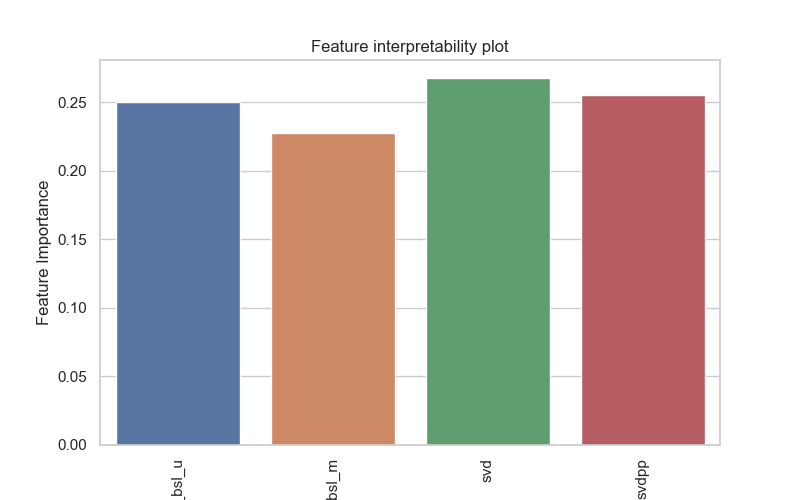

In [89]:
# plotting feature importance
coloumns = x_train.columns
feature_imp = xgb_all_models.best_estimator_.feature_importances_

sns.set(style="whitegrid")
plt.figure(figsize=(8,5))
sns.barplot(x = coloumns,y = feature_imp)
plt.xticks(rotation='vertical')
plt.xlabel("Feature Name")
plt.ylabel("Feature Importance")
plt.title("Feature interpretability plot")
plt.show()

In [91]:
coloumns

Index(['knn_bsl_u', 'knn_bsl_m', 'svd', 'svdpp'], dtype='object')

### 5.6 Comparision between all models

In [90]:
# Saving our TEST_RESULTS into a dataframe so that you don't have to run it again
pd.DataFrame(tuned_models_evaluation_test).to_csv('sample/small/tuned_small_sample_results.csv')
models = pd.read_csv('sample/small/tuned_small_sample_results.csv', index_col=0)
models.loc['rmse'].sort_values()

knn_bsl_m         1.0723215145319687
knn_bsl_u          1.072409004806261
svd               1.0724398179398351
svdpp              1.073107287201817
bsl_algo          1.0731636807255809
xgb_all_models    1.0750151986469803
xgb_final           1.11084389405224
first_algo        1.1192331482125684
xgb_knn_bsl       1.1192331482125684
xgb_knn_bsl_um    1.1192841266814324
xgb_bsl           1.1431475602494443
Name: rmse, dtype: object

### Summary

**Train 10k Results for various models...**

In [132]:
df_10k = pd.DataFrame(data=models_evaluation_train)
df_10k.drop("predictions",inplace = True)
df_10k

,first_algo,bsl_algo,xgb_bsl,knn_bsl_u,knn_bsl_m,xgb_knn_bsl,svd,svdpp,xgb_final,xgb_all_models
mape,25.2604,29.3896,25.26,9.14509,8.44706,25.2648,19.7049,17.4929,25.2614,35.2492
rmse,0.846286,0.934715,0.846275,0.336421,0.325848,0.846212,0.657472,0.603244,0.846237,1.07333


**Test Results for various models...**

In [133]:
df_10k_t = pd.DataFrame(data=models_evaluation_test)
df_10k_t.drop("predictions",inplace = True)
df_10k_t

,first_algo,bsl_algo,xgb_bsl,knn_bsl_u,knn_bsl_m,xgb_knn_bsl,svd,svdpp,xgb_final,xgb_all_models
mape,34.4822,35.05,34.4648,35.0209,35.0227,34.4475,35.0195,35.0382,34.4318,35.0706
rmse,1.07637,1.07303,1.07656,1.07265,1.07276,1.07678,1.0726,1.07285,1.07696,1.0753


**Train Results for various tuned models...**

In [134]:
df_25k = pd.DataFrame(data=tuned_models_evaluation_train)
df_25k.drop("predictions",inplace = True)
df_25k

,first_algo,xgb_knn_bsl,bsl_algo,xgb_bsl,knn_bsl_u,knn_bsl_m,xgb_knn_bsl_um,svd,svdpp,xgb_final,xgb_all_models
mape,24.0597,24.0597,30.3532,23.9,9.02798,8.40416,23.9157,20.0927,17.916,23.862,35.4196
rmse,0.811751,0.811751,0.955256,0.806822,0.327805,0.323167,0.806386,0.661692,0.611122,0.804864,1.07682


**Train Results for various tuned models...**

In [135]:
df_25k_t = pd.DataFrame(data=tuned_models_evaluation_test)
df_25k_t.drop("predictions",inplace = True)
df_25k_t

,first_algo,xgb_knn_bsl,bsl_algo,xgb_bsl,knn_bsl_u,knn_bsl_m,xgb_knn_bsl_um,svd,svdpp,xgb_final,xgb_all_models
mape,32.897,32.897,34.9891,32.3509,34.9366,34.9281,32.8882,34.9136,34.9061,33.0979,35.0655
rmse,1.11923,1.11923,1.07316,1.14315,1.07241,1.07232,1.11928,1.07244,1.07311,1.11084,1.07502


### Observation

- All the models have tuned on 25k user dataset
- **Slight** reduction in RMSE found for tuned models.
- Best train result are found in case of knn_bsl_m with minimum rmse of 0.323167	
- **Uavg and Mavg features** found most important for most of the models. 